last updated 24 03 24

This notebook is to get the run times for each model on the highest and lowest resolutions; to estimate an average run time.IG DICITONARY!



In [1]:
#!pip install ipython

In [2]:
# imports
import torch
import torch.nn as nn
from torchvision.models import vgg16
import torch.optim.lr_scheduler as lr_scheduler
import torch.optim as optim
from sklearn.model_selection import train_test_split
import numpy as np

from functions import import_imagedata, ImageProcessor, label_oh_tf
from fns4wandb import  set_lossfn
from architectures import sevennet, smallnet1, smallnet2, smallnet3
from loop_fns import loop
from plotting import learning_curve, accuracy_curve, plot_confusion

from datetime import date
from tqdm import tqdm
import pprint
import collections
from IPython.display import clear_output
import time

import csv
import json
import pickle
import os

import wandb

In [3]:
# file paths
_save_location = r'/its/home/nn268/antvis/antvis/optics/res_big_loop_saves/models/7c3l'

data_path = r'/its/home/nn268/antvis/antvis/optics/AugmentedDS_IDSW/'

gitHASH = '3e677ef26b8873c6fc52a3f30d981e272ed228bd'

In [4]:
wandb.login()

wandb: Currently logged in as: naughticalnonsence (antvis). Use `wandb login --relogin` to force relogin


True

In [5]:
#!pip install datetime

d = date.today()
#print(str(d), type(str(d)))

452 144               5/452 *100 = 1%
226 72                5/226 *100 = 2%
113 36                5/113 *100 = 4% -- 2/113 *100= 1.7% ~ 2%
57  18   (56.5,)      5/57 *100  = 8% -- 2/57 *100 = 3.5% ~ 4%.   1/57 = 1.75%
29   9   (28.5,)      5/29 *100  = 17% -- 2/29 *100 = 6.89 ~ 7%   1/28 = 3.57 ~ 4%
15   5   (14.5, 4.5)
8    3   (7.5,2.5)
4,   2   (, 1.5)

In [6]:
   

pp = pprint.PrettyPrinter(indent=4)

def save2csv_nest_dict(nested_dict, file_name, save_location:str):
  # flattern nested dictionary
  flatterend_dict = {}
  for k,v in nested_dict.items():
    if isinstance(v, dict):
      for nested_key, nested_val in v.items():
        flatterend_dict[f"{k}_{nested_key}"] = nested_val
    else:
      flatterend_dict[k] =v

  columns = list(flatterend_dict.keys())

  with open(save_location+str(file_name)+'.csv', "a+", newline="") as f:
      # using dictwriter
      writer = csv.DictWriter(f, fieldnames=columns)
      # using writeheader function
      if f.tell() == 0:
        writer.writeheader()
      writer.writerow(flatterend_dict)
      f.close()

# check dictionary values for json and csv

def check_obj4np(obj):
    if isinstance(obj, dict):
        return {key: check_obj4np(value) for key, value in obj.items()}
    if isinstance(obj,list):
        return [check_obj4np(item) for item in obj]
    if isinstance(obj,np.ndarray):
        return obj.tolist()
    if isinstance(obj, torch.Tensor):
        return obj.tolist()
    else:
        return obj

# save to json
def save2josn_nested_dict(nested_dict, file_name, save_location:str):
    nested_dict = check_obj4np(nested_dict)
    json_obj = json.dumps(nested_dict, indent=4)
    with open(save_location+str(file_name)+'.json', 'a+') as f:
        f.write(json_obj)
        f.close()

    
#save_location+str(file_name)+'.csv'
def save2csv(nested_dict, file_name, save_location:str):
    
    nested_dict = check_obj4np(nested_dict)
    
    columns = list(nested_dict.keys())
    path = os.path.join(save_location, file_name +".csv")
    try:
        with open(path, "a", newline="") as f:
            writer = csv.DictWriter(f, fieldnames=columns)
            # using dictwriter
            # using writeheader function
            if f.tell() == 0:
                writer.writeheader()
            writer.writerow(nested_dict)
            f.close()
    except IOError as e:
        print("I/O error({0}): {1}".format(e.errno, e.strerror))
    except ValueError:
              print("could not convert to string")
    except:
              print("unexpected error: ", sys.exc_info()[0])
        

def save2json(nested_dict, file_name, save_location:str):
    nested_dict = check_obj4np(nested_dict)
    #print(nested_dict)
    #print(nested_dict.items())
    json_obj = json.dumps(nested_dict, indent=4)
    #print(json_obj)
    path = os.path.join(save_location, file_name+".json")
    #print(path)
    with open(path, 'w') as f:
        f.write(json_obj)
        
        


def read_in_json(file_path, file_name):
    path = os.path.join(file_path, 'file_name')
    try:
        with open(path, 'r') as f:
            #obj = f.read()
            dj = json.load(f, object_pairs_hook= collections.OrderedDict) #obj, 
            #print(dj)
    except Exception as e:
        print("Error decoding Json")
        print(e)


class Flattern(nn.Module):
    def __init__(self):
        super(Flattern, self).__init__()
    def forward(self, x):
        #print(x.shape)
        x = x.flatten()
        return x


def choose_model(model_name, lin_lay, dropout):

    #for model_card in config.model_cards:
    #print('\n choose_model \n MODEL NAME: ',model_name)

    if model_name == '4c3l':
        return smallnet1(in_chan=3, f_lin_lay=int(lin_lay), l_lin_lay=11, ks= (3,5), dropout= dropout)
    elif model_name == '3c2l':
        return smallnet2(in_chan=3, f_lin_lay=int(lin_lay), l_lin_lay=11, ks = (3,5), dropout=dropout)
    elif model_name == '2c2l':
        return smallnet3(in_chan=3, f_lin_lay=int(lin_lay), l_lin_lay=11, ks= (3,5), dropout= dropout)
    elif model_name == '7c3l':
        return sevennet(in_chan=3, f_lin_lay=int(lin_lay), l_lin_lay=11, ks= (3,5), dropout= dropout)
    elif model_name == 'vgg16':
        model_vgg16 = vgg16(weights="IMAGENET1K_V1")
        vgg_feats = model_vgg16.features
        vgg_classifier = model_vgg16.classifier
        vgg_classifier.pop(6)

        vgg = nn.Sequential(
            vgg_feats,
            Flattern(),
            vgg_classifier,
            nn.Linear(4096,11),
            nn.Softmax(dim=0),
            )
        return vgg
    else:
        print('Model Name Not Recognised')


In [7]:
# dictionaries

date = date.today()

model_card_vgg = {'name': 'vgg', 'model': 'vgg16',
                  'f_lin_lay':[4096,
                             4096,
                             4096,
                             4096,
                             4096,
                             4096,
                             4096,
                            ],
                 'idx': 0,
                 'dropout':0.2}


model_card_7c3l = {'name': '7c3l', 'model': '7c3l', 'channels': 3, 'ks': (3,5),
                  'f_lin_lay':[248832,    # 452 144    # p5
                            59904,      # 226 72     # p5
                            11264,      # 113  36    # p2
                            1536,       # 57 18      # p1
                            172032,           # 29  9
                            172032,          # 15 5
                            172032,         # 8 3
                              ], 
                   'idx': 1,
                  'dropout':0.2}



model_card_4c3l = {'name': '4c3l', 'model': '4c3l', 'channels': 3, 'ks': (3,5),
                  'f_lin_lay':[539904,    # 452 144    # p5
                             141056,    # 226 72     # p5
                             304640,     # 113  36    # p2
                             9984,      # 57 18      # p1
                             2304,      # 29  9
                             512,       # 15 5
                             256],      # 8 3
                  'idx': 2,
                  'dropout':0.2}      

model_card_3c2l = {'name': '3c2l', 'model': '3c2l', 'channels': 3, 'ks': (3,5),
                  'f_lin_lay':[1069888,    # 452 144    # p5
                             274688,     #226 72      # p5
                             68096,      # 113  36    # p2
                             17280,      # 57 18      # p1
                             3840,       # 29  9
                             960,        # 15 5
                             256],
                  'idx': 3,
                  'dropout':0.2}       # 8 3

model_card_2c2l = {'name': '2c2l', 'model': '2c2l', 'channels': 3, 'ks': (3,5),
                  'f_lin_lay':[1055232,    # 452 144    # p5
                             267264,     #226 72      # p5
                             64512,      # 113  36    # p2
                             15552,      # 57 18      # p1
                             3072,       # 29  9
                             640,        # 15 5
                             128],
                  'idx': 4,
                  'dropout':0.1}       # 8 3

resolution_card_452144 = {'resolution':[452,144], 'padding':5, 'index':0}
resolution_card_22672 = {'resolution':[226,72], 'padding':5, 'index':1}
resolution_card_11336 = {'resolution':[113,36], 'padding':2, 'index':2}
resolution_card_5715 = {'resolution':[57,18], 'padding':1, 'index':3}

resolution_card_299 = {'resolution':[29,9], 'padding':0, 'index':4} # 
resolution_card_155 = {'resolution':[15,5], 'padding':0, 'index':5}
resolution_card_83 = {'resolution':[8,3], 'padding':0, 'index':6}



resolution_cards = [resolution_card_452144, resolution_card_22672, resolution_card_11336, resolution_card_5715,
                    resolution_card_299, resolution_card_155, resolution_card_83]
#resolution_cards = [resolution_card_11336]

#learning_rate_cards = [5e-5, 6e-5, 8e-5]
#learning_rate_cards =  [8.21592E-05, 6.62E-05, 6.01E-05, 5.97E-05]
learning_rate_cards=  [0.0001, 6e-5, 7e-5, 8e-5]
#wd_cards = [4e-5, 5e-5, 3.00E-05, 2.00E-05]
wd_cards =[0]
scheduler_cards = [0, 0.1, 0.2]

seeds = [8,2,3] # 4, 5,6

#model_cards =[model_card_vgg, model_card_7c3l, model_card_4c3l, model_card_3c2l, model_card_2c2l]
model_cards =[model_card_4c3l]

loss_fn_cards = ['CrossEntropy'] #'MSE', 
                        
config = dict({'parameters': 'parameters for big loop run'})
config.update({'model_cards':model_cards})
config.update({'resolution_cards':resolution_cards})
config.update({'learning_rate_cards':learning_rate_cards})
config.update({'wd_cards':wd_cards})
config.update({'scheduler_cards':scheduler_cards})
config.update({'seeds':seeds})
config.update({'loss_fn_cards': loss_fn_cards})


#print(model_card_vgg)
#print('')
#pp.pprint(config) # dictionary of dictionaries of lists and lists of dictionaries

In [8]:

def train_val(model, x_train, x_val, y_train, y_val, res, pad, save_dict, lr, loss_fn, epochs,optimizer, scheduler_value,model_name, av_lum): #train_dl, val_dl, 


    
    #optimizer = torch.optim.Adam(model.parameters(), lr=lr)#build_optimizer(mo
    #scheduler = lr_scheduler.ExponentialLR(optimizer, gamma=scheduler_value) 
    #scheduler'
    ####
    
    #model = model.to(device)
    model.train()
    
    
    #losses= []
    #predictions = []
    t_loss_list = []
    v_loss_list = []
    t_predict_list = []
    v_predict_list = []
    t_accuracy_list = []
    v_accuracy_list = []
    t_label_list = []
    v_label_list = []
    #labels = []

    
    total_epochs = 0
    for epoch in tqdm(range(epochs)):

        print('Training...')
    
        t_loss, train_prediction, t_correct, model, optimizer = loop(model=model, X=x_train, Y=y_train, loss_fn=loss_fn, device=device, 
                                                                     size= res,  pad=pad, num_classes=11, model_name= model_name, av_lum=av_lum,
                                                                     optimizer=optimizer) #,   scheduler =scheduler
        
        t_loss_list.append(t_loss)
        t_predict_list.append(train_prediction)
        wandb.log({'t_loss':t_loss})
        #wandb.log({'t_predict_list':train_prediction})
        #wandb.log({'train_labels':list(y_train)})
        train_acc = (t_correct/len(x_train)*100)
        print('train accuracy: ', train_acc )
        t_accuracy_list.append(train_acc)
        wandb.log({'train_acc':train_acc})
        #y_train_save = y_train.tolist()

        
        #clear_output()
        
            
        print('validating...')
        
        v_loss, val_prediction, val_correct= loop(model=model, X=x_val, Y=y_val, loss_fn=loss_fn, device=device,
                                                  size= res,  pad=pad, num_classes=11, model_name= model_name, 
                                                  av_lum=av_lum, train=False)
        #
        #scheduler.step()
        v_loss_list.append(v_loss)
        v_predict_list.append(val_prediction)
        wandb.log({'v_loss':v_loss})
        #wandb.log({'v_predict_list':val_prediction})
        #wandb.log({'y_val':list(y_val)})
        val_acc = (val_correct/len(x_val)*100)
        v_accuracy_list.append(val_acc)
        print('validation accuracy: ', val_acc )
        wandb.log({'val_acc':val_acc})

        #clear_output()
            
        total_epochs += 1
        
    save_dict['Current_Epoch'] = epochs
    save_dict['training_samples'] = len(x_train)
    save_dict['validation_samples'] = len(x_val)

    save_dict['t_accuracy_list'] = t_accuracy_list 
    save_dict['v_accuracy_list'] = v_accuracy_list  #
            
    #model = best_model
    save_dict['t_loss_list'] = t_loss_list
    save_dict['v_loss_list'] = v_loss_list
    
    save_dict['t_labels'] = y_train
    save_dict['v_labels'] = y_val
    
    save_dict['t_predict_list'] = t_predict_list 
    save_dict['v_predict_list'] = v_predict_list  #
    
    #wandb.log({'y_train':y_train})
    #wandb.log({'t_predict_list':t_predict_list})

    #wandb.log({'t_accuracy_list':t_accuracy_list})

    #y_val_save = y_val.tolist()
    
    
    #

    
    #wandb.log({'v_accuracy_list':v_accuracy_list})

    return model, save_dict

def test_loop(model, model_name, X, Y, res, pad, save_dict, loss_fn, device, av_lum, num_classes=11):
    model = model.eval()
    predict_list = []
    current_loss = 0
    total_count =0
    num_correct = 0
    correct = 0
    colour ='colour'
    size =  res

    with torch.no_grad():
        print('Testing...') 
        for idx, img in enumerate(X):

            #image pre processing
            prepro = ImageProcessor(device)
            if model_name == 'vgg16':
                tense = prepro.colour_size_tense(img, colour, size, av_lum, pad, vg=True) #[29, 9], 15, 5, [8,3]
            elif (model_name == '7c3l' and size == [29, 9]) or (model_name == '7c3l' and size == [15, 5]) or (model_name == '7c3l' and size ==[8, 3]):
                tense = prepro.colour_size_tense(img, colour, size, av_lum, pad, vg=True)
            else:
                tense = prepro.colour_size_tense(img, colour, size,av_lum,  pad)

            # send through model
            prediction = model.forward(tense)
            label = label_oh_tf(Y[idx], num_classes).to(device)
            loss = loss_fn(prediction, label)

            if prediction.argmax()==label.argmax():
                num_correct +=1
            total_count +=1
            correct +=(prediction.argmax()==label.argmax()).sum().item()

            predict_list.append(prediction.argmax())

        acc = num_correct/total_count
        accuracy = 100*(acc)
        
        
        
        current_loss += loss.item()
        
    return accuracy, predict_list, Y, current_loss


def get_data(random_seed):
    file_path =  data_path
    #print(file_path)
    img_len = len(os.listdir(file_path))
    
    x, y = import_imagedata(file_path)
    x_train, x_test, y_train, y_test = train_test_split(x,y, test_size=0.3, train_size=0.7,
                                     random_state=random_seed, shuffle=True)
    x_train, x_val, y_train, y_val = train_test_split(x_train,y_train, test_size=0.3, train_size=0.7,
                                     random_state=random_seed, shuffle=True)

    return x_train, y_train, x_val, y_val, x_test, y_test


    
def get_lin_lay(model_card, resolution):
    if resolution == [452, 144]:
        lin_lay = model_card['f_lin_lay'][0]
    elif resolution == [226, 72]:
        lin_lay = model_card['f_lin_lay'][1]
    elif resolution == [113, 36]:
        lin_lay = model_card['f_lin_lay'][2]
    elif resolution == [57, 18]:
        lin_lay = model_card['f_lin_lay'][3]
    elif resolution == [29, 9]:
        lin_lay = model_card['f_lin_lay'][4]
    elif resolution == [15, 5]:
        lin_lay = model_card['f_lin_lay'][5]
    elif resolution == [8, 3]:
        lin_lay = model_card['f_lin_lay'][6]
    else:
        print("PARAMETER NOT FOUND: \n f_lin_lay FROM MODEL CARD")
    return lin_lay


In [9]:
device = "cuda:1" if torch.cuda.is_available() else "cpu"


def _go(config=None):
    
    if len(gitHASH) <1:
        print("YOU FORGET THE GIT HASH")
        return
    else:
        print('Git Hash registered')
        
    with wandb.init(config=config, project=f"test 2 Run Big Loop", notes="First logging test of big loop. limitied data",):
        config = wandb.config
        start = time.process_time()
    
        for model_idx, model_card in enumerate(config['model_cards']):
            
            model_name = model_card['model']
            model_index = model_card['idx']
            dropout = model_card['dropout'] 
            
            
            for res_idx, resolution_card in enumerate(config['resolution_cards']):
    
                resolution = resolution_card['resolution']
                pad = resolution_card['padding']
               
                lin_lay = get_lin_lay(model_card, resolution)
    
                
                for lr_idx, lr in enumerate(config['learning_rate_cards']):
                    for wd_idx, wd_card in enumerate(wd_cards):
                        for sched_idx, scheduler_value in enumerate(config['scheduler_cards']):
                            for seed_idx, seed in enumerate(config['seeds']):
                                seed = seed
                                for lossfn_idx, lossfn in enumerate(config['loss_fn_cards']):
                                    
                                    
                                    #print('Model: ', str(model_name), f" idx: {model_idx} / {len(config.model_cards)}")
                                    #print(config.model_cards, len(config.model_cards), type(config.model_cards))
                                    print('Model: ', str(model_name), f" idx: {model_idx} / {len(config.model_cards)}")
                                    print('resolution: ', str(resolution), f"  idx: {res_idx} / {len(config['resolution_cards'])}")
                                    print('learning rate: ', str(lr), f"  idx: {lr_idx} / {len(config['learning_rate_cards'])}")
                                    print('weight decay: ', str(wd_card), f"  idx: {wd_idx} / {len(config['wd_cards'])}")
                                    print('scheduler: ', str(scheduler_value), f"  idx: {sched_idx} / {len(config['scheduler_cards'])}")
                                    print('seed: ', str(seed), f"  idx:  {seed_idx} / {len(config['seeds'])}")
                                    print('loss function: ', str(lossfn), f" idx: {lossfn_idx} / {len(config['loss_fn_cards'])}")
                                    run_start_time = time.process_time()
                                    print(run_start_time)
   
                                    print(time.process_time() - start)
                                    
        
                                    epochs = 20 #40

                                    IP = ImageProcessor(device)

                                    print(f"Total epochs: {epochs}")
                                     
                                    wandb.log({'gitHash':gitHASH})
                                    wandb.log({'Epochs': epochs})
                                    # set save dictionary
                                    save_dict = {'Run' : f"{model_name}_{date}",
                                                 'Current_Epoch': 0,
                                                 'save_location' : _save_location}
                                    
                                    # set model
                                    model = choose_model(model_name, lin_lay, dropout).to(device)
                                    #print(model, '\n', type(config))
                                    # get image data
                                    x_train, y_train, x_val, y_val, x_test, y_test = get_data(seed)
                                    av_lum = IP.new_luminance(x_train)
                                    
                                    # set loss function
                                    loss_fn = set_lossfn(lossfn)
                                    
                                    # set optimizer
                                    optimizer = torch.optim.Adam(model.parameters(),lr=lr)
                   
                                    #scheduler = lr_scheduler.ExponentialLR(optimizer, gamma=scheduler_value, last_epoch=-1) 

                                    
                                    wandb.watch(model, loss_fn, log='all', log_freq=2, idx = model_index)
                                    model, save_dict=  train_val(model, x_train, x_val, y_train, y_val, resolution, pad, save_dict, lr, loss_fn,epochs, optimizer, scheduler_value,
                                                                   model_name, av_lum)

                                    #test                                               Y,          
                                    test_acc,test_predict_list, y_test, test_loss = test_loop(model, model_name, x_test, y_test,resolution, pad, save_dict,loss_fn,
                                                                                              device, av_lum, num_classes=11) #model, model_name, X, Y, res, pad, loss_fn, device, num_classes=11
                                    
                                    #print(test_predict_list)
                                    print(' \n train acc: ', save_dict['t_accuracy_list'][-1])
                                    print(' \n val acc: ', save_dict['v_accuracy_list'][-1])
                                    print(' \n test acc: ', test_acc)
                                    
                                    save_dict.update({'test_acc': test_acc})
                                    save_dict.update({'test_predict': test_predict_list})
                                    save_dict.update({'test_labels': list(y_test)})
                                    save_dict.update({'test_loss':test_loss})


                                    learning_curve(save_dict['t_loss_list'], save_dict['v_loss_list'], save_location=save_dict['save_location'],run_name=f"{save_dict['Run']}+{resolution}_{lr}_{scheduler_value}_{seed}_{lossfn}")
                                    accuracy_curve(save_dict['t_accuracy_list'], save_dict['v_accuracy_list'],save_location=save_dict['save_location'],run_name=f"{save_dict['Run']}+{resolution}_{lr}_{scheduler_value}_{seed}_{lossfn}")
                                    test_predict_list=[pred.cpu() for pred in test_predict_list]
                                    plot_confusion(predictions= test_predict_list, actual= y_test, title = "Test Confusion matrix", run_name = f"{save_dict['Run']}+{resolution}_{lr}_{scheduler_value}_{seed}_{lossfn}",save_location =save_dict['save_location'])
                                    
                                    wandb.log({'test_acc': test_acc})
                                    wandb.log({'test_predict': test_predict_list})
                                    wandb.log({'test_labels': list(y_test)})
                                    #saving
                                    diction = {}
                                    d = date.today()
                                    d=str(d)
                                    diction.update({'Date':d})
                                    diction.update({'gitHASH':str(gitHASH)})
                                    diction.update({'model_name': str(model_name)})
                                    diction.update({'loss_fn': str(lossfn)})
                                    diction.update({'lr': str(lr)})
                                    diction.update({'wd': str(wd_card)})
                                    diction.update({'scheduler value': str(scheduler_value)})
                                    diction.update({'seed': str(seed)})
                                    diction.update({'resolution': str(resolution)})
                                    diction.update({'pad': int(pad)})
                                    diction.update({'lin_lay': int(lin_lay)})
                                    diction.update({'run time': (time.process_time() - run_start_time)})
                                    diction.update(save_dict)
                                    
                                    save_location = save_dict['save_location']
                                    title = save_dict['Run']
                                    save2json(diction, title, save_location)
                                    save2csv(diction, title, save_location)
        
                                    diction['model.state_dict'] = model.state_dict() #to('cpu').
        
                                    with open(f"{save_location}{title}.pkl", 'wb+') as f:
                                        pickle.dump(diction, f)
                                    
                                    #clear_output()
                                    
                                    print(f' \n END {model_name} {resolution} Run Time: ',time.process_time() - run_start_time)

        print('Final Run time:  ',time.process_time() - start)

Git Hash registered


Model:  4c3l  idx: 0 / 1
resolution:  [452, 144]   idx: 0 / 7
learning rate:  0.0001   idx: 0 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0   idx: 0 / 3
seed:  8   idx:  0 / 3
loss function:  CrossEntropy  idx: 0 / 1
12.411800875
0.0013022700000000498
Total epochs: 20


  0%|                                                                                                                        | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  8.447352766210589
validating...


  5%|█████▌                                                                                                          | 1/20 [00:39<12:24, 39.17s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  9.518143961927423
validating...


 10%|███████████▏                                                                                                    | 2/20 [01:39<15:28, 51.56s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  9.280190362879239
validating...


 15%|████████████████▊                                                                                               | 3/20 [02:39<15:42, 55.41s/it]

validation accuracy:  10.124826629680998
Training...
train accuracy:  13.622843545508626
validating...


 20%|██████████████████████▍                                                                                         | 4/20 [03:39<15:16, 57.29s/it]

validation accuracy:  18.58529819694868
Training...
train accuracy:  23.022010707911956
validating...


 25%|████████████████████████████                                                                                    | 5/20 [04:39<14:34, 58.30s/it]

validation accuracy:  23.43966712898752
Training...
train accuracy:  28.970850684116595
validating...


 30%|█████████████████████████████████▌                                                                              | 6/20 [05:40<13:46, 59.03s/it]

validation accuracy:  26.629680998613036
Training...
train accuracy:  33.670434265318264
validating...


 35%|███████████████████████████████████████▏                                                                        | 7/20 [06:40<12:52, 59.40s/it]

validation accuracy:  27.739251040221912
Training...
train accuracy:  37.477691850089236
validating...


 40%|████████████████████████████████████████████▊                                                                   | 8/20 [07:40<11:55, 59.63s/it]

validation accuracy:  28.43273231622746
Training...
train accuracy:  42.35574063057704
validating...


 45%|██████████████████████████████████████████████████▍                                                             | 9/20 [08:40<10:57, 59.79s/it]

validation accuracy:  33.287101248266296
Training...
train accuracy:  42.47471743010113
validating...


 50%|███████████████████████████████████████████████████████▌                                                       | 10/20 [09:40<09:59, 59.95s/it]

validation accuracy:  32.31622746185853
Training...
train accuracy:  44.91374182034503
validating...


 55%|█████████████████████████████████████████████████████████████                                                  | 11/20 [10:41<09:01, 60.16s/it]

validation accuracy:  34.11927877947296
Training...
train accuracy:  49.97025580011898
validating...


 60%|██████████████████████████████████████████████████████████████████▌                                            | 12/20 [11:42<08:03, 60.49s/it]

validation accuracy:  32.87101248266297
Training...
train accuracy:  53.36109458655562
validating...


 65%|████████████████████████████████████████████████████████████████████████▏                                      | 13/20 [12:44<07:05, 60.82s/it]

validation accuracy:  34.11927877947296
Training...
train accuracy:  56.39500297441998
validating...


 70%|█████████████████████████████████████████████████████████████████████████████▋                                 | 14/20 [13:46<06:06, 61.11s/it]

validation accuracy:  35.64493758668516
Training...
train accuracy:  60.916121356335516
validating...


 75%|███████████████████████████████████████████████████████████████████████████████████▎                           | 15/20 [14:48<05:07, 61.41s/it]

validation accuracy:  34.95145631067961
Training...
train accuracy:  64.18798334324806
validating...


 80%|████████████████████████████████████████████████████████████████████████████████████████▊                      | 16/20 [15:50<04:06, 61.64s/it]

validation accuracy:  33.70319001386963
Training...
train accuracy:  66.68649613325401
validating...


 85%|██████████████████████████████████████████████████████████████████████████████████████████████▎                | 17/20 [16:52<03:05, 61.73s/it]

validation accuracy:  35.09015256588072
Training...
train accuracy:  69.24449732302202
validating...


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████▉           | 18/20 [17:54<02:03, 61.92s/it]

validation accuracy:  35.78363384188627
Training...
train accuracy:  70.67221891731113
validating...


 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 19/20 [18:56<01:02, 62.04s/it]

validation accuracy:  37.17059639389736
Training...
train accuracy:  72.39738251041047
validating...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [19:59<00:00, 59.96s/it]

validation accuracy:  32.31622746185853
Testing...


 
 train acc:  72.39738251041047
 
 val acc:  32.31622746185853
 
 test acc:  35.43689320388349


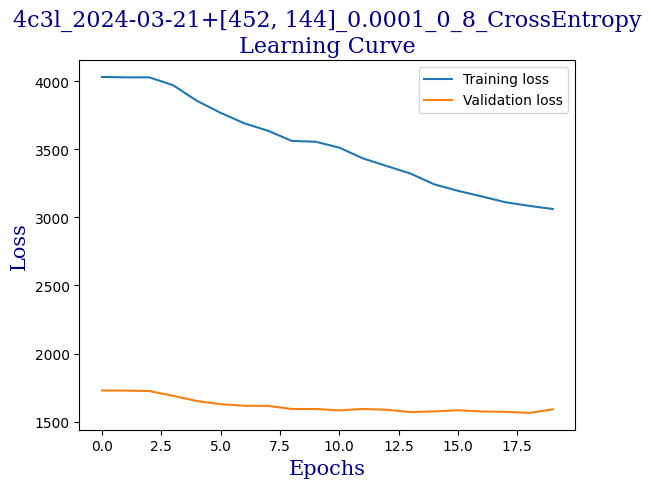

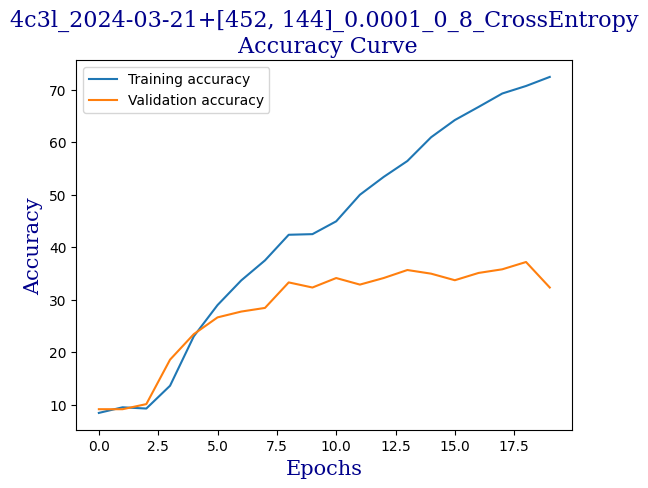

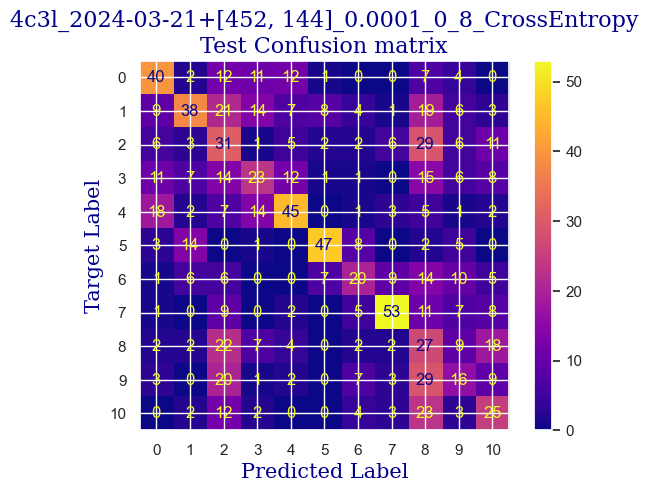

 
 END 4c3l [452, 144] Run Time:  7637.863798644
Model:  4c3l  idx: 0 / 1
resolution:  [452, 144]   idx: 0 / 7
learning rate:  0.0001   idx: 0 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0   idx: 0 / 3
seed:  2   idx:  1 / 3
loss function:  CrossEntropy  idx: 0 / 1
7650.276818482
7637.866313132
Total epochs: 20


  0%|                                                                                                                        | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  9.339678762641284
validating...


  5%|█████▌                                                                                                          | 1/20 [00:53<17:02, 53.80s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.469958358120167
validating...


 10%|███████████▏                                                                                                    | 2/20 [01:17<10:53, 36.28s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.172516359309935
validating...


 15%|████████████████▊                                                                                               | 3/20 [01:41<08:41, 30.66s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  9.994051160023796
validating...


 20%|██████████████████████▍                                                                                         | 4/20 [02:05<07:28, 28.05s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.648423557406305
validating...


 25%|████████████████████████████                                                                                    | 5/20 [02:29<06:38, 26.59s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.350981558596075
validating...


 30%|█████████████████████████████████▌                                                                              | 6/20 [02:53<05:59, 25.71s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  11.302795954788817
validating...


 35%|███████████████████████████████████████▏                                                                        | 7/20 [03:17<05:27, 25.18s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  18.084473527662105
validating...


 40%|████████████████████████████████████████████▊                                                                   | 8/20 [03:41<04:57, 24.77s/it]

validation accuracy:  19.00138696255201
Training...
train accuracy:  24.98512790005949
validating...


 45%|██████████████████████████████████████████████████▍                                                             | 9/20 [04:05<04:29, 24.47s/it]

validation accuracy:  25.65880721220527
Training...
train accuracy:  30.101130279595477
validating...


 50%|███████████████████████████████████████████████████████▌                                                       | 10/20 [04:29<04:02, 24.29s/it]

validation accuracy:  28.71012482662968
Training...
train accuracy:  35.87150505651398
validating...


 55%|█████████████████████████████████████████████████████████████                                                  | 11/20 [04:53<03:37, 24.19s/it]

validation accuracy:  33.287101248266296
Training...
train accuracy:  40.214158239143366
validating...


 60%|██████████████████████████████████████████████████████████████████▌                                            | 12/20 [05:17<03:12, 24.10s/it]

validation accuracy:  30.513176144244103
Training...
train accuracy:  40.333135038667464
validating...


 65%|████████████████████████████████████████████████████████████████████████▏                                      | 13/20 [05:41<02:48, 24.03s/it]

validation accuracy:  33.00970873786408
Training...
train accuracy:  44.43783462224866
validating...


 70%|█████████████████████████████████████████████████████████████████████████████▋                                 | 14/20 [06:05<02:24, 24.01s/it]

validation accuracy:  34.535367545076284
Training...
train accuracy:  45.15169541939322
validating...


 75%|███████████████████████████████████████████████████████████████████████████████████▎                           | 15/20 [06:29<01:59, 23.95s/it]

validation accuracy:  35.50624133148405
Training...
train accuracy:  45.80606781677573
validating...


 80%|████████████████████████████████████████████████████████████████████████████████████████▊                      | 16/20 [06:52<01:35, 23.94s/it]

validation accuracy:  34.674063800277395
Training...
train accuracy:  46.04402141582391
validating...


 85%|██████████████████████████████████████████████████████████████████████████████████████████████▎                | 17/20 [07:16<01:11, 23.94s/it]

validation accuracy:  32.593619972260754
Training...
train accuracy:  47.531231409875076
validating...


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████▉           | 18/20 [07:40<00:47, 23.92s/it]

validation accuracy:  35.22884882108183
Training...
train accuracy:  48.958953004164194
validating...


 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 19/20 [08:04<00:23, 23.94s/it]

validation accuracy:  35.09015256588072
Training...
train accuracy:  50.148720999405114
validating...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [08:28<00:00, 25.43s/it]

validation accuracy:  35.09015256588072
Testing...


 
 train acc:  50.148720999405114
 
 val acc:  35.09015256588072
 
 test acc:  36.99029126213592


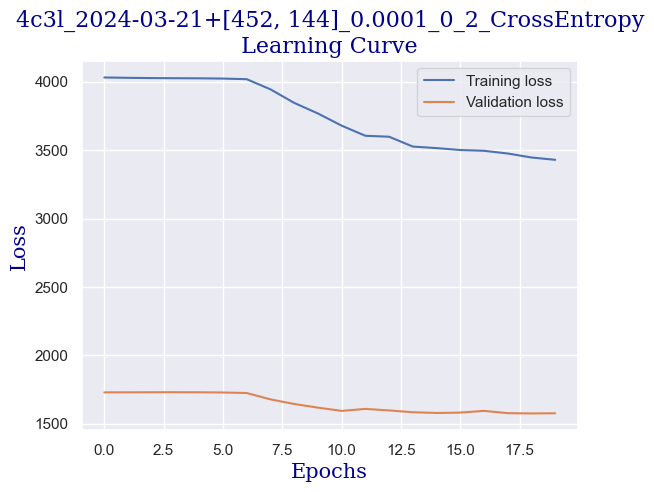

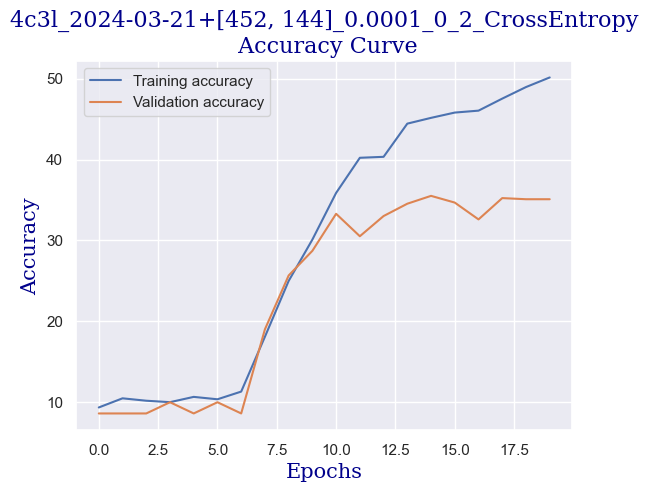

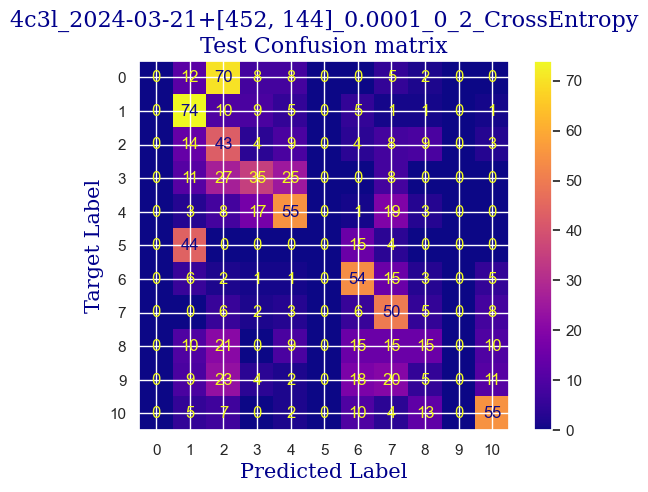

 
 END 4c3l [452, 144] Run Time:  5351.692636382
Model:  4c3l  idx: 0 / 1
resolution:  [452, 144]   idx: 0 / 7
learning rate:  0.0001   idx: 0 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0   idx: 0 / 3
seed:  3   idx:  2 / 3
loss function:  CrossEntropy  idx: 0 / 1
13001.970710996
12989.560197421
Total epochs: 20


  0%|                                                                                                                        | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  9.696609161213564
validating...


  5%|█████▌                                                                                                          | 1/20 [00:23<07:33, 23.88s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  10.469958358120167
validating...


 10%|███████████▏                                                                                                    | 2/20 [00:47<07:10, 23.92s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  10.41046995835812
validating...


 15%|████████████████▊                                                                                               | 3/20 [01:11<06:46, 23.89s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  14.158239143367043
validating...


 20%|██████████████████████▍                                                                                         | 4/20 [01:35<06:22, 23.91s/it]

validation accuracy:  19.972260748959776
Training...
train accuracy:  19.452706722189173
validating...


 25%|████████████████████████████                                                                                    | 5/20 [01:59<05:59, 23.94s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  10.58893515764426
validating...


 30%|█████████████████████████████████▌                                                                              | 6/20 [02:23<05:35, 23.99s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  25.46103509815586
validating...


 35%|███████████████████████████████████████▏                                                                        | 7/20 [02:47<05:11, 23.96s/it]

validation accuracy:  24.687933425797503
Training...
train accuracy:  34.08685306365259
validating...


 40%|████████████████████████████████████████████▊                                                                   | 8/20 [03:11<04:47, 23.97s/it]

validation accuracy:  28.155339805825243
Training...
train accuracy:  38.60797144556811
validating...


 45%|██████████████████████████████████████████████████▍                                                             | 9/20 [03:35<04:23, 23.94s/it]

validation accuracy:  28.57142857142857
Training...
train accuracy:  40.03569303985723
validating...


 50%|███████████████████████████████████████████████████████▌                                                       | 10/20 [03:59<03:59, 23.93s/it]

validation accuracy:  29.126213592233007
Training...
train accuracy:  42.9506246281975
validating...


 55%|█████████████████████████████████████████████████████████████                                                  | 11/20 [04:23<03:35, 23.92s/it]

validation accuracy:  31.345353675450767
Training...
train accuracy:  43.36704342653183
validating...


 60%|██████████████████████████████████████████████████████████████████▌                                            | 12/20 [04:47<03:11, 23.90s/it]

validation accuracy:  32.45492371705964
Training...
train accuracy:  46.63890541344438
validating...


 65%|████████████████████████████████████████████████████████████████████████▏                                      | 13/20 [05:11<02:47, 23.90s/it]

validation accuracy:  31.345353675450767
Training...
train accuracy:  50.86258179654968
validating...


 70%|█████████████████████████████████████████████████████████████████████████████▋                                 | 14/20 [05:34<02:23, 23.91s/it]

validation accuracy:  30.097087378640776
Training...
train accuracy:  53.42058298631767
validating...


 75%|███████████████████████████████████████████████████████████████████████████████████▎                           | 15/20 [05:58<01:59, 23.92s/it]

validation accuracy:  33.841886269070734
Training...
train accuracy:  55.74063057703748
validating...


 80%|████████████████████████████████████████████████████████████████████████████████████████▊                      | 16/20 [06:22<01:35, 23.93s/it]

validation accuracy:  33.980582524271846
Training...
train accuracy:  56.2760261748959
validating...


 85%|██████████████████████████████████████████████████████████████████████████████████████████████▎                | 17/20 [06:46<01:11, 23.94s/it]

validation accuracy:  32.87101248266297
Training...
train accuracy:  59.30993456276026
validating...


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████▉           | 18/20 [07:10<00:47, 23.95s/it]

validation accuracy:  35.64493758668516
Training...
train accuracy:  63.29565734681737
validating...


 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 19/20 [07:34<00:23, 23.94s/it]

validation accuracy:  37.17059639389736
Training...
train accuracy:  64.54491374182034
validating...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [07:58<00:00, 23.93s/it]

validation accuracy:  35.22884882108183
Testing...


 
 train acc:  64.54491374182034
 
 val acc:  35.22884882108183
 
 test acc:  34.75728155339806


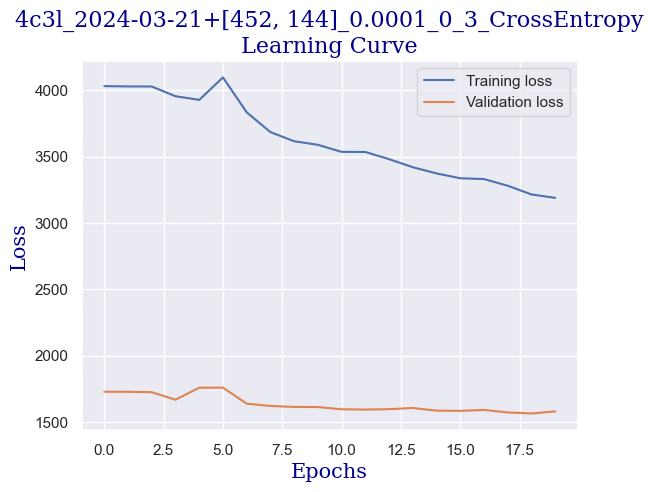

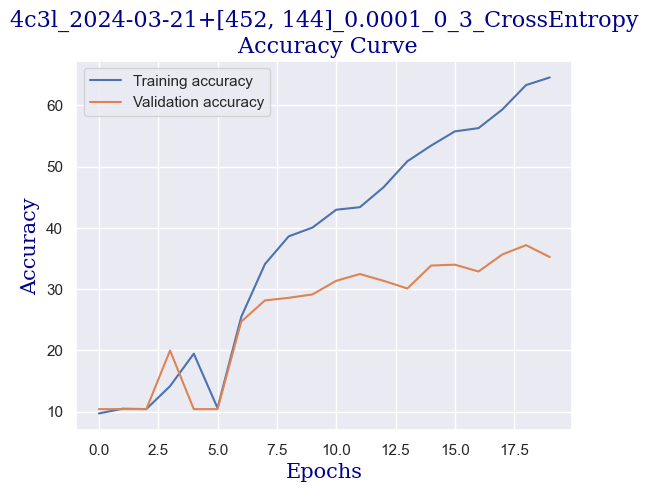

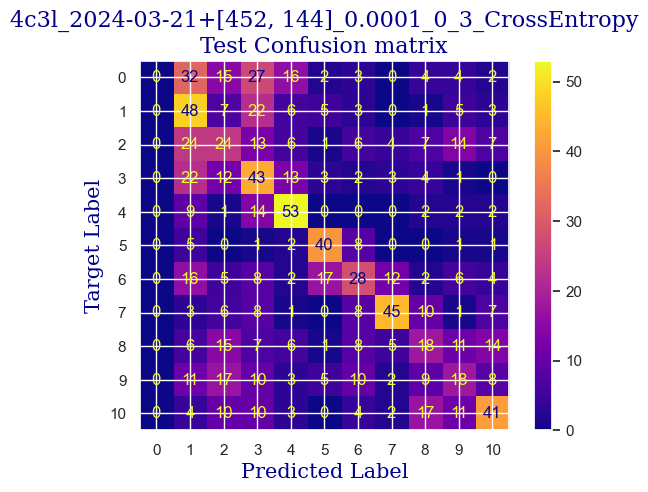

 
 END 4c3l [452, 144] Run Time:  5252.287627624999
Model:  4c3l  idx: 0 / 1
resolution:  [452, 144]   idx: 0 / 7
learning rate:  0.0001   idx: 0 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.1   idx: 1 / 3
seed:  8   idx:  0 / 3
loss function:  CrossEntropy  idx: 0 / 1
18254.259645077
18241.849130319
Total epochs: 20


  0%|                                                                                                                        | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  9.696609161213564
validating...


  5%|█████▌                                                                                                          | 1/20 [00:23<07:34, 23.90s/it]

validation accuracy:  8.876560332871012
Training...
train accuracy:  9.75609756097561
validating...


 10%|███████████▏                                                                                                    | 2/20 [00:47<07:10, 23.92s/it]

validation accuracy:  10.540915395284326
Training...
train accuracy:  8.685306365258775
validating...


 15%|████████████████▊                                                                                               | 3/20 [01:11<06:46, 23.92s/it]

validation accuracy:  10.540915395284326
Training...
train accuracy:  13.087447947650208
validating...


 20%|██████████████████████▍                                                                                         | 4/20 [01:35<06:23, 23.97s/it]

validation accuracy:  25.24271844660194
Training...
train accuracy:  26.4128494943486
validating...


 25%|████████████████████████████                                                                                    | 5/20 [01:59<05:59, 23.95s/it]

validation accuracy:  29.403606102635226
Training...
train accuracy:  33.72992266508031
validating...


 30%|█████████████████████████████████▌                                                                              | 6/20 [02:23<05:35, 23.96s/it]

validation accuracy:  32.038834951456316
Training...
train accuracy:  36.04997025580012
validating...


 35%|███████████████████████████████████████▏                                                                        | 7/20 [02:47<05:11, 23.93s/it]

validation accuracy:  30.651872399445214
Training...
train accuracy:  39.6192742415229
validating...


 40%|████████████████████████████████████████████▊                                                                   | 8/20 [03:11<04:47, 23.96s/it]

validation accuracy:  33.14840499306519
Training...
train accuracy:  41.2849494348602
validating...


 45%|██████████████████████████████████████████████████▍                                                             | 9/20 [03:35<04:23, 23.94s/it]

validation accuracy:  40.36061026352289
Training...
train accuracy:  47.65020820939917
validating...


 50%|███████████████████████████████████████████████████████▌                                                       | 10/20 [03:59<03:59, 23.95s/it]

validation accuracy:  28.9875173370319
Training...
train accuracy:  49.494348602022605
validating...


 55%|█████████████████████████████████████████████████████████████                                                  | 11/20 [04:23<03:35, 23.95s/it]

validation accuracy:  32.87101248266297
Training...
train accuracy:  52.409280190362885
validating...


 60%|██████████████████████████████████████████████████████████████████▌                                            | 12/20 [04:47<03:11, 23.96s/it]

validation accuracy:  40.77669902912621
Training...
train accuracy:  51.81439619274242
validating...


 65%|████████████████████████████████████████████████████████████████████████▏                                      | 13/20 [05:11<02:47, 23.95s/it]

validation accuracy:  37.586685159500696
Training...
train accuracy:  53.063652587745395
validating...


 70%|█████████████████████████████████████████████████████████████████████████████▋                                 | 14/20 [05:35<02:23, 23.96s/it]

validation accuracy:  41.19278779472954
Training...
train accuracy:  56.2760261748959
validating...


 75%|███████████████████████████████████████████████████████████████████████████████████▎                           | 15/20 [05:59<01:59, 23.96s/it]

validation accuracy:  42.163661581137305
Training...
train accuracy:  59.30993456276026
validating...


 80%|████████████████████████████████████████████████████████████████████████████████████████▊                      | 16/20 [06:23<01:35, 23.96s/it]

validation accuracy:  44.382801664355064
Training...
train accuracy:  59.66686496133254
validating...


 85%|██████████████████████████████████████████████████████████████████████████████████████████████▎                | 17/20 [06:47<01:11, 23.96s/it]

validation accuracy:  41.60887656033287
Training...
train accuracy:  62.34384295062463
validating...


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████▉           | 18/20 [07:11<00:47, 23.97s/it]

validation accuracy:  42.71844660194174
Training...
train accuracy:  64.24747174301011
validating...


 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 19/20 [07:35<00:23, 23.99s/it]

validation accuracy:  43.41192787794729
Training...
train accuracy:  65.61570493753717
validating...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [07:59<00:00, 23.96s/it]

validation accuracy:  45.63106796116505
Testing...


 
 train acc:  65.61570493753717
 
 val acc:  45.63106796116505
 
 test acc:  42.62135922330097


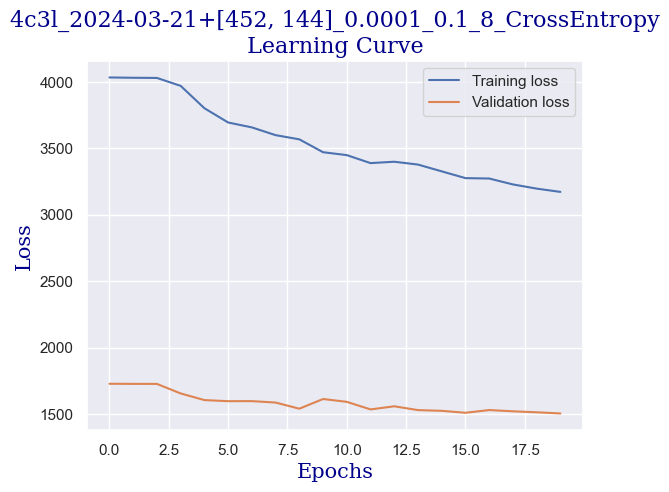

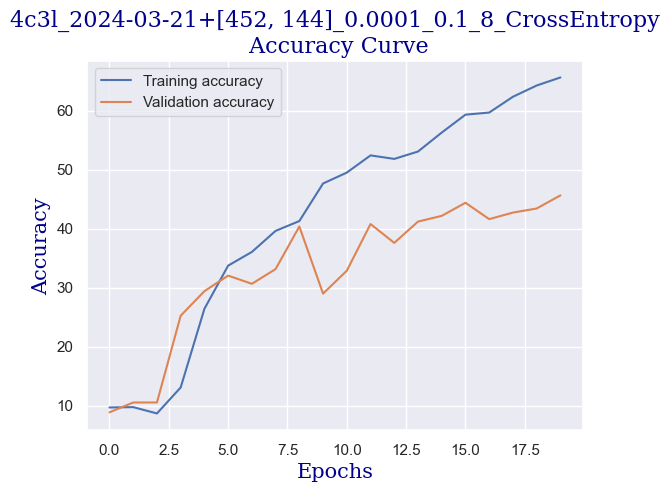

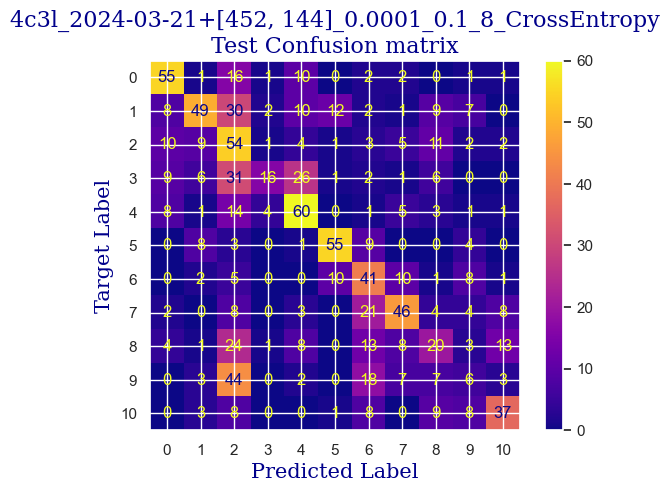

 
 END 4c3l [452, 144] Run Time:  5254.436305948999
Model:  4c3l  idx: 0 / 1
resolution:  [452, 144]   idx: 0 / 7
learning rate:  0.0001   idx: 0 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.1   idx: 1 / 3
seed:  2   idx:  1 / 3
loss function:  CrossEntropy  idx: 0 / 1
23508.69737629
23496.286860833
Total epochs: 20


  0%|                                                                                                                        | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  8.982748364069007
validating...


  5%|█████▌                                                                                                          | 1/20 [00:23<07:33, 23.86s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.053539559785841
validating...


 10%|███████████▏                                                                                                    | 2/20 [00:47<07:10, 23.91s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.529446757882214
validating...


 15%|████████████████▊                                                                                               | 3/20 [01:11<06:46, 23.89s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  9.696609161213564
validating...


 20%|██████████████████████▍                                                                                         | 4/20 [01:35<06:22, 23.89s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  11.06484235574063
validating...


 25%|████████████████████████████                                                                                    | 5/20 [01:59<05:58, 23.93s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.886377156454492
validating...


 30%|█████████████████████████████████▌                                                                              | 6/20 [02:23<05:35, 23.96s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  9.696609161213564
validating...


 35%|███████████████████████████████████████▏                                                                        | 7/20 [02:47<05:11, 23.98s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.826888756692444
validating...


 40%|████████████████████████████████████████████▊                                                                   | 8/20 [03:11<04:47, 23.98s/it]

validation accuracy:  8.737864077669903
Training...
train accuracy:  17.073170731707318
validating...


 45%|██████████████████████████████████████████████████▍                                                             | 9/20 [03:35<04:23, 23.97s/it]

validation accuracy:  20.249653259361995
Training...
train accuracy:  23.914336704342652
validating...


 50%|███████████████████████████████████████████████████████▌                                                       | 10/20 [03:59<03:59, 23.98s/it]

validation accuracy:  26.21359223300971
Training...
train accuracy:  29.14931588340274
validating...


 55%|█████████████████████████████████████████████████████████████                                                  | 11/20 [04:23<03:35, 23.97s/it]

validation accuracy:  27.461858529819693
Training...
train accuracy:  31.647828673408686
validating...


 60%|██████████████████████████████████████████████████████████████████▌                                            | 12/20 [04:47<03:11, 23.96s/it]

validation accuracy:  23.1622746185853
Training...
train accuracy:  33.789411064842355
validating...


 65%|████████████████████████████████████████████████████████████████████████▏                                      | 13/20 [05:11<02:47, 23.95s/it]

validation accuracy:  27.323162274618586
Training...
train accuracy:  35.27662105889352
validating...


 70%|█████████████████████████████████████████████████████████████████████████████▋                                 | 14/20 [05:35<02:23, 23.97s/it]

validation accuracy:  30.513176144244103
Training...
train accuracy:  37.9535990481856
validating...


 75%|███████████████████████████████████████████████████████████████████████████████████▎                           | 15/20 [05:59<01:59, 23.97s/it]

validation accuracy:  28.84882108183079
Training...
train accuracy:  40.03569303985723
validating...


 80%|████████████████████████████████████████████████████████████████████████████████████████▊                      | 16/20 [06:23<01:35, 23.99s/it]

validation accuracy:  27.461858529819693
Training...
train accuracy:  41.760856632956575
validating...


 85%|██████████████████████████████████████████████████████████████████████████████████████████████▎                | 17/20 [06:47<01:11, 23.95s/it]

validation accuracy:  29.126213592233007
Training...
train accuracy:  43.01011302795955
validating...


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████▉           | 18/20 [07:11<00:47, 23.98s/it]

validation accuracy:  28.71012482662968
Training...
train accuracy:  44.080904223676384
validating...


 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 19/20 [07:35<00:23, 23.98s/it]

validation accuracy:  32.17753120665742
Training...
train accuracy:  46.81737061273052
validating...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [07:59<00:00, 23.96s/it]

validation accuracy:  29.958391123439664
Testing...


 
 train acc:  46.81737061273052
 
 val acc:  29.958391123439664
 
 test acc:  29.22330097087379


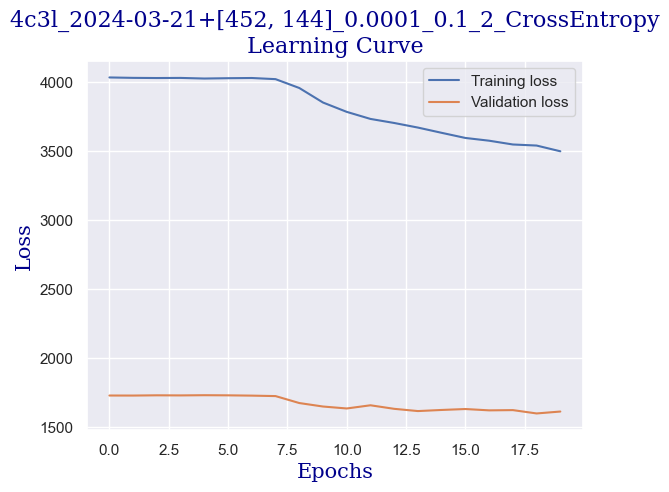

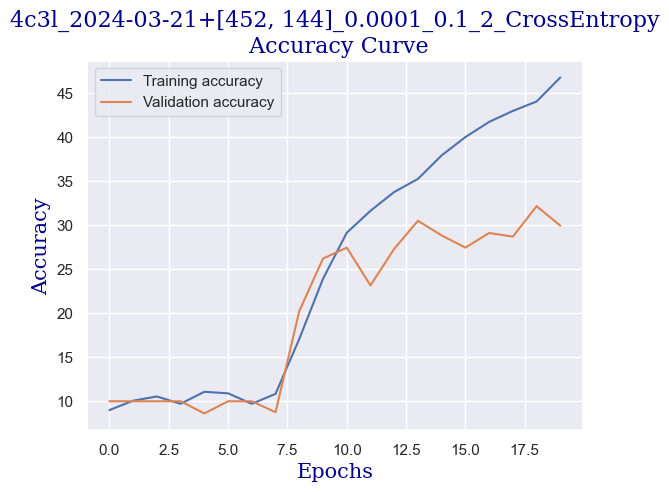

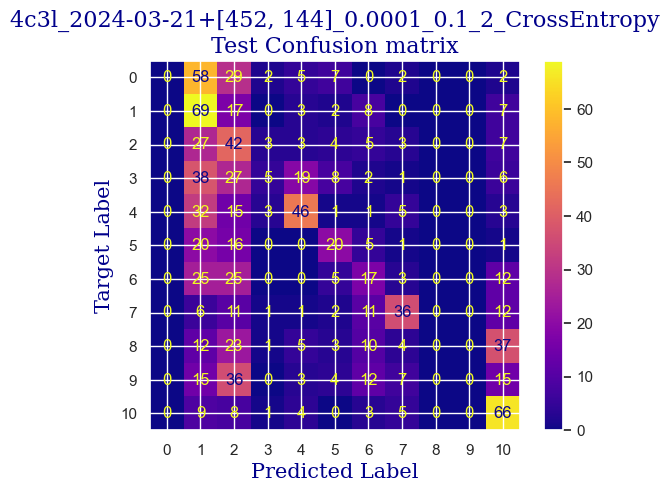

 
 END 4c3l [452, 144] Run Time:  5272.412458498999
Model:  4c3l  idx: 0 / 1
resolution:  [452, 144]   idx: 0 / 7
learning rate:  0.0001   idx: 0 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.1   idx: 1 / 3
seed:  3   idx:  2 / 3
loss function:  CrossEntropy  idx: 0 / 1
28781.11106747
28768.700554066
Total epochs: 20


  0%|                                                                                                                        | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  9.220701963117191
validating...


  5%|█████▌                                                                                                          | 1/20 [00:23<07:35, 23.98s/it]

validation accuracy:  7.489597780859916
Training...
train accuracy:  9.518143961927423
validating...


 10%|███████████▏                                                                                                    | 2/20 [00:48<07:12, 24.01s/it]

validation accuracy:  7.489597780859916
Training...
train accuracy:  11.005353955978585
validating...


 15%|████████████████▊                                                                                               | 3/20 [01:12<06:48, 24.03s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  10.41046995835812
validating...


 20%|██████████████████████▍                                                                                         | 4/20 [01:36<06:23, 24.00s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  10.58893515764426
validating...


 25%|████████████████████████████                                                                                    | 5/20 [01:59<05:59, 23.98s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  9.518143961927423
validating...


 30%|█████████████████████████████████▌                                                                              | 6/20 [02:23<05:35, 23.97s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  9.280190362879239
validating...


 35%|███████████████████████████████████████▏                                                                        | 7/20 [02:47<05:11, 23.95s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  10.172516359309935
validating...


 40%|████████████████████████████████████████████▊                                                                   | 8/20 [03:11<04:47, 23.93s/it]

validation accuracy:  14.701803051317613
Training...
train accuracy:  16.061867935752527
validating...


 45%|██████████████████████████████████████████████████▍                                                             | 9/20 [03:35<04:23, 23.95s/it]

validation accuracy:  17.05963938973648
Training...
train accuracy:  19.036287923854847
validating...


 50%|███████████████████████████████████████████████████████▌                                                       | 10/20 [03:59<03:59, 23.99s/it]

validation accuracy:  16.22746185852982
Training...
train accuracy:  21.713265913146937
validating...


 55%|█████████████████████████████████████████████████████████████                                                  | 11/20 [04:23<03:35, 23.96s/it]

validation accuracy:  19.41747572815534
Training...
train accuracy:  25.223081499107675
validating...


 60%|██████████████████████████████████████████████████████████████████▌                                            | 12/20 [04:47<03:11, 23.95s/it]

validation accuracy:  21.63661581137309
Training...
train accuracy:  28.435455086258184
validating...


 65%|████████████████████████████████████████████████████████████████████████▏                                      | 13/20 [05:11<02:47, 23.96s/it]

validation accuracy:  26.907073509015255
Training...
train accuracy:  32.54015466983938
validating...


 70%|█████████████████████████████████████████████████████████████████████████████▋                                 | 14/20 [05:35<02:23, 23.95s/it]

validation accuracy:  27.739251040221912
Training...
train accuracy:  34.56276026174896
validating...


 75%|███████████████████████████████████████████████████████████████████████████████████▎                           | 15/20 [05:59<01:59, 23.94s/it]

validation accuracy:  28.9875173370319
Training...
train accuracy:  36.94229625223082
validating...


 80%|████████████████████████████████████████████████████████████████████████████████████████▊                      | 16/20 [06:23<01:35, 23.93s/it]

validation accuracy:  31.345353675450767
Training...
train accuracy:  39.440809042236765
validating...


 85%|██████████████████████████████████████████████████████████████████████████████████████████████▎                | 17/20 [06:47<01:11, 23.91s/it]

validation accuracy:  31.206657420249652
Training...
train accuracy:  41.99881023200476
validating...


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████▉           | 18/20 [07:11<00:47, 23.93s/it]

validation accuracy:  30.79056865464632
Training...
train accuracy:  43.24806662700773
validating...


 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 19/20 [07:35<00:23, 23.93s/it]

validation accuracy:  34.39667128987517
Training...
train accuracy:  45.211183819155266
validating...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [07:59<00:00, 23.95s/it]

validation accuracy:  36.061026352288486
Testing...


 
 train acc:  45.211183819155266
 
 val acc:  36.061026352288486
 
 test acc:  33.10679611650485


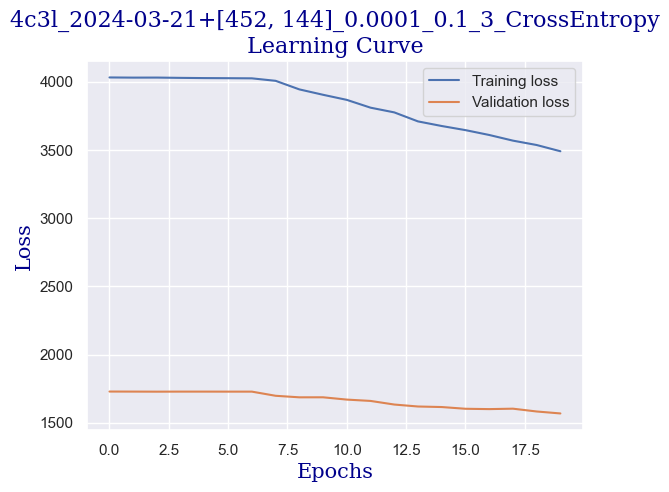

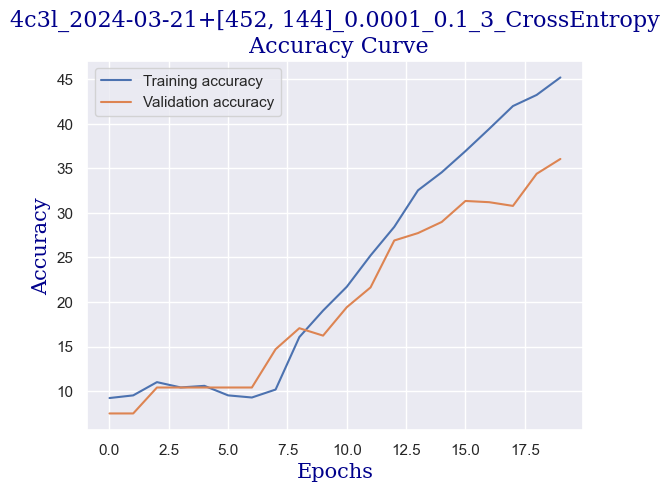

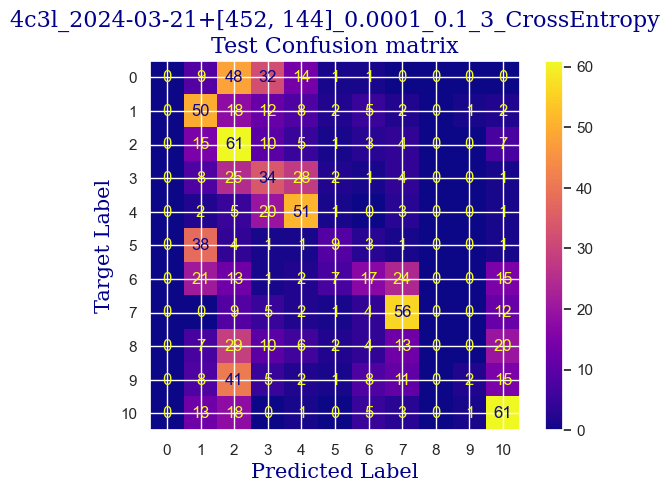

 
 END 4c3l [452, 144] Run Time:  5264.417265626998
Model:  4c3l  idx: 0 / 1
resolution:  [452, 144]   idx: 0 / 7
learning rate:  0.0001   idx: 0 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.2   idx: 2 / 3
seed:  8   idx:  0 / 3
loss function:  CrossEntropy  idx: 0 / 1
34045.529919964
34033.119409093
Total epochs: 20


  0%|                                                                                                                        | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  8.685306365258775
validating...


  5%|█████▌                                                                                                          | 1/20 [00:23<07:35, 23.95s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  9.875074360499703
validating...


 10%|███████████▏                                                                                                    | 2/20 [00:47<07:10, 23.91s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  9.815585960737657
validating...


 15%|████████████████▊                                                                                               | 3/20 [01:11<06:46, 23.93s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  9.518143961927423
validating...


 20%|██████████████████████▍                                                                                         | 4/20 [01:35<06:23, 23.94s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  9.75609756097561
validating...


 25%|████████████████████████████                                                                                    | 5/20 [01:59<05:58, 23.92s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  11.838191552647235
validating...


 30%|█████████████████████████████████▌                                                                              | 6/20 [02:23<05:34, 23.91s/it]

validation accuracy:  14.008321775312066
Training...
train accuracy:  18.79833432480666
validating...


 35%|███████████████████████████████████████▏                                                                        | 7/20 [02:47<05:10, 23.91s/it]

validation accuracy:  16.78224687933426
Training...
train accuracy:  26.650803093396785
validating...


 40%|████████████████████████████████████████████▊                                                                   | 8/20 [03:11<04:47, 23.92s/it]

validation accuracy:  29.958391123439664
Training...
train accuracy:  33.670434265318264
validating...


 45%|██████████████████████████████████████████████████▍                                                             | 9/20 [03:35<04:23, 23.92s/it]

validation accuracy:  31.06796116504854
Training...
train accuracy:  38.19155264723379
validating...


 50%|███████████████████████████████████████████████████████▌                                                       | 10/20 [03:59<03:59, 23.91s/it]

validation accuracy:  34.812760055478506
Training...
train accuracy:  41.04699583581202
validating...


 55%|█████████████████████████████████████████████████████████████                                                  | 11/20 [04:23<03:35, 23.91s/it]

validation accuracy:  32.45492371705964
Training...
train accuracy:  44.02141582391434
validating...


 60%|██████████████████████████████████████████████████████████████████▌                                            | 12/20 [04:46<03:11, 23.91s/it]

validation accuracy:  35.78363384188627
Training...
train accuracy:  44.97323022010708
validating...


 65%|████████████████████████████████████████████████████████████████████████▏                                      | 13/20 [05:10<02:47, 23.92s/it]

validation accuracy:  36.89320388349515
Training...
train accuracy:  46.46044021415824
validating...


 70%|█████████████████████████████████████████████████████████████████████████████▋                                 | 14/20 [05:34<02:23, 23.93s/it]

validation accuracy:  38.00277392510402
Training...
train accuracy:  47.59071980963712
validating...


 75%|███████████████████████████████████████████████████████████████████████████████████▎                           | 15/20 [05:58<01:59, 23.94s/it]

validation accuracy:  33.287101248266296
Training...
train accuracy:  51.10053539559786
validating...


 80%|████████████████████████████████████████████████████████████████████████████████████████▊                      | 16/20 [06:22<01:35, 23.95s/it]

validation accuracy:  39.389736477115115
Training...
train accuracy:  51.93337299226651
validating...


 85%|██████████████████████████████████████████████████████████████████████████████████████████████▎                | 17/20 [06:46<01:11, 23.93s/it]

validation accuracy:  38.41886269070735
Training...
train accuracy:  53.30160618679357
validating...


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████▉           | 18/20 [07:10<00:47, 23.94s/it]

validation accuracy:  39.94452149791955
Training...
train accuracy:  56.2760261748959
validating...


 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 19/20 [07:34<00:23, 23.93s/it]

validation accuracy:  40.221914008321775
Training...
train accuracy:  56.98988697204045
validating...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [07:58<00:00, 23.93s/it]

validation accuracy:  42.44105409153953
Testing...


 
 train acc:  56.98988697204045
 
 val acc:  42.44105409153953
 
 test acc:  38.349514563106794


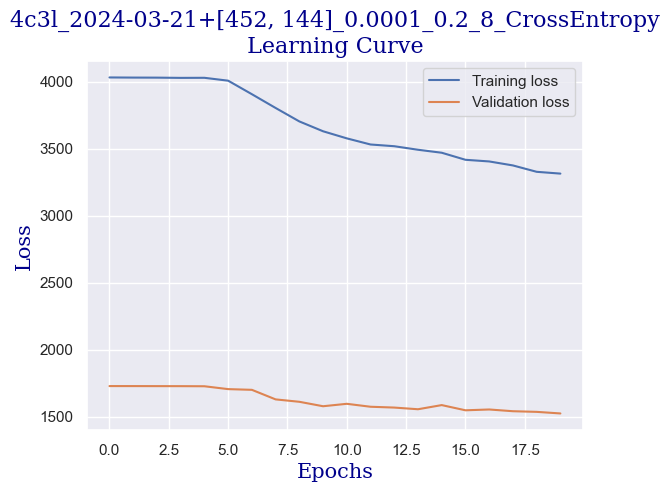

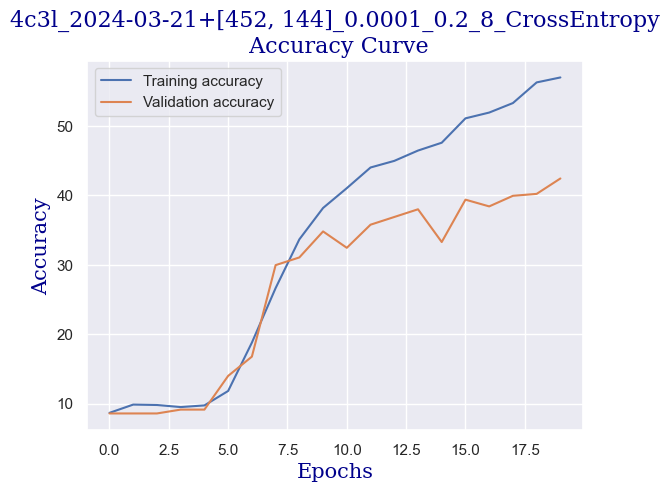

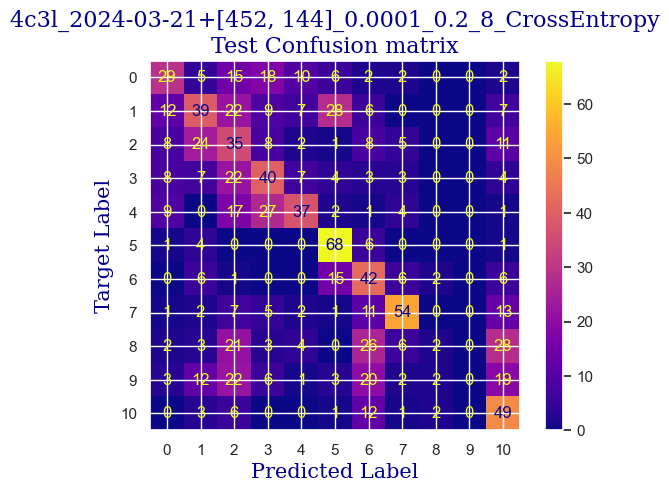

 
 END 4c3l [452, 144] Run Time:  5256.069272075998
Model:  4c3l  idx: 0 / 1
resolution:  [452, 144]   idx: 0 / 7
learning rate:  0.0001   idx: 0 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.2   idx: 2 / 3
seed:  2   idx:  1 / 3
loss function:  CrossEntropy  idx: 0 / 1
39301.600770539
39289.190283391
Total epochs: 20


  0%|                                                                                                                        | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  9.75609756097561
validating...


  5%|█████▌                                                                                                          | 1/20 [00:23<07:33, 23.86s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.529446757882214
validating...


 10%|███████████▏                                                                                                    | 2/20 [00:47<07:10, 23.94s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.767400356930398
validating...


 15%|████████████████▊                                                                                               | 3/20 [01:11<06:47, 23.99s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.58893515764426
validating...


 20%|██████████████████████▍                                                                                         | 4/20 [01:35<06:23, 23.99s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.291493158834028
validating...


 25%|████████████████████████████                                                                                    | 5/20 [01:59<06:00, 24.01s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.767400356930398
validating...


 30%|█████████████████████████████████▌                                                                              | 6/20 [02:23<05:36, 24.00s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.113027959547887
validating...


 35%|███████████████████████████████████████▏                                                                        | 7/20 [02:47<05:11, 23.98s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.945865556216537
validating...


 40%|████████████████████████████████████████████▊                                                                   | 8/20 [03:11<04:47, 23.97s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  11.183819155264723
validating...


 45%|██████████████████████████████████████████████████▍                                                             | 9/20 [03:35<04:23, 23.96s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  11.362284354550862
validating...


 50%|███████████████████████████████████████████████████████▌                                                       | 10/20 [03:59<03:59, 23.94s/it]

validation accuracy:  11.789181692094314
Training...
train accuracy:  13.325401546698393
validating...


 55%|█████████████████████████████████████████████████████████████                                                  | 11/20 [04:23<03:35, 23.93s/it]

validation accuracy:  17.05963938973648
Training...
train accuracy:  19.98810232004759
validating...


 60%|██████████████████████████████████████████████████████████████████▌                                            | 12/20 [04:47<03:11, 23.95s/it]

validation accuracy:  18.307905686546462
Training...
train accuracy:  25.10410469958358
validating...


 65%|████████████████████████████████████████████████████████████████████████▏                                      | 13/20 [05:11<02:47, 23.97s/it]

validation accuracy:  20.665742024965326
Training...
train accuracy:  26.88875669244497
validating...


 70%|█████████████████████████████████████████████████████████████████████████████▋                                 | 14/20 [05:35<02:24, 24.00s/it]

validation accuracy:  21.914008321775313
Training...
train accuracy:  29.625223081499108
validating...


 75%|███████████████████████████████████████████████████████████████████████████████████▎                           | 15/20 [05:59<02:00, 24.00s/it]

validation accuracy:  22.74618585298197
Training...
train accuracy:  31.35038667459845
validating...


 80%|████████████████████████████████████████████████████████████████████████████████████████▊                      | 16/20 [06:23<01:36, 24.00s/it]

validation accuracy:  23.71705963938974
Training...
train accuracy:  33.55145746579417
validating...


 85%|██████████████████████████████████████████████████████████████████████████████████████████████▎                | 17/20 [06:47<01:11, 23.99s/it]

validation accuracy:  26.49098474341193
Training...
train accuracy:  34.26531826293873
validating...


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████▉           | 18/20 [07:11<00:48, 24.01s/it]

validation accuracy:  23.1622746185853
Training...
train accuracy:  36.16894705532421
validating...


 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 19/20 [07:35<00:23, 23.99s/it]

validation accuracy:  25.52011095700416
Training...
train accuracy:  38.429506246281974
validating...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [07:59<00:00, 23.98s/it]

validation accuracy:  25.79750346740638
Testing...


 
 train acc:  38.429506246281974
 
 val acc:  25.79750346740638
 
 test acc:  27.669902912621357


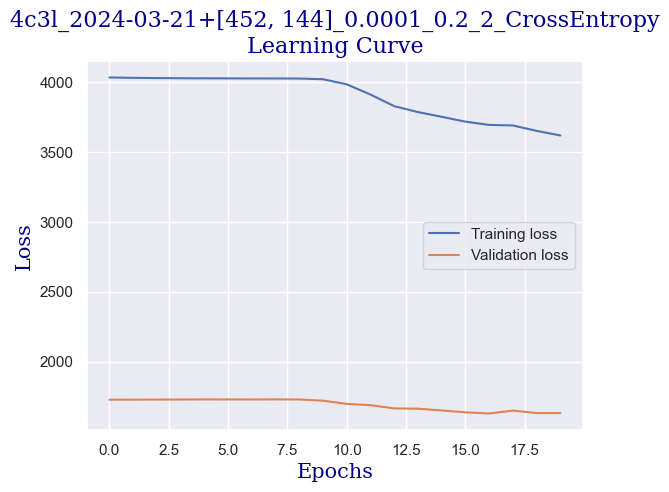

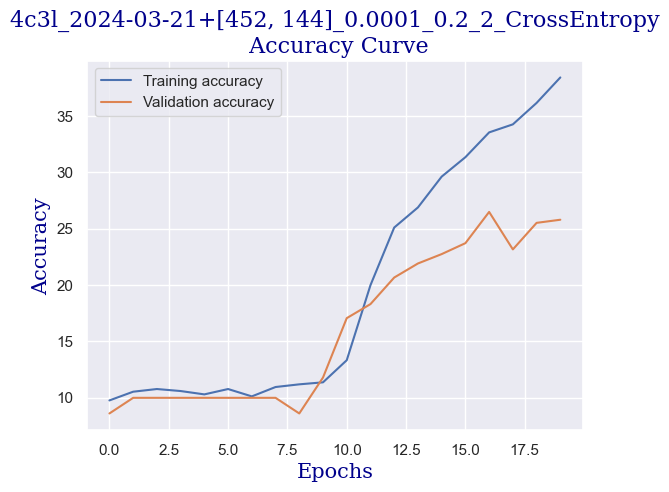

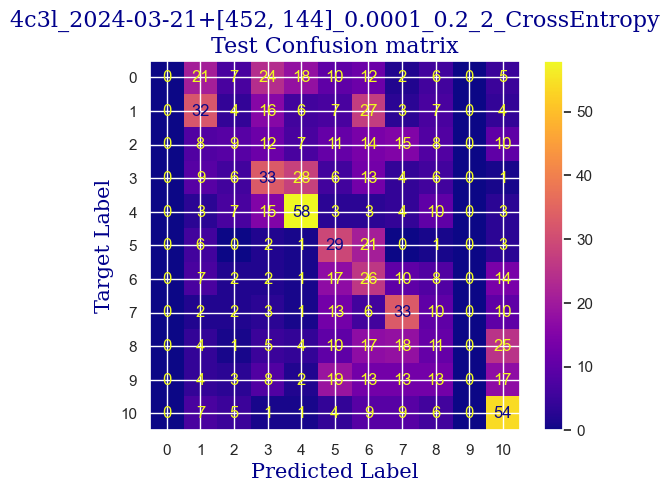

 
 END 4c3l [452, 144] Run Time:  5267.732866311999
Model:  4c3l  idx: 0 / 1
resolution:  [452, 144]   idx: 0 / 7
learning rate:  0.0001   idx: 0 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.2   idx: 2 / 3
seed:  3   idx:  2 / 3
loss function:  CrossEntropy  idx: 0 / 1
44569.335103211
44556.924591032
Total epochs: 20


  0%|                                                                                                                        | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  10.529446757882214
validating...


  5%|█████▌                                                                                                          | 1/20 [00:23<07:35, 23.97s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  10.707911957168353
validating...


 10%|███████████▏                                                                                                    | 2/20 [00:47<07:11, 23.98s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  10.291493158834028
validating...


 15%|████████████████▊                                                                                               | 3/20 [01:11<06:47, 23.98s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  10.23200475907198
validating...


 20%|██████████████████████▍                                                                                         | 4/20 [01:35<06:23, 23.98s/it]

validation accuracy:  7.489597780859916
Training...
train accuracy:  12.135633551457465
validating...


 25%|████████████████████████████                                                                                    | 5/20 [02:00<06:00, 24.03s/it]

validation accuracy:  15.950069348127602
Training...
train accuracy:  16.240333135038668
validating...


 30%|█████████████████████████████████▌                                                                              | 6/20 [02:24<05:36, 24.06s/it]

validation accuracy:  17.891816920943135
Training...
train accuracy:  18.85782272456871
validating...


 35%|███████████████████████████████████████▏                                                                        | 7/20 [02:48<05:12, 24.02s/it]

validation accuracy:  23.578363384188627
Training...
train accuracy:  23.14098750743605
validating...


 40%|████████████████████████████████████████████▊                                                                   | 8/20 [03:12<04:48, 24.04s/it]

validation accuracy:  22.88488210818308
Training...
train accuracy:  24.687685901249257
validating...


 45%|██████████████████████████████████████████████████▍                                                             | 9/20 [03:36<04:24, 24.05s/it]

validation accuracy:  21.35922330097087
Training...
train accuracy:  26.353361094586557
validating...


 50%|███████████████████████████████████████████████████████▌                                                       | 10/20 [04:00<04:00, 24.07s/it]

validation accuracy:  22.88488210818308
Training...
train accuracy:  27.007733491969066
validating...


 55%|█████████████████████████████████████████████████████████████                                                  | 11/20 [04:24<03:36, 24.07s/it]

validation accuracy:  25.381414701803052
Training...
train accuracy:  31.88578227245687
validating...


 60%|██████████████████████████████████████████████████████████████████▌                                            | 12/20 [04:48<03:12, 24.03s/it]

validation accuracy:  27.045769764216367
Training...
train accuracy:  34.26531826293873
validating...


 65%|████████████████████████████████████████████████████████████████████████▏                                      | 13/20 [05:12<02:48, 24.04s/it]

validation accuracy:  29.680998613037445
Training...
train accuracy:  33.8488994646044
validating...


 70%|█████████████████████████████████████████████████████████████████████████████▋                                 | 14/20 [05:36<02:24, 24.07s/it]

validation accuracy:  27.877947295423024
Training...
train accuracy:  35.15764425936943
validating...


 75%|███████████████████████████████████████████████████████████████████████████████████▎                           | 15/20 [06:00<02:00, 24.11s/it]

validation accuracy:  25.65880721220527
Training...
train accuracy:  33.49196906603213
validating...


 80%|████████████████████████████████████████████████████████████████████████████████████████▊                      | 16/20 [06:24<01:36, 24.12s/it]

validation accuracy:  27.739251040221912
Training...
train accuracy:  36.52587745389649
validating...


 85%|██████████████████████████████████████████████████████████████████████████████████████████████▎                | 17/20 [06:49<01:12, 24.12s/it]

validation accuracy:  30.929264909847433
Training...
train accuracy:  36.82331945270672
validating...


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████▉           | 18/20 [07:13<00:48, 24.12s/it]

validation accuracy:  31.484049930651874
Training...
train accuracy:  36.882807852468765
validating...


 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 19/20 [07:37<00:24, 24.11s/it]

validation accuracy:  30.235783633841883
Training...
train accuracy:  36.763831052944674
validating...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [08:01<00:00, 24.06s/it]

validation accuracy:  30.651872399445214
Testing...


 
 train acc:  36.763831052944674
 
 val acc:  30.651872399445214
 
 test acc:  29.80582524271845


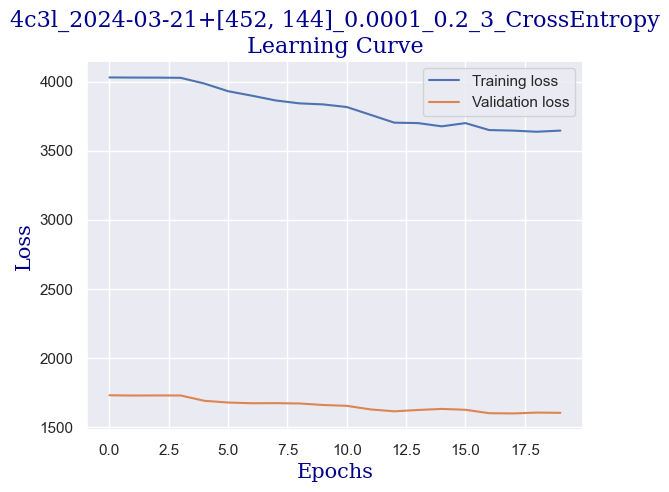

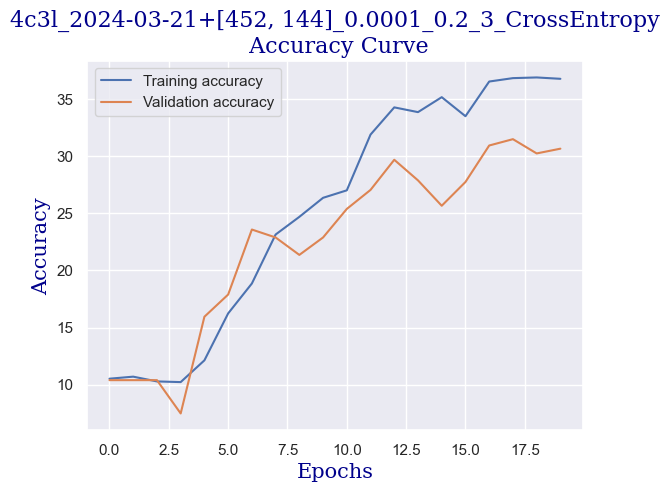

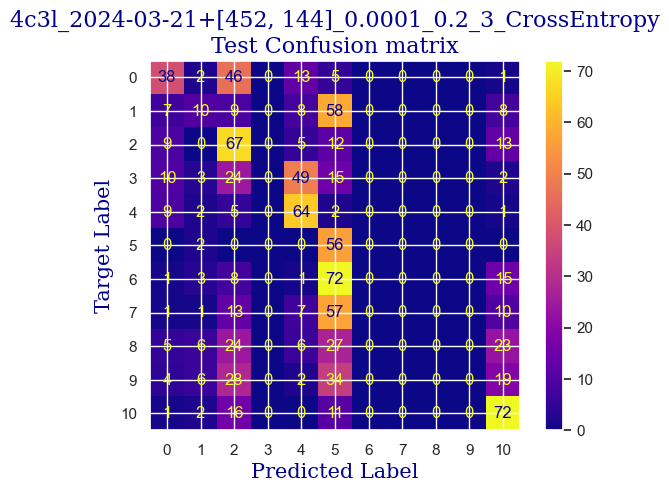

 
 END 4c3l [452, 144] Run Time:  5263.536548306998
Model:  4c3l  idx: 0 / 1
resolution:  [452, 144]   idx: 0 / 7
learning rate:  6e-05   idx: 1 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0   idx: 0 / 3
seed:  8   idx:  0 / 3
loss function:  CrossEntropy  idx: 0 / 1
49832.872927761
49820.462412425004
Total epochs: 20


  0%|                                                                                                                        | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  9.339678762641284
validating...


  5%|█████▌                                                                                                          | 1/20 [00:24<07:39, 24.18s/it]

validation accuracy:  10.540915395284326
Training...
train accuracy:  9.994051160023796
validating...


 10%|███████████▏                                                                                                    | 2/20 [00:48<07:13, 24.08s/it]

validation accuracy:  15.53398058252427
Training...
train accuracy:  16.35930993456276
validating...


 15%|████████████████▊                                                                                               | 3/20 [01:12<06:49, 24.08s/it]

validation accuracy:  17.891816920943135
Training...
train accuracy:  23.973825104104698
validating...


 20%|██████████████████████▍                                                                                         | 4/20 [01:36<06:25, 24.09s/it]

validation accuracy:  18.723994452149793
Training...
train accuracy:  25.758477096966093
validating...


 25%|████████████████████████████                                                                                    | 5/20 [02:00<06:00, 24.04s/it]

validation accuracy:  23.994452149791957
Training...
train accuracy:  28.911362284354553
validating...


 30%|█████████████████████████████████▌                                                                              | 6/20 [02:24<05:36, 24.01s/it]

validation accuracy:  24.549237170596395
Training...
train accuracy:  34.26531826293873
validating...


 35%|███████████████████████████████████████▏                                                                        | 7/20 [02:48<05:11, 23.98s/it]

validation accuracy:  25.381414701803052
Training...
train accuracy:  37.180249851279
validating...


 40%|████████████████████████████████████████████▊                                                                   | 8/20 [03:12<04:47, 23.99s/it]

validation accuracy:  26.907073509015255
Training...
train accuracy:  38.96490184414039
validating...


 45%|██████████████████████████████████████████████████▍                                                             | 9/20 [03:36<04:23, 24.00s/it]

validation accuracy:  27.877947295423024
Training...
train accuracy:  42.0582986317668
validating...


 50%|███████████████████████████████████████████████████████▌                                                       | 10/20 [04:00<04:00, 24.02s/it]

validation accuracy:  29.26490984743412
Training...
train accuracy:  43.01011302795955
validating...


 55%|█████████████████████████████████████████████████████████████                                                  | 11/20 [04:24<03:36, 24.03s/it]

validation accuracy:  27.461858529819693
Training...
train accuracy:  44.31885782272457
validating...


 60%|██████████████████████████████████████████████████████████████████▌                                            | 12/20 [04:48<03:12, 24.03s/it]

validation accuracy:  29.26490984743412
Training...
train accuracy:  44.854253420582985
validating...


 65%|████████████████████████████████████████████████████████████████████████▏                                      | 13/20 [05:12<02:48, 24.01s/it]

validation accuracy:  29.680998613037445
Training...
train accuracy:  49.07792980368828
validating...


 70%|█████████████████████████████████████████████████████████████████████████████▋                                 | 14/20 [05:36<02:23, 23.99s/it]

validation accuracy:  30.097087378640776
Training...
train accuracy:  51.10053539559786
validating...


 75%|███████████████████████████████████████████████████████████████████████████████████▎                           | 15/20 [06:00<01:59, 23.97s/it]

validation accuracy:  30.651872399445214
Training...
train accuracy:  52.8256989886972
validating...


 80%|████████████████████████████████████████████████████████████████████████████████████████▊                      | 16/20 [06:24<01:35, 23.98s/it]

validation accuracy:  34.39667128987517
Training...
train accuracy:  57.16835217132659
validating...


 85%|██████████████████████████████████████████████████████████████████████████████████████████████▎                | 17/20 [06:48<01:12, 24.00s/it]

validation accuracy:  35.50624133148405
Training...
train accuracy:  58.95300416418798
validating...


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████▉           | 18/20 [07:12<00:47, 23.99s/it]

validation accuracy:  35.92233009708738
Training...
train accuracy:  60.261748958953
validating...


 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 19/20 [07:36<00:23, 23.97s/it]

validation accuracy:  37.17059639389736
Training...
train accuracy:  63.117192147531235
validating...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [08:00<00:00, 24.01s/it]

validation accuracy:  35.92233009708738
Testing...


 
 train acc:  63.117192147531235
 
 val acc:  35.92233009708738
 
 test acc:  36.310679611650485


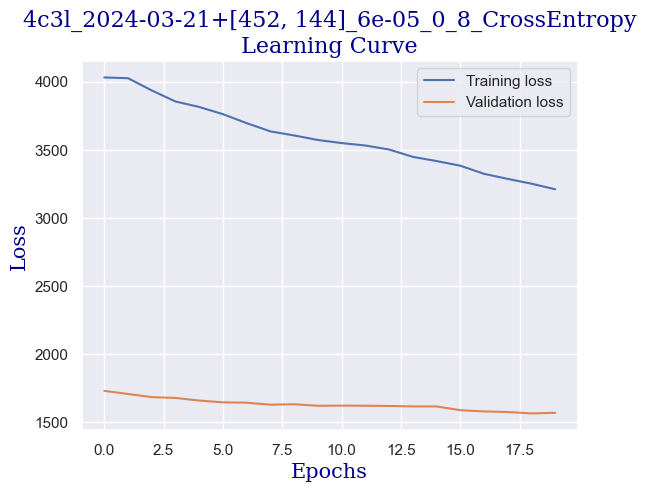

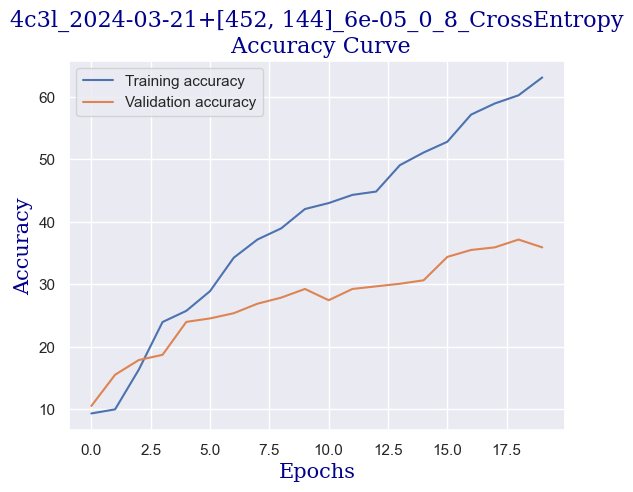

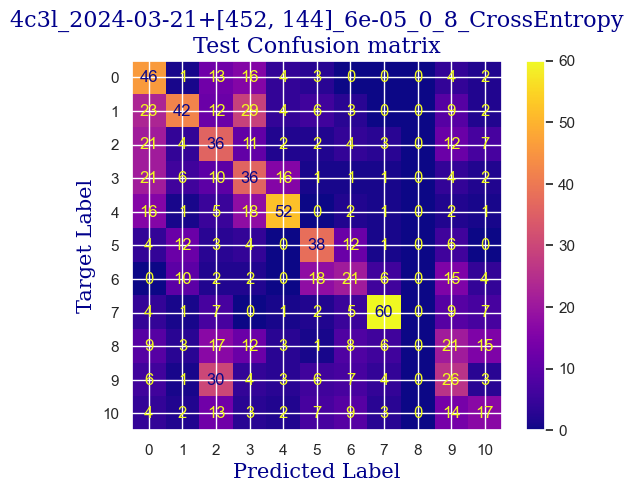

 
 END 4c3l [452, 144] Run Time:  5271.677990934004
Model:  4c3l  idx: 0 / 1
resolution:  [452, 144]   idx: 0 / 7
learning rate:  6e-05   idx: 1 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0   idx: 0 / 3
seed:  2   idx:  1 / 3
loss function:  CrossEntropy  idx: 0 / 1
55104.551850345
55092.141337441004
Total epochs: 20


  0%|                                                                                                                        | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  9.220701963117191
validating...


  5%|█████▌                                                                                                          | 1/20 [00:23<07:34, 23.91s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  9.696609161213564
validating...


 10%|███████████▏                                                                                                    | 2/20 [00:47<07:10, 23.93s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.350981558596075
validating...


 15%|████████████████▊                                                                                               | 3/20 [01:11<06:46, 23.91s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  9.280190362879239
validating...


 20%|██████████████████████▍                                                                                         | 4/20 [01:35<06:22, 23.91s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.23200475907198
validating...


 25%|████████████████████████████                                                                                    | 5/20 [01:59<05:58, 23.93s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.350981558596075
validating...


 30%|█████████████████████████████████▌                                                                              | 6/20 [02:23<05:35, 23.94s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  11.421772754312908
validating...


 35%|███████████████████████████████████████▏                                                                        | 7/20 [02:47<05:11, 23.95s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  11.778703152885187
validating...


 40%|████████████████████████████████████████████▊                                                                   | 8/20 [03:11<04:47, 23.96s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.767400356930398
validating...


 45%|██████████████████████████████████████████████████▍                                                             | 9/20 [03:35<04:23, 23.97s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.648423557406305
validating...


 50%|███████████████████████████████████████████████████████▌                                                       | 10/20 [03:59<03:59, 23.98s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.707911957168353
validating...


 55%|█████████████████████████████████████████████████████████████                                                  | 11/20 [04:23<03:36, 24.01s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  9.57763236168947
validating...


 60%|██████████████████████████████████████████████████████████████████▌                                            | 12/20 [04:47<03:12, 24.00s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  11.302795954788817
validating...


 65%|████████████████████████████████████████████████████████████████████████▏                                      | 13/20 [05:11<02:48, 24.01s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.172516359309935
validating...


 70%|█████████████████████████████████████████████████████████████████████████████▋                                 | 14/20 [05:35<02:24, 24.01s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.767400356930398
validating...


 75%|███████████████████████████████████████████████████████████████████████████████████▎                           | 15/20 [05:59<02:00, 24.02s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.350981558596075
validating...


 80%|████████████████████████████████████████████████████████████████████████████████████████▊                      | 16/20 [06:23<01:36, 24.01s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  9.220701963117191
validating...


 85%|██████████████████████████████████████████████████████████████████████████████████████████████▎                | 17/20 [06:47<01:11, 24.00s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.886377156454492
validating...


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████▉           | 18/20 [07:11<00:47, 23.99s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  9.339678762641284
validating...


 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 19/20 [07:35<00:23, 23.96s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.053539559785841
validating...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [07:59<00:00, 23.98s/it]

validation accuracy:  9.986130374479888
Testing...


 
 train acc:  10.053539559785841
 
 val acc:  9.986130374479888
 
 test acc:  10.29126213592233


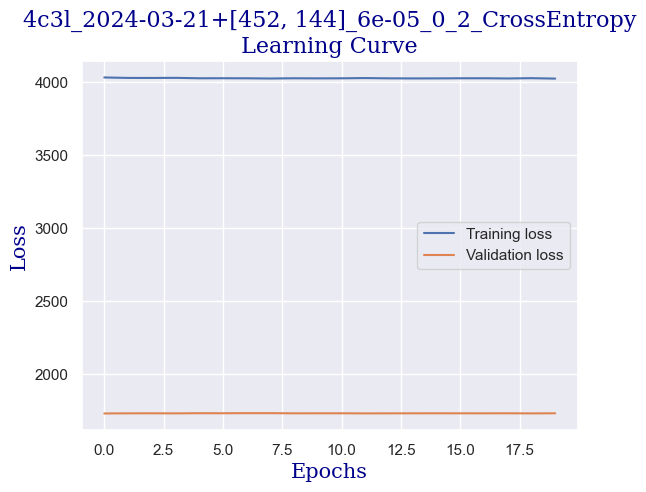

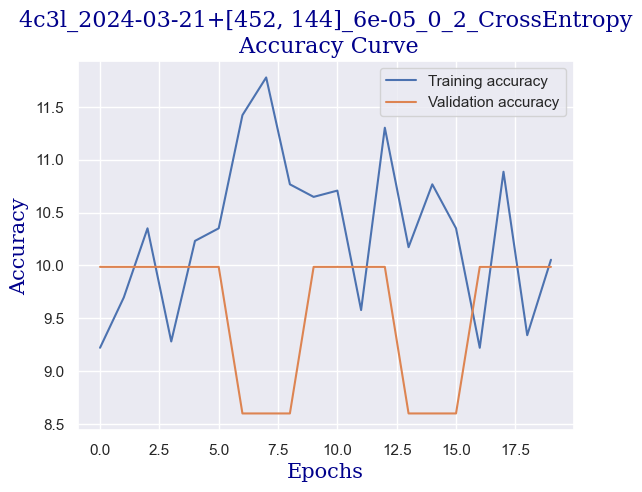

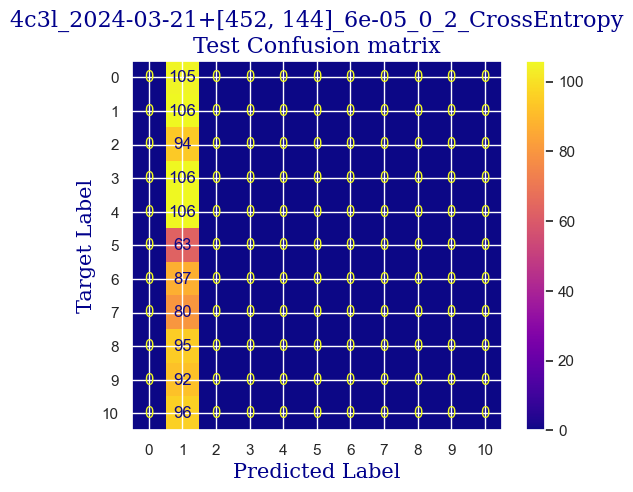

 
 END 4c3l [452, 144] Run Time:  5258.104622487001
Model:  4c3l  idx: 0 / 1
resolution:  [452, 144]   idx: 0 / 7
learning rate:  6e-05   idx: 1 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0   idx: 0 / 3
seed:  3   idx:  2 / 3
loss function:  CrossEntropy  idx: 0 / 1
60362.657652947
60350.247135006
Total epochs: 20


  0%|                                                                                                                        | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  8.74479476502082
validating...


  5%|█████▌                                                                                                          | 1/20 [00:23<07:34, 23.91s/it]

validation accuracy:  9.57004160887656
Training...
train accuracy:  9.75609756097561
validating...


 10%|███████████▏                                                                                                    | 2/20 [00:47<07:11, 23.99s/it]

validation accuracy:  9.57004160887656
Training...
train accuracy:  9.696609161213564
validating...


 15%|████████████████▊                                                                                               | 3/20 [01:11<06:47, 23.96s/it]

validation accuracy:  9.57004160887656
Training...
train accuracy:  10.648423557406305
validating...


 20%|██████████████████████▍                                                                                         | 4/20 [01:35<06:23, 23.98s/it]

validation accuracy:  9.57004160887656
Training...
train accuracy:  10.172516359309935
validating...


 25%|████████████████████████████                                                                                    | 5/20 [01:59<05:59, 23.95s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  10.23200475907198
validating...


 30%|█████████████████████████████████▌                                                                              | 6/20 [02:23<05:35, 23.98s/it]

validation accuracy:  7.489597780859916
Training...
train accuracy:  9.339678762641284
validating...


 35%|███████████████████████████████████████▏                                                                        | 7/20 [02:47<05:11, 23.97s/it]

validation accuracy:  7.489597780859916
Training...
train accuracy:  13.325401546698393
validating...


 40%|████████████████████████████████████████████▊                                                                   | 8/20 [03:11<04:47, 23.96s/it]

validation accuracy:  17.614424410540916
Training...
train accuracy:  23.259964306960143
validating...


 45%|██████████████████████████████████████████████████▍                                                             | 9/20 [03:35<04:23, 23.96s/it]

validation accuracy:  21.497919556171983
Training...
train accuracy:  27.007733491969066
validating...


 50%|███████████████████████████████████████████████████████▌                                                       | 10/20 [03:59<03:59, 23.96s/it]

validation accuracy:  20.527045769764214
Training...
train accuracy:  28.078524687685903
validating...


 55%|█████████████████████████████████████████████████████████████                                                  | 11/20 [04:23<03:35, 23.97s/it]

validation accuracy:  23.578363384188627
Training...
train accuracy:  30.814991076740032
validating...


 60%|██████████████████████████████████████████████████████████████████▌                                            | 12/20 [04:47<03:11, 23.95s/it]

validation accuracy:  26.21359223300971
Training...
train accuracy:  34.08685306365259
validating...


 65%|████████████████████████████████████████████████████████████████████████▏                                      | 13/20 [05:11<02:47, 23.97s/it]

validation accuracy:  30.374479889042995
Training...
train accuracy:  39.440809042236765
validating...


 70%|█████████████████████████████████████████████████████████████████████████████▋                                 | 14/20 [05:35<02:23, 23.95s/it]

validation accuracy:  28.71012482662968
Training...
train accuracy:  41.58239143367044
validating...


 75%|███████████████████████████████████████████████████████████████████████████████████▎                           | 15/20 [05:59<01:59, 23.96s/it]

validation accuracy:  29.680998613037445
Training...
train accuracy:  44.199881023200476
validating...


 80%|████████████████████████████████████████████████████████████████████████████████████████▊                      | 16/20 [06:23<01:35, 23.98s/it]

validation accuracy:  32.31622746185853
Training...
train accuracy:  45.211183819155266
validating...


 85%|██████████████████████████████████████████████████████████████████████████████████████████████▎                | 17/20 [06:47<01:11, 23.96s/it]

validation accuracy:  35.50624133148405
Training...
train accuracy:  49.196906603212376
validating...


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████▉           | 18/20 [07:11<00:47, 23.98s/it]

validation accuracy:  35.22884882108183
Training...
train accuracy:  50.50565139797739
validating...


 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 19/20 [07:35<00:23, 23.97s/it]

validation accuracy:  36.1997226074896
Training...
train accuracy:  52.944675788221296
validating...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [07:59<00:00, 23.96s/it]

validation accuracy:  36.33841886269071
Testing...


 
 train acc:  52.944675788221296
 
 val acc:  36.33841886269071
 
 test acc:  38.543689320388346


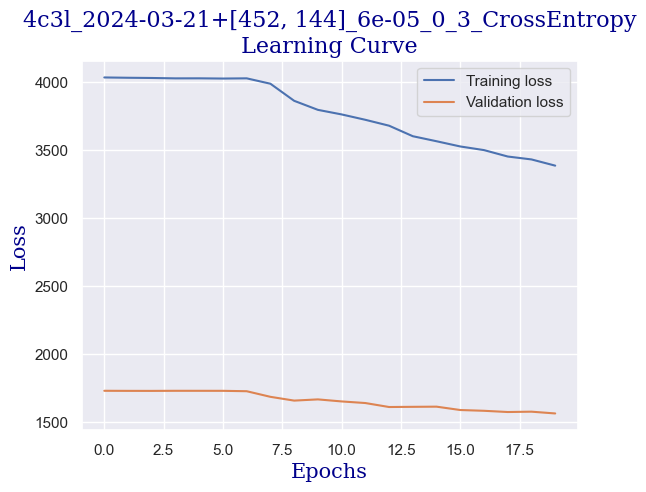

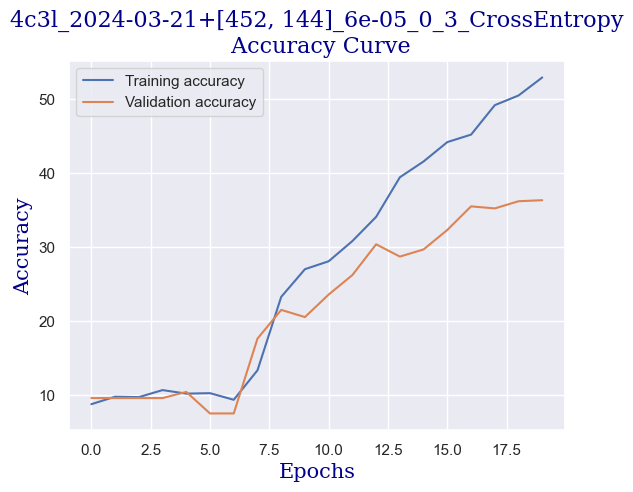

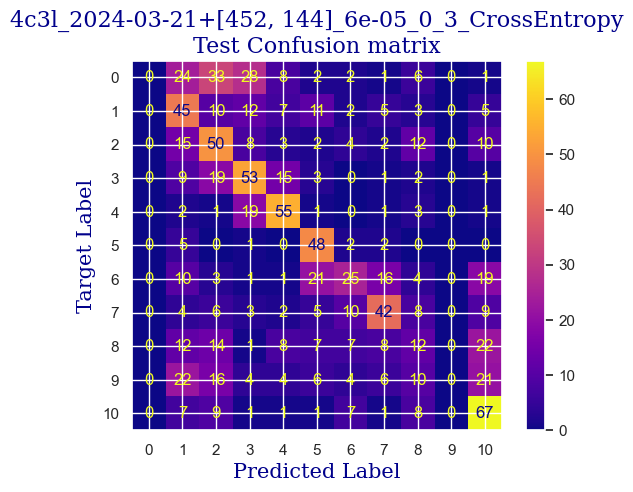

 
 END 4c3l [452, 144] Run Time:  5260.856302691005
Model:  4c3l  idx: 0 / 1
resolution:  [452, 144]   idx: 0 / 7
learning rate:  6e-05   idx: 1 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.1   idx: 1 / 3
seed:  8   idx:  0 / 3
loss function:  CrossEntropy  idx: 0 / 1
65623.515463498
65611.104950357
Total epochs: 20


  0%|                                                                                                                        | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  9.994051160023796
validating...


  5%|█████▌                                                                                                          | 1/20 [00:23<07:34, 23.94s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.469958358120167
validating...


 10%|███████████▏                                                                                                    | 2/20 [00:48<07:12, 24.05s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.172516359309935
validating...


 15%|████████████████▊                                                                                               | 3/20 [01:12<06:49, 24.07s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.350981558596075
validating...


 20%|██████████████████████▍                                                                                         | 4/20 [01:36<06:27, 24.20s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.350981558596075
validating...


 25%|████████████████████████████                                                                                    | 5/20 [02:00<06:03, 24.26s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.23200475907198
validating...


 30%|█████████████████████████████████▌                                                                              | 6/20 [02:25<05:40, 24.33s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.350981558596075
validating...


 35%|███████████████████████████████████████▏                                                                        | 7/20 [02:49<05:16, 24.32s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.469958358120167
validating...


 40%|████████████████████████████████████████████▊                                                                   | 8/20 [03:13<04:51, 24.31s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.350981558596075
validating...


 45%|██████████████████████████████████████████████████▍                                                             | 9/20 [03:38<04:27, 24.33s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.41046995835812
validating...


 50%|███████████████████████████████████████████████████████▌                                                       | 10/20 [04:02<04:03, 24.33s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.350981558596075
validating...


 55%|█████████████████████████████████████████████████████████████                                                  | 11/20 [04:26<03:38, 24.32s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.350981558596075
validating...


 60%|██████████████████████████████████████████████████████████████████▌                                            | 12/20 [04:51<03:14, 24.31s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.350981558596075
validating...


 65%|████████████████████████████████████████████████████████████████████████▏                                      | 13/20 [05:15<02:50, 24.33s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.350981558596075
validating...


 70%|█████████████████████████████████████████████████████████████████████████████▋                                 | 14/20 [05:40<02:26, 24.37s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.350981558596075
validating...


 75%|███████████████████████████████████████████████████████████████████████████████████▎                           | 15/20 [06:04<02:01, 24.35s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.350981558596075
validating...


 80%|████████████████████████████████████████████████████████████████████████████████████████▊                      | 16/20 [06:28<01:37, 24.35s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.350981558596075
validating...


 85%|██████████████████████████████████████████████████████████████████████████████████████████████▎                | 17/20 [06:53<01:13, 24.34s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.350981558596075
validating...


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████▉           | 18/20 [07:17<00:48, 24.35s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.350981558596075
validating...


 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 19/20 [07:41<00:24, 24.35s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.350981558596075
validating...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [08:06<00:00, 24.31s/it]

validation accuracy:  9.153952843273231
Testing...


 
 train acc:  10.350981558596075
 
 val acc:  9.153952843273231
 
 test acc:  9.902912621359224


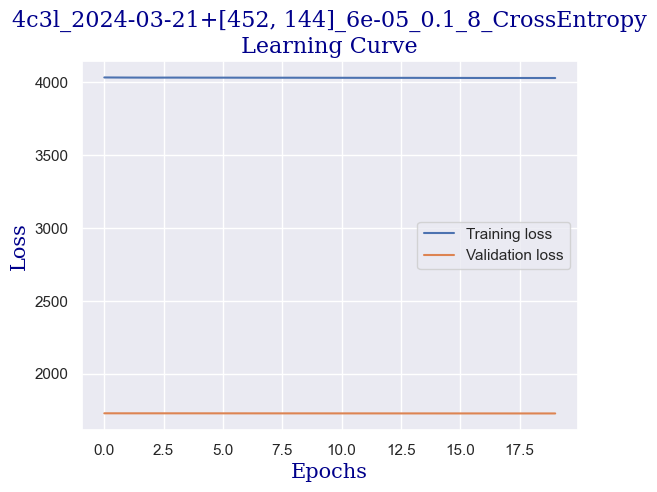

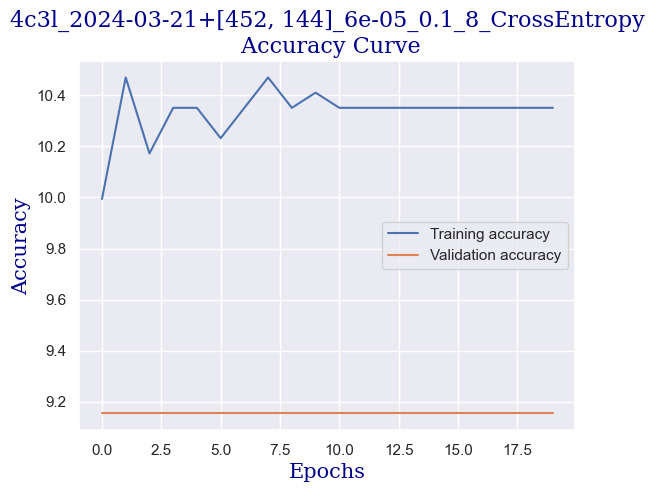

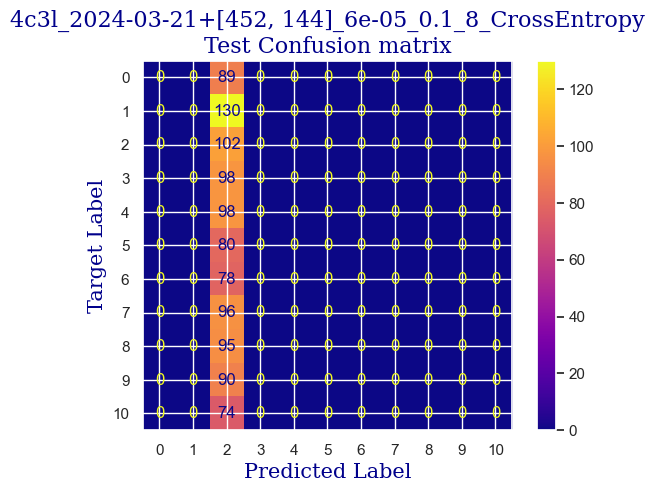

 
 END 4c3l [452, 144] Run Time:  5244.548716517005
Model:  4c3l  idx: 0 / 1
resolution:  [452, 144]   idx: 0 / 7
learning rate:  6e-05   idx: 1 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.1   idx: 1 / 3
seed:  2   idx:  1 / 3
loss function:  CrossEntropy  idx: 0 / 1
70868.065200709
70855.654687879
Total epochs: 20


  0%|                                                                                                                        | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  8.447352766210589
validating...


  5%|█████▌                                                                                                          | 1/20 [00:23<07:34, 23.91s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.826888756692444
validating...


 10%|███████████▏                                                                                                    | 2/20 [00:47<07:11, 23.96s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  11.124330755502678
validating...


 15%|████████████████▊                                                                                               | 3/20 [01:11<06:47, 23.98s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  11.005353955978585
validating...


 20%|██████████████████████▍                                                                                         | 4/20 [01:35<06:24, 24.02s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  11.06484235574063
validating...


 25%|████████████████████████████                                                                                    | 5/20 [01:59<05:59, 23.99s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  11.421772754312908
validating...


 30%|█████████████████████████████████▌                                                                              | 6/20 [02:23<05:35, 23.98s/it]

validation accuracy:  10.540915395284326
Training...
train accuracy:  12.373587150505651
validating...


 35%|███████████████████████████████████████▏                                                                        | 7/20 [02:47<05:11, 23.99s/it]

validation accuracy:  20.249653259361995
Training...
train accuracy:  24.747174301011302
validating...


 40%|████████████████████████████████████████████▊                                                                   | 8/20 [03:11<04:47, 23.99s/it]

validation accuracy:  27.739251040221912
Training...
train accuracy:  32.65913146936347
validating...


 45%|██████████████████████████████████████████████████▍                                                             | 9/20 [03:35<04:23, 23.97s/it]

validation accuracy:  33.42579750346741
Training...
train accuracy:  37.001784651992864
validating...


 50%|███████████████████████████████████████████████████████▌                                                       | 10/20 [03:59<03:59, 23.94s/it]

validation accuracy:  32.038834951456316
Training...
train accuracy:  41.106484235574065
validating...


 55%|█████████████████████████████████████████████████████████████                                                  | 11/20 [04:23<03:35, 23.93s/it]

validation accuracy:  37.309292649098474
Training...
train accuracy:  42.653182629387274
validating...


 60%|██████████████████████████████████████████████████████████████████▌                                            | 12/20 [04:47<03:11, 23.95s/it]

validation accuracy:  35.22884882108183
Training...
train accuracy:  46.400951814396194
validating...


 65%|████████████████████████████████████████████████████████████████████████▏                                      | 13/20 [05:11<02:47, 23.94s/it]

validation accuracy:  37.447988904299585
Training...
train accuracy:  47.293277810826886
validating...


 70%|█████████████████████████████████████████████████████████████████████████████▋                                 | 14/20 [05:35<02:23, 23.95s/it]

validation accuracy:  36.33841886269071
Training...
train accuracy:  49.494348602022605
validating...


 75%|███████████████████████████████████████████████████████████████████████████████████▎                           | 15/20 [05:59<01:59, 23.95s/it]

validation accuracy:  35.367545076282944
Training...
train accuracy:  50.86258179654968
validating...


 80%|████████████████████████████████████████████████████████████████████████████████████████▊                      | 16/20 [06:23<01:35, 23.94s/it]

validation accuracy:  37.309292649098474
Training...
train accuracy:  51.69541939321832
validating...


 85%|██████████████████████████████████████████████████████████████████████████████████████████████▎                | 17/20 [06:47<01:11, 23.95s/it]

validation accuracy:  37.447988904299585
Training...
train accuracy:  52.409280190362885
validating...


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████▉           | 18/20 [07:11<00:47, 23.94s/it]

validation accuracy:  37.309292649098474
Training...
train accuracy:  53.182629387269486
validating...


 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 19/20 [07:35<00:23, 23.94s/it]

validation accuracy:  38.41886269070735
Training...
train accuracy:  54.25342058298632
validating...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [07:59<00:00, 23.96s/it]

validation accuracy:  35.92233009708738
Testing...


 
 train acc:  54.25342058298632
 
 val acc:  35.92233009708738
 
 test acc:  36.89320388349515


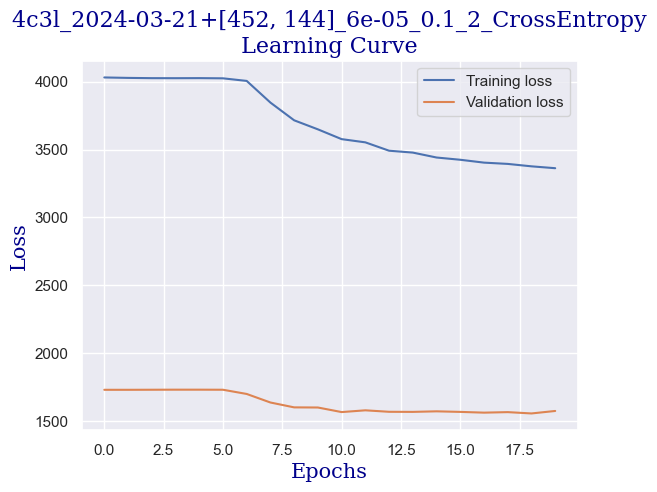

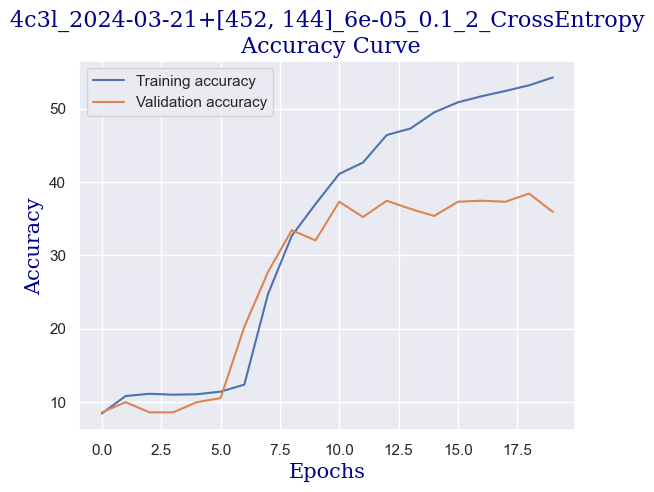

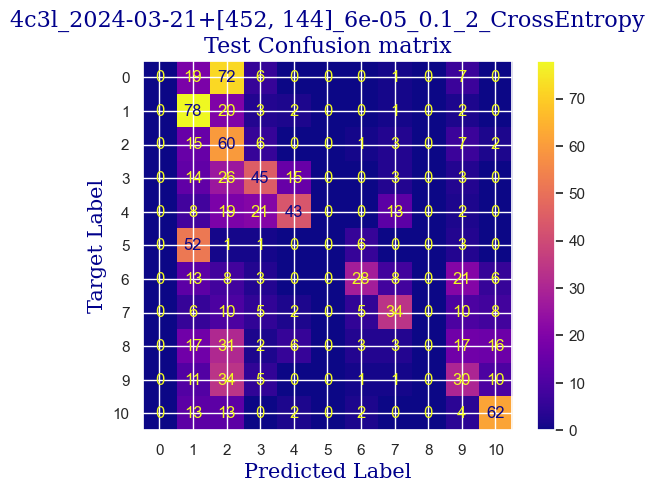

 
 END 4c3l [452, 144] Run Time:  5254.38213446601
Model:  4c3l  idx: 0 / 1
resolution:  [452, 144]   idx: 0 / 7
learning rate:  6e-05   idx: 1 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.1   idx: 1 / 3
seed:  3   idx:  2 / 3
loss function:  CrossEntropy  idx: 0 / 1
76122.448901505
76110.03838801099
Total epochs: 20


  0%|                                                                                                                        | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  9.042236763831053
validating...


  5%|█████▌                                                                                                          | 1/20 [00:24<07:36, 24.04s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  9.815585960737657
validating...


 10%|███████████▏                                                                                                    | 2/20 [00:48<07:12, 24.02s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  9.161213563355146
validating...


 15%|████████████████▊                                                                                               | 3/20 [01:12<06:48, 24.02s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  9.280190362879239
validating...


 20%|██████████████████████▍                                                                                         | 4/20 [01:36<06:24, 24.00s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  10.053539559785841
validating...


 25%|████████████████████████████                                                                                    | 5/20 [02:00<05:59, 24.00s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  10.113027959547887
validating...


 30%|█████████████████████████████████▌                                                                              | 6/20 [02:24<05:35, 24.00s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  13.146936347412256
validating...


 35%|███████████████████████████████████████▏                                                                        | 7/20 [02:47<05:11, 23.98s/it]

validation accuracy:  17.753120665742024
Training...
train accuracy:  22.01070791195717
validating...


 40%|████████████████████████████████████████████▊                                                                   | 8/20 [03:11<04:47, 23.98s/it]

validation accuracy:  24.826629680998614
Training...
train accuracy:  31.528851873884594
validating...


 45%|██████████████████████████████████████████████████▍                                                             | 9/20 [03:35<04:23, 23.98s/it]

validation accuracy:  28.01664355062413
Training...
train accuracy:  34.800713860797146
validating...


 50%|███████████████████████████████████████████████████████▌                                                       | 10/20 [03:59<03:59, 23.98s/it]

validation accuracy:  29.126213592233007
Training...
train accuracy:  39.6192742415229
validating...


 55%|█████████████████████████████████████████████████████████████                                                  | 11/20 [04:23<03:35, 23.95s/it]

validation accuracy:  30.513176144244103
Training...
train accuracy:  42.653182629387274
validating...


 60%|██████████████████████████████████████████████████████████████████▌                                            | 12/20 [04:47<03:11, 23.95s/it]

validation accuracy:  29.819694868238557
Training...
train accuracy:  44.37834622248661
validating...


 65%|████████████████████████████████████████████████████████████████████████▏                                      | 13/20 [05:11<02:47, 23.96s/it]

validation accuracy:  31.761442441054093
Training...
train accuracy:  50.02974419988102
validating...


 70%|█████████████████████████████████████████████████████████████████████████████▋                                 | 14/20 [05:35<02:23, 23.95s/it]

validation accuracy:  33.980582524271846
Training...
train accuracy:  51.279000594883996
validating...


 75%|███████████████████████████████████████████████████████████████████████████████████▎                           | 15/20 [05:59<01:59, 23.94s/it]

validation accuracy:  34.39667128987517
Training...
train accuracy:  57.10886377156454
validating...


 80%|████████████████████████████████████████████████████████████████████████████████████████▊                      | 16/20 [06:23<01:35, 23.93s/it]

validation accuracy:  35.78363384188627
Training...
train accuracy:  59.369422962522314
validating...


 85%|██████████████████████████████████████████████████████████████████████████████████████████████▎                | 17/20 [06:47<01:11, 23.96s/it]

validation accuracy:  33.00970873786408
Training...
train accuracy:  62.462819750148725
validating...


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████▉           | 18/20 [07:11<00:47, 23.99s/it]

validation accuracy:  35.78363384188627
Training...
train accuracy:  65.31826293872695
validating...


 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 19/20 [07:35<00:23, 23.99s/it]

validation accuracy:  36.1997226074896
Training...
train accuracy:  67.34086853063653
validating...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [07:59<00:00, 23.98s/it]

validation accuracy:  38.141470180305134
Testing...


 
 train acc:  67.34086853063653
 
 val acc:  38.141470180305134
 
 test acc:  37.37864077669903


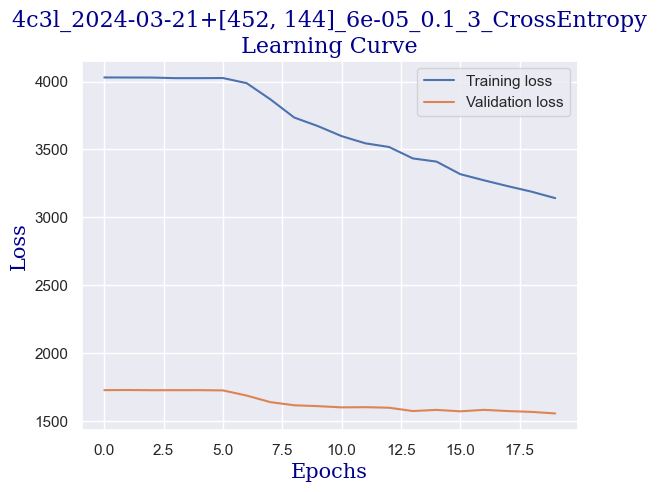

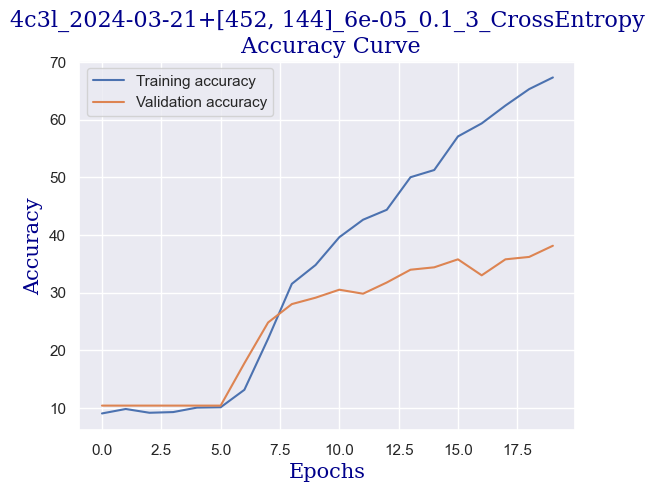

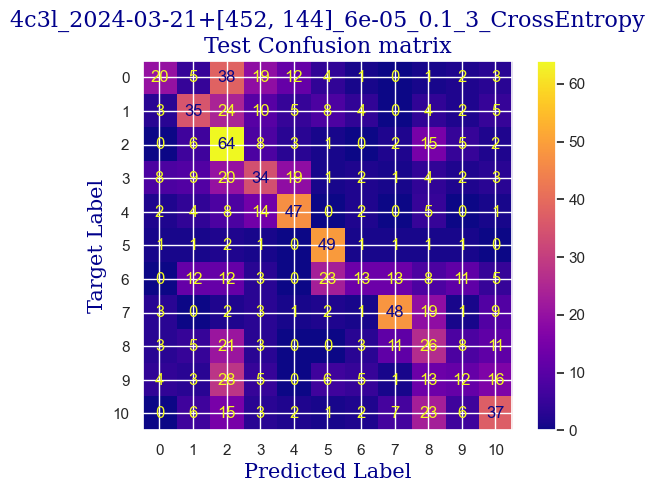

 
 END 4c3l [452, 144] Run Time:  5265.2745771659975
Model:  4c3l  idx: 0 / 1
resolution:  [452, 144]   idx: 0 / 7
learning rate:  6e-05   idx: 1 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.2   idx: 2 / 3
seed:  8   idx:  0 / 3
loss function:  CrossEntropy  idx: 0 / 1
81387.724760114
81375.31424809099
Total epochs: 20


  0%|                                                                                                                        | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  9.339678762641284
validating...


  5%|█████▌                                                                                                          | 1/20 [00:23<07:35, 23.98s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  9.280190362879239
validating...


 10%|███████████▏                                                                                                    | 2/20 [00:48<07:12, 24.03s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  8.74479476502082
validating...


 15%|████████████████▊                                                                                               | 3/20 [01:12<06:49, 24.07s/it]

validation accuracy:  10.540915395284326
Training...
train accuracy:  9.458655562165378
validating...


 20%|██████████████████████▍                                                                                         | 4/20 [01:36<06:26, 24.18s/it]

validation accuracy:  10.540915395284326
Training...
train accuracy:  9.57763236168947
validating...


 25%|████████████████████████████                                                                                    | 5/20 [02:00<06:03, 24.23s/it]

validation accuracy:  10.540915395284326
Training...
train accuracy:  9.280190362879239
validating...


 30%|█████████████████████████████████▌                                                                              | 6/20 [02:25<05:40, 24.30s/it]

validation accuracy:  10.540915395284326
Training...
train accuracy:  9.518143961927423
validating...


 35%|███████████████████████████████████████▏                                                                        | 7/20 [02:49<05:15, 24.30s/it]

validation accuracy:  10.540915395284326
Training...
train accuracy:  9.458655562165378
validating...


 40%|████████████████████████████████████████████▊                                                                   | 8/20 [03:13<04:51, 24.31s/it]

validation accuracy:  10.540915395284326
Training...
train accuracy:  9.637120761451518
validating...


 45%|██████████████████████████████████████████████████▍                                                             | 9/20 [03:38<04:27, 24.30s/it]

validation accuracy:  10.540915395284326
Training...
train accuracy:  9.220701963117191
validating...


 50%|███████████████████████████████████████████████████████▌                                                       | 10/20 [04:02<04:03, 24.32s/it]

validation accuracy:  10.540915395284326
Training...
train accuracy:  9.875074360499703
validating...


 55%|█████████████████████████████████████████████████████████████                                                  | 11/20 [04:26<03:38, 24.33s/it]

validation accuracy:  10.540915395284326
Training...
train accuracy:  9.161213563355146
validating...


 60%|██████████████████████████████████████████████████████████████████▌                                            | 12/20 [04:51<03:14, 24.36s/it]

validation accuracy:  10.540915395284326
Training...
train accuracy:  9.339678762641284
validating...


 65%|████████████████████████████████████████████████████████████████████████▏                                      | 13/20 [05:15<02:50, 24.37s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.648423557406305
validating...


 70%|█████████████████████████████████████████████████████████████████████████████▋                                 | 14/20 [05:40<02:26, 24.35s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.291493158834028
validating...


 75%|███████████████████████████████████████████████████████████████████████████████████▎                           | 15/20 [06:04<02:01, 24.34s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  9.637120761451518
validating...


 80%|████████████████████████████████████████████████████████████████████████████████████████▊                      | 16/20 [06:28<01:37, 24.34s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.113027959547887
validating...


 85%|██████████████████████████████████████████████████████████████████████████████████████████████▎                | 17/20 [06:52<01:13, 24.34s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.291493158834028
validating...


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████▉           | 18/20 [07:17<00:48, 24.33s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.350981558596075
validating...


 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 19/20 [07:41<00:24, 24.35s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.350981558596075
validating...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [08:06<00:00, 24.30s/it]

validation accuracy:  9.153952843273231
Testing...


 
 train acc:  10.350981558596075
 
 val acc:  9.153952843273231
 
 test acc:  9.902912621359224


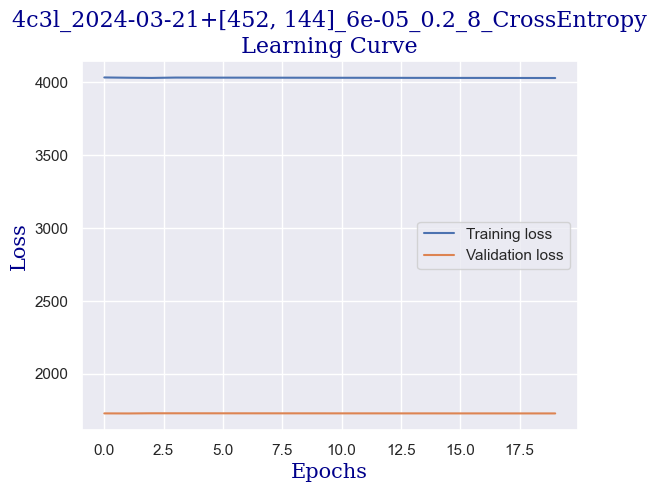

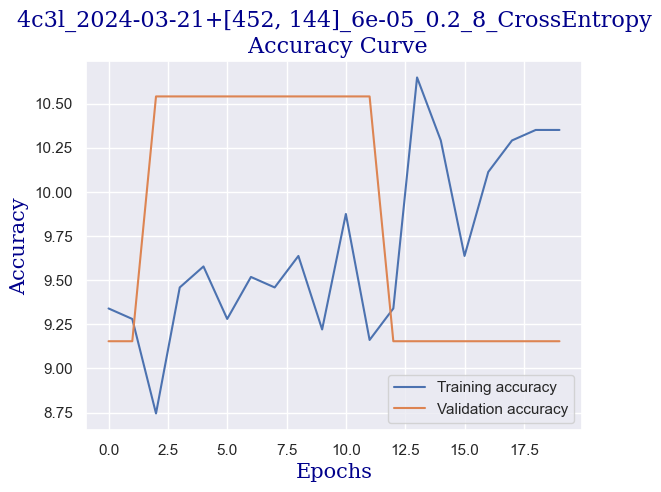

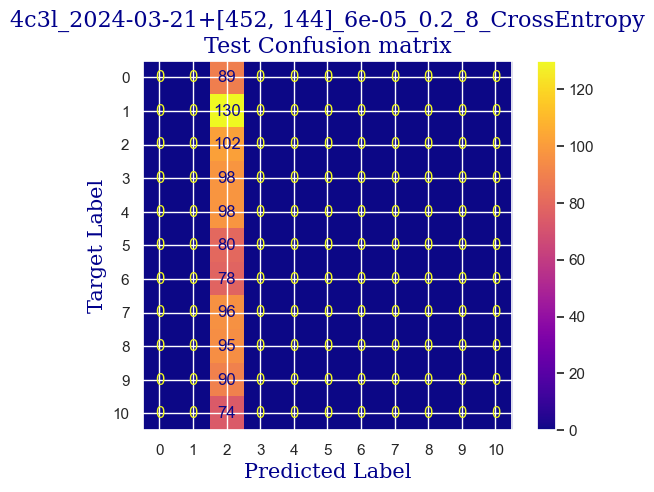

 
 END 4c3l [452, 144] Run Time:  5253.457951183998
Model:  4c3l  idx: 0 / 1
resolution:  [452, 144]   idx: 0 / 7
learning rate:  6e-05   idx: 1 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.2   idx: 2 / 3
seed:  2   idx:  1 / 3
loss function:  CrossEntropy  idx: 0 / 1
86641.183925947
86628.773425365
Total epochs: 20


  0%|                                                                                                                        | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  9.161213563355146
validating...


  5%|█████▌                                                                                                          | 1/20 [00:23<07:34, 23.93s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.648423557406305
validating...


 10%|███████████▏                                                                                                    | 2/20 [00:47<07:11, 23.95s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.648423557406305
validating...


 15%|████████████████▊                                                                                               | 3/20 [01:11<06:47, 23.97s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  11.06484235574063
validating...


 20%|██████████████████████▍                                                                                         | 4/20 [01:36<06:24, 24.04s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.945865556216537
validating...


 25%|████████████████████████████                                                                                    | 5/20 [01:59<06:00, 24.00s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.707911957168353
validating...


 30%|█████████████████████████████████▌                                                                              | 6/20 [02:23<05:36, 24.01s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  11.362284354550862
validating...


 35%|███████████████████████████████████████▏                                                                        | 7/20 [02:48<05:12, 24.02s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  11.183819155264723
validating...


 40%|████████████████████████████████████████████▊                                                                   | 8/20 [03:12<04:48, 24.03s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.529446757882214
validating...


 45%|██████████████████████████████████████████████████▍                                                             | 9/20 [03:36<04:24, 24.03s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  9.934562760261748
validating...


 50%|███████████████████████████████████████████████████████▌                                                       | 10/20 [04:00<04:00, 24.01s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.58893515764426
validating...


 55%|█████████████████████████████████████████████████████████████                                                  | 11/20 [04:24<03:36, 24.02s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.886377156454492
validating...


 60%|██████████████████████████████████████████████████████████████████▌                                            | 12/20 [04:48<03:12, 24.03s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.291493158834028
validating...


 65%|████████████████████████████████████████████████████████████████████████▏                                      | 13/20 [05:12<02:48, 24.01s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  11.481261154074955
validating...


 70%|█████████████████████████████████████████████████████████████████████████████▋                                 | 14/20 [05:36<02:23, 24.00s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.58893515764426
validating...


 75%|███████████████████████████████████████████████████████████████████████████████████▎                           | 15/20 [06:00<01:59, 23.99s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.767400356930398
validating...


 80%|████████████████████████████████████████████████████████████████████████████████████████▊                      | 16/20 [06:24<01:35, 23.98s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.291493158834028
validating...


 85%|██████████████████████████████████████████████████████████████████████████████████████████████▎                | 17/20 [06:48<01:11, 24.00s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  11.124330755502678
validating...


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████▉           | 18/20 [07:12<00:48, 24.02s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.648423557406305
validating...


 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 19/20 [07:36<00:24, 24.02s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.41046995835812
validating...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [08:00<00:00, 24.01s/it]

validation accuracy:  8.599167822468793
Testing...


 
 train acc:  10.41046995835812
 
 val acc:  8.599167822468793
 
 test acc:  9.12621359223301


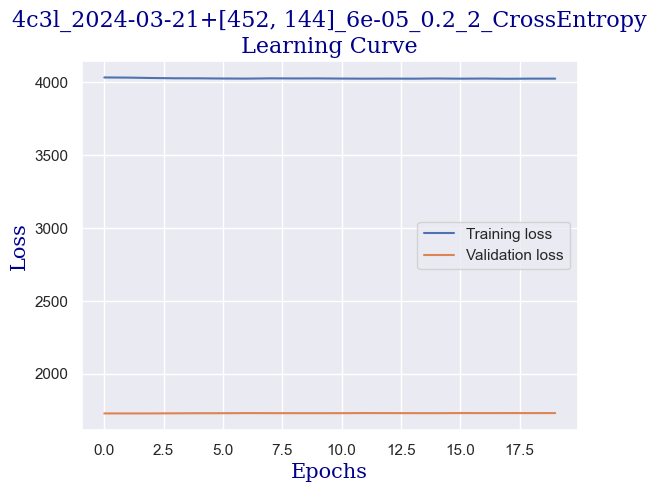

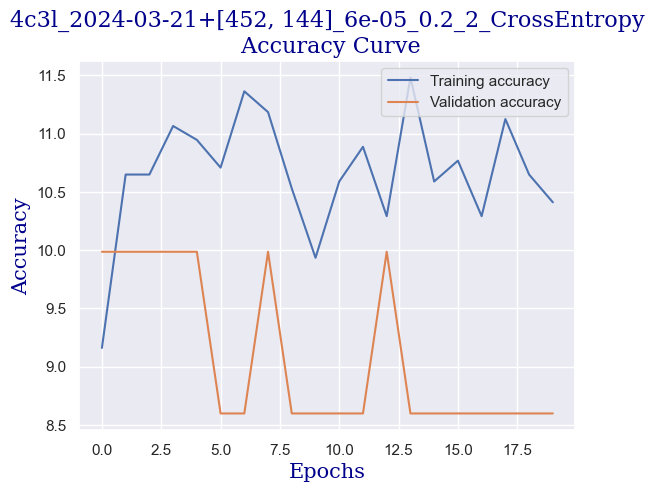

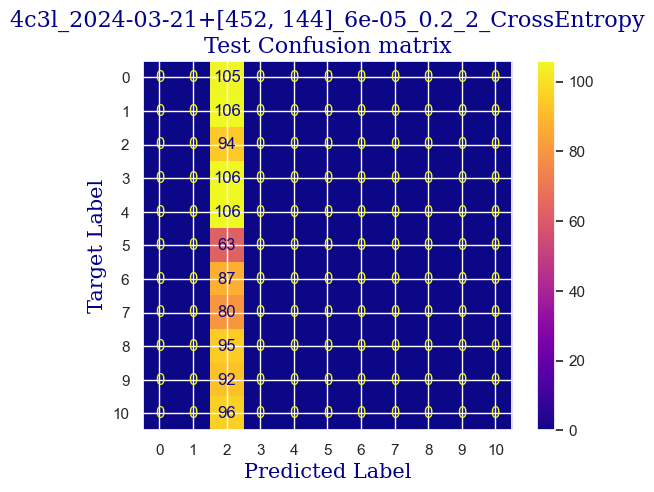

 
 END 4c3l [452, 144] Run Time:  5268.210781280999
Model:  4c3l  idx: 0 / 1
resolution:  [452, 144]   idx: 0 / 7
learning rate:  6e-05   idx: 1 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.2   idx: 2 / 3
seed:  3   idx:  2 / 3
loss function:  CrossEntropy  idx: 0 / 1
91909.396199536
91896.985684491
Total epochs: 20


  0%|                                                                                                                        | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  8.982748364069007
validating...


  5%|█████▌                                                                                                          | 1/20 [00:24<07:36, 24.05s/it]

validation accuracy:  9.57004160887656
Training...
train accuracy:  10.41046995835812
validating...


 10%|███████████▏                                                                                                    | 2/20 [00:47<07:11, 23.98s/it]

validation accuracy:  7.489597780859916
Training...
train accuracy:  11.659726353361094
validating...


 15%|████████████████▊                                                                                               | 3/20 [01:11<06:47, 23.96s/it]

validation accuracy:  12.066574202496533
Training...
train accuracy:  17.013682331945272
validating...


 20%|██████████████████████▍                                                                                         | 4/20 [01:35<06:23, 23.99s/it]

validation accuracy:  19.14008321775312
Training...
train accuracy:  22.248661511005356
validating...


 25%|████████████████████████████                                                                                    | 5/20 [01:59<05:59, 23.99s/it]

validation accuracy:  22.607489597780862
Training...
train accuracy:  29.506246281975013
validating...


 30%|█████████████████████████████████▌                                                                              | 6/20 [02:23<05:35, 23.95s/it]

validation accuracy:  27.600554785020805
Training...
train accuracy:  37.001784651992864
validating...


 35%|███████████████████████████████████████▏                                                                        | 7/20 [02:47<05:11, 24.00s/it]

validation accuracy:  30.097087378640776
Training...
train accuracy:  40.3926234384295
validating...


 40%|████████████████████████████████████████████▊                                                                   | 8/20 [03:11<04:48, 24.01s/it]

validation accuracy:  32.038834951456316
Training...
train accuracy:  45.80606781677573
validating...


 45%|██████████████████████████████████████████████████▍                                                             | 9/20 [03:35<04:23, 23.97s/it]

validation accuracy:  32.593619972260754
Training...
train accuracy:  49.97025580011898
validating...


 50%|███████████████████████████████████████████████████████▌                                                       | 10/20 [03:59<03:59, 23.98s/it]

validation accuracy:  36.615811373092924
Training...
train accuracy:  51.99286139202856
validating...


 55%|█████████████████████████████████████████████████████████████                                                  | 11/20 [04:23<03:35, 23.95s/it]

validation accuracy:  36.47711511789182
Training...
train accuracy:  54.01546698393813
validating...


 60%|██████████████████████████████████████████████████████████████████▌                                            | 12/20 [04:47<03:11, 23.95s/it]

validation accuracy:  37.309292649098474
Training...
train accuracy:  55.80011897679953
validating...


 65%|████████████████████████████████████████████████████████████████████████▏                                      | 13/20 [05:11<02:47, 23.94s/it]

validation accuracy:  36.89320388349515
Training...
train accuracy:  57.16835217132659
validating...


 70%|█████████████████████████████████████████████████████████████████████████████▋                                 | 14/20 [05:35<02:23, 23.95s/it]

validation accuracy:  37.7253814147018
Training...
train accuracy:  57.584770969660916
validating...


 75%|███████████████████████████████████████████████████████████████████████████████████▎                           | 15/20 [05:59<01:59, 23.97s/it]

validation accuracy:  37.309292649098474
Training...
train accuracy:  59.96430696014278
validating...


 80%|████████████████████████████████████████████████████████████████████████████████████████▊                      | 16/20 [06:23<01:35, 23.99s/it]

validation accuracy:  38.41886269070735
Training...
train accuracy:  62.581796549672816
validating...


 85%|██████████████████████████████████████████████████████████████████████████████████████████████▎                | 17/20 [06:47<01:11, 23.96s/it]

validation accuracy:  38.28016643550624
Training...
train accuracy:  61.86793575252826
validating...


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████▉           | 18/20 [07:11<00:47, 23.98s/it]

validation accuracy:  40.083217753120664
Training...
train accuracy:  63.652587745389646
validating...


 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 19/20 [07:35<00:23, 23.96s/it]

validation accuracy:  38.55755894590846
Training...
train accuracy:  64.72337894110647
validating...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [07:59<00:00, 23.97s/it]

validation accuracy:  38.141470180305134
Testing...


 
 train acc:  64.72337894110647
 
 val acc:  38.141470180305134
 
 test acc:  36.699029126213595


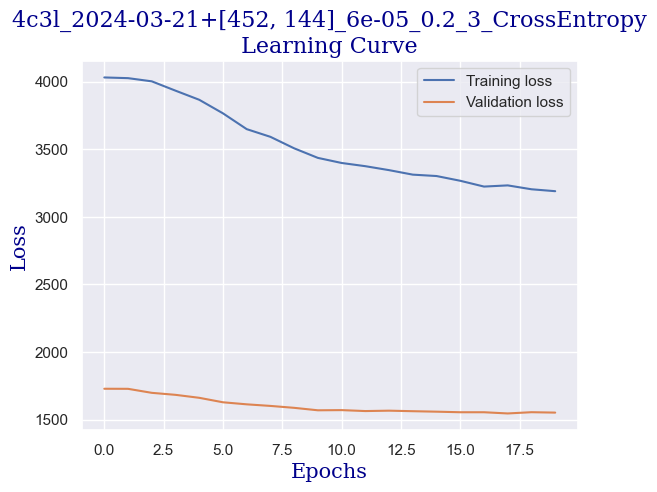

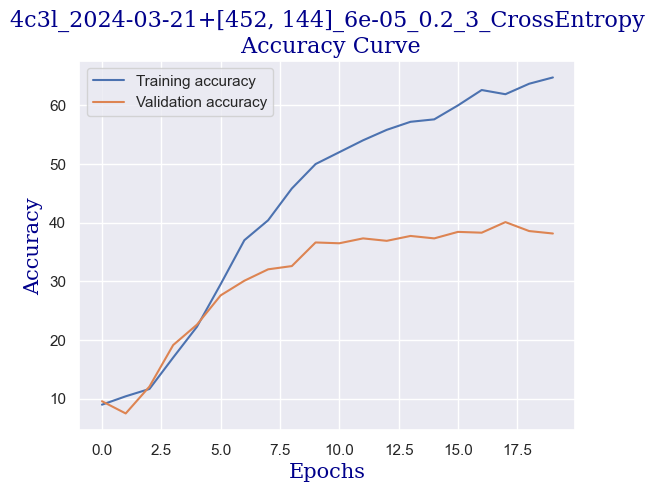

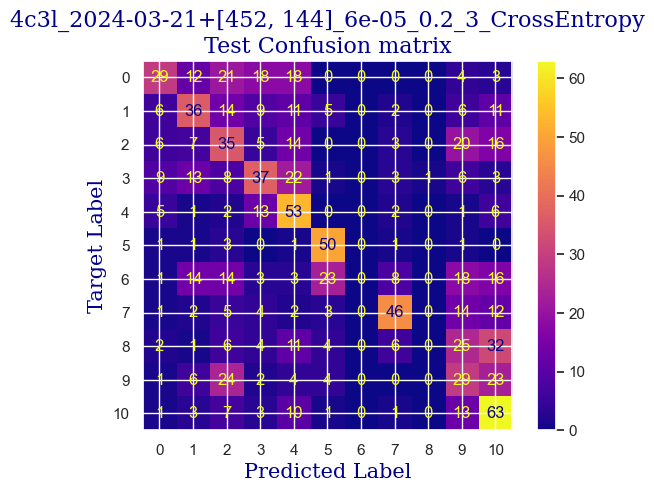

 
 END 4c3l [452, 144] Run Time:  5255.735638323997
Model:  4c3l  idx: 0 / 1
resolution:  [452, 144]   idx: 0 / 7
learning rate:  7e-05   idx: 2 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0   idx: 0 / 3
seed:  8   idx:  0 / 3
loss function:  CrossEntropy  idx: 0 / 1
97165.133319699
97152.722807512
Total epochs: 20


  0%|                                                                                                                        | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  9.280190362879239
validating...


  5%|█████▌                                                                                                          | 1/20 [00:23<07:34, 23.92s/it]

validation accuracy:  8.876560332871012
Training...
train accuracy:  9.994051160023796
validating...


 10%|███████████▏                                                                                                    | 2/20 [00:47<07:10, 23.93s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  9.39916716240333
validating...


 15%|████████████████▊                                                                                               | 3/20 [01:11<06:46, 23.94s/it]

validation accuracy:  15.811373092926493
Training...
train accuracy:  19.214753123140987
validating...


 20%|██████████████████████▍                                                                                         | 4/20 [01:35<06:23, 23.94s/it]

validation accuracy:  24.687933425797503
Training...
train accuracy:  28.61392028554432
validating...


 25%|████████████████████████████                                                                                    | 5/20 [01:59<05:58, 23.93s/it]

validation accuracy:  26.0748959778086
Training...
train accuracy:  36.04997025580012
validating...


 30%|█████████████████████████████████▌                                                                              | 6/20 [02:23<05:34, 23.93s/it]

validation accuracy:  33.287101248266296
Training...
train accuracy:  43.48602022605592
validating...


 35%|███████████████████████████████████████▏                                                                        | 7/20 [02:47<05:11, 23.93s/it]

validation accuracy:  33.56449375866852
Training...
train accuracy:  47.531231409875076
validating...


 40%|████████████████████████████████████████████▊                                                                   | 8/20 [03:11<04:47, 23.95s/it]

validation accuracy:  37.17059639389736
Training...
train accuracy:  52.34979179060083
validating...


 45%|██████████████████████████████████████████████████▍                                                             | 9/20 [03:35<04:23, 23.96s/it]

validation accuracy:  38.00277392510402
Training...
train accuracy:  56.216537775133844
validating...


 50%|███████████████████████████████████████████████████████▌                                                       | 10/20 [03:59<03:59, 23.95s/it]

validation accuracy:  37.03190013869626
Training...
train accuracy:  59.4883997620464
validating...


 55%|█████████████████████████████████████████████████████████████                                                  | 11/20 [04:23<03:35, 23.95s/it]

validation accuracy:  39.1123439667129
Training...
train accuracy:  60.49970255800119
validating...


 60%|██████████████████████████████████████████████████████████████████▌                                            | 12/20 [04:47<03:11, 23.96s/it]

validation accuracy:  38.97364771151179
Training...
train accuracy:  64.78286734086853
validating...


 65%|████████████████████████████████████████████████████████████████████████▏                                      | 13/20 [05:11<02:47, 23.97s/it]

validation accuracy:  39.1123439667129
Training...
train accuracy:  66.80547293277812
validating...


 70%|█████████████████████████████████████████████████████████████████████████████▋                                 | 14/20 [05:35<02:23, 23.96s/it]

validation accuracy:  40.6380027739251
Training...
train accuracy:  69.72040452111838
validating...


 75%|███████████████████████████████████████████████████████████████████████████████████▎                           | 15/20 [05:59<01:59, 23.96s/it]

validation accuracy:  39.25104022191401
Training...
train accuracy:  71.50505651397977
validating...


 80%|████████████████████████████████████████████████████████████████████████████████████████▊                      | 16/20 [06:23<01:35, 23.98s/it]

validation accuracy:  39.1123439667129
Training...
train accuracy:  71.08863771564545
validating...


 85%|██████████████████████████████████████████████████████████████████████████████████████████████▎                | 17/20 [06:47<01:11, 23.97s/it]

validation accuracy:  40.49930651872399
Training...
train accuracy:  73.94408090422367
validating...


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████▉           | 18/20 [07:11<00:47, 23.94s/it]

validation accuracy:  37.586685159500696
Training...
train accuracy:  74.41998810232005
validating...


 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 19/20 [07:35<00:23, 23.95s/it]

validation accuracy:  38.83495145631068
Training...
train accuracy:  75.49077929803688
validating...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [07:58<00:00, 23.95s/it]

validation accuracy:  41.33148404993065
Testing...


 
 train acc:  75.49077929803688
 
 val acc:  41.33148404993065
 
 test acc:  40.873786407766985


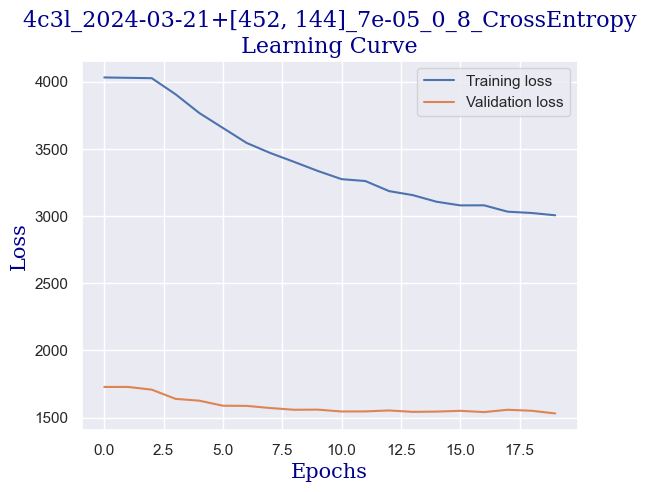

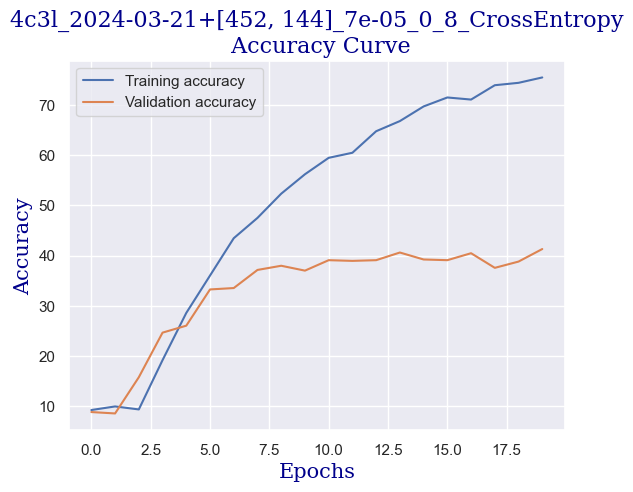

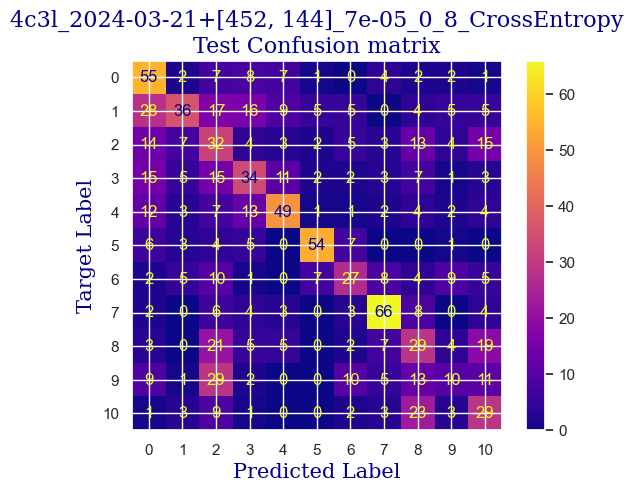

 
 END 4c3l [452, 144] Run Time:  5253.751054039996
Model:  4c3l  idx: 0 / 1
resolution:  [452, 144]   idx: 0 / 7
learning rate:  7e-05   idx: 2 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0   idx: 0 / 3
seed:  2   idx:  1 / 3
loss function:  CrossEntropy  idx: 0 / 1
102418.8856869
102406.475172501
Total epochs: 20


  0%|                                                                                                                        | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  10.707911957168353
validating...


  5%|█████▌                                                                                                          | 1/20 [00:23<07:35, 23.97s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  9.518143961927423
validating...


 10%|███████████▏                                                                                                    | 2/20 [00:47<07:11, 23.99s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  9.875074360499703
validating...


 15%|████████████████▊                                                                                               | 3/20 [01:11<06:47, 24.00s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  9.518143961927423
validating...


 20%|██████████████████████▍                                                                                         | 4/20 [01:36<06:24, 24.03s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.41046995835812
validating...


 25%|████████████████████████████                                                                                    | 5/20 [02:00<06:00, 24.01s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  9.696609161213564
validating...


 30%|█████████████████████████████████▌                                                                              | 6/20 [02:23<05:35, 23.98s/it]

validation accuracy:  10.124826629680998
Training...
train accuracy:  17.549077929803687
validating...


 35%|███████████████████████████████████████▏                                                                        | 7/20 [02:47<05:11, 23.99s/it]

validation accuracy:  19.55617198335645
Training...
train accuracy:  26.531826293872697
validating...


 40%|████████████████████████████████████████████▊                                                                   | 8/20 [03:11<04:47, 23.97s/it]

validation accuracy:  19.972260748959776
Training...
train accuracy:  29.506246281975013
validating...


 45%|██████████████████████████████████████████████████▍                                                             | 9/20 [03:35<04:23, 23.95s/it]

validation accuracy:  25.52011095700416
Training...
train accuracy:  32.480666270077336
validating...


 50%|███████████████████████████████████████████████████████▌                                                       | 10/20 [03:59<03:59, 23.98s/it]

validation accuracy:  26.629680998613036
Training...
train accuracy:  35.27662105889352
validating...


 55%|█████████████████████████████████████████████████████████████                                                  | 11/20 [04:23<03:35, 23.95s/it]

validation accuracy:  26.629680998613036
Training...
train accuracy:  37.775133848899465
validating...


 60%|██████████████████████████████████████████████████████████████████▌                                            | 12/20 [04:47<03:11, 23.96s/it]

validation accuracy:  27.739251040221912
Training...
train accuracy:  39.73825104104699
validating...


 65%|████████████████████████████████████████████████████████████████████████▏                                      | 13/20 [05:11<02:47, 23.96s/it]

validation accuracy:  27.461858529819693
Training...
train accuracy:  40.92801903628792
validating...


 70%|█████████████████████████████████████████████████████████████████████████████▋                                 | 14/20 [05:35<02:23, 23.99s/it]

validation accuracy:  30.79056865464632
Training...
train accuracy:  41.522903033908385
validating...


 75%|███████████████████████████████████████████████████████████████████████████████████▎                           | 15/20 [05:59<01:59, 23.99s/it]

validation accuracy:  28.84882108183079
Training...
train accuracy:  42.653182629387274
validating...


 80%|████████████████████████████████████████████████████████████████████████████████████████▊                      | 16/20 [06:23<01:36, 24.02s/it]

validation accuracy:  28.71012482662968
Training...
train accuracy:  42.77215942891136
validating...


 85%|██████████████████████████████████████████████████████████████████████████████████████████████▎                | 17/20 [06:47<01:12, 24.02s/it]

validation accuracy:  31.06796116504854
Training...
train accuracy:  45.03271861986913
validating...


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████▉           | 18/20 [07:11<00:48, 24.01s/it]

validation accuracy:  32.593619972260754
Training...
train accuracy:  45.746579417013685
validating...


 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 19/20 [07:35<00:23, 23.99s/it]

validation accuracy:  30.651872399445214
Training...
train accuracy:  46.162998215348004
validating...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [07:59<00:00, 23.99s/it]

validation accuracy:  29.958391123439664
Testing...


 
 train acc:  46.162998215348004
 
 val acc:  29.958391123439664
 
 test acc:  32.5242718446602


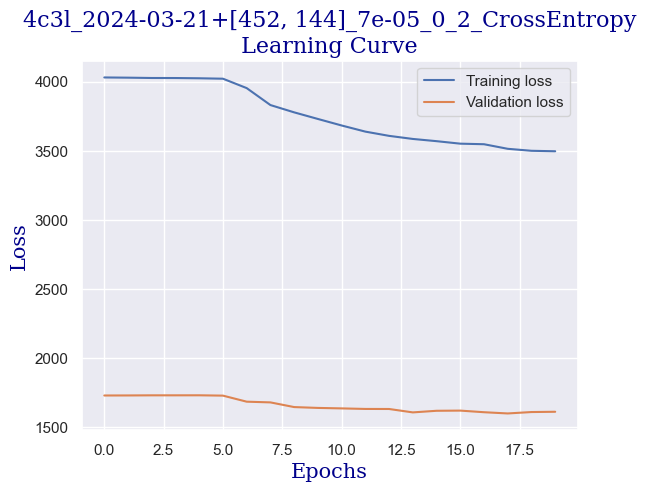

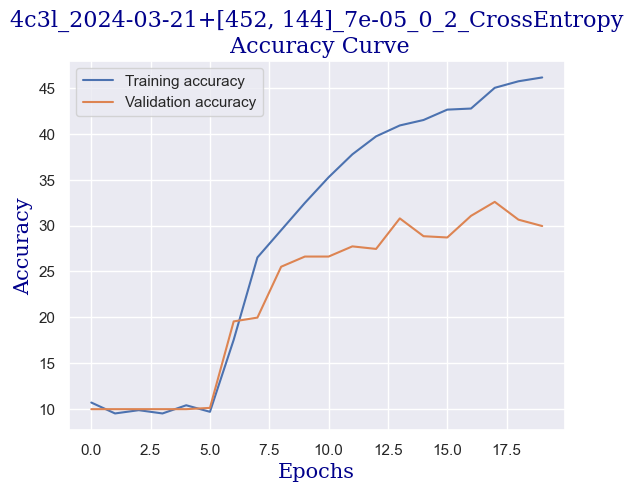

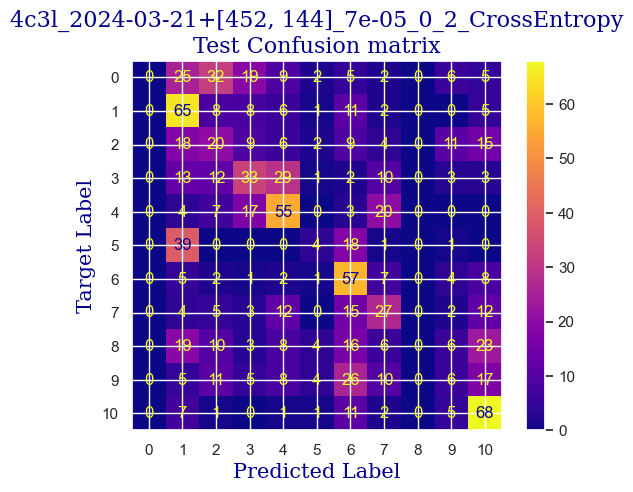

 
 END 4c3l [452, 144] Run Time:  5274.796756689
Model:  4c3l  idx: 0 / 1
resolution:  [452, 144]   idx: 0 / 7
learning rate:  7e-05   idx: 2 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0   idx: 0 / 3
seed:  3   idx:  2 / 3
loss function:  CrossEntropy  idx: 0 / 1
107693.683506216
107681.272992974
Total epochs: 20


  0%|                                                                                                                        | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  8.625817965496728
validating...


  5%|█████▌                                                                                                          | 1/20 [00:24<07:41, 24.26s/it]

validation accuracy:  9.43134535367545
Training...
train accuracy:  8.447352766210589
validating...


 10%|███████████▏                                                                                                    | 2/20 [00:48<07:16, 24.28s/it]

validation accuracy:  9.43134535367545
Training...
train accuracy:  8.923259964306961
validating...


 15%|████████████████▊                                                                                               | 3/20 [01:12<06:53, 24.32s/it]

validation accuracy:  11.511789181692095
Training...
train accuracy:  9.875074360499703
validating...


 20%|██████████████████████▍                                                                                         | 4/20 [01:37<06:28, 24.29s/it]

validation accuracy:  11.511789181692095
Training...
train accuracy:  10.291493158834028
validating...


 25%|████████████████████████████                                                                                    | 5/20 [02:01<06:04, 24.29s/it]

validation accuracy:  11.511789181692095
Training...
train accuracy:  10.469958358120167
validating...


 30%|█████████████████████████████████▌                                                                              | 6/20 [02:25<05:40, 24.30s/it]

validation accuracy:  11.511789181692095
Training...
train accuracy:  10.350981558596075
validating...


 35%|███████████████████████████████████████▏                                                                        | 7/20 [02:50<05:16, 24.32s/it]

validation accuracy:  11.511789181692095
Training...
train accuracy:  10.41046995835812
validating...


 40%|████████████████████████████████████████████▊                                                                   | 8/20 [03:14<04:52, 24.34s/it]

validation accuracy:  11.511789181692095
Training...
train accuracy:  10.58893515764426
validating...


 45%|██████████████████████████████████████████████████▍                                                             | 9/20 [03:38<04:27, 24.36s/it]

validation accuracy:  11.511789181692095
Training...
train accuracy:  10.58893515764426
validating...


 50%|███████████████████████████████████████████████████████▌                                                       | 10/20 [04:03<04:03, 24.35s/it]

validation accuracy:  11.511789181692095
Training...
train accuracy:  10.113027959547887
validating...


 55%|█████████████████████████████████████████████████████████████                                                  | 11/20 [04:27<03:39, 24.35s/it]

validation accuracy:  11.511789181692095
Training...
train accuracy:  10.886377156454492
validating...


 60%|██████████████████████████████████████████████████████████████████▌                                            | 12/20 [04:51<03:14, 24.34s/it]

validation accuracy:  11.511789181692095
Training...
train accuracy:  9.875074360499703
validating...


 65%|████████████████████████████████████████████████████████████████████████▏                                      | 13/20 [05:16<02:50, 24.34s/it]

validation accuracy:  11.511789181692095
Training...
train accuracy:  11.778703152885187
validating...


 70%|█████████████████████████████████████████████████████████████████████████████▋                                 | 14/20 [05:40<02:25, 24.31s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  11.659726353361094
validating...


 75%|███████████████████████████████████████████████████████████████████████████████████▎                           | 15/20 [06:04<02:01, 24.31s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  10.886377156454492
validating...


 80%|████████████████████████████████████████████████████████████████████████████████████████▊                      | 16/20 [06:29<01:37, 24.32s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  10.707911957168353
validating...


 85%|██████████████████████████████████████████████████████████████████████████████████████████████▎                | 17/20 [06:53<01:13, 24.34s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  11.005353955978585
validating...


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████▉           | 18/20 [07:17<00:48, 24.35s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  10.707911957168353
validating...


 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 19/20 [07:42<00:24, 24.34s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  10.469958358120167
validating...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [08:06<00:00, 24.33s/it]

validation accuracy:  10.402219140083217
Testing...


 
 train acc:  10.469958358120167
 
 val acc:  10.402219140083217
 
 test acc:  8.058252427184467


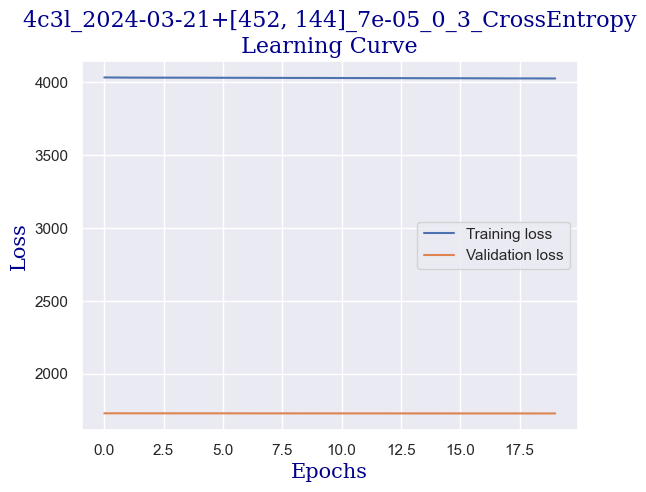

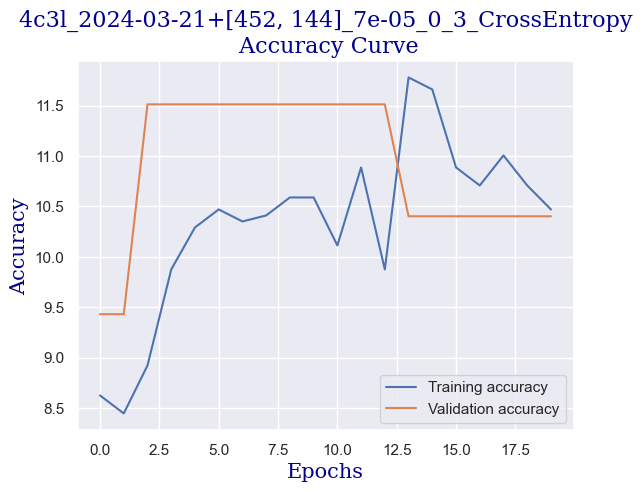

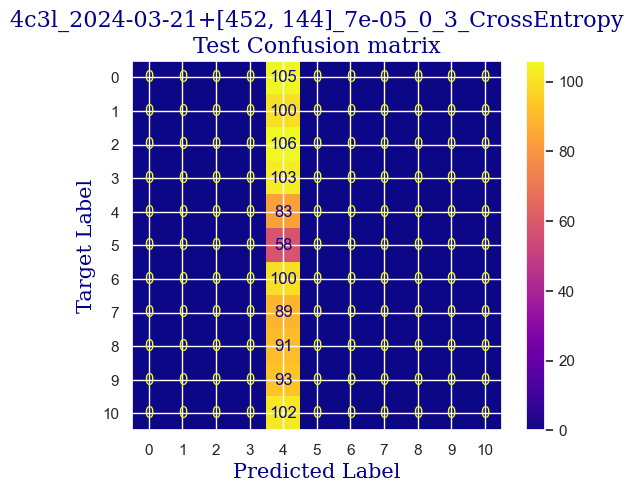

 
 END 4c3l [452, 144] Run Time:  5247.483538307002
Model:  4c3l  idx: 0 / 1
resolution:  [452, 144]   idx: 0 / 7
learning rate:  7e-05   idx: 2 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.1   idx: 1 / 3
seed:  8   idx:  0 / 3
loss function:  CrossEntropy  idx: 0 / 1
112941.168279232
112928.757764895
Total epochs: 20


  0%|                                                                                                                        | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  8.923259964306961
validating...


  5%|█████▌                                                                                                          | 1/20 [00:23<07:33, 23.89s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  9.637120761451518
validating...


 10%|███████████▏                                                                                                    | 2/20 [00:47<07:10, 23.94s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.172516359309935
validating...


 15%|████████████████▊                                                                                               | 3/20 [01:11<06:47, 23.96s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  9.994051160023796
validating...


 20%|██████████████████████▍                                                                                         | 4/20 [01:35<06:23, 23.97s/it]

validation accuracy:  15.117891816920942
Training...
train accuracy:  16.061867935752527
validating...


 25%|████████████████████████████                                                                                    | 5/20 [01:59<05:59, 23.96s/it]

validation accuracy:  19.55617198335645
Training...
train accuracy:  22.248661511005356
validating...


 30%|█████████████████████████████████▌                                                                              | 6/20 [02:23<05:36, 24.00s/it]

validation accuracy:  25.24271844660194
Training...
train accuracy:  27.959547888161808
validating...


 35%|███████████████████████████████████████▏                                                                        | 7/20 [02:47<05:11, 23.99s/it]

validation accuracy:  24.410540915395284
Training...
train accuracy:  32.83759666864962
validating...


 40%|████████████████████████████████████████████▊                                                                   | 8/20 [03:11<04:47, 23.98s/it]

validation accuracy:  25.65880721220527
Training...
train accuracy:  35.217132659131465
validating...


 45%|██████████████████████████████████████████████████▍                                                             | 9/20 [03:35<04:23, 23.95s/it]

validation accuracy:  25.79750346740638
Training...
train accuracy:  36.52587745389649
validating...


 50%|███████████████████████████████████████████████████████▌                                                       | 10/20 [03:59<03:59, 23.98s/it]

validation accuracy:  27.877947295423024
Training...
train accuracy:  39.26234384295063
validating...


 55%|█████████████████████████████████████████████████████████████                                                  | 11/20 [04:23<03:35, 23.96s/it]

validation accuracy:  27.323162274618586
Training...
train accuracy:  39.73825104104699
validating...


 60%|██████████████████████████████████████████████████████████████████▌                                            | 12/20 [04:47<03:11, 23.96s/it]

validation accuracy:  28.01664355062413
Training...
train accuracy:  42.9506246281975
validating...


 65%|████████████████████████████████████████████████████████████████████████▏                                      | 13/20 [05:11<02:47, 23.99s/it]

validation accuracy:  30.235783633841883
Training...
train accuracy:  45.627602617489586
validating...


 70%|█████████████████████████████████████████████████████████████████████████████▋                                 | 14/20 [05:35<02:24, 24.01s/it]

validation accuracy:  29.542302357836338
Training...
train accuracy:  48.24509220701963
validating...


 75%|███████████████████████████████████████████████████████████████████████████████████▎                           | 15/20 [05:59<01:59, 23.99s/it]

validation accuracy:  30.929264909847433
Training...
train accuracy:  50.02974419988102
validating...


 80%|████████████████████████████████████████████████████████████████████████████████████████▊                      | 16/20 [06:23<01:36, 24.00s/it]

validation accuracy:  32.17753120665742
Training...
train accuracy:  52.58774538964902
validating...


 85%|██████████████████████████████████████████████████████████████████████████████████████████████▎                | 17/20 [06:47<01:11, 23.97s/it]

validation accuracy:  31.206657420249652
Training...
train accuracy:  54.43188578227246
validating...


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████▉           | 18/20 [07:11<00:47, 23.99s/it]

validation accuracy:  33.980582524271846
Training...
train accuracy:  58.477096966091615
validating...


 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 19/20 [07:35<00:23, 23.98s/it]

validation accuracy:  30.513176144244103
Training...
train accuracy:  59.60737656157049
validating...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [07:59<00:00, 23.97s/it]

validation accuracy:  35.367545076282944
Testing...


 
 train acc:  59.60737656157049
 
 val acc:  35.367545076282944
 
 test acc:  34.95145631067961


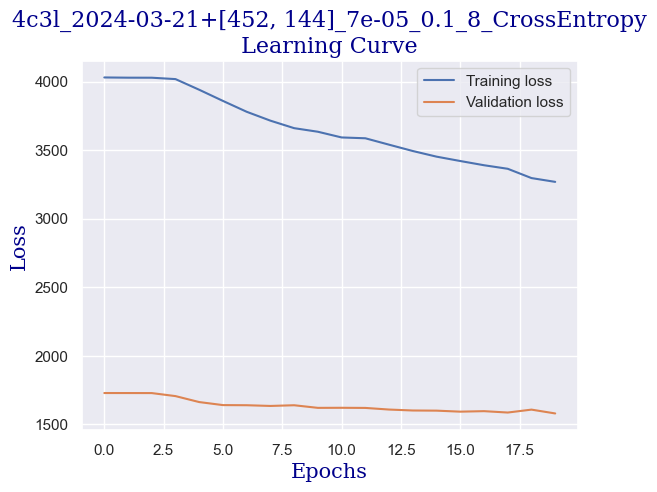

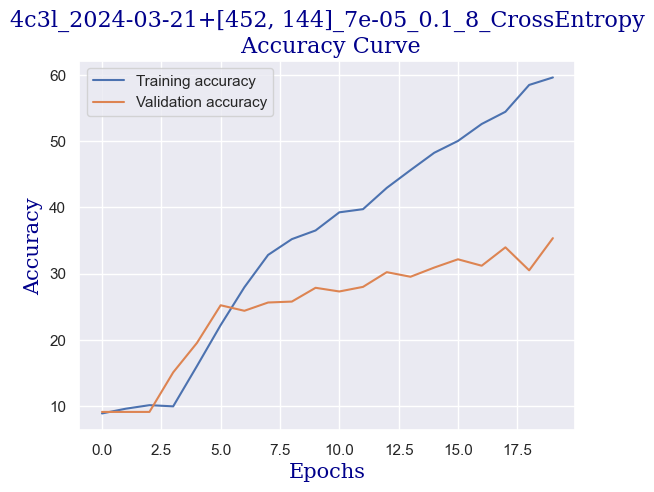

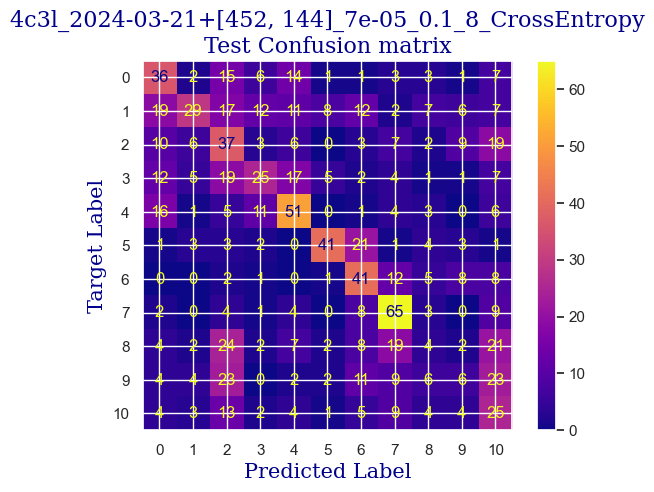

 
 END 4c3l [452, 144] Run Time:  5261.288073325995
Model:  4c3l  idx: 0 / 1
resolution:  [452, 144]   idx: 0 / 7
learning rate:  7e-05   idx: 2 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.1   idx: 1 / 3
seed:  2   idx:  1 / 3
loss function:  CrossEntropy  idx: 0 / 1
118202.457710297
118190.047199914
Total epochs: 20


  0%|                                                                                                                        | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  9.57763236168947
validating...


  5%|█████▌                                                                                                          | 1/20 [00:24<07:36, 24.02s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  9.815585960737657
validating...


 10%|███████████▏                                                                                                    | 2/20 [00:48<07:12, 24.02s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.291493158834028
validating...


 15%|████████████████▊                                                                                               | 3/20 [01:11<06:47, 23.98s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.053539559785841
validating...


 20%|██████████████████████▍                                                                                         | 4/20 [01:35<06:23, 23.94s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.886377156454492
validating...


 25%|████████████████████████████                                                                                    | 5/20 [01:59<05:59, 23.95s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  11.124330755502678
validating...


 30%|█████████████████████████████████▌                                                                              | 6/20 [02:23<05:35, 23.99s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  11.302795954788817
validating...


 35%|███████████████████████████████████████▏                                                                        | 7/20 [02:48<05:12, 24.03s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  11.540749553837001
validating...


 40%|████████████████████████████████████████████▊                                                                   | 8/20 [03:12<04:48, 24.02s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.707911957168353
validating...


 45%|██████████████████████████████████████████████████▍                                                             | 9/20 [03:36<04:24, 24.02s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  9.75609756097561
validating...


 50%|███████████████████████████████████████████████████████▌                                                       | 10/20 [04:00<04:00, 24.08s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  11.124330755502678
validating...


 55%|█████████████████████████████████████████████████████████████                                                  | 11/20 [04:24<03:36, 24.07s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  9.994051160023796
validating...


 60%|██████████████████████████████████████████████████████████████████▌                                            | 12/20 [04:48<03:12, 24.05s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  11.24330755502677
validating...


 65%|████████████████████████████████████████████████████████████████████████▏                                      | 13/20 [05:12<02:48, 24.02s/it]

validation accuracy:  8.460471567267684
Training...
train accuracy:  11.302795954788817
validating...


 70%|█████████████████████████████████████████████████████████████████████████████▋                                 | 14/20 [05:36<02:23, 24.00s/it]

validation accuracy:  8.460471567267684
Training...
train accuracy:  10.291493158834028
validating...


 75%|███████████████████████████████████████████████████████████████████████████████████▎                           | 15/20 [06:00<01:59, 23.95s/it]

validation accuracy:  10.263522884882107
Training...
train accuracy:  15.466983938132065
validating...


 80%|████████████████████████████████████████████████████████████████████████████████████████▊                      | 16/20 [06:23<01:35, 23.95s/it]

validation accuracy:  16.08876560332871
Training...
train accuracy:  20.939916716240333
validating...


 85%|██████████████████████████████████████████████████████████████████████████████████████████████▎                | 17/20 [06:48<01:11, 23.98s/it]

validation accuracy:  19.83356449375867
Training...
train accuracy:  25.520523497917907
validating...


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████▉           | 18/20 [07:12<00:48, 24.02s/it]

validation accuracy:  23.300970873786408
Training...
train accuracy:  29.268292682926827
validating...


 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 19/20 [07:36<00:24, 24.02s/it]

validation accuracy:  23.578363384188627
Training...
train accuracy:  30.57703747769185
validating...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [08:00<00:00, 24.01s/it]

validation accuracy:  25.52011095700416
Testing...


 
 train acc:  30.57703747769185
 
 val acc:  25.52011095700416
 
 test acc:  22.718446601941746


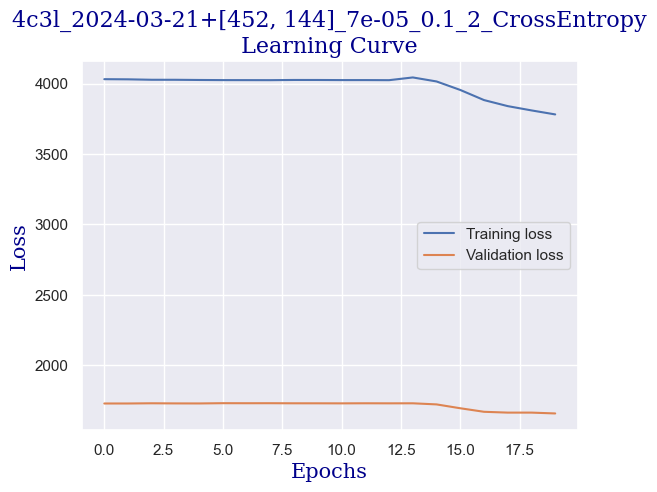

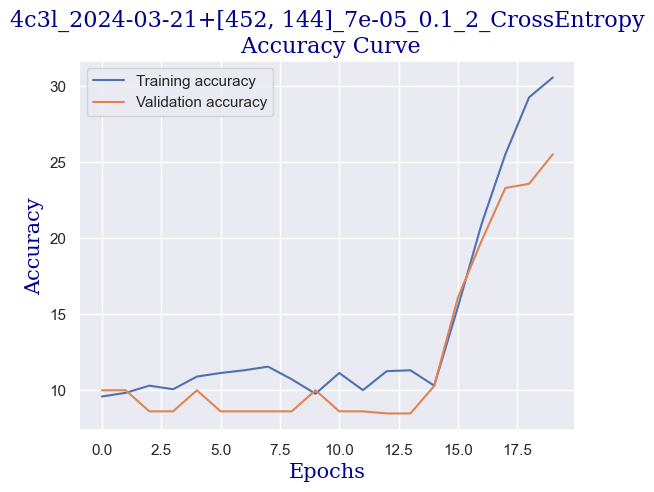

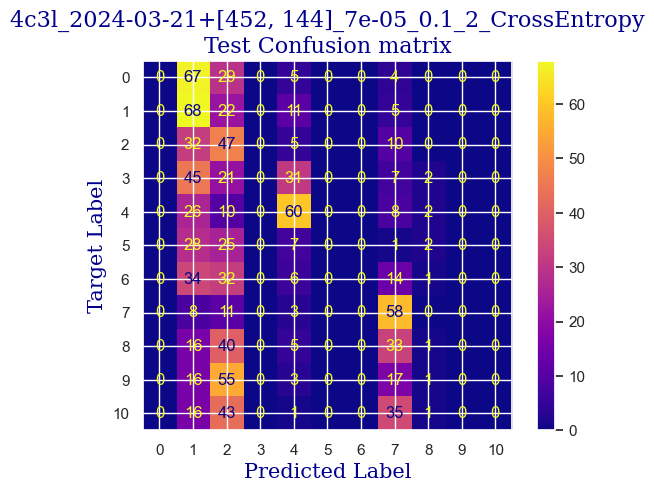

 
 END 4c3l [452, 144] Run Time:  5270.407193516992
Model:  4c3l  idx: 0 / 1
resolution:  [452, 144]   idx: 0 / 7
learning rate:  7e-05   idx: 2 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.1   idx: 1 / 3
seed:  3   idx:  2 / 3
loss function:  CrossEntropy  idx: 0 / 1
123472.866382754
123460.455868361
Total epochs: 20


  0%|                                                                                                                        | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  10.350981558596075
validating...


  5%|█████▌                                                                                                          | 1/20 [00:24<07:37, 24.07s/it]

validation accuracy:  11.511789181692095
Training...
train accuracy:  9.696609161213564
validating...


 10%|███████████▏                                                                                                    | 2/20 [00:47<07:11, 23.97s/it]

validation accuracy:  11.511789181692095
Training...
train accuracy:  10.58893515764426
validating...


 15%|████████████████▊                                                                                               | 3/20 [01:11<06:46, 23.92s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  10.113027959547887
validating...


 20%|██████████████████████▍                                                                                         | 4/20 [01:35<06:23, 23.96s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  11.005353955978585
validating...


 25%|████████████████████████████                                                                                    | 5/20 [01:59<05:59, 23.99s/it]

validation accuracy:  14.424410540915394
Training...
train accuracy:  15.942891136228434
validating...


 30%|█████████████████████████████████▌                                                                              | 6/20 [02:24<05:36, 24.03s/it]

validation accuracy:  16.78224687933426
Training...
train accuracy:  21.058893515764428
validating...


 35%|███████████████████████████████████████▏                                                                        | 7/20 [02:47<05:12, 24.01s/it]

validation accuracy:  27.184466019417474
Training...
train accuracy:  29.38726948245092
validating...


 40%|████████████████████████████████████████████▊                                                                   | 8/20 [03:11<04:47, 23.98s/it]

validation accuracy:  26.49098474341193
Training...
train accuracy:  31.112433075550268
validating...


 45%|██████████████████████████████████████████████████▍                                                             | 9/20 [03:35<04:24, 24.00s/it]

validation accuracy:  26.629680998613036
Training...
train accuracy:  35.03866745984533
validating...


 50%|███████████████████████████████████████████████████████▌                                                       | 10/20 [04:00<04:00, 24.03s/it]

validation accuracy:  27.461858529819693
Training...
train accuracy:  36.16894705532421
validating...


 55%|█████████████████████████████████████████████████████████████                                                  | 11/20 [04:24<03:36, 24.04s/it]

validation accuracy:  28.57142857142857
Training...
train accuracy:  37.59666864961332
validating...


 60%|██████████████████████████████████████████████████████████████████▌                                            | 12/20 [04:48<03:12, 24.04s/it]

validation accuracy:  28.84882108183079
Training...
train accuracy:  39.559785841760856
validating...


 65%|████████████████████████████████████████████████████████████████████████▏                                      | 13/20 [05:12<02:48, 24.03s/it]

validation accuracy:  30.513176144244103
Training...
train accuracy:  41.22546103509816
validating...


 70%|█████████████████████████████████████████████████████████████████████████████▋                                 | 14/20 [05:36<02:24, 24.00s/it]

validation accuracy:  29.542302357836338
Training...
train accuracy:  43.307555026769776
validating...


 75%|███████████████████████████████████████████████████████████████████████████████████▎                           | 15/20 [06:00<01:59, 24.00s/it]

validation accuracy:  30.79056865464632
Training...
train accuracy:  45.33016061867936
validating...


 80%|████████████████████████████████████████████████████████████████████████████████████████▊                      | 16/20 [06:24<01:36, 24.03s/it]

validation accuracy:  31.206657420249652
Training...
train accuracy:  47.11481261154075
validating...


 85%|██████████████████████████████████████████████████████████████████████████████████████████████▎                | 17/20 [06:48<01:11, 23.99s/it]

validation accuracy:  31.484049930651874
Training...
train accuracy:  48.066627007733494
validating...


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████▉           | 18/20 [07:12<00:47, 23.99s/it]

validation accuracy:  31.761442441054093
Training...
train accuracy:  49.851279000594886
validating...


 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 19/20 [07:36<00:23, 23.99s/it]

validation accuracy:  34.39667128987517
Training...
train accuracy:  52.58774538964902
validating...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [08:00<00:00, 24.00s/it]

validation accuracy:  33.42579750346741
Testing...


 
 train acc:  52.58774538964902
 
 val acc:  33.42579750346741
 
 test acc:  32.9126213592233


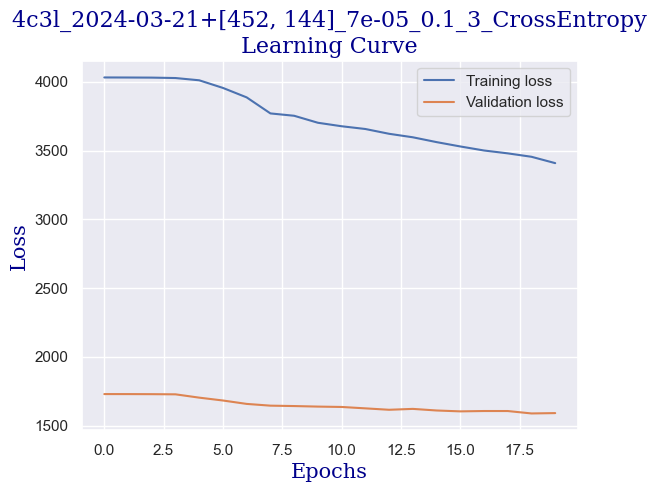

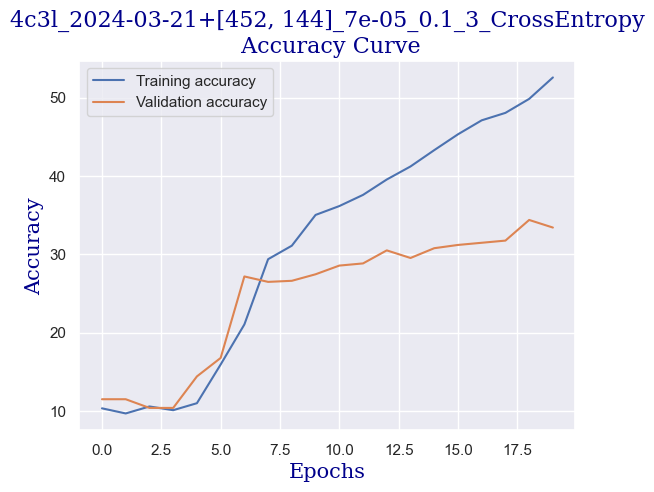

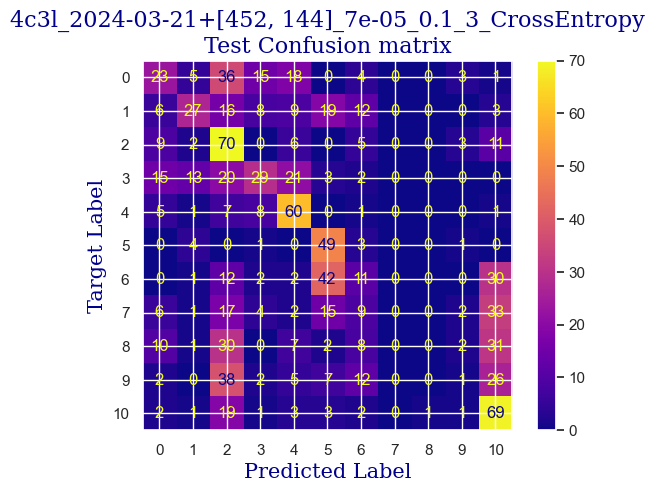

 
 END 4c3l [452, 144] Run Time:  5265.764109415002
Model:  4c3l  idx: 0 / 1
resolution:  [452, 144]   idx: 0 / 7
learning rate:  7e-05   idx: 2 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.2   idx: 2 / 3
seed:  8   idx:  0 / 3
loss function:  CrossEntropy  idx: 0 / 1
128738.631791549
128726.22127652599
Total epochs: 20


  0%|                                                                                                                        | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  9.1017251635931
validating...


  5%|█████▌                                                                                                          | 1/20 [00:23<07:35, 23.95s/it]

validation accuracy:  9.70873786407767
Training...
train accuracy:  9.75609756097561
validating...


 10%|███████████▏                                                                                                    | 2/20 [00:47<07:12, 24.00s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  9.57763236168947
validating...


 15%|████████████████▊                                                                                               | 3/20 [01:12<06:48, 24.03s/it]

validation accuracy:  10.540915395284326
Training...
train accuracy:  9.57763236168947
validating...


 20%|██████████████████████▍                                                                                         | 4/20 [01:36<06:24, 24.00s/it]

validation accuracy:  10.540915395284326
Training...
train accuracy:  9.518143961927423
validating...


 25%|████████████████████████████                                                                                    | 5/20 [01:59<05:59, 23.97s/it]

validation accuracy:  14.701803051317613
Training...
train accuracy:  14.634146341463413
validating...


 30%|█████████████████████████████████▌                                                                              | 6/20 [02:23<05:35, 23.99s/it]

validation accuracy:  18.8626907073509
Training...
train accuracy:  21.35633551457466
validating...


 35%|███████████████████████████████████████▏                                                                        | 7/20 [02:47<05:12, 24.00s/it]

validation accuracy:  22.74618585298197
Training...
train accuracy:  24.09280190362879
validating...


 40%|████████████████████████████████████████████▊                                                                   | 8/20 [03:11<04:48, 24.01s/it]

validation accuracy:  25.381414701803052
Training...
train accuracy:  29.44675788221297
validating...


 45%|██████████████████████████████████████████████████▍                                                             | 9/20 [03:35<04:23, 23.97s/it]

validation accuracy:  25.52011095700416
Training...
train accuracy:  32.00475907198096
validating...


 50%|███████████████████████████████████████████████████████▌                                                       | 10/20 [03:59<03:59, 23.98s/it]

validation accuracy:  27.877947295423024
Training...
train accuracy:  33.0755502676978
validating...


 55%|█████████████████████████████████████████████████████████████                                                  | 11/20 [04:23<03:35, 23.97s/it]

validation accuracy:  30.097087378640776
Training...
train accuracy:  34.56276026174896
validating...


 60%|██████████████████████████████████████████████████████████████████▌                                            | 12/20 [04:47<03:12, 24.00s/it]

validation accuracy:  30.097087378640776
Training...
train accuracy:  37.35871505056514
validating...


 65%|████████████████████████████████████████████████████████████████████████▏                                      | 13/20 [05:11<02:48, 24.00s/it]

validation accuracy:  31.761442441054093
Training...
train accuracy:  38.19155264723379
validating...


 70%|█████████████████████████████████████████████████████████████████████████████▋                                 | 14/20 [05:35<02:24, 24.02s/it]

validation accuracy:  31.761442441054093
Training...
train accuracy:  40.69006543723974
validating...


 75%|███████████████████████████████████████████████████████████████████████████████████▎                           | 15/20 [05:59<02:00, 24.02s/it]

validation accuracy:  33.56449375866852
Training...
train accuracy:  41.4039262343843
validating...


 80%|████████████████████████████████████████████████████████████████████████████████████████▊                      | 16/20 [06:23<01:35, 23.99s/it]

validation accuracy:  35.09015256588072
Training...
train accuracy:  43.90243902439025
validating...


 85%|██████████████████████████████████████████████████████████████████████████████████████████████▎                | 17/20 [06:47<01:11, 23.98s/it]

validation accuracy:  36.1997226074896
Training...
train accuracy:  47.76918500892326
validating...


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████▉           | 18/20 [07:11<00:47, 23.98s/it]

validation accuracy:  37.309292649098474
Training...
train accuracy:  51.93337299226651
validating...


 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 19/20 [07:35<00:23, 23.98s/it]

validation accuracy:  40.49930651872399
Training...
train accuracy:  55.68114217727543
validating...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [07:59<00:00, 23.99s/it]

validation accuracy:  38.28016643550624
Testing...


 
 train acc:  55.68114217727543
 
 val acc:  38.28016643550624
 
 test acc:  37.37864077669903


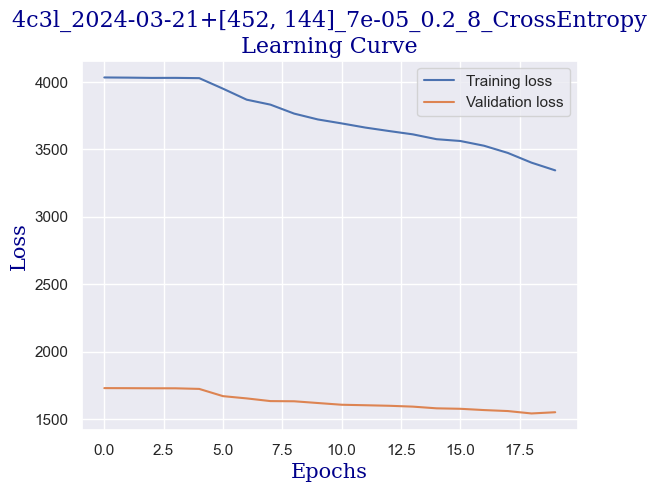

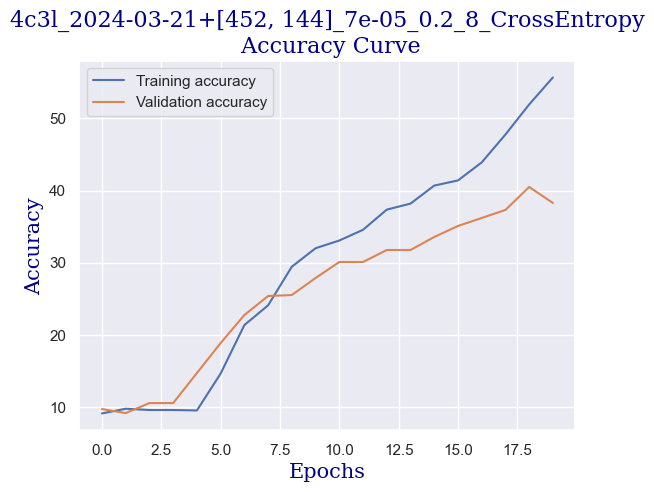

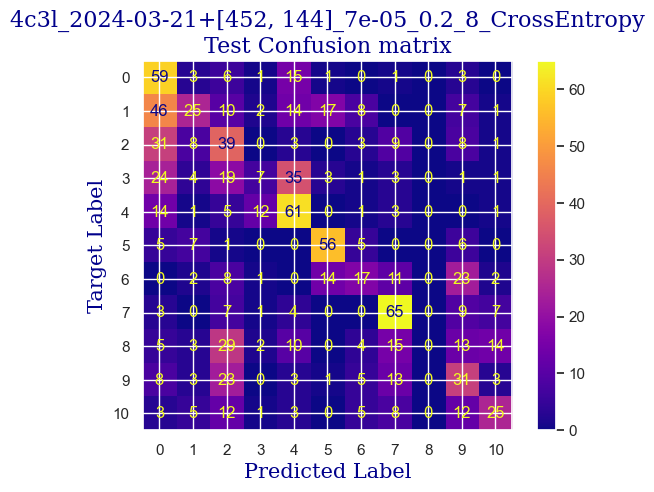

 
 END 4c3l [452, 144] Run Time:  5271.158113171987
Model:  4c3l  idx: 0 / 1
resolution:  [452, 144]   idx: 0 / 7
learning rate:  7e-05   idx: 2 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.2   idx: 2 / 3
seed:  2   idx:  1 / 3
loss function:  CrossEntropy  idx: 0 / 1
134009.791145573
133997.380630928
Total epochs: 20


  0%|                                                                                                                        | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  8.625817965496728
validating...


  5%|█████▌                                                                                                          | 1/20 [00:23<07:34, 23.93s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  9.161213563355146
validating...


 10%|███████████▏                                                                                                    | 2/20 [00:47<07:11, 23.98s/it]

validation accuracy:  10.679611650485436
Training...
train accuracy:  9.458655562165378
validating...


 15%|████████████████▊                                                                                               | 3/20 [01:11<06:47, 23.94s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  9.1017251635931
validating...


 20%|██████████████████████▍                                                                                         | 4/20 [01:35<06:23, 23.99s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.767400356930398
validating...


 25%|████████████████████████████                                                                                    | 5/20 [01:59<05:59, 24.00s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.291493158834028
validating...


 30%|█████████████████████████████████▌                                                                              | 6/20 [02:23<05:36, 24.01s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  11.540749553837001
validating...


 35%|███████████████████████████████████████▏                                                                        | 7/20 [02:47<05:12, 24.01s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  11.302795954788817
validating...


 40%|████████████████████████████████████████████▊                                                                   | 8/20 [03:11<04:47, 23.98s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  11.957168352171326
validating...


 45%|██████████████████████████████████████████████████▍                                                             | 9/20 [03:35<04:23, 23.99s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  18.32242712671029
validating...


 50%|███████████████████████████████████████████████████████▌                                                       | 10/20 [03:59<03:59, 23.98s/it]

validation accuracy:  20.388349514563107
Training...
train accuracy:  27.840571088637716
validating...


 55%|█████████████████████████████████████████████████████████████                                                  | 11/20 [04:23<03:35, 23.98s/it]

validation accuracy:  25.52011095700416
Training...
train accuracy:  33.72992266508031
validating...


 60%|██████████████████████████████████████████████████████████████████▌                                            | 12/20 [04:47<03:11, 23.99s/it]

validation accuracy:  25.79750346740638
Training...
train accuracy:  37.120761451516955
validating...


 65%|████████████████████████████████████████████████████████████████████████▏                                      | 13/20 [05:11<02:48, 24.01s/it]

validation accuracy:  32.038834951456316
Training...
train accuracy:  40.749553837001784
validating...


 70%|█████████████████████████████████████████████████████████████████████████████▋                                 | 14/20 [05:35<02:24, 24.01s/it]

validation accuracy:  33.980582524271846
Training...
train accuracy:  43.66448542534206
validating...


 75%|███████████████████████████████████████████████████████████████████████████████████▎                           | 15/20 [05:59<01:59, 23.99s/it]

validation accuracy:  23.02357836338419
Training...
train accuracy:  46.87685901249257
validating...


 80%|████████████████████████████████████████████████████████████████████████████████████████▊                      | 16/20 [06:23<01:36, 24.01s/it]

validation accuracy:  33.841886269070734
Training...
train accuracy:  50.86258179654968
validating...


 85%|██████████████████████████████████████████████████████████████████████████████████████████████▎                | 17/20 [06:47<01:11, 24.00s/it]

validation accuracy:  36.754507628294036
Training...
train accuracy:  53.24211778703153
validating...


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████▉           | 18/20 [07:11<00:47, 24.00s/it]

validation accuracy:  35.50624133148405
Training...
train accuracy:  54.729327781082695
validating...


 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 19/20 [07:35<00:24, 24.03s/it]

validation accuracy:  37.17059639389736
Training...
train accuracy:  56.69244497323022
validating...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [07:59<00:00, 24.00s/it]

validation accuracy:  38.55755894590846
Testing...


 
 train acc:  56.69244497323022
 
 val acc:  38.55755894590846
 
 test acc:  33.980582524271846


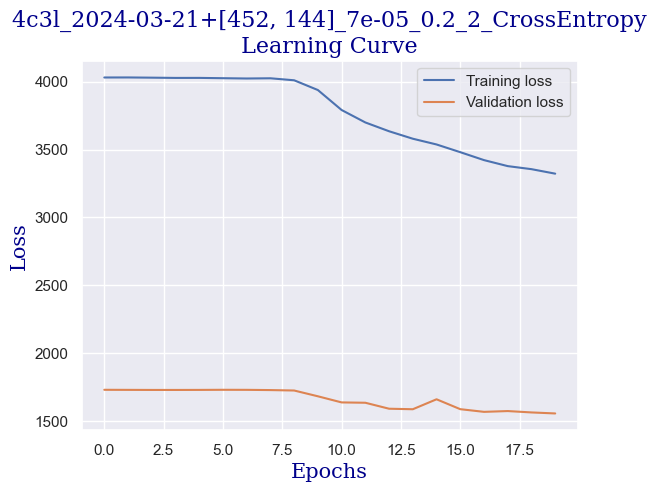

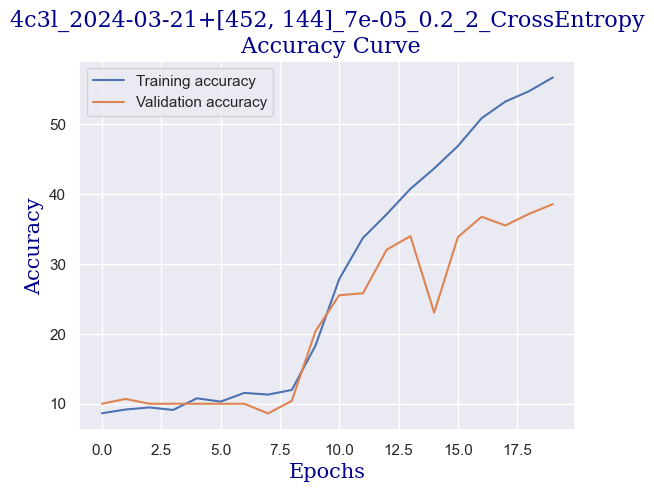

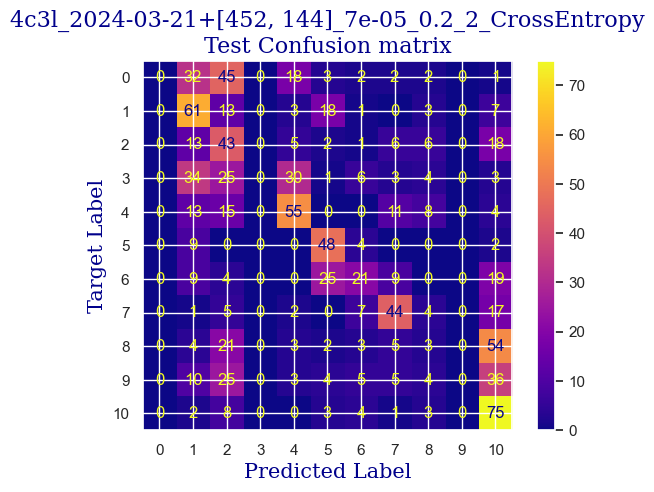

 
 END 4c3l [452, 144] Run Time:  5266.249815214018
Model:  4c3l  idx: 0 / 1
resolution:  [452, 144]   idx: 0 / 7
learning rate:  7e-05   idx: 2 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.2   idx: 2 / 3
seed:  3   idx:  2 / 3
loss function:  CrossEntropy  idx: 0 / 1
139276.042293465
139263.631777711
Total epochs: 20


  0%|                                                                                                                        | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  10.529446757882214
validating...


  5%|█████▌                                                                                                          | 1/20 [00:23<07:35, 24.00s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  10.707911957168353
validating...


 10%|███████████▏                                                                                                    | 2/20 [00:47<07:11, 23.97s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  10.767400356930398
validating...


 15%|████████████████▊                                                                                               | 3/20 [01:11<06:47, 24.00s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  9.994051160023796
validating...


 20%|██████████████████████▍                                                                                         | 4/20 [01:35<06:23, 23.98s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  11.005353955978585
validating...


 25%|████████████████████████████                                                                                    | 5/20 [01:59<05:59, 23.97s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  9.75609756097561
validating...


 30%|█████████████████████████████████▌                                                                              | 6/20 [02:23<05:35, 23.98s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  9.815585960737657
validating...


 35%|███████████████████████████████████████▏                                                                        | 7/20 [02:47<05:11, 23.96s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  10.886377156454492
validating...


 40%|████████████████████████████████████████████▊                                                                   | 8/20 [03:11<04:47, 23.97s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  11.659726353361094
validating...


 45%|██████████████████████████████████████████████████▍                                                             | 9/20 [03:35<04:23, 23.95s/it]

validation accuracy:  17.753120665742024
Training...
train accuracy:  22.189173111243306
validating...


 50%|███████████████████████████████████████████████████████▌                                                       | 10/20 [03:59<03:59, 23.94s/it]

validation accuracy:  21.63661581137309
Training...
train accuracy:  26.234384295062462
validating...


 55%|█████████████████████████████████████████████████████████████                                                  | 11/20 [04:23<03:35, 23.96s/it]

validation accuracy:  23.02357836338419
Training...
train accuracy:  30.57703747769185
validating...


 60%|██████████████████████████████████████████████████████████████████▌                                            | 12/20 [04:47<03:11, 23.96s/it]

validation accuracy:  26.21359223300971
Training...
train accuracy:  33.135038667459845
validating...


 65%|████████████████████████████████████████████████████████████████████████▏                                      | 13/20 [05:11<02:47, 23.95s/it]

validation accuracy:  26.21359223300971
Training...
train accuracy:  36.4069006543724
validating...


 70%|█████████████████████████████████████████████████████████████████████████████▋                                 | 14/20 [05:35<02:23, 23.97s/it]

validation accuracy:  27.045769764216367
Training...
train accuracy:  38.66745984533016
validating...


 75%|███████████████████████████████████████████████████████████████████████████████████▎                           | 15/20 [05:59<01:59, 23.98s/it]

validation accuracy:  27.877947295423024
Training...
train accuracy:  39.02439024390244
validating...


 80%|████████████████████████████████████████████████████████████████████████████████████████▊                      | 16/20 [06:23<01:35, 24.00s/it]

validation accuracy:  29.958391123439664
Training...
train accuracy:  42.534205829863176
validating...


 85%|██████████████████████████████████████████████████████████████████████████████████████████████▎                | 17/20 [06:47<01:11, 23.99s/it]

validation accuracy:  29.680998613037445
Training...
train accuracy:  44.97323022010708
validating...


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████▉           | 18/20 [07:11<00:47, 23.99s/it]

validation accuracy:  30.235783633841883
Training...
train accuracy:  48.18560380725758
validating...


 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 19/20 [07:35<00:23, 23.99s/it]

validation accuracy:  32.31622746185853
Training...
train accuracy:  50.26769779892921
validating...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [07:59<00:00, 23.98s/it]

validation accuracy:  33.56449375866852
Testing...


 
 train acc:  50.26769779892921
 
 val acc:  33.56449375866852
 
 test acc:  30.87378640776699


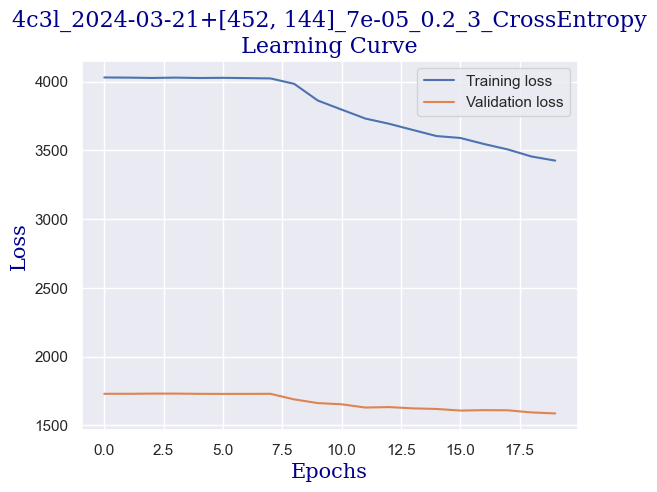

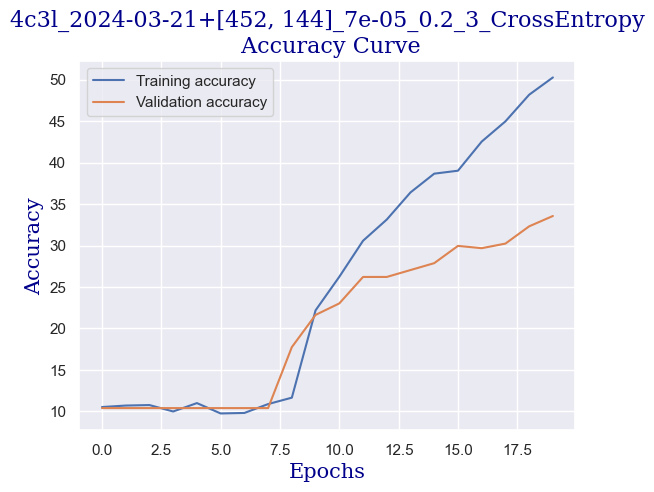

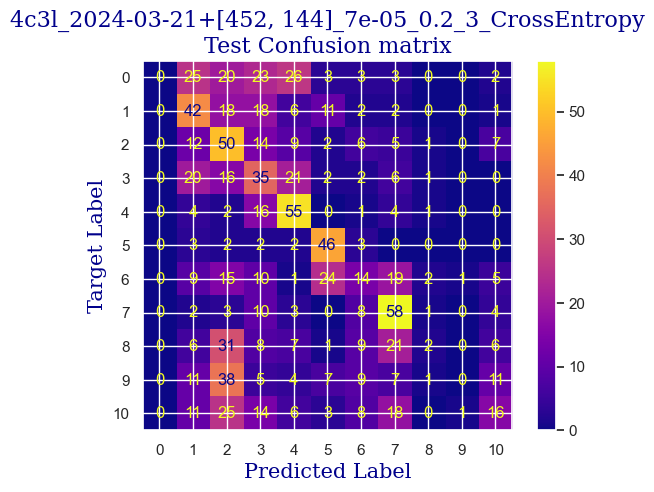

 
 END 4c3l [452, 144] Run Time:  5269.806417179992
Model:  4c3l  idx: 0 / 1
resolution:  [452, 144]   idx: 0 / 7
learning rate:  8e-05   idx: 3 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0   idx: 0 / 3
seed:  8   idx:  0 / 3
loss function:  CrossEntropy  idx: 0 / 1
144545.84999397
144533.439479958
Total epochs: 20


  0%|                                                                                                                        | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  9.458655562165378
validating...


  5%|█████▌                                                                                                          | 1/20 [00:24<07:36, 24.02s/it]

validation accuracy:  9.70873786407767
Training...
train accuracy:  9.57763236168947
validating...


 10%|███████████▏                                                                                                    | 2/20 [00:48<07:12, 24.01s/it]

validation accuracy:  9.70873786407767
Training...
train accuracy:  9.161213563355146
validating...


 15%|████████████████▊                                                                                               | 3/20 [01:11<06:47, 23.97s/it]

validation accuracy:  9.70873786407767
Training...
train accuracy:  9.518143961927423
validating...


 20%|██████████████████████▍                                                                                         | 4/20 [01:35<06:23, 23.97s/it]

validation accuracy:  9.847434119278779
Training...
train accuracy:  11.362284354550862
validating...


 25%|████████████████████████████                                                                                    | 5/20 [01:59<05:59, 23.96s/it]

validation accuracy:  18.8626907073509
Training...
train accuracy:  19.690660321237356
validating...


 30%|█████████████████████████████████▌                                                                              | 6/20 [02:23<05:35, 23.97s/it]

validation accuracy:  22.74618585298197
Training...
train accuracy:  26.29387269482451
validating...


 35%|███████████████████████████████████████▏                                                                        | 7/20 [02:47<05:11, 24.00s/it]

validation accuracy:  23.71705963938974
Training...
train accuracy:  29.684711481261157
validating...


 40%|████████████████████████████████████████████▊                                                                   | 8/20 [03:11<04:47, 23.96s/it]

validation accuracy:  23.855755894590846
Training...
train accuracy:  32.00475907198096
validating...


 45%|██████████████████████████████████████████████████▍                                                             | 9/20 [03:35<04:23, 23.98s/it]

validation accuracy:  28.01664355062413
Training...
train accuracy:  37.35871505056514
validating...


 50%|███████████████████████████████████████████████████████▌                                                       | 10/20 [03:59<03:59, 23.98s/it]

validation accuracy:  31.622746185852986
Training...
train accuracy:  43.66448542534206
validating...


 55%|█████████████████████████████████████████████████████████████                                                  | 11/20 [04:23<03:36, 24.00s/it]

validation accuracy:  34.95145631067961
Training...
train accuracy:  47.055324211778704
validating...


 60%|██████████████████████████████████████████████████████████████████▌                                            | 12/20 [04:47<03:12, 24.00s/it]

validation accuracy:  35.09015256588072
Training...
train accuracy:  48.18560380725758
validating...


 65%|████████████████████████████████████████████████████████████████████████▏                                      | 13/20 [05:11<02:47, 23.98s/it]

validation accuracy:  33.980582524271846
Training...
train accuracy:  50.148720999405114
validating...


 70%|█████████████████████████████████████████████████████████████████████████████▋                                 | 14/20 [05:35<02:23, 23.98s/it]

validation accuracy:  34.11927877947296
Training...
train accuracy:  51.81439619274242
validating...


 75%|███████████████████████████████████████████████████████████████████████████████████▎                           | 15/20 [05:59<01:59, 23.99s/it]

validation accuracy:  38.141470180305134
Training...
train accuracy:  53.7180249851279
validating...


 80%|████████████████████████████████████████████████████████████████████████████████████████▊                      | 16/20 [06:23<01:35, 23.98s/it]

validation accuracy:  39.1123439667129
Training...
train accuracy:  54.19393218322427
validating...


 85%|██████████████████████████████████████████████████████████████████████████████████████████████▎                | 17/20 [06:47<01:11, 23.99s/it]

validation accuracy:  37.7253814147018
Training...
train accuracy:  55.3837001784652
validating...


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████▉           | 18/20 [07:11<00:47, 23.99s/it]

validation accuracy:  39.25104022191401
Training...
train accuracy:  58.536585365853654
validating...


 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 19/20 [07:35<00:23, 23.98s/it]

validation accuracy:  41.47018030513176
Training...
train accuracy:  57.52528256989887
validating...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [07:59<00:00, 23.98s/it]

validation accuracy:  40.77669902912621
Testing...


 
 train acc:  57.52528256989887
 
 val acc:  40.77669902912621
 
 test acc:  36.213592233009706


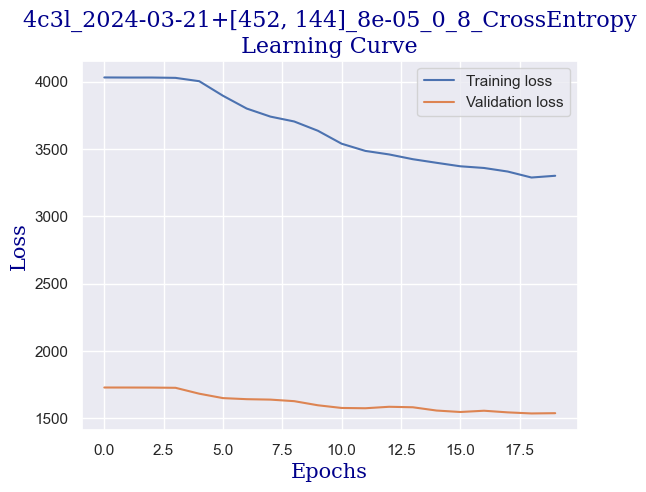

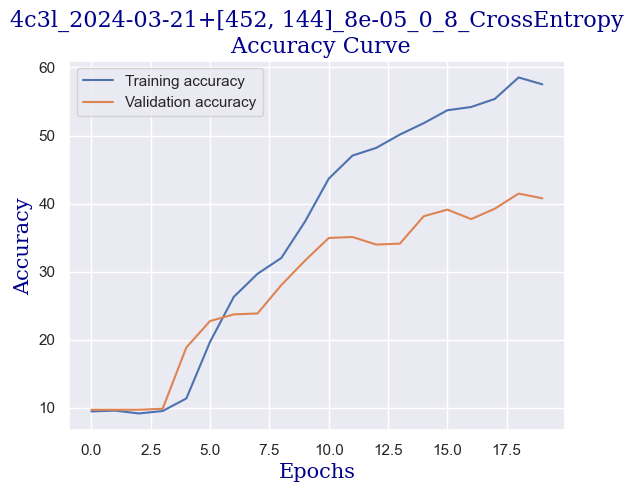

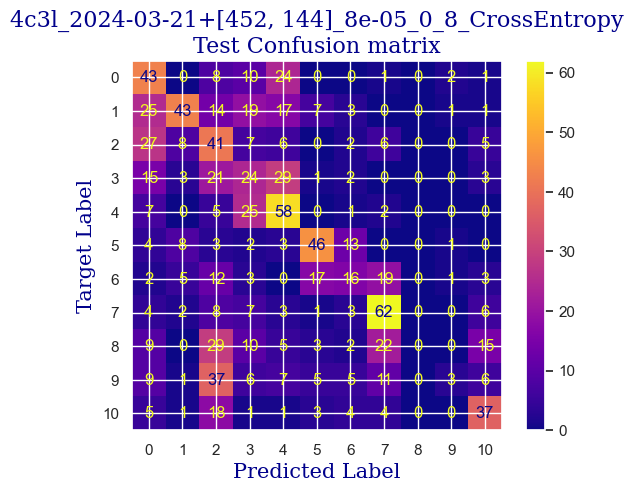

 
 END 4c3l [452, 144] Run Time:  5263.758404161985
Model:  4c3l  idx: 0 / 1
resolution:  [452, 144]   idx: 0 / 7
learning rate:  8e-05   idx: 3 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0   idx: 0 / 3
seed:  2   idx:  1 / 3
loss function:  CrossEntropy  idx: 0 / 1
149809.609684298
149797.199173114
Total epochs: 20


  0%|                                                                                                                        | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  9.161213563355146
validating...


  5%|█████▌                                                                                                          | 1/20 [00:23<07:35, 24.00s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.886377156454492
validating...


 10%|███████████▏                                                                                                    | 2/20 [00:47<07:11, 23.98s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  11.06484235574063
validating...


 15%|████████████████▊                                                                                               | 3/20 [01:11<06:47, 23.96s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.172516359309935
validating...


 20%|██████████████████████▍                                                                                         | 4/20 [01:35<06:22, 23.93s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.350981558596075
validating...


 25%|████████████████████████████                                                                                    | 5/20 [01:59<05:58, 23.93s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  11.421772754312908
validating...


 30%|█████████████████████████████████▌                                                                              | 6/20 [02:23<05:35, 23.94s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.23200475907198
validating...


 35%|███████████████████████████████████████▏                                                                        | 7/20 [02:47<05:11, 23.93s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.648423557406305
validating...


 40%|████████████████████████████████████████████▊                                                                   | 8/20 [03:11<04:47, 23.94s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.767400356930398
validating...


 45%|██████████████████████████████████████████████████▍                                                             | 9/20 [03:35<04:23, 23.92s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  9.994051160023796
validating...


 50%|███████████████████████████████████████████████████████▌                                                       | 10/20 [03:59<03:59, 23.97s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  11.24330755502677
validating...


 55%|█████████████████████████████████████████████████████████████                                                  | 11/20 [04:23<03:36, 24.10s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  11.124330755502678
validating...


 60%|██████████████████████████████████████████████████████████████████▌                                            | 12/20 [04:48<03:13, 24.20s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  11.06484235574063
validating...


 65%|████████████████████████████████████████████████████████████████████████▏                                      | 13/20 [05:12<02:49, 24.26s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  11.06484235574063
validating...


 70%|█████████████████████████████████████████████████████████████████████████████▋                                 | 14/20 [05:37<02:25, 24.29s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  11.06484235574063
validating...


 75%|███████████████████████████████████████████████████████████████████████████████████▎                           | 15/20 [06:01<02:01, 24.30s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  11.06484235574063
validating...


 80%|████████████████████████████████████████████████████████████████████████████████████████▊                      | 16/20 [06:25<01:37, 24.30s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  11.06484235574063
validating...


 85%|██████████████████████████████████████████████████████████████████████████████████████████████▎                | 17/20 [06:50<01:12, 24.30s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  11.06484235574063
validating...


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████▉           | 18/20 [07:14<00:48, 24.29s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  11.06484235574063
validating...


 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 19/20 [07:38<00:24, 24.27s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  11.06484235574063
validating...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [08:02<00:00, 24.14s/it]

validation accuracy:  8.599167822468793
Testing...


 
 train acc:  11.06484235574063
 
 val acc:  8.599167822468793
 
 test acc:  9.12621359223301


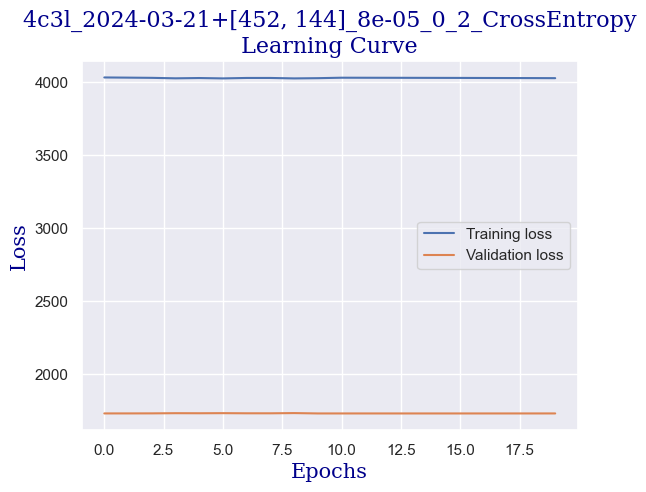

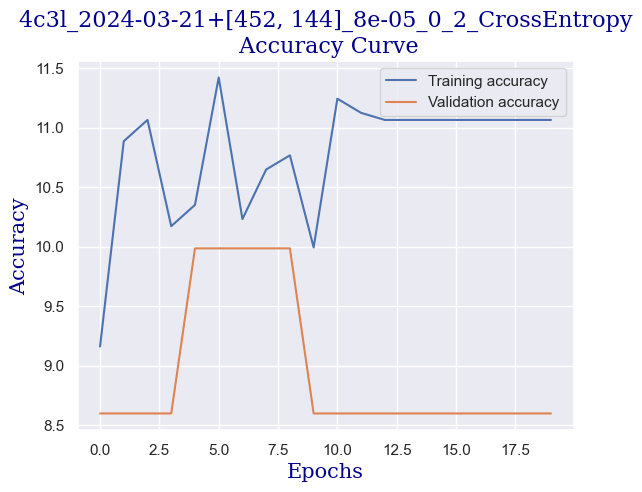

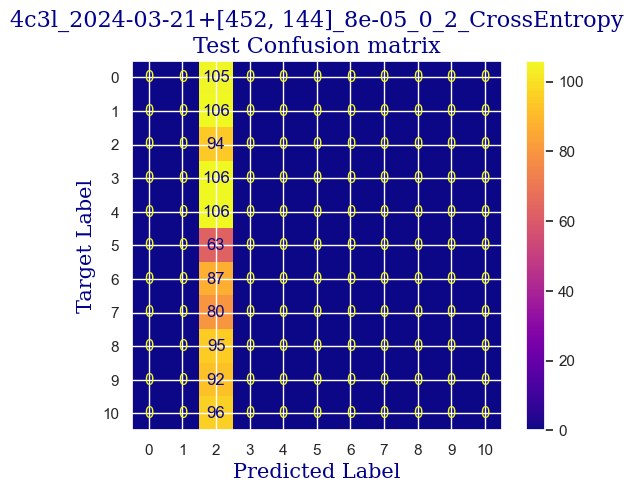

 
 END 4c3l [452, 144] Run Time:  5252.36687248302
Model:  4c3l  idx: 0 / 1
resolution:  [452, 144]   idx: 0 / 7
learning rate:  8e-05   idx: 3 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0   idx: 0 / 3
seed:  3   idx:  2 / 3
loss function:  CrossEntropy  idx: 0 / 1
155061.978057848
155049.567545206
Total epochs: 20


  0%|                                                                                                                        | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  10.529446757882214
validating...


  5%|█████▌                                                                                                          | 1/20 [00:23<07:34, 23.90s/it]

validation accuracy:  7.489597780859916
Training...
train accuracy:  10.41046995835812
validating...


 10%|███████████▏                                                                                                    | 2/20 [00:47<07:11, 23.96s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  9.934562760261748
validating...


 15%|████████████████▊                                                                                               | 3/20 [01:11<06:47, 23.97s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  15.229030339083879
validating...


 20%|██████████████████████▍                                                                                         | 4/20 [01:35<06:23, 23.96s/it]

validation accuracy:  18.307905686546462
Training...
train accuracy:  24.806662700773348
validating...


 25%|████████████████████████████                                                                                    | 5/20 [01:59<05:59, 23.94s/it]

validation accuracy:  19.694868238557557
Training...
train accuracy:  30.517549077929807
validating...


 30%|█████████████████████████████████▌                                                                              | 6/20 [02:23<05:35, 23.95s/it]

validation accuracy:  26.907073509015255
Training...
train accuracy:  36.52587745389649
validating...


 35%|███████████████████████████████████████▏                                                                        | 7/20 [02:47<05:11, 23.95s/it]

validation accuracy:  29.26490984743412
Training...
train accuracy:  41.16597263533611
validating...


 40%|████████████████████████████████████████████▊                                                                   | 8/20 [03:11<04:47, 23.97s/it]

validation accuracy:  31.900138696255205
Training...
train accuracy:  45.03271861986913
validating...


 45%|██████████████████████████████████████████████████▍                                                             | 9/20 [03:35<04:23, 23.94s/it]

validation accuracy:  34.11927877947296
Training...
train accuracy:  48.30458060678168
validating...


 50%|███████████████████████████████████████████████████████▌                                                       | 10/20 [03:59<03:59, 23.95s/it]

validation accuracy:  36.47711511789182
Training...
train accuracy:  50.743604997025585
validating...


 55%|█████████████████████████████████████████████████████████████                                                  | 11/20 [04:23<03:35, 23.94s/it]

validation accuracy:  35.64493758668516
Training...
train accuracy:  53.24211778703153
validating...


 60%|██████████████████████████████████████████████████████████████████▌                                            | 12/20 [04:47<03:11, 23.96s/it]

validation accuracy:  38.69625520110957
Training...
train accuracy:  55.56216537775134
validating...


 65%|████████████████████████████████████████████████████████████████████████▏                                      | 13/20 [05:11<02:47, 23.95s/it]

validation accuracy:  36.1997226074896
Training...
train accuracy:  55.97858417608567
validating...


 70%|█████████████████████████████████████████████████████████████████████████████▋                                 | 14/20 [05:35<02:23, 23.93s/it]

validation accuracy:  37.17059639389736
Training...
train accuracy:  58.89351576442594
validating...


 75%|███████████████████████████████████████████████████████████████████████████████████▎                           | 15/20 [05:59<01:59, 23.91s/it]

validation accuracy:  37.309292649098474
Training...
train accuracy:  60.142772159428915
validating...


 80%|████████████████████████████████████████████████████████████████████████████████████████▊                      | 16/20 [06:23<01:35, 23.91s/it]

validation accuracy:  36.33841886269071
Training...
train accuracy:  62.224866151100535
validating...


 85%|██████████████████████████████████████████████████████████████████████████████████████████████▎                | 17/20 [06:46<01:11, 23.93s/it]

validation accuracy:  36.33841886269071
Training...
train accuracy:  63.652587745389646
validating...


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████▉           | 18/20 [07:11<00:47, 23.96s/it]

validation accuracy:  40.083217753120664
Training...
train accuracy:  66.80547293277812
validating...


 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 19/20 [07:34<00:23, 23.95s/it]

validation accuracy:  35.64493758668516
Training...
train accuracy:  68.76859012492564
validating...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [07:58<00:00, 23.94s/it]

validation accuracy:  38.28016643550624
Testing...


 
 train acc:  68.76859012492564
 
 val acc:  38.28016643550624
 
 test acc:  39.32038834951456


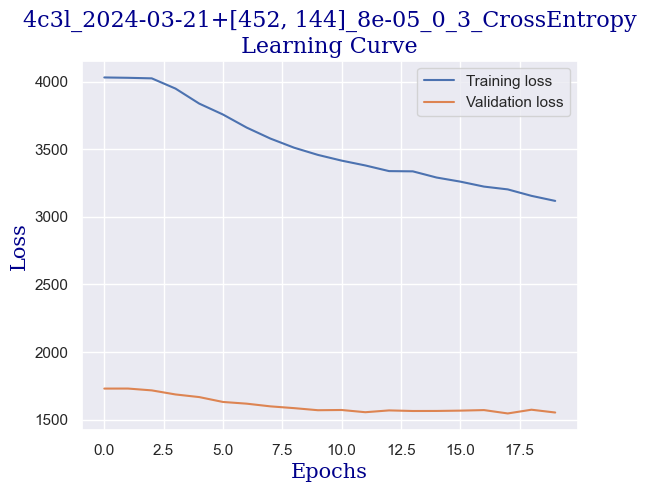

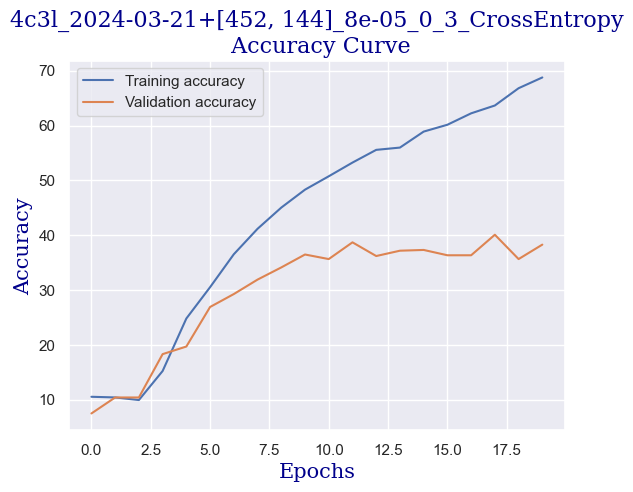

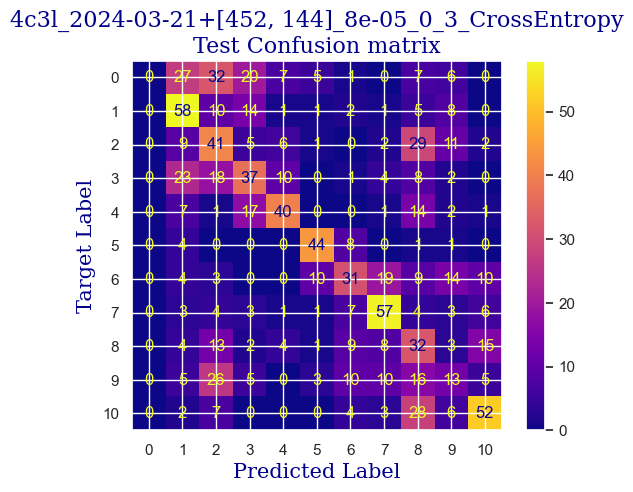

 
 END 4c3l [452, 144] Run Time:  5263.611328567
Model:  4c3l  idx: 0 / 1
resolution:  [452, 144]   idx: 0 / 7
learning rate:  8e-05   idx: 3 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.1   idx: 1 / 3
seed:  8   idx:  0 / 3
loss function:  CrossEntropy  idx: 0 / 1
160325.590714165
160313.180208139
Total epochs: 20


  0%|                                                                                                                        | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  9.934562760261748
validating...


  5%|█████▌                                                                                                          | 1/20 [00:23<07:34, 23.94s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  8.506841165972636
validating...


 10%|███████████▏                                                                                                    | 2/20 [00:47<07:11, 23.94s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  9.875074360499703
validating...


 15%|████████████████▊                                                                                               | 3/20 [01:11<06:46, 23.93s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  8.566329565734682
validating...


 20%|██████████████████████▍                                                                                         | 4/20 [01:35<06:23, 23.94s/it]

validation accuracy:  8.876560332871012
Training...
train accuracy:  15.348007138607972
validating...


 25%|████████████████████████████                                                                                    | 5/20 [01:59<05:59, 23.95s/it]

validation accuracy:  19.972260748959776
Training...
train accuracy:  25.401546698393812
validating...


 30%|█████████████████████████████████▌                                                                              | 6/20 [02:23<05:35, 23.96s/it]

validation accuracy:  27.045769764216367
Training...
train accuracy:  29.98215348007139
validating...


 35%|███████████████████████████████████████▏                                                                        | 7/20 [02:47<05:11, 23.97s/it]

validation accuracy:  26.768377253814148
Training...
train accuracy:  35.63355145746579
validating...


 40%|████████████████████████████████████████████▊                                                                   | 8/20 [03:11<04:47, 23.99s/it]

validation accuracy:  29.26490984743412
Training...
train accuracy:  39.202855443188575
validating...


 45%|██████████████████████████████████████████████████▍                                                             | 9/20 [03:35<04:23, 23.98s/it]

validation accuracy:  29.26490984743412
Training...
train accuracy:  41.760856632956575
validating...


 50%|███████████████████████████████████████████████████████▌                                                       | 10/20 [03:59<03:59, 24.00s/it]

validation accuracy:  31.484049930651874
Training...
train accuracy:  47.947650208209396
validating...


 55%|█████████████████████████████████████████████████████████████                                                  | 11/20 [04:23<03:35, 23.99s/it]

validation accuracy:  33.56449375866852
Training...
train accuracy:  51.87388459250446
validating...


 60%|██████████████████████████████████████████████████████████████████▌                                            | 12/20 [04:47<03:11, 23.98s/it]

validation accuracy:  35.367545076282944
Training...
train accuracy:  57.70374776918501
validating...


 65%|████████████████████████████████████████████████████████████████████████▏                                      | 13/20 [05:11<02:47, 24.00s/it]

validation accuracy:  35.367545076282944
Training...
train accuracy:  60.49970255800119
validating...


 70%|█████████████████████████████████████████████████████████████████████████████▋                                 | 14/20 [05:35<02:24, 24.02s/it]

validation accuracy:  35.22884882108183
Training...
train accuracy:  62.93872694824509
validating...


 75%|███████████████████████████████████████████████████████████████████████████████████▎                           | 15/20 [05:59<02:00, 24.03s/it]

validation accuracy:  37.17059639389736
Training...
train accuracy:  66.38905413444378
validating...


 80%|████████████████████████████████████████████████████████████████████████████████████████▊                      | 16/20 [06:23<01:36, 24.02s/it]

validation accuracy:  38.28016643550624
Training...
train accuracy:  68.23319452706723
validating...


 85%|██████████████████████████████████████████████████████████████████████████████████████████████▎                | 17/20 [06:47<01:12, 24.03s/it]

validation accuracy:  36.1997226074896
Training...
train accuracy:  71.86198691255206
validating...


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████▉           | 18/20 [07:11<00:48, 24.04s/it]

validation accuracy:  38.55755894590846
Training...
train accuracy:  72.6948245092207
validating...


 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 19/20 [07:35<00:24, 24.00s/it]

validation accuracy:  39.66712898751734
Training...
train accuracy:  74.89589530041641
validating...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [07:59<00:00, 23.99s/it]

validation accuracy:  36.33841886269071
Testing...


 
 train acc:  74.89589530041641
 
 val acc:  36.33841886269071
 
 test acc:  37.18446601941748


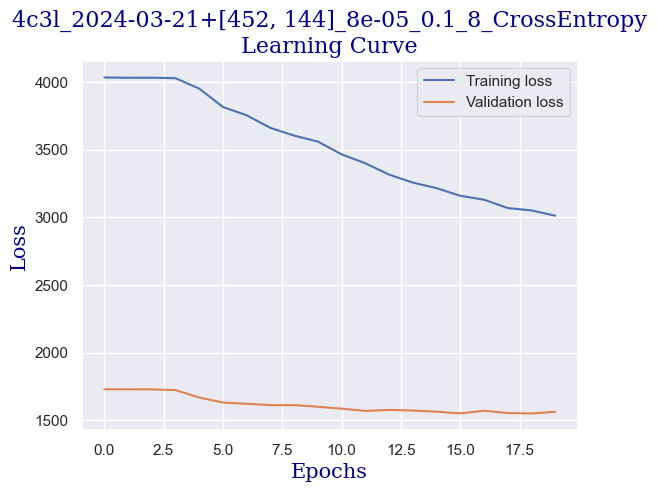

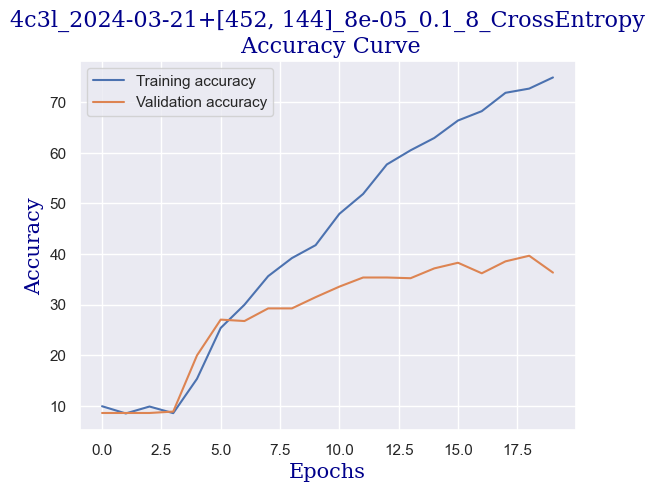

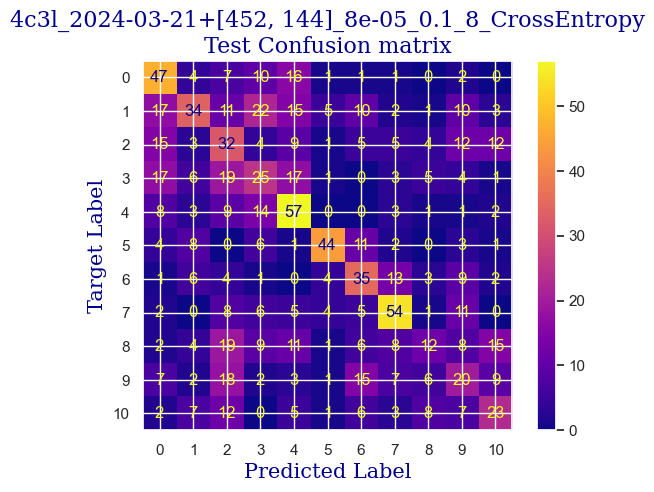

 
 END 4c3l [452, 144] Run Time:  5267.8777334269835
Model:  4c3l  idx: 0 / 1
resolution:  [452, 144]   idx: 0 / 7
learning rate:  8e-05   idx: 3 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.1   idx: 1 / 3
seed:  2   idx:  1 / 3
loss function:  CrossEntropy  idx: 0 / 1
165593.469811188
165581.059297211
Total epochs: 20


  0%|                                                                                                                        | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  9.57763236168947
validating...


  5%|█████▌                                                                                                          | 1/20 [00:23<07:34, 23.91s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  11.124330755502678
validating...


 10%|███████████▏                                                                                                    | 2/20 [00:47<07:11, 23.96s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.350981558596075
validating...


 15%|████████████████▊                                                                                               | 3/20 [01:11<06:47, 23.96s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.172516359309935
validating...


 20%|██████████████████████▍                                                                                         | 4/20 [01:35<06:23, 23.99s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  9.815585960737657
validating...


 25%|████████████████████████████                                                                                    | 5/20 [01:59<05:59, 23.97s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.707911957168353
validating...


 30%|█████████████████████████████████▌                                                                              | 6/20 [02:23<05:35, 23.95s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.469958358120167
validating...


 35%|███████████████████████████████████████▏                                                                        | 7/20 [02:47<05:11, 23.95s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.172516359309935
validating...


 40%|████████████████████████████████████████████▊                                                                   | 8/20 [03:11<04:47, 23.92s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.23200475907198
validating...


 45%|██████████████████████████████████████████████████▍                                                             | 9/20 [03:35<04:23, 23.92s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.648423557406305
validating...


 50%|███████████████████████████████████████████████████████▌                                                       | 10/20 [03:59<03:59, 23.90s/it]

validation accuracy:  9.847434119278779
Training...
train accuracy:  13.56335514574658
validating...


 55%|█████████████████████████████████████████████████████████████                                                  | 11/20 [04:23<03:34, 23.88s/it]

validation accuracy:  15.950069348127602
Training...
train accuracy:  23.378941106484234
validating...


 60%|██████████████████████████████████████████████████████████████████▌                                            | 12/20 [04:47<03:11, 23.92s/it]

validation accuracy:  24.965325936199722
Training...
train accuracy:  31.528851873884594
validating...


 65%|████████████████████████████████████████████████████████████████████████▏                                      | 13/20 [05:11<02:47, 23.93s/it]

validation accuracy:  27.739251040221912
Training...
train accuracy:  34.027364663890545
validating...


 70%|█████████████████████████████████████████████████████████████████████████████▋                                 | 14/20 [05:34<02:23, 23.91s/it]

validation accuracy:  28.57142857142857
Training...
train accuracy:  37.180249851279
validating...


 75%|███████████████████████████████████████████████████████████████████████████████████▎                           | 15/20 [05:58<01:59, 23.92s/it]

validation accuracy:  28.57142857142857
Training...
train accuracy:  39.14336704342653
validating...


 80%|████████████████████████████████████████████████████████████████████████████████████████▊                      | 16/20 [06:22<01:35, 23.94s/it]

validation accuracy:  27.877947295423024
Training...
train accuracy:  39.91671624033313
validating...


 85%|██████████████████████████████████████████████████████████████████████████████████████████████▎                | 17/20 [06:46<01:11, 23.95s/it]

validation accuracy:  27.461858529819693
Training...
train accuracy:  41.106484235574065
validating...


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████▉           | 18/20 [07:10<00:47, 23.95s/it]

validation accuracy:  26.629680998613036
Training...
train accuracy:  41.760856632956575
validating...


 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 19/20 [07:34<00:23, 23.97s/it]

validation accuracy:  25.79750346740638
Training...
train accuracy:  43.545508625817966
validating...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [07:58<00:00, 23.94s/it]

validation accuracy:  27.877947295423024
Testing...


 
 train acc:  43.545508625817966
 
 val acc:  27.877947295423024
 
 test acc:  30.29126213592233


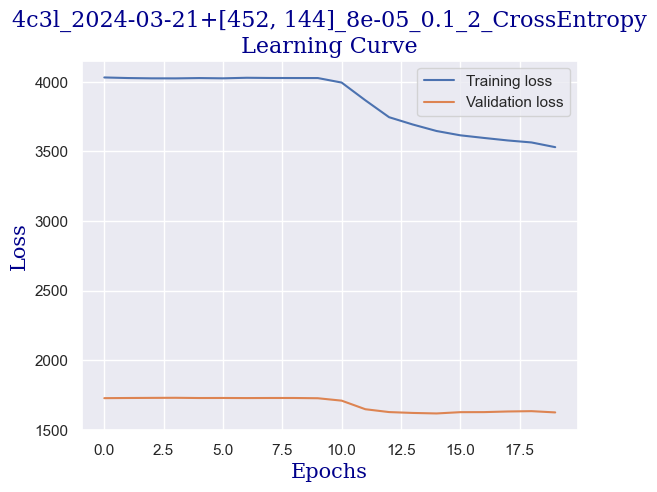

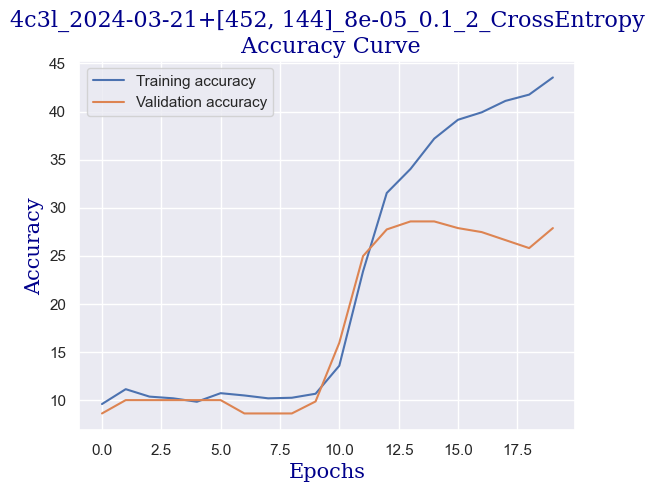

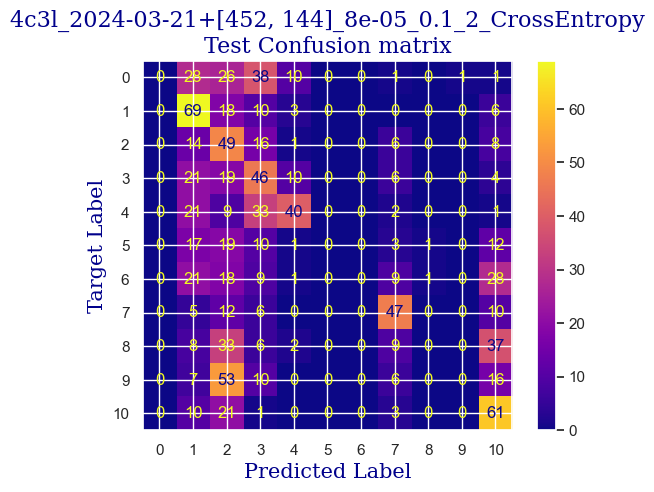

 
 END 4c3l [452, 144] Run Time:  5267.984332749998
Model:  4c3l  idx: 0 / 1
resolution:  [452, 144]   idx: 0 / 7
learning rate:  8e-05   idx: 3 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.1   idx: 1 / 3
seed:  3   idx:  2 / 3
loss function:  CrossEntropy  idx: 0 / 1
170861.455439219
170849.044922524
Total epochs: 20


  0%|                                                                                                                        | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  8.863771564544914
validating...


  5%|█████▌                                                                                                          | 1/20 [00:23<07:33, 23.89s/it]

validation accuracy:  7.489597780859916
Training...
train accuracy:  9.815585960737657
validating...


 10%|███████████▏                                                                                                    | 2/20 [00:47<07:10, 23.94s/it]

validation accuracy:  7.489597780859916
Training...
train accuracy:  9.75609756097561
validating...


 15%|████████████████▊                                                                                               | 3/20 [01:11<06:46, 23.90s/it]

validation accuracy:  7.489597780859916
Training...
train accuracy:  11.481261154074955
validating...


 20%|██████████████████████▍                                                                                         | 4/20 [01:35<06:23, 23.95s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  10.529446757882214
validating...


 25%|████████████████████████████                                                                                    | 5/20 [01:59<05:59, 23.94s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  11.957168352171326
validating...


 30%|█████████████████████████████████▌                                                                              | 6/20 [02:23<05:35, 23.96s/it]

validation accuracy:  15.811373092926493
Training...
train accuracy:  17.013682331945272
validating...


 35%|███████████████████████████████████████▏                                                                        | 7/20 [02:47<05:11, 23.99s/it]

validation accuracy:  16.22746185852982
Training...
train accuracy:  17.727543129089828
validating...


 40%|████████████████████████████████████████████▊                                                                   | 8/20 [03:11<04:48, 24.02s/it]

validation accuracy:  16.78224687933426
Training...
train accuracy:  20.285544318857823
validating...


 45%|██████████████████████████████████████████████████▍                                                             | 9/20 [03:36<04:24, 24.08s/it]

validation accuracy:  16.08876560332871
Training...
train accuracy:  21.35633551457466
validating...


 50%|███████████████████████████████████████████████████████▌                                                       | 10/20 [04:00<04:00, 24.09s/it]

validation accuracy:  15.811373092926493
Training...
train accuracy:  23.438429506246283
validating...


 55%|█████████████████████████████████████████████████████████████                                                  | 11/20 [04:24<03:36, 24.10s/it]

validation accuracy:  17.475728155339805
Training...
train accuracy:  25.282569898869724
validating...


 60%|██████████████████████████████████████████████████████████████████▌                                            | 12/20 [04:48<03:12, 24.09s/it]

validation accuracy:  18.58529819694868
Training...
train accuracy:  26.234384295062462
validating...


 65%|████████████████████████████████████████████████████████████████████████▏                                      | 13/20 [05:12<02:48, 24.09s/it]

validation accuracy:  20.943134535367545
Training...
train accuracy:  27.959547888161808
validating...


 70%|█████████████████████████████████████████████████████████████████████████████▋                                 | 14/20 [05:36<02:24, 24.10s/it]

validation accuracy:  21.63661581137309
Training...
train accuracy:  30.279595478881618
validating...


 75%|███████████████████████████████████████████████████████████████████████████████████▎                           | 15/20 [06:00<02:00, 24.12s/it]

validation accuracy:  22.607489597780862
Training...
train accuracy:  30.75550267697799
validating...


 80%|████████████████████████████████████████████████████████████████████████████████████████▊                      | 16/20 [06:24<01:36, 24.11s/it]

validation accuracy:  21.914008321775313
Training...
train accuracy:  30.696014277215944
validating...


 85%|██████████████████████████████████████████████████████████████████████████████████████████████▎                | 17/20 [06:48<01:12, 24.12s/it]

validation accuracy:  23.300970873786408
Training...
train accuracy:  31.528851873884594
validating...


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████▉           | 18/20 [07:13<00:48, 24.14s/it]

validation accuracy:  22.74618585298197
Training...
train accuracy:  31.647828673408686
validating...


 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 19/20 [07:37<00:24, 24.16s/it]

validation accuracy:  22.46879334257975
Training...
train accuracy:  33.31350386674599
validating...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [08:01<00:00, 24.07s/it]

validation accuracy:  23.02357836338419
Testing...


 
 train acc:  33.31350386674599
 
 val acc:  23.02357836338419
 
 test acc:  22.135922330097088


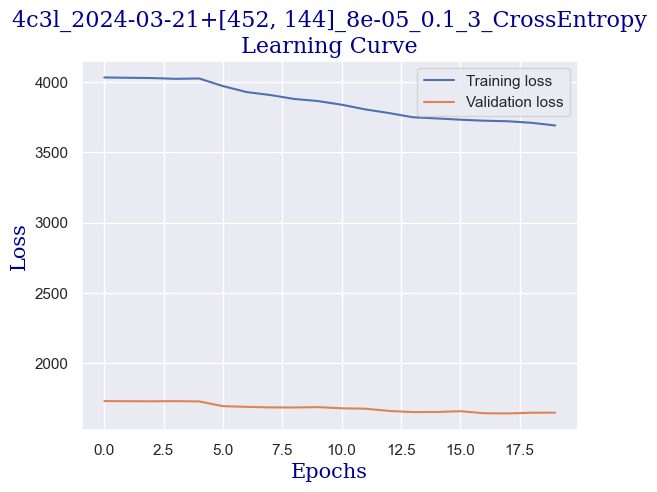

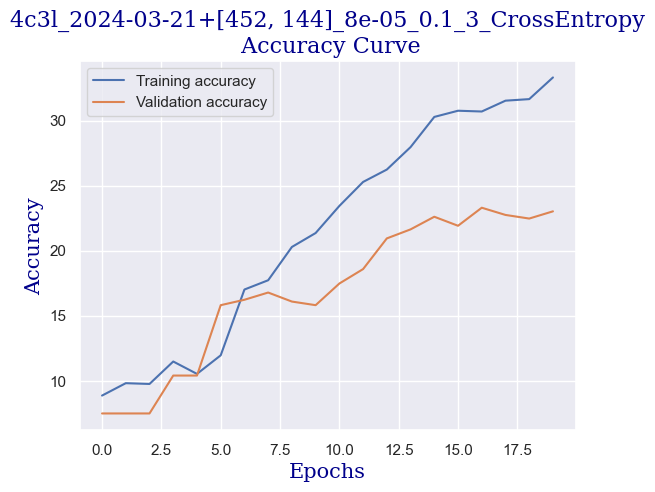

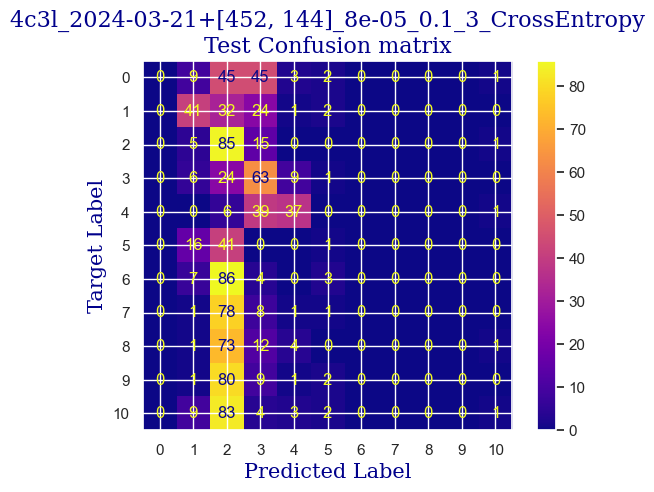

 
 END 4c3l [452, 144] Run Time:  5253.912657306006
Model:  4c3l  idx: 0 / 1
resolution:  [452, 144]   idx: 0 / 7
learning rate:  8e-05   idx: 3 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.2   idx: 2 / 3
seed:  8   idx:  0 / 3
loss function:  CrossEntropy  idx: 0 / 1
176115.369444037
176102.958932533
Total epochs: 20


  0%|                                                                                                                        | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  8.74479476502082
validating...


  5%|█████▌                                                                                                          | 1/20 [00:24<07:40, 24.25s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  9.458655562165378
validating...


 10%|███████████▏                                                                                                    | 2/20 [00:48<07:17, 24.30s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  9.042236763831053
validating...


 15%|████████████████▊                                                                                               | 3/20 [01:12<06:53, 24.33s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.113027959547887
validating...


 20%|██████████████████████▍                                                                                         | 4/20 [01:37<06:29, 24.34s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.172516359309935
validating...


 25%|████████████████████████████                                                                                    | 5/20 [02:01<06:04, 24.31s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.350981558596075
validating...


 30%|█████████████████████████████████▌                                                                              | 6/20 [02:25<05:40, 24.31s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.350981558596075
validating...


 35%|███████████████████████████████████████▏                                                                        | 7/20 [02:50<05:15, 24.30s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.350981558596075
validating...


 40%|████████████████████████████████████████████▊                                                                   | 8/20 [03:14<04:51, 24.33s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.350981558596075
validating...


 45%|██████████████████████████████████████████████████▍                                                             | 9/20 [03:38<04:27, 24.33s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.350981558596075
validating...


 50%|███████████████████████████████████████████████████████▌                                                       | 10/20 [04:03<04:03, 24.32s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.350981558596075
validating...


 55%|█████████████████████████████████████████████████████████████                                                  | 11/20 [04:27<03:38, 24.33s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.350981558596075
validating...


 60%|██████████████████████████████████████████████████████████████████▌                                            | 12/20 [04:51<03:14, 24.33s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.350981558596075
validating...


 65%|████████████████████████████████████████████████████████████████████████▏                                      | 13/20 [05:16<02:50, 24.35s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.350981558596075
validating...


 70%|█████████████████████████████████████████████████████████████████████████████▋                                 | 14/20 [05:40<02:26, 24.34s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.350981558596075
validating...


 75%|███████████████████████████████████████████████████████████████████████████████████▎                           | 15/20 [06:04<02:01, 24.36s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.350981558596075
validating...


 80%|████████████████████████████████████████████████████████████████████████████████████████▊                      | 16/20 [06:29<01:37, 24.36s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.350981558596075
validating...


 85%|██████████████████████████████████████████████████████████████████████████████████████████████▎                | 17/20 [06:53<01:13, 24.34s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.350981558596075
validating...


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████▉           | 18/20 [07:17<00:48, 24.32s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.350981558596075
validating...


 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 19/20 [07:42<00:24, 24.35s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.350981558596075
validating...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [08:06<00:00, 24.33s/it]

validation accuracy:  9.153952843273231
Testing...


 
 train acc:  10.350981558596075
 
 val acc:  9.153952843273231
 
 test acc:  9.902912621359224


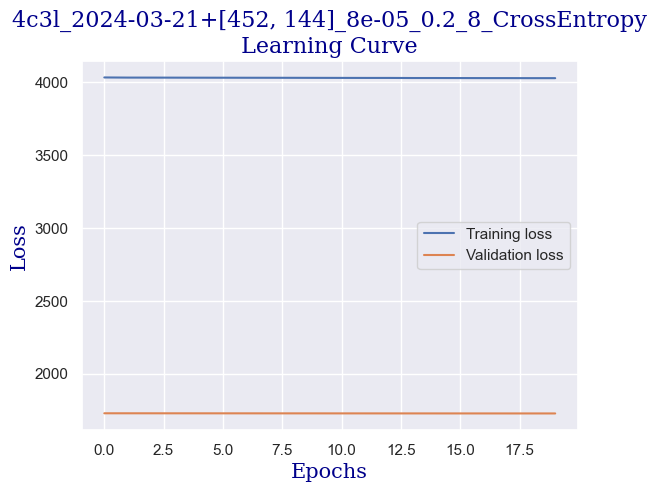

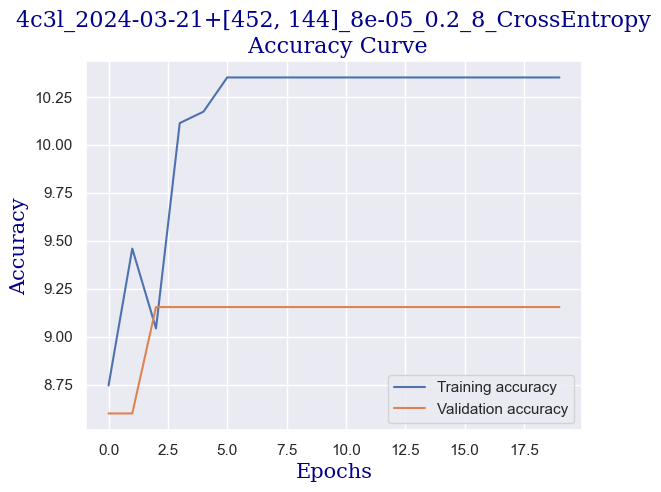

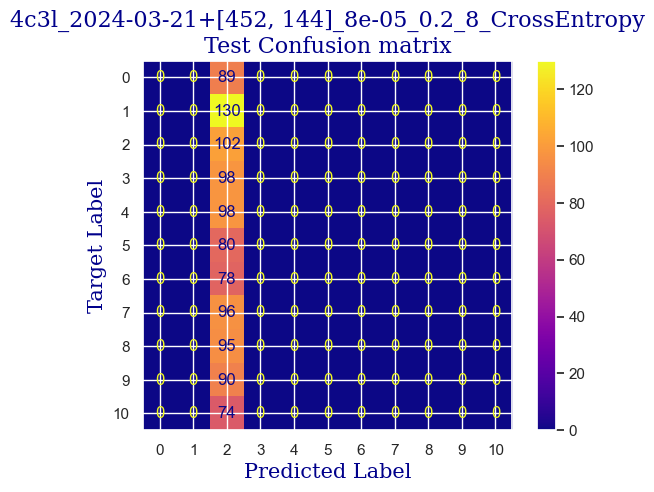

 
 END 4c3l [452, 144] Run Time:  5254.5647251509945
Model:  4c3l  idx: 0 / 1
resolution:  [452, 144]   idx: 0 / 7
learning rate:  8e-05   idx: 3 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.2   idx: 2 / 3
seed:  2   idx:  1 / 3
loss function:  CrossEntropy  idx: 0 / 1
181369.935507492
181357.524989781
Total epochs: 20


  0%|                                                                                                                        | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  10.58893515764426
validating...


  5%|█████▌                                                                                                          | 1/20 [00:23<07:35, 23.98s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.291493158834028
validating...


 10%|███████████▏                                                                                                    | 2/20 [00:47<07:10, 23.94s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.826888756692444
validating...


 15%|████████████████▊                                                                                               | 3/20 [01:11<06:47, 23.95s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  11.183819155264723
validating...


 20%|██████████████████████▍                                                                                         | 4/20 [01:35<06:22, 23.93s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.053539559785841
validating...


 25%|████████████████████████████                                                                                    | 5/20 [01:59<05:58, 23.93s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  9.994051160023796
validating...


 30%|█████████████████████████████████▌                                                                              | 6/20 [02:23<05:35, 23.97s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  11.24330755502677
validating...


 35%|███████████████████████████████████████▏                                                                        | 7/20 [02:47<05:11, 23.95s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.826888756692444
validating...


 40%|████████████████████████████████████████████▊                                                                   | 8/20 [03:11<04:47, 23.95s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.58893515764426
validating...


 45%|██████████████████████████████████████████████████▍                                                             | 9/20 [03:35<04:23, 23.94s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  14.396192742415229
validating...


 50%|███████████████████████████████████████████████████████▌                                                       | 10/20 [03:59<03:59, 23.96s/it]

validation accuracy:  14.840499306518723
Training...
train accuracy:  22.070196311719215
validating...


 55%|█████████████████████████████████████████████████████████████                                                  | 11/20 [04:23<03:35, 23.96s/it]

validation accuracy:  20.110957004160888
Training...
train accuracy:  27.3051754907793
validating...


 60%|██████████████████████████████████████████████████████████████████▌                                            | 12/20 [04:47<03:11, 23.98s/it]

validation accuracy:  22.052704576976424
Training...
train accuracy:  30.101130279595477
validating...


 65%|████████████████████████████████████████████████████████████████████████▏                                      | 13/20 [05:11<02:47, 23.96s/it]

validation accuracy:  23.578363384188627
Training...
train accuracy:  33.61094586555622
validating...


 70%|█████████████████████████████████████████████████████████████████████████████▋                                 | 14/20 [05:35<02:23, 23.97s/it]

validation accuracy:  25.381414701803052
Training...
train accuracy:  35.5145746579417
validating...


 75%|███████████████████████████████████████████████████████████████████████████████████▎                           | 15/20 [05:59<01:59, 23.95s/it]

validation accuracy:  25.104022191400833
Training...
train accuracy:  37.001784651992864
validating...


 80%|████████████████████████████████████████████████████████████████████████████████████████▊                      | 16/20 [06:23<01:35, 23.96s/it]

validation accuracy:  27.184466019417474
Training...
train accuracy:  38.845925044616294
validating...


 85%|██████████████████████████████████████████████████████████████████████████████████████████████▎                | 17/20 [06:47<01:11, 23.98s/it]

validation accuracy:  25.52011095700416
Training...
train accuracy:  40.57108863771565
validating...


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████▉           | 18/20 [07:11<00:47, 23.98s/it]

validation accuracy:  27.877947295423024
Training...
train accuracy:  41.46341463414634
validating...


 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 19/20 [07:35<00:23, 23.97s/it]

validation accuracy:  29.26490984743412
Training...
train accuracy:  43.60499702558001
validating...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [07:59<00:00, 23.96s/it]

validation accuracy:  30.929264909847433
Testing...


 
 train acc:  43.60499702558001
 
 val acc:  30.929264909847433
 
 test acc:  29.22330097087379


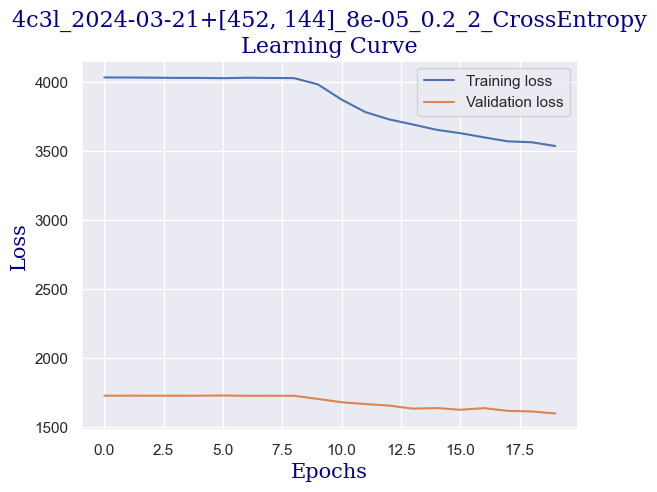

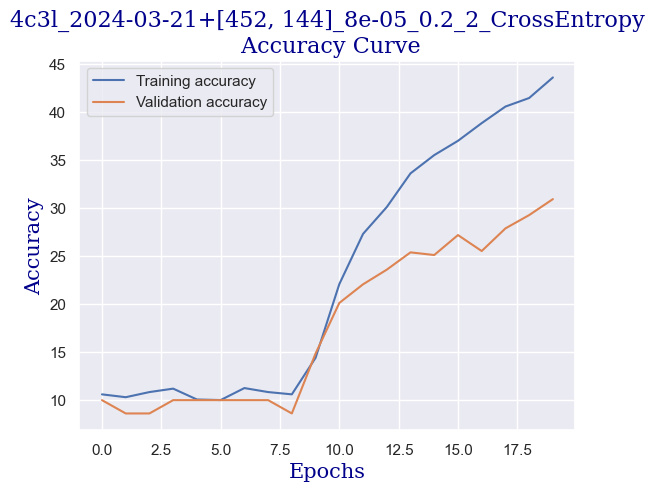

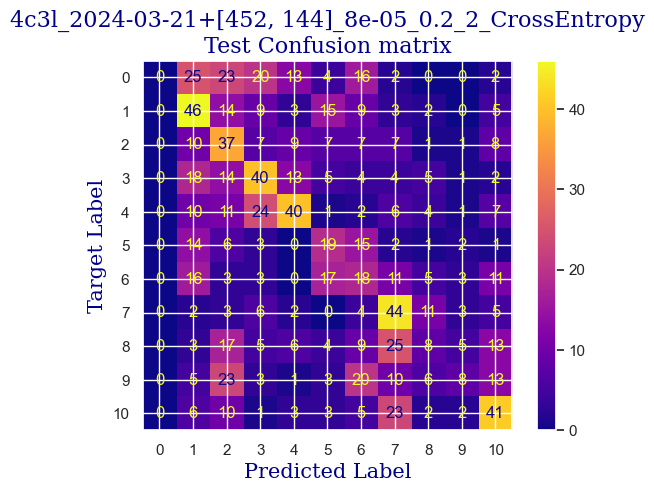

 
 END 4c3l [452, 144] Run Time:  5260.880931338004
Model:  4c3l  idx: 0 / 1
resolution:  [452, 144]   idx: 0 / 7
learning rate:  8e-05   idx: 3 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.2   idx: 2 / 3
seed:  3   idx:  2 / 3
loss function:  CrossEntropy  idx: 0 / 1
186630.817710394
186618.407199064
Total epochs: 20


  0%|                                                                                                                        | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  9.57763236168947
validating...


  5%|█████▌                                                                                                          | 1/20 [00:23<07:35, 23.97s/it]

validation accuracy:  9.29264909847434
Training...
train accuracy:  10.172516359309935
validating...


 10%|███████████▏                                                                                                    | 2/20 [00:47<07:11, 23.96s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  9.815585960737657
validating...


 15%|████████████████▊                                                                                               | 3/20 [01:11<06:46, 23.93s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  11.481261154074955
validating...


 20%|██████████████████████▍                                                                                         | 4/20 [01:35<06:23, 23.95s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  10.58893515764426
validating...


 25%|████████████████████████████                                                                                    | 5/20 [01:59<05:59, 23.99s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  10.172516359309935
validating...


 30%|█████████████████████████████████▌                                                                              | 6/20 [02:23<05:35, 23.98s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  9.934562760261748
validating...


 35%|███████████████████████████████████████▏                                                                        | 7/20 [02:47<05:11, 23.95s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  12.433075550267699
validating...


 40%|████████████████████████████████████████████▊                                                                   | 8/20 [03:11<04:47, 23.98s/it]

validation accuracy:  19.694868238557557
Training...
train accuracy:  23.67638310529447
validating...


 45%|██████████████████████████████████████████████████▍                                                             | 9/20 [03:35<04:23, 23.99s/it]

validation accuracy:  26.768377253814148
Training...
train accuracy:  28.851873884592504
validating...


 50%|███████████████████████████████████████████████████████▌                                                       | 10/20 [03:59<03:59, 23.97s/it]

validation accuracy:  31.622746185852986
Training...
train accuracy:  32.480666270077336
validating...


 55%|█████████████████████████████████████████████████████████████                                                  | 11/20 [04:23<03:35, 23.95s/it]

validation accuracy:  31.900138696255205
Training...
train accuracy:  36.4069006543724
validating...


 60%|██████████████████████████████████████████████████████████████████▌                                            | 12/20 [04:47<03:11, 23.94s/it]

validation accuracy:  33.42579750346741
Training...
train accuracy:  37.83462224866151
validating...


 65%|████████████████████████████████████████████████████████████████████████▏                                      | 13/20 [05:11<02:47, 23.95s/it]

validation accuracy:  35.09015256588072
Training...
train accuracy:  42.117787031528856
validating...


 70%|█████████████████████████████████████████████████████████████████████████████▋                                 | 14/20 [05:35<02:23, 23.95s/it]

validation accuracy:  35.78363384188627
Training...
train accuracy:  43.307555026769776
validating...


 75%|███████████████████████████████████████████████████████████████████████████████████▎                           | 15/20 [05:59<01:59, 23.96s/it]

validation accuracy:  37.447988904299585
Training...
train accuracy:  45.3896490184414
validating...


 80%|████████████████████████████████████████████████████████████████████████████████████████▊                      | 16/20 [06:23<01:35, 23.96s/it]

validation accuracy:  36.754507628294036
Training...
train accuracy:  49.13741820345033
validating...


 85%|██████████████████████████████████████████████████████████████████████████████████████████████▎                | 17/20 [06:47<01:11, 23.97s/it]

validation accuracy:  34.25797503467407
Training...
train accuracy:  51.75490779298036
validating...


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████▉           | 18/20 [07:11<00:47, 23.97s/it]

validation accuracy:  38.55755894590846
Training...
train accuracy:  52.8256989886972
validating...


 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 19/20 [07:35<00:23, 23.96s/it]

validation accuracy:  39.528432732316226
Training...
train accuracy:  55.20523497917906
validating...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [07:59<00:00, 23.96s/it]

validation accuracy:  38.55755894590846
Testing...


 
 train acc:  55.20523497917906
 
 val acc:  38.55755894590846
 
 test acc:  36.99029126213592


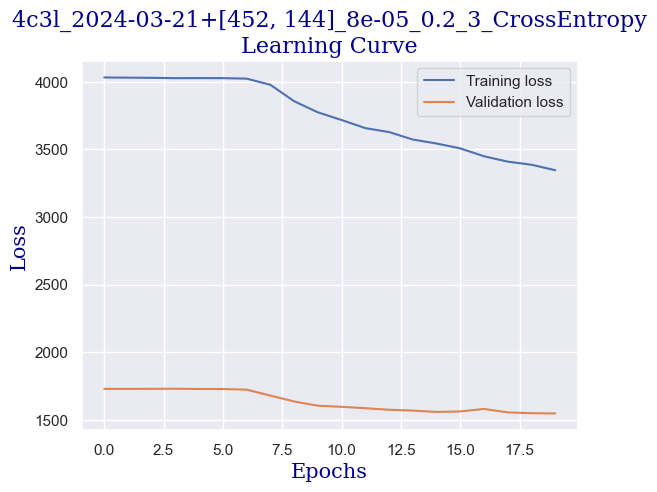

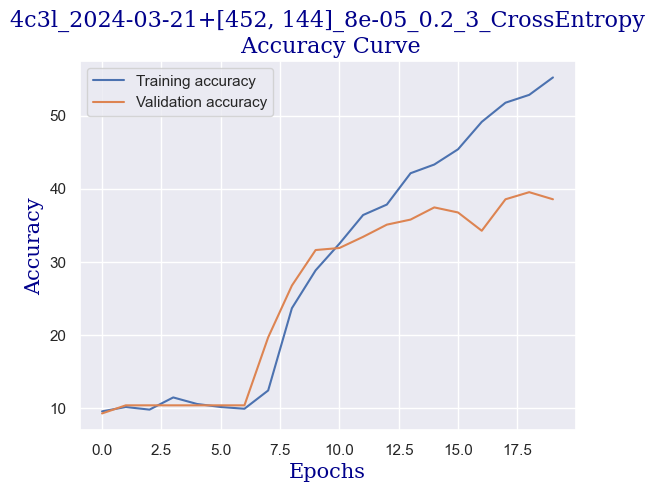

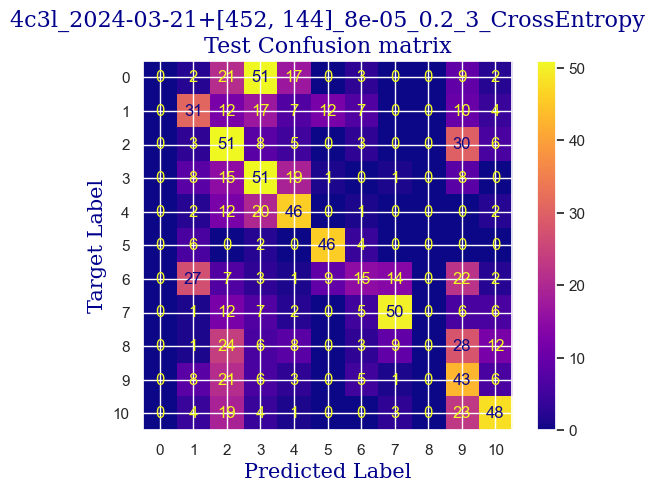

 
 END 4c3l [452, 144] Run Time:  5270.746976266993
Model:  4c3l  idx: 0 / 1
resolution:  [226, 72]   idx: 1 / 7
learning rate:  0.0001   idx: 0 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0   idx: 0 / 3
seed:  8   idx:  0 / 3
loss function:  CrossEntropy  idx: 0 / 1
191901.565961665
191889.15545214
Total epochs: 20


  0%|                                                                                                                        | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  8.923259964306961
validating...


  5%|█████▌                                                                                                          | 1/20 [00:12<03:49, 12.10s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  9.220701963117191
validating...


 10%|███████████▏                                                                                                    | 2/20 [00:24<03:37, 12.06s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  9.39916716240333
validating...


 15%|████████████████▊                                                                                               | 3/20 [00:35<03:23, 11.96s/it]

validation accuracy:  9.70873786407767
Training...
train accuracy:  13.325401546698393
validating...


 20%|██████████████████████▍                                                                                         | 4/20 [00:48<03:11, 11.99s/it]

validation accuracy:  22.330097087378643
Training...
train accuracy:  22.367638310529447
validating...


 25%|████████████████████████████                                                                                    | 5/20 [00:59<02:59, 11.98s/it]

validation accuracy:  28.9875173370319
Training...
train accuracy:  31.70731707317073
validating...


 30%|█████████████████████████████████▌                                                                              | 6/20 [01:11<02:47, 11.99s/it]

validation accuracy:  31.761442441054093
Training...
train accuracy:  35.93099345627603
validating...


 35%|███████████████████████████████████████▏                                                                        | 7/20 [01:23<02:35, 11.99s/it]

validation accuracy:  35.22884882108183
Training...
train accuracy:  42.59369422962522
validating...


 40%|████████████████████████████████████████████▊                                                                   | 8/20 [01:35<02:23, 11.93s/it]

validation accuracy:  36.89320388349515
Training...
train accuracy:  46.69839381320642
validating...


 45%|██████████████████████████████████████████████████▍                                                             | 9/20 [01:47<02:11, 11.98s/it]

validation accuracy:  33.980582524271846
Training...
train accuracy:  50.86258179654968
validating...


 50%|███████████████████████████████████████████████████████▌                                                       | 10/20 [01:59<02:00, 12.01s/it]

validation accuracy:  39.1123439667129
Training...
train accuracy:  55.56216537775134
validating...


 55%|█████████████████████████████████████████████████████████████                                                  | 11/20 [02:12<01:48, 12.04s/it]

validation accuracy:  39.528432732316226
Training...
train accuracy:  57.16835217132659
validating...


 60%|██████████████████████████████████████████████████████████████████▌                                            | 12/20 [02:24<01:36, 12.03s/it]

validation accuracy:  40.221914008321775
Training...
train accuracy:  59.54788816180845
validating...


 65%|████████████████████████████████████████████████████████████████████████▏                                      | 13/20 [02:35<01:23, 11.95s/it]

validation accuracy:  38.28016643550624
Training...
train accuracy:  62.64128494943486
validating...


 70%|█████████████████████████████████████████████████████████████████████████████▋                                 | 14/20 [02:47<01:11, 11.96s/it]

validation accuracy:  42.857142857142854
Training...
train accuracy:  65.97263533610946
validating...


 75%|███████████████████████████████████████████████████████████████████████████████████▎                           | 15/20 [02:59<00:59, 11.99s/it]

validation accuracy:  42.71844660194174
Training...
train accuracy:  69.3634741225461
validating...


 80%|████████████████████████████████████████████████████████████████████████████████████████▊                      | 16/20 [03:11<00:48, 12.03s/it]

validation accuracy:  41.74757281553398
Training...
train accuracy:  71.74301011302796
validating...


 85%|██████████████████████████████████████████████████████████████████████████████████████████████▎                | 17/20 [03:24<00:36, 12.05s/it]

validation accuracy:  39.94452149791955
Training...
train accuracy:  72.5758477096966
validating...


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████▉           | 18/20 [03:36<00:24, 12.08s/it]

validation accuracy:  41.88626907073509
Training...
train accuracy:  75.31231409875075
validating...


 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 19/20 [03:48<00:12, 12.02s/it]

validation accuracy:  41.88626907073509
Training...
train accuracy:  73.82510410469958
validating...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [04:00<00:00, 12.00s/it]

validation accuracy:  42.995839112343965
Testing...


 
 train acc:  73.82510410469958
 
 val acc:  42.995839112343965
 
 test acc:  40.58252427184466


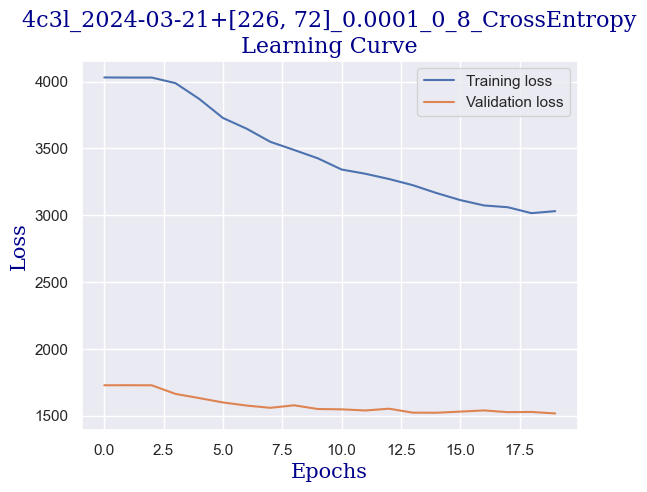

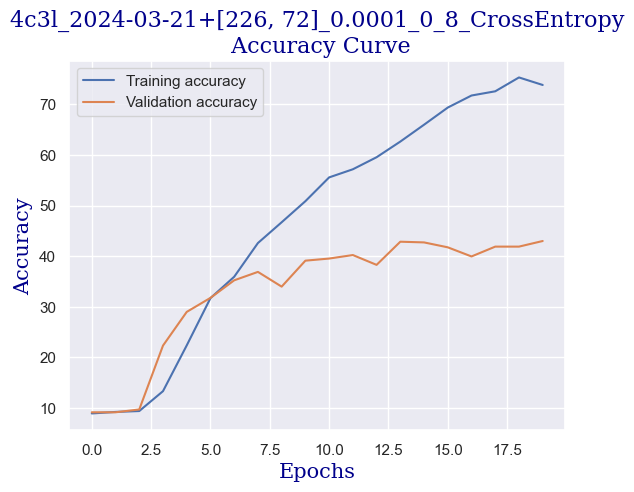

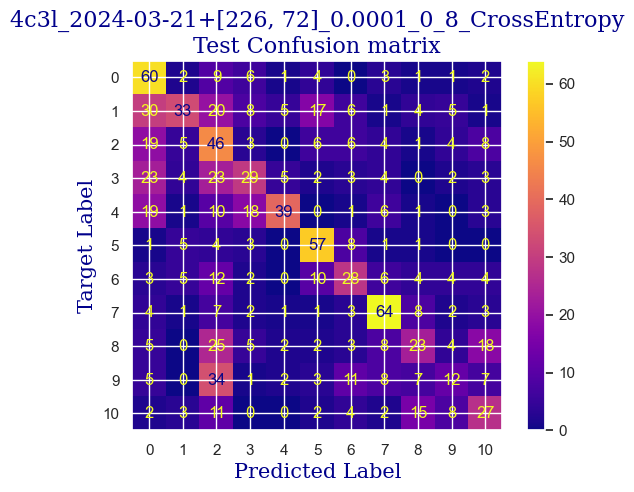

 
 END 4c3l [226, 72] Run Time:  3926.952855092997
Model:  4c3l  idx: 0 / 1
resolution:  [226, 72]   idx: 1 / 7
learning rate:  0.0001   idx: 0 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0   idx: 0 / 3
seed:  2   idx:  1 / 3
loss function:  CrossEntropy  idx: 0 / 1
195828.520134359
195816.10961689
Total epochs: 20


  0%|                                                                                                                        | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  8.030933967876264
validating...


  5%|█████▌                                                                                                          | 1/20 [00:12<03:48, 12.04s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.707911957168353
validating...


 10%|███████████▏                                                                                                    | 2/20 [00:24<03:36, 12.00s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  11.005353955978585
validating...


 15%|████████████████▊                                                                                               | 3/20 [00:36<03:24, 12.01s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  9.637120761451518
validating...


 20%|██████████████████████▍                                                                                         | 4/20 [00:48<03:12, 12.05s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  11.124330755502678
validating...


 25%|████████████████████████████                                                                                    | 5/20 [01:00<02:59, 12.00s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.350981558596075
validating...


 30%|█████████████████████████████████▌                                                                              | 6/20 [01:12<02:47, 11.99s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.945865556216537
validating...


 35%|███████████████████████████████████████▏                                                                        | 7/20 [01:24<02:35, 12.00s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  11.362284354550862
validating...


 40%|████████████████████████████████████████████▊                                                                   | 8/20 [01:36<02:24, 12.02s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.767400356930398
validating...


 45%|██████████████████████████████████████████████████▍                                                             | 9/20 [01:48<02:12, 12.02s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.826888756692444
validating...


 50%|███████████████████████████████████████████████████████▌                                                       | 10/20 [02:00<01:59, 11.99s/it]

validation accuracy:  10.263522884882107
Training...
train accuracy:  13.2064247471743
validating...


 55%|█████████████████████████████████████████████████████████████                                                  | 11/20 [02:12<01:48, 12.01s/it]

validation accuracy:  14.424410540915394
Training...
train accuracy:  18.85782272456871
validating...


 60%|██████████████████████████████████████████████████████████████████▌                                            | 12/20 [02:23<01:35, 11.97s/it]

validation accuracy:  18.8626907073509
Training...
train accuracy:  25.163593099345626
validating...


 65%|████████████████████████████████████████████████████████████████████████▏                                      | 13/20 [02:35<01:23, 11.97s/it]

validation accuracy:  23.994452149791957
Training...
train accuracy:  33.432480666270074
validating...


 70%|█████████████████████████████████████████████████████████████████████████████▋                                 | 14/20 [02:47<01:11, 11.94s/it]

validation accuracy:  28.43273231622746
Training...
train accuracy:  36.94229625223082
validating...


 75%|███████████████████████████████████████████████████████████████████████████████████▎                           | 15/20 [02:59<00:59, 11.96s/it]

validation accuracy:  31.484049930651874
Training...
train accuracy:  40.214158239143366
validating...


 80%|████████████████████████████████████████████████████████████████████████████████████████▊                      | 16/20 [03:11<00:47, 11.94s/it]

validation accuracy:  30.097087378640776
Training...
train accuracy:  41.2849494348602
validating...


 85%|██████████████████████████████████████████████████████████████████████████████████████████████▎                | 17/20 [03:23<00:35, 11.93s/it]

validation accuracy:  28.29403606102635
Training...
train accuracy:  42.35574063057704
validating...


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████▉           | 18/20 [03:35<00:23, 11.96s/it]

validation accuracy:  33.841886269070734
Training...
train accuracy:  43.01011302795955
validating...


 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 19/20 [03:47<00:11, 11.97s/it]

validation accuracy:  33.287101248266296
Training...
train accuracy:  44.854253420582985
validating...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [03:59<00:00, 11.98s/it]

validation accuracy:  33.56449375866852
Testing...


 
 train acc:  44.854253420582985
 
 val acc:  33.56449375866852
 
 test acc:  32.33009708737864


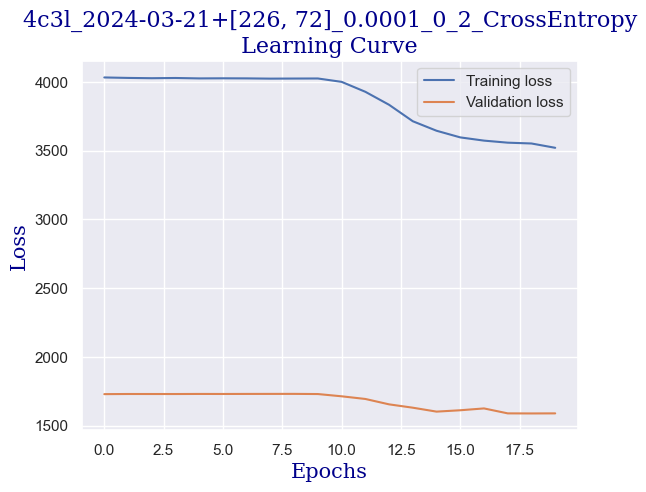

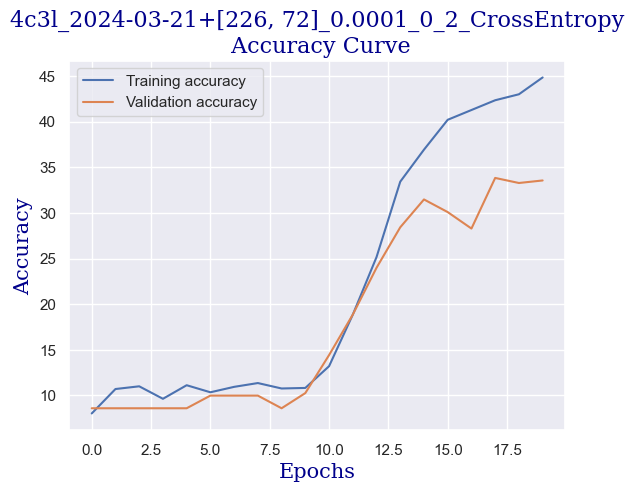

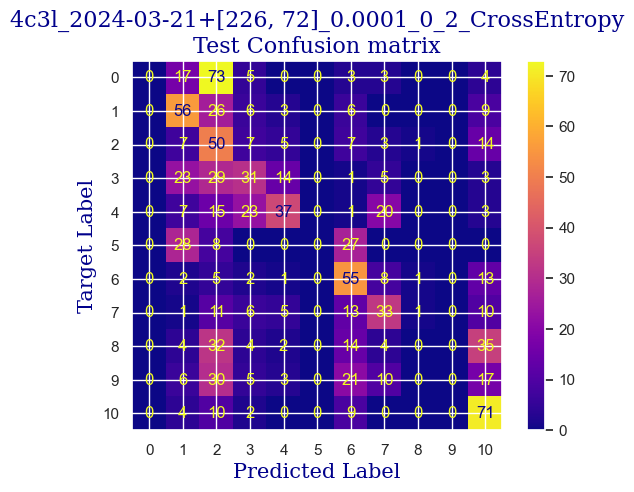

 
 END 4c3l [226, 72] Run Time:  3926.917797421018
Model:  4c3l  idx: 0 / 1
resolution:  [226, 72]   idx: 1 / 7
learning rate:  0.0001   idx: 0 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0   idx: 0 / 3
seed:  3   idx:  2 / 3
loss function:  CrossEntropy  idx: 0 / 1
199755.439414396
199743.028902881
Total epochs: 20


  0%|                                                                                                                        | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  9.161213563355146
validating...


  5%|█████▌                                                                                                          | 1/20 [00:12<03:51, 12.19s/it]

validation accuracy:  7.489597780859916
Training...
train accuracy:  10.053539559785841
validating...


 10%|███████████▏                                                                                                    | 2/20 [00:24<03:37, 12.06s/it]

validation accuracy:  7.489597780859916
Training...
train accuracy:  9.815585960737657
validating...


 15%|████████████████▊                                                                                               | 3/20 [00:36<03:23, 11.97s/it]

validation accuracy:  7.489597780859916
Training...
train accuracy:  12.73051754907793
validating...


 20%|██████████████████████▍                                                                                         | 4/20 [00:48<03:11, 11.99s/it]

validation accuracy:  16.50485436893204
Training...
train accuracy:  20.404521118381915
validating...


 25%|████████████████████████████                                                                                    | 5/20 [01:00<02:59, 12.00s/it]

validation accuracy:  26.21359223300971
Training...
train accuracy:  30.339083878643663
validating...


 30%|█████████████████████████████████▌                                                                              | 6/20 [01:12<02:47, 12.00s/it]

validation accuracy:  28.155339805825243
Training...
train accuracy:  34.50327186198691
validating...


 35%|███████████████████████████████████████▏                                                                        | 7/20 [01:23<02:35, 11.97s/it]

validation accuracy:  33.00970873786408
Training...
train accuracy:  38.96490184414039
validating...


 40%|████████████████████████████████████████████▊                                                                   | 8/20 [01:35<02:23, 11.92s/it]

validation accuracy:  32.73231622746186
Training...
train accuracy:  41.522903033908385
validating...


 45%|██████████████████████████████████████████████████▍                                                             | 9/20 [01:47<02:11, 11.97s/it]

validation accuracy:  33.42579750346741
Training...
train accuracy:  44.31885782272457
validating...


 50%|███████████████████████████████████████████████████████▌                                                       | 10/20 [01:59<01:59, 11.98s/it]

validation accuracy:  36.1997226074896
Training...
train accuracy:  44.97323022010708
validating...


 55%|█████████████████████████████████████████████████████████████                                                  | 11/20 [02:11<01:48, 12.01s/it]

validation accuracy:  36.615811373092924
Training...
train accuracy:  45.27067221891731
validating...


 60%|██████████████████████████████████████████████████████████████████▌                                            | 12/20 [02:24<01:36, 12.03s/it]

validation accuracy:  36.615811373092924
Training...
train accuracy:  47.88816180844736
validating...


 65%|████████████████████████████████████████████████████████████████████████▏                                      | 13/20 [02:36<01:24, 12.04s/it]

validation accuracy:  35.64493758668516
Training...
train accuracy:  47.59071980963712
validating...


 70%|█████████████████████████████████████████████████████████████████████████████▋                                 | 14/20 [02:48<01:12, 12.03s/it]

validation accuracy:  34.812760055478506
Training...
train accuracy:  48.60202260559191
validating...


 75%|███████████████████████████████████████████████████████████████████████████████████▎                           | 15/20 [03:00<01:00, 12.04s/it]

validation accuracy:  38.00277392510402
Training...
train accuracy:  49.43486020226056
validating...


 80%|████████████████████████████████████████████████████████████████████████████████████████▊                      | 16/20 [03:12<00:48, 12.03s/it]

validation accuracy:  38.00277392510402
Training...
train accuracy:  51.04104699583581
validating...


 85%|██████████████████████████████████████████████████████████████████████████████████████████████▎                | 17/20 [03:24<00:35, 11.99s/it]

validation accuracy:  37.586685159500696
Training...
train accuracy:  52.76621058893516
validating...


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████▉           | 18/20 [03:36<00:24, 12.06s/it]

validation accuracy:  37.17059639389736
Training...
train accuracy:  53.896490184414034
validating...


 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 19/20 [03:48<00:12, 12.05s/it]

validation accuracy:  39.25104022191401
Training...
train accuracy:  55.02676977989292
validating...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [04:00<00:00, 12.02s/it]

validation accuracy:  37.7253814147018
Testing...


 
 train acc:  55.02676977989292
 
 val acc:  37.7253814147018
 
 test acc:  38.15533980582524


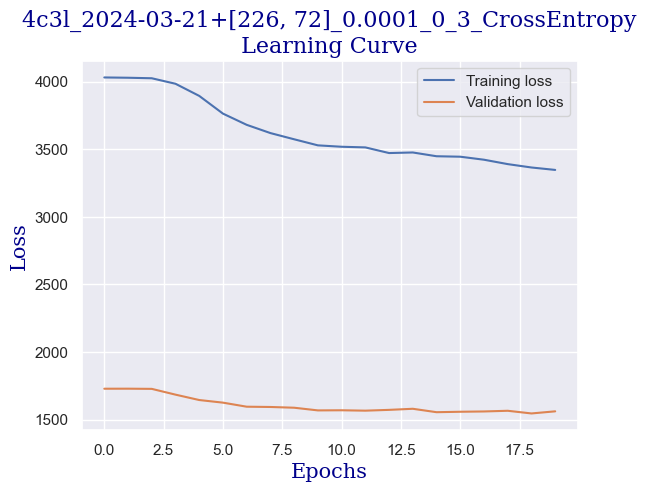

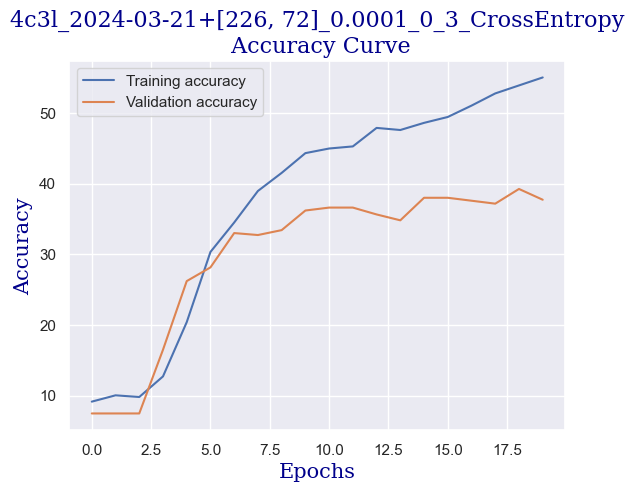

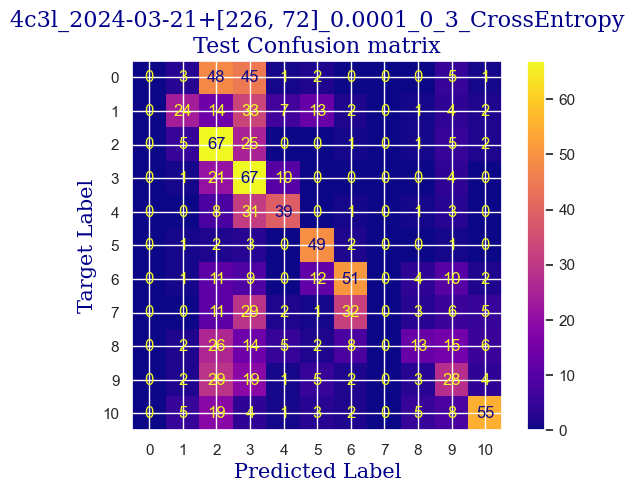

 
 END 4c3l [226, 72] Run Time:  3932.9992710560036
Model:  4c3l  idx: 0 / 1
resolution:  [226, 72]   idx: 1 / 7
learning rate:  0.0001   idx: 0 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.1   idx: 1 / 3
seed:  8   idx:  0 / 3
loss function:  CrossEntropy  idx: 0 / 1
203688.440041595
203676.029524323
Total epochs: 20


  0%|                                                                                                                        | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  8.209399167162404
validating...


  5%|█████▌                                                                                                          | 1/20 [00:12<03:48, 12.02s/it]

validation accuracy:  9.57004160887656
Training...
train accuracy:  9.220701963117191
validating...


 10%|███████████▏                                                                                                    | 2/20 [00:24<03:36, 12.04s/it]

validation accuracy:  9.57004160887656
Training...
train accuracy:  10.291493158834028
validating...


 15%|████████████████▊                                                                                               | 3/20 [00:36<03:24, 12.05s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.826888756692444
validating...


 20%|██████████████████████▍                                                                                         | 4/20 [00:47<03:11, 11.95s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  9.637120761451518
validating...


 25%|████████████████████████████                                                                                    | 5/20 [00:59<02:59, 11.96s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  11.481261154074955
validating...


 30%|█████████████████████████████████▌                                                                              | 6/20 [01:11<02:47, 11.95s/it]

validation accuracy:  15.256588072122051
Training...
train accuracy:  20.761451516954192
validating...


 35%|███████████████████████████████████████▏                                                                        | 7/20 [01:23<02:35, 11.96s/it]

validation accuracy:  23.855755894590846
Training...
train accuracy:  25.81796549672814
validating...


 40%|████████████████████████████████████████████▊                                                                   | 8/20 [01:35<02:23, 11.98s/it]

validation accuracy:  24.965325936199722
Training...
train accuracy:  27.42415229030339
validating...


 45%|██████████████████████████████████████████████████▍                                                             | 9/20 [01:47<02:11, 11.96s/it]

validation accuracy:  28.9875173370319
Training...
train accuracy:  29.803688280785245
validating...


 50%|███████████████████████████████████████████████████████▌                                                       | 10/20 [01:59<01:59, 12.00s/it]

validation accuracy:  27.461858529819693
Training...
train accuracy:  31.35038667459845
validating...


 55%|█████████████████████████████████████████████████████████████                                                  | 11/20 [02:11<01:47, 11.98s/it]

validation accuracy:  29.26490984743412
Training...
train accuracy:  32.54015466983938
validating...


 60%|██████████████████████████████████████████████████████████████████▌                                            | 12/20 [02:23<01:35, 11.99s/it]

validation accuracy:  29.26490984743412
Training...
train accuracy:  32.24271267102915
validating...


 65%|████████████████████████████████████████████████████████████████████████▏                                      | 13/20 [02:35<01:23, 11.99s/it]

validation accuracy:  26.629680998613036
Training...
train accuracy:  32.59964306960143
validating...


 70%|█████████████████████████████████████████████████████████████████████████████▋                                 | 14/20 [02:47<01:12, 12.04s/it]

validation accuracy:  31.06796116504854
Training...
train accuracy:  33.49196906603213
validating...


 75%|███████████████████████████████████████████████████████████████████████████████████▎                           | 15/20 [02:59<01:00, 12.02s/it]

validation accuracy:  27.739251040221912
Training...
train accuracy:  36.109458655562165
validating...


 80%|████████████████████████████████████████████████████████████████████████████████████████▊                      | 16/20 [03:11<00:48, 12.00s/it]

validation accuracy:  29.680998613037445
Training...
train accuracy:  36.64485425342058
validating...


 85%|██████████████████████████████████████████████████████████████████████████████████████████████▎                | 17/20 [03:23<00:36, 12.01s/it]

validation accuracy:  28.9875173370319
Training...
train accuracy:  37.180249851279
validating...


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████▉           | 18/20 [03:35<00:24, 12.00s/it]

validation accuracy:  30.513176144244103
Training...
train accuracy:  38.13206424747174
validating...


 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 19/20 [03:47<00:11, 11.98s/it]

validation accuracy:  28.01664355062413
Training...
train accuracy:  38.429506246281974
validating...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [03:59<00:00, 11.99s/it]

validation accuracy:  28.9875173370319
Testing...


 
 train acc:  38.429506246281974
 
 val acc:  28.9875173370319
 
 test acc:  30.29126213592233


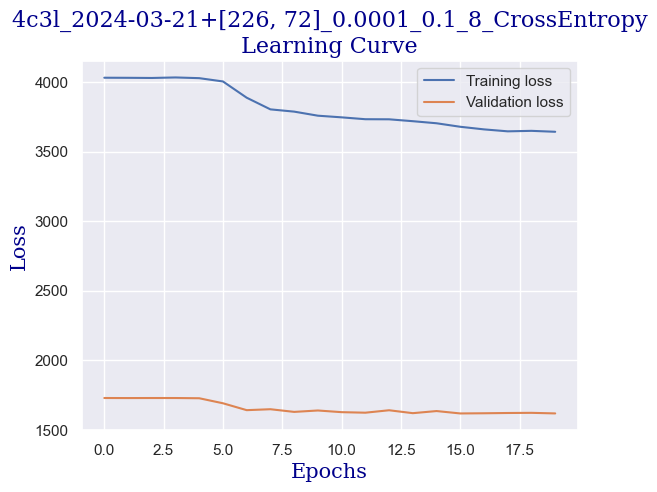

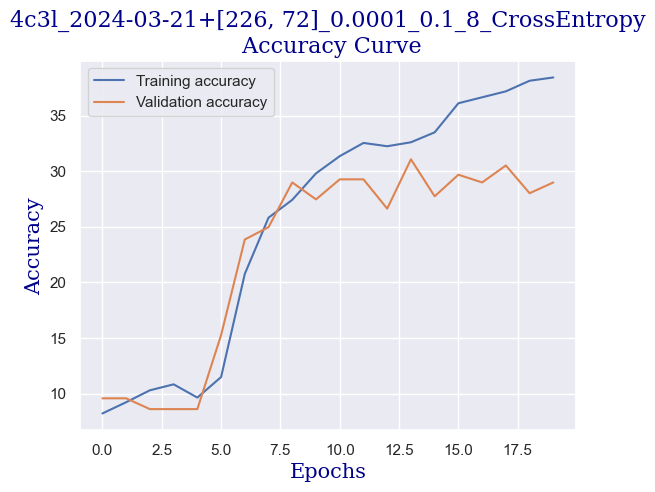

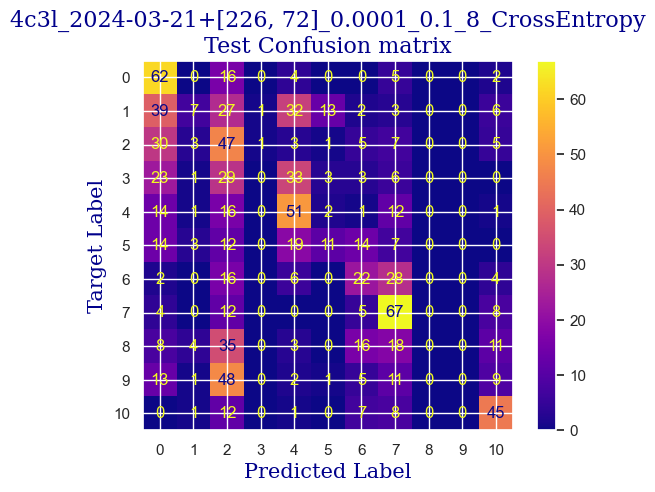

 
 END 4c3l [226, 72] Run Time:  3929.4920703380194
Model:  4c3l  idx: 0 / 1
resolution:  [226, 72]   idx: 1 / 7
learning rate:  0.0001   idx: 0 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.1   idx: 1 / 3
seed:  2   idx:  1 / 3
loss function:  CrossEntropy  idx: 0 / 1
207617.933315405
207605.522800062
Total epochs: 20


  0%|                                                                                                                        | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  8.625817965496728
validating...


  5%|█████▌                                                                                                          | 1/20 [00:12<03:49, 12.08s/it]

validation accuracy:  8.737864077669903
Training...
train accuracy:  10.350981558596075
validating...


 10%|███████████▏                                                                                                    | 2/20 [00:24<03:35, 11.99s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.053539559785841
validating...


 15%|████████████████▊                                                                                               | 3/20 [00:36<03:24, 12.01s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.350981558596075
validating...


 20%|██████████████████████▍                                                                                         | 4/20 [00:48<03:12, 12.01s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.648423557406305
validating...


 25%|████████████████████████████                                                                                    | 5/20 [01:00<03:00, 12.04s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  9.815585960737657
validating...


 30%|█████████████████████████████████▌                                                                              | 6/20 [01:12<02:47, 11.99s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.350981558596075
validating...


 35%|███████████████████████████████████████▏                                                                        | 7/20 [01:23<02:35, 11.94s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  11.124330755502678
validating...


 40%|████████████████████████████████████████████▊                                                                   | 8/20 [01:35<02:23, 11.94s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  11.005353955978585
validating...


 45%|██████████████████████████████████████████████████▍                                                             | 9/20 [01:47<02:11, 11.96s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.23200475907198
validating...


 50%|███████████████████████████████████████████████████████▌                                                       | 10/20 [01:59<01:59, 11.98s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  13.444378346222486
validating...


 55%|█████████████████████████████████████████████████████████████                                                  | 11/20 [02:11<01:47, 11.97s/it]

validation accuracy:  17.475728155339805
Training...
train accuracy:  20.404521118381915
validating...


 60%|██████████████████████████████████████████████████████████████████▌                                            | 12/20 [02:23<01:35, 11.96s/it]

validation accuracy:  12.066574202496533
Training...
train accuracy:  27.007733491969066
validating...


 65%|████████████████████████████████████████████████████████████████████████▏                                      | 13/20 [02:35<01:23, 11.97s/it]

validation accuracy:  26.0748959778086
Training...
train accuracy:  33.372992266508035
validating...


 70%|█████████████████████████████████████████████████████████████████████████████▋                                 | 14/20 [02:47<01:11, 11.99s/it]

validation accuracy:  25.79750346740638
Training...
train accuracy:  34.68173706127305
validating...


 75%|███████████████████████████████████████████████████████████████████████████████████▎                           | 15/20 [02:59<00:59, 11.89s/it]

validation accuracy:  29.126213592233007
Training...
train accuracy:  35.75252825698988
validating...


 80%|████████████████████████████████████████████████████████████████████████████████████████▊                      | 16/20 [03:11<00:47, 11.88s/it]

validation accuracy:  23.300970873786408
Training...
train accuracy:  36.4069006543724
validating...


 85%|██████████████████████████████████████████████████████████████████████████████████████████████▎                | 17/20 [03:23<00:35, 11.87s/it]

validation accuracy:  30.097087378640776
Training...
train accuracy:  38.786436644854255
validating...


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████▉           | 18/20 [03:35<00:23, 11.89s/it]

validation accuracy:  30.235783633841883
Training...
train accuracy:  40.333135038667464
validating...


 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 19/20 [03:47<00:11, 11.93s/it]

validation accuracy:  28.01664355062413
Training...
train accuracy:  41.58239143367044
validating...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [03:58<00:00, 11.94s/it]

validation accuracy:  31.900138696255205
Testing...


 
 train acc:  41.58239143367044
 
 val acc:  31.900138696255205
 
 test acc:  31.2621359223301


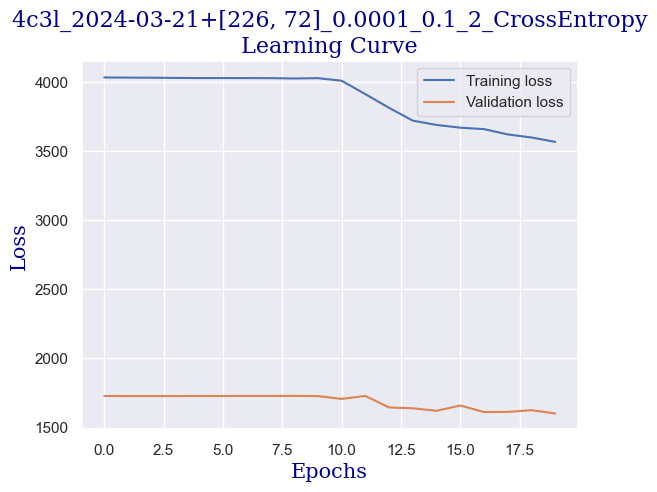

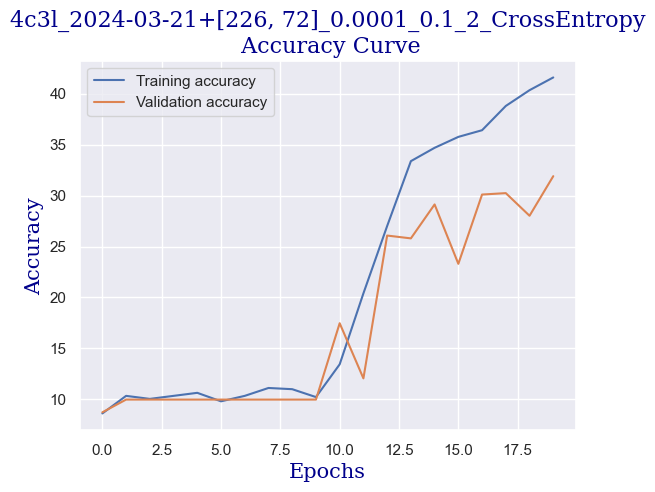

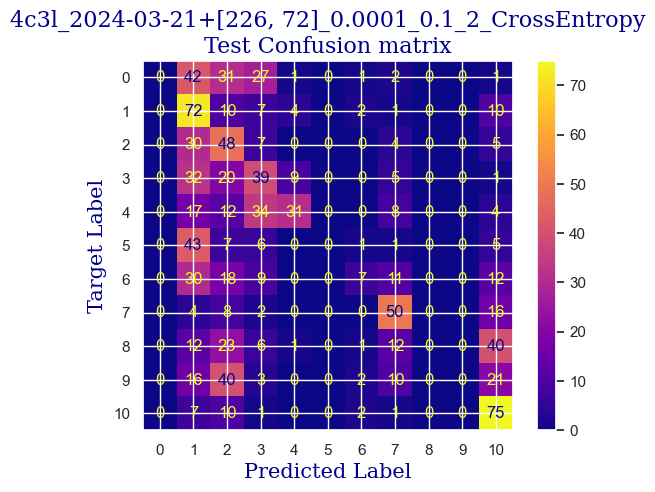

 
 END 4c3l [226, 72] Run Time:  3923.3908169609786
Model:  4c3l  idx: 0 / 1
resolution:  [226, 72]   idx: 1 / 7
learning rate:  0.0001   idx: 0 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.1   idx: 1 / 3
seed:  3   idx:  2 / 3
loss function:  CrossEntropy  idx: 0 / 1
211541.325287882
211528.914771468
Total epochs: 20


  0%|                                                                                                                        | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  9.57763236168947
validating...


  5%|█████▌                                                                                                          | 1/20 [00:12<03:49, 12.05s/it]

validation accuracy:  11.511789181692095
Training...
train accuracy:  10.350981558596075
validating...


 10%|███████████▏                                                                                                    | 2/20 [00:23<03:35, 11.95s/it]

validation accuracy:  11.511789181692095
Training...
train accuracy:  9.994051160023796
validating...


 15%|████████████████▊                                                                                               | 3/20 [00:35<03:23, 11.96s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  8.863771564544914
validating...


 20%|██████████████████████▍                                                                                         | 4/20 [00:47<03:11, 11.99s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  11.421772754312908
validating...


 25%|████████████████████████████                                                                                    | 5/20 [01:00<03:00, 12.03s/it]

validation accuracy:  7.489597780859916
Training...
train accuracy:  11.24330755502677
validating...


 30%|█████████████████████████████████▌                                                                              | 6/20 [01:12<02:48, 12.02s/it]

validation accuracy:  7.489597780859916
Training...
train accuracy:  8.387864366448543
validating...


 35%|███████████████████████████████████████▏                                                                        | 7/20 [01:24<02:36, 12.05s/it]

validation accuracy:  7.489597780859916
Training...
train accuracy:  9.815585960737657
validating...


 40%|████████████████████████████████████████████▊                                                                   | 8/20 [01:36<02:24, 12.05s/it]

validation accuracy:  7.489597780859916
Training...
train accuracy:  9.458655562165378
validating...


 45%|██████████████████████████████████████████████████▍                                                             | 9/20 [01:48<02:12, 12.07s/it]

validation accuracy:  7.489597780859916
Training...
train accuracy:  10.41046995835812
validating...


 50%|███████████████████████████████████████████████████████▌                                                       | 10/20 [02:00<02:00, 12.09s/it]

validation accuracy:  7.489597780859916
Training...
train accuracy:  9.696609161213564
validating...


 55%|█████████████████████████████████████████████████████████████                                                  | 11/20 [02:12<01:48, 12.10s/it]

validation accuracy:  7.489597780859916
Training...
train accuracy:  8.982748364069007
validating...


 60%|██████████████████████████████████████████████████████████████████▌                                            | 12/20 [02:24<01:36, 12.10s/it]

validation accuracy:  7.489597780859916
Training...
train accuracy:  10.469958358120167
validating...


 65%|████████████████████████████████████████████████████████████████████████▏                                      | 13/20 [02:36<01:24, 12.06s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  9.280190362879239
validating...


 70%|█████████████████████████████████████████████████████████████████████████████▋                                 | 14/20 [02:48<01:12, 12.08s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  10.529446757882214
validating...


 75%|███████████████████████████████████████████████████████████████████████████████████▎                           | 15/20 [03:00<01:00, 12.08s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  10.23200475907198
validating...


 80%|████████████████████████████████████████████████████████████████████████████████████████▊                      | 16/20 [03:12<00:48, 12.09s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  9.875074360499703
validating...


 85%|██████████████████████████████████████████████████████████████████████████████████████████████▎                | 17/20 [03:25<00:36, 12.09s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  10.767400356930398
validating...


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████▉           | 18/20 [03:37<00:24, 12.08s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  10.291493158834028
validating...


 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 19/20 [03:49<00:12, 12.06s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  10.648423557406305
validating...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [04:01<00:00, 12.06s/it]

validation accuracy:  7.489597780859916
Testing...


 
 train acc:  10.648423557406305
 
 val acc:  7.489597780859916
 
 test acc:  10.0


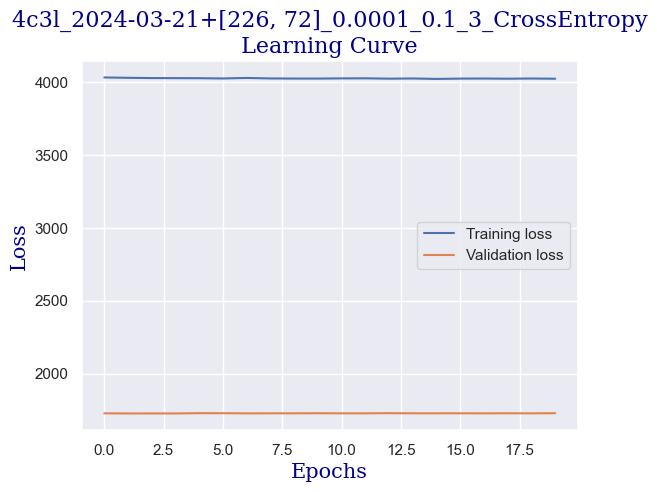

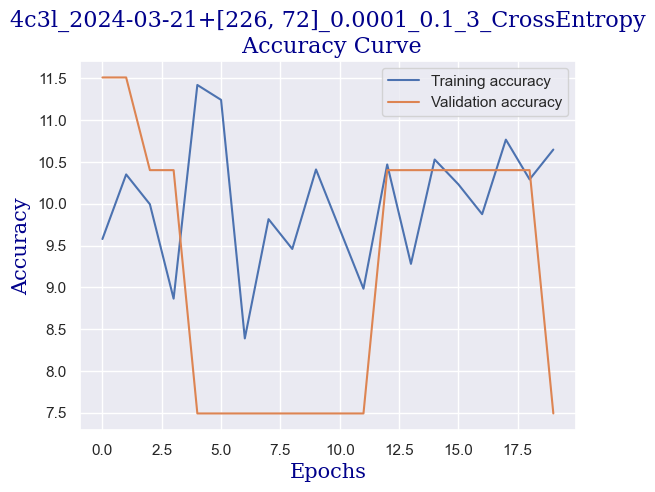

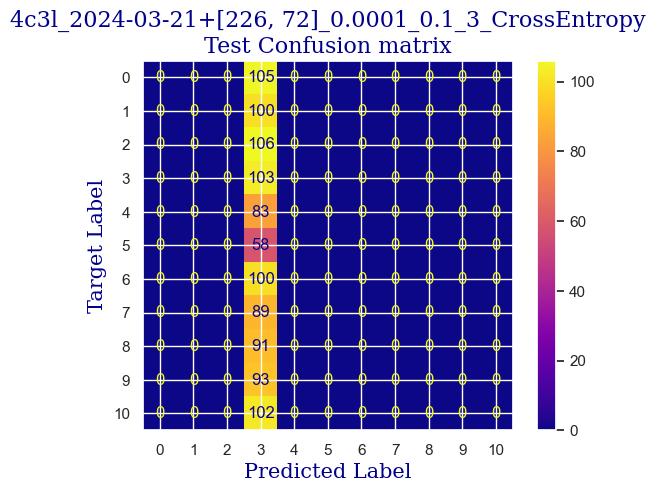

 
 END 4c3l [226, 72] Run Time:  3936.9108499819995
Model:  4c3l  idx: 0 / 1
resolution:  [226, 72]   idx: 1 / 7
learning rate:  0.0001   idx: 0 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.2   idx: 2 / 3
seed:  8   idx:  0 / 3
loss function:  CrossEntropy  idx: 0 / 1
215478.237395358
215465.826883173
Total epochs: 20


  0%|                                                                                                                        | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  9.339678762641284
validating...


  5%|█████▌                                                                                                          | 1/20 [00:12<03:49, 12.08s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.469958358120167
validating...


 10%|███████████▏                                                                                                    | 2/20 [00:24<03:37, 12.08s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.350981558596075
validating...


 15%|████████████████▊                                                                                               | 3/20 [00:36<03:24, 12.01s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  9.815585960737657
validating...


 20%|██████████████████████▍                                                                                         | 4/20 [00:48<03:12, 12.02s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  8.804283164782866
validating...


 25%|████████████████████████████                                                                                    | 5/20 [00:59<02:59, 11.97s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.053539559785841
validating...


 30%|█████████████████████████████████▌                                                                              | 6/20 [01:11<02:47, 11.94s/it]

validation accuracy:  12.482662968099861
Training...
train accuracy:  15.050565139797738
validating...


 35%|███████████████████████████████████████▏                                                                        | 7/20 [01:23<02:35, 11.95s/it]

validation accuracy:  24.410540915395284
Training...
train accuracy:  27.78108268887567
validating...


 40%|████████████████████████████████████████████▊                                                                   | 8/20 [01:35<02:23, 11.96s/it]

validation accuracy:  35.64493758668516
Training...
train accuracy:  36.22843545508626
validating...


 45%|██████████████████████████████████████████████████▍                                                             | 9/20 [01:47<02:11, 11.96s/it]

validation accuracy:  33.841886269070734
Training...
train accuracy:  40.98750743604997
validating...


 50%|███████████████████████████████████████████████████████▌                                                       | 10/20 [01:59<01:58, 11.89s/it]

validation accuracy:  38.83495145631068
Training...
train accuracy:  42.653182629387274
validating...


 55%|█████████████████████████████████████████████████████████████                                                  | 11/20 [02:11<01:47, 11.92s/it]

validation accuracy:  25.52011095700416
Training...
train accuracy:  41.99881023200476
validating...


 60%|██████████████████████████████████████████████████████████████████▌                                            | 12/20 [02:23<01:35, 11.94s/it]

validation accuracy:  38.83495145631068
Training...
train accuracy:  44.31885782272457
validating...


 65%|████████████████████████████████████████████████████████████████████████▏                                      | 13/20 [02:35<01:23, 11.98s/it]

validation accuracy:  39.528432732316226
Training...
train accuracy:  44.79476502082094
validating...


 70%|█████████████████████████████████████████████████████████████████████████████▋                                 | 14/20 [02:47<01:11, 11.97s/it]

validation accuracy:  38.28016643550624
Training...
train accuracy:  46.87685901249257
validating...


 75%|███████████████████████████████████████████████████████████████████████████████████▎                           | 15/20 [02:59<00:59, 11.99s/it]

validation accuracy:  38.97364771151179
Training...
train accuracy:  49.07792980368828
validating...


 80%|████████████████████████████████████████████████████████████████████████████████████████▊                      | 16/20 [03:11<00:47, 11.95s/it]

validation accuracy:  42.71844660194174
Training...
train accuracy:  49.13741820345033
validating...


 85%|██████████████████████████████████████████████████████████████████████████████████████████████▎                | 17/20 [03:23<00:35, 11.99s/it]

validation accuracy:  38.41886269070735
Training...
train accuracy:  49.31588340273647
validating...


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████▉           | 18/20 [03:35<00:24, 12.01s/it]

validation accuracy:  43.828016643550626
Training...
train accuracy:  50.386674598453304
validating...


 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 19/20 [03:47<00:11, 11.96s/it]

validation accuracy:  38.28016643550624
Training...
train accuracy:  53.12314098750743
validating...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [03:59<00:00, 11.97s/it]

validation accuracy:  37.447988904299585
Testing...


 
 train acc:  53.12314098750743
 
 val acc:  37.447988904299585
 
 test acc:  35.24271844660194


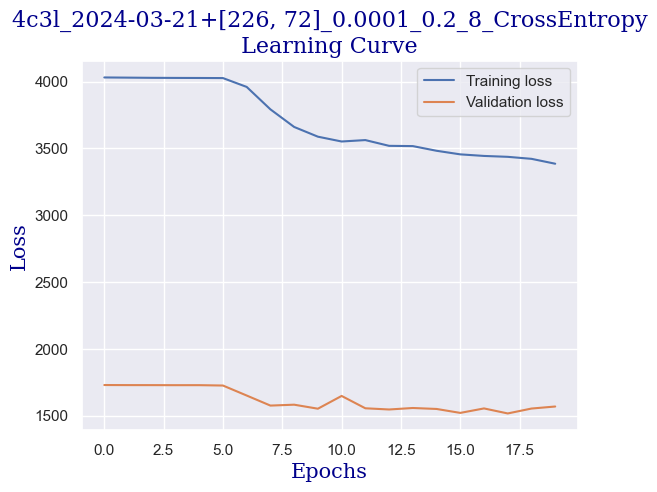

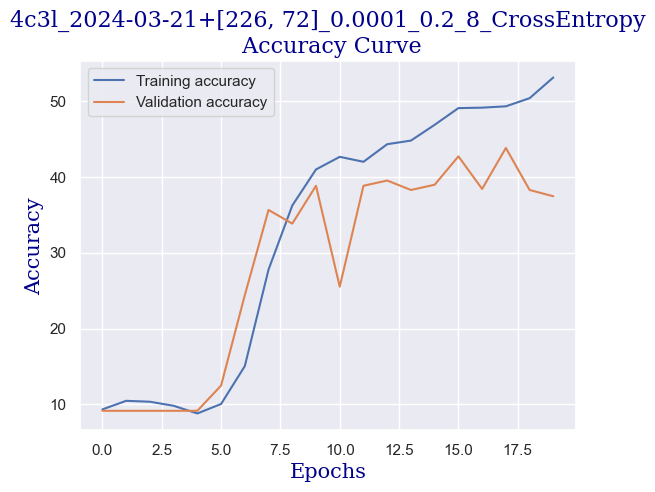

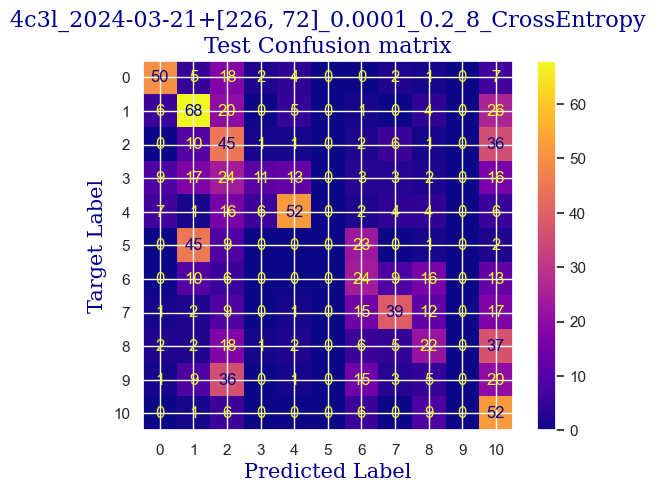

 
 END 4c3l [226, 72] Run Time:  3919.561999128986
Model:  4c3l  idx: 0 / 1
resolution:  [226, 72]   idx: 1 / 7
learning rate:  0.0001   idx: 0 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.2   idx: 2 / 3
seed:  2   idx:  1 / 3
loss function:  CrossEntropy  idx: 0 / 1
219397.800617232
219385.390106535
Total epochs: 20


  0%|                                                                                                                        | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  9.637120761451518
validating...


  5%|█████▌                                                                                                          | 1/20 [00:12<03:51, 12.20s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.291493158834028
validating...


 10%|███████████▏                                                                                                    | 2/20 [00:24<03:36, 12.02s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.826888756692444
validating...


 15%|████████████████▊                                                                                               | 3/20 [00:36<03:24, 12.05s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  11.183819155264723
validating...


 20%|██████████████████████▍                                                                                         | 4/20 [00:48<03:12, 12.04s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.648423557406305
validating...


 25%|████████████████████████████                                                                                    | 5/20 [01:00<03:01, 12.07s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.291493158834028
validating...


 30%|█████████████████████████████████▌                                                                              | 6/20 [01:12<02:49, 12.12s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  11.362284354550862
validating...


 35%|███████████████████████████████████████▏                                                                        | 7/20 [01:24<02:36, 12.04s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.41046995835812
validating...


 40%|████████████████████████████████████████████▊                                                                   | 8/20 [01:36<02:24, 12.04s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  11.302795954788817
validating...


 45%|██████████████████████████████████████████████████▍                                                             | 9/20 [01:48<02:12, 12.09s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.350981558596075
validating...


 50%|███████████████████████████████████████████████████████▌                                                       | 10/20 [02:00<02:00, 12.09s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  11.362284354550862
validating...


 55%|█████████████████████████████████████████████████████████████                                                  | 11/20 [02:12<01:48, 12.11s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.648423557406305
validating...


 60%|██████████████████████████████████████████████████████████████████▌                                            | 12/20 [02:24<01:36, 12.10s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  11.06484235574063
validating...


 65%|████████████████████████████████████████████████████████████████████████▏                                      | 13/20 [02:37<01:24, 12.10s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.291493158834028
validating...


 70%|█████████████████████████████████████████████████████████████████████████████▋                                 | 14/20 [02:49<01:12, 12.07s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.945865556216537
validating...


 75%|███████████████████████████████████████████████████████████████████████████████████▎                           | 15/20 [03:01<01:00, 12.07s/it]

validation accuracy:  8.460471567267684
Training...
train accuracy:  17.37061273051755
validating...


 80%|████████████████████████████████████████████████████████████████████████████████████████▊                      | 16/20 [03:13<00:48, 12.04s/it]

validation accuracy:  17.891816920943135
Training...
train accuracy:  24.568709101725165
validating...


 85%|██████████████████████████████████████████████████████████████████████████████████████████████▎                | 17/20 [03:25<00:36, 12.04s/it]

validation accuracy:  23.994452149791957
Training...
train accuracy:  29.08982748364069
validating...


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████▉           | 18/20 [03:36<00:23, 11.98s/it]

validation accuracy:  28.57142857142857
Training...
train accuracy:  32.3022010707912
validating...


 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 19/20 [03:48<00:11, 11.97s/it]

validation accuracy:  28.01664355062413
Training...
train accuracy:  33.135038667459845
validating...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [04:00<00:00, 12.05s/it]

validation accuracy:  27.739251040221912
Testing...


 
 train acc:  33.135038667459845
 
 val acc:  27.739251040221912
 
 test acc:  27.184466019417474


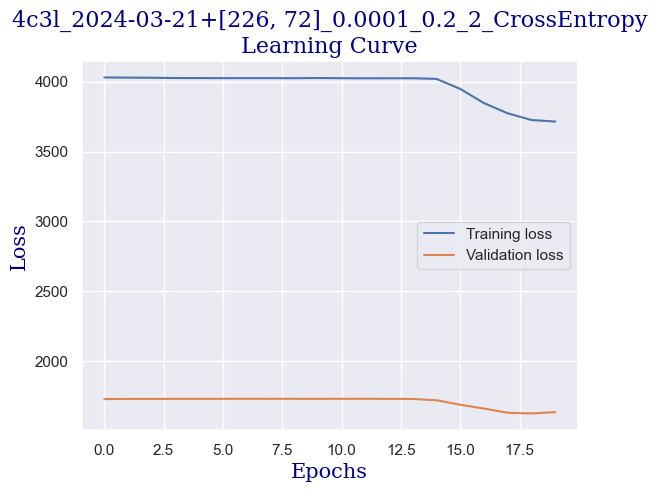

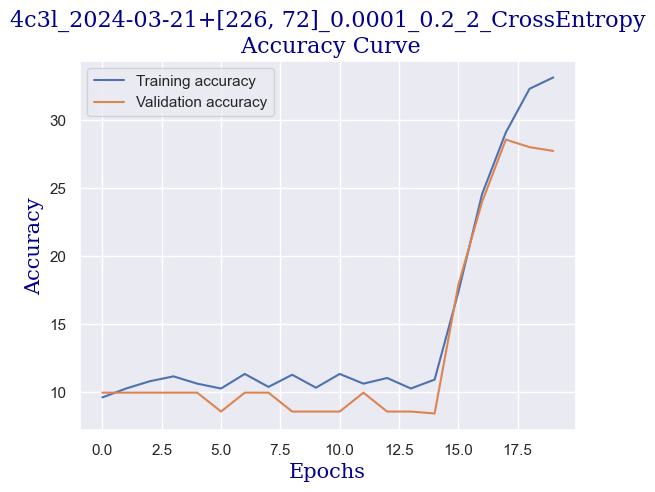

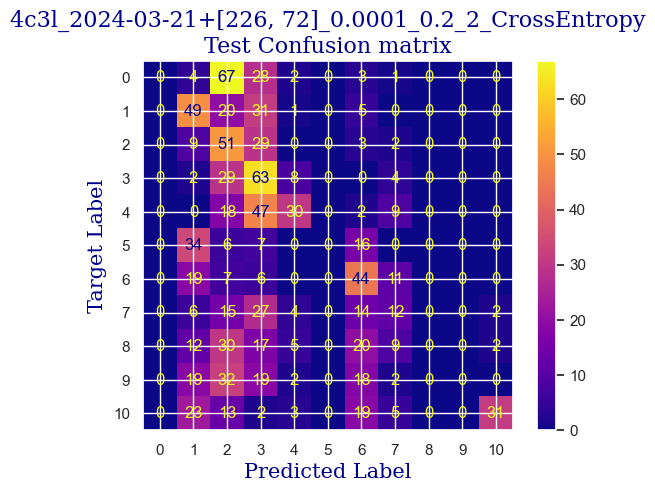

 
 END 4c3l [226, 72] Run Time:  3945.038656515011
Model:  4c3l  idx: 0 / 1
resolution:  [226, 72]   idx: 1 / 7
learning rate:  0.0001   idx: 0 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.2   idx: 2 / 3
seed:  3   idx:  2 / 3
loss function:  CrossEntropy  idx: 0 / 1
223342.84059859
223330.430087697
Total epochs: 20


  0%|                                                                                                                        | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  8.74479476502082
validating...


  5%|█████▌                                                                                                          | 1/20 [00:11<03:47, 11.98s/it]

validation accuracy:  11.511789181692095
Training...
train accuracy:  10.291493158834028
validating...


 10%|███████████▏                                                                                                    | 2/20 [00:24<03:36, 12.03s/it]

validation accuracy:  11.511789181692095
Training...
train accuracy:  9.637120761451518
validating...


 15%|████████████████▊                                                                                               | 3/20 [00:36<03:24, 12.05s/it]

validation accuracy:  11.511789181692095
Training...
train accuracy:  9.458655562165378
validating...


 20%|██████████████████████▍                                                                                         | 4/20 [00:47<03:11, 11.96s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  10.826888756692444
validating...


 25%|████████████████████████████                                                                                    | 5/20 [00:59<02:58, 11.93s/it]

validation accuracy:  7.489597780859916
Training...
train accuracy:  14.812611540749554
validating...


 30%|█████████████████████████████████▌                                                                              | 6/20 [01:11<02:47, 11.94s/it]

validation accuracy:  18.446601941747574
Training...
train accuracy:  17.608566329565733
validating...


 35%|███████████████████████████████████████▏                                                                        | 7/20 [01:23<02:35, 11.98s/it]

validation accuracy:  19.55617198335645
Training...
train accuracy:  17.846519928613922
validating...


 40%|████████████████████████████████████████████▊                                                                   | 8/20 [01:35<02:23, 11.98s/it]

validation accuracy:  19.694868238557557
Training...
train accuracy:  17.906008328375968
validating...


 45%|██████████████████████████████████████████████████▍                                                             | 9/20 [01:47<02:11, 11.95s/it]

validation accuracy:  18.58529819694868
Training...
train accuracy:  18.441403926234383
validating...


 50%|███████████████████████████████████████████████████████▌                                                       | 10/20 [01:59<01:59, 11.95s/it]

validation accuracy:  18.8626907073509
Training...
train accuracy:  18.85782272456871
validating...


 55%|█████████████████████████████████████████████████████████████                                                  | 11/20 [02:11<01:47, 11.97s/it]

validation accuracy:  19.14008321775312
Training...
train accuracy:  18.9767995240928
validating...


 60%|██████████████████████████████████████████████████████████████████▌                                            | 12/20 [02:23<01:35, 11.96s/it]

validation accuracy:  18.58529819694868
Training...
train accuracy:  19.51219512195122
validating...


 65%|████████████████████████████████████████████████████████████████████████▏                                      | 13/20 [02:35<01:23, 11.96s/it]

validation accuracy:  18.723994452149793
Training...
train accuracy:  19.452706722189173
validating...


 70%|█████████████████████████████████████████████████████████████████████████████▋                                 | 14/20 [02:47<01:11, 11.93s/it]

validation accuracy:  18.446601941747574
Training...
train accuracy:  19.869125520523497
validating...


 75%|███████████████████████████████████████████████████████████████████████████████████▎                           | 15/20 [02:59<00:59, 11.92s/it]

validation accuracy:  18.723994452149793
Training...
train accuracy:  19.631171921475314
validating...


 80%|████████████████████████████████████████████████████████████████████████████████████████▊                      | 16/20 [03:11<00:47, 11.95s/it]

validation accuracy:  19.55617198335645
Training...
train accuracy:  20.582986317668055
validating...


 85%|██████████████████████████████████████████████████████████████████████████████████████████████▎                | 17/20 [03:23<00:35, 11.96s/it]

validation accuracy:  19.27877947295423
Training...
train accuracy:  22.12968471148126
validating...


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████▉           | 18/20 [03:35<00:23, 11.98s/it]

validation accuracy:  19.55617198335645
Training...
train accuracy:  21.594289113622843
validating...


 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 19/20 [03:47<00:11, 11.95s/it]

validation accuracy:  20.249653259361995
Training...
train accuracy:  21.058893515764428
validating...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [03:59<00:00, 11.96s/it]

validation accuracy:  18.307905686546462
Testing...


 
 train acc:  21.058893515764428
 
 val acc:  18.307905686546462
 
 test acc:  15.922330097087379


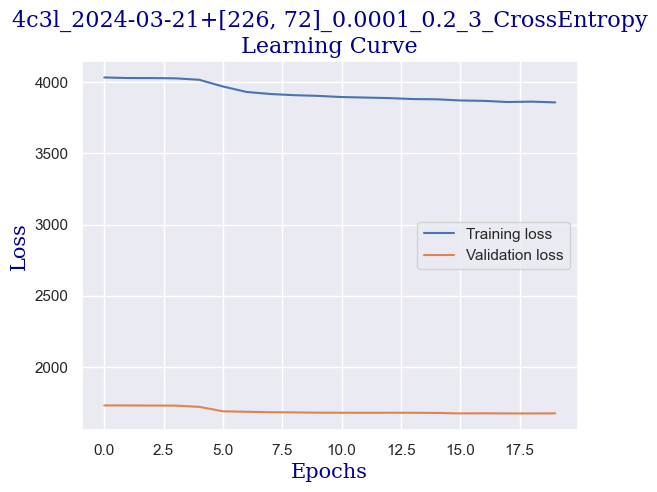

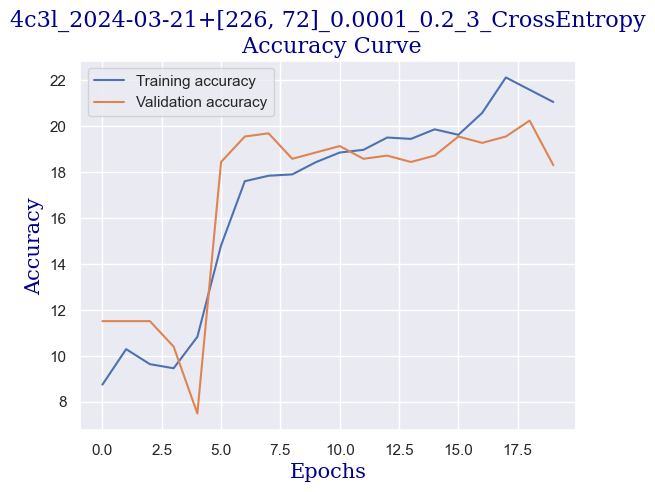

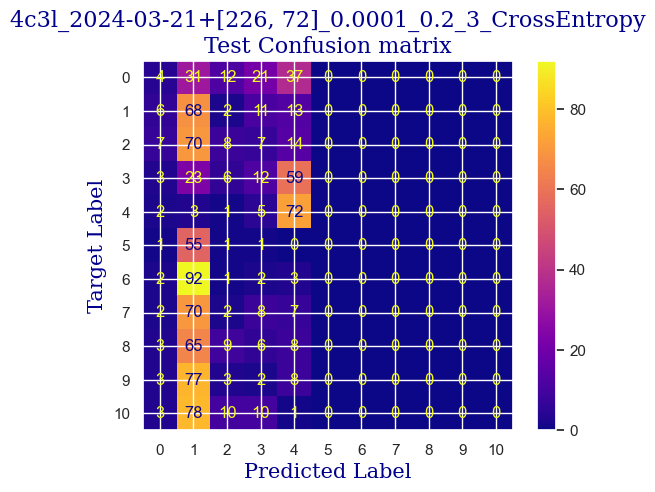

 
 END 4c3l [226, 72] Run Time:  3917.9966270909936
Model:  4c3l  idx: 0 / 1
resolution:  [226, 72]   idx: 1 / 7
learning rate:  6e-05   idx: 1 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0   idx: 0 / 3
seed:  8   idx:  0 / 3
loss function:  CrossEntropy  idx: 0 / 1
227260.838441482
227248.427924038
Total epochs: 20


  0%|                                                                                                                        | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  9.042236763831053
validating...


  5%|█████▌                                                                                                          | 1/20 [00:12<03:50, 12.11s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.648423557406305
validating...


 10%|███████████▏                                                                                                    | 2/20 [00:24<03:36, 12.01s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.529446757882214
validating...


 15%|████████████████▊                                                                                               | 3/20 [00:36<03:24, 12.03s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  14.336704342653183
validating...


 20%|██████████████████████▍                                                                                         | 4/20 [00:48<03:12, 12.06s/it]

validation accuracy:  19.14008321775312
Training...
train accuracy:  23.557406305770375
validating...


 25%|████████████████████████████                                                                                    | 5/20 [01:00<03:00, 12.06s/it]

validation accuracy:  26.352288488210817
Training...
train accuracy:  29.684711481261157
validating...


 30%|█████████████████████████████████▌                                                                              | 6/20 [01:12<02:47, 11.95s/it]

validation accuracy:  26.49098474341193
Training...
train accuracy:  32.3022010707912
validating...


 35%|███████████████████████████████████████▏                                                                        | 7/20 [01:24<02:35, 11.99s/it]

validation accuracy:  27.045769764216367
Training...
train accuracy:  34.50327186198691
validating...


 40%|████████████████████████████████████████████▊                                                                   | 8/20 [01:36<02:23, 11.99s/it]

validation accuracy:  31.761442441054093
Training...
train accuracy:  38.25104104699584
validating...


 45%|██████████████████████████████████████████████████▍                                                             | 9/20 [01:48<02:11, 11.99s/it]

validation accuracy:  33.14840499306519
Training...
train accuracy:  40.27364663890541
validating...


 50%|███████████████████████████████████████████████████████▌                                                       | 10/20 [01:59<01:59, 11.97s/it]

validation accuracy:  35.64493758668516
Training...
train accuracy:  44.37834622248661
validating...


 55%|█████████████████████████████████████████████████████████████                                                  | 11/20 [02:11<01:47, 11.93s/it]

validation accuracy:  36.33841886269071
Training...
train accuracy:  46.400951814396194
validating...


 60%|██████████████████████████████████████████████████████████████████▌                                            | 12/20 [02:23<01:35, 11.95s/it]

validation accuracy:  37.586685159500696
Training...
train accuracy:  49.01844140392623
validating...


 65%|████████████████████████████████████████████████████████████████████████▏                                      | 13/20 [02:35<01:23, 11.96s/it]

validation accuracy:  38.141470180305134
Training...
train accuracy:  50.386674598453304
validating...


 70%|█████████████████████████████████████████████████████████████████████████████▋                                 | 14/20 [02:47<01:12, 12.00s/it]

validation accuracy:  38.69625520110957
Training...
train accuracy:  52.34979179060083
validating...


 75%|███████████████████████████████████████████████████████████████████████████████████▎                           | 15/20 [02:59<01:00, 12.00s/it]

validation accuracy:  37.7253814147018
Training...
train accuracy:  53.24211778703153
validating...


 80%|████████████████████████████████████████████████████████████████████████████████████████▊                      | 16/20 [03:11<00:47, 11.95s/it]

validation accuracy:  37.17059639389736
Training...
train accuracy:  55.264723378941106
validating...


 85%|██████████████████████████████████████████████████████████████████████████████████████████████▎                | 17/20 [03:23<00:35, 11.93s/it]

validation accuracy:  37.86407766990291
Training...
train accuracy:  56.09756097560976
validating...


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████▉           | 18/20 [03:35<00:23, 11.95s/it]

validation accuracy:  38.41886269070735
Training...
train accuracy:  59.19095776323617
validating...


 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 19/20 [03:47<00:11, 11.97s/it]

validation accuracy:  40.083217753120664
Training...
train accuracy:  60.38072575847709
validating...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [03:59<00:00, 11.98s/it]

validation accuracy:  41.19278779472954
Testing...


 
 train acc:  60.38072575847709
 
 val acc:  41.19278779472954
 
 test acc:  37.28155339805825


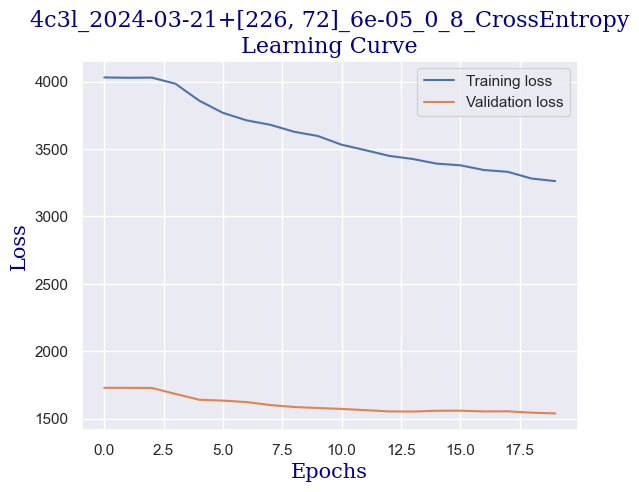

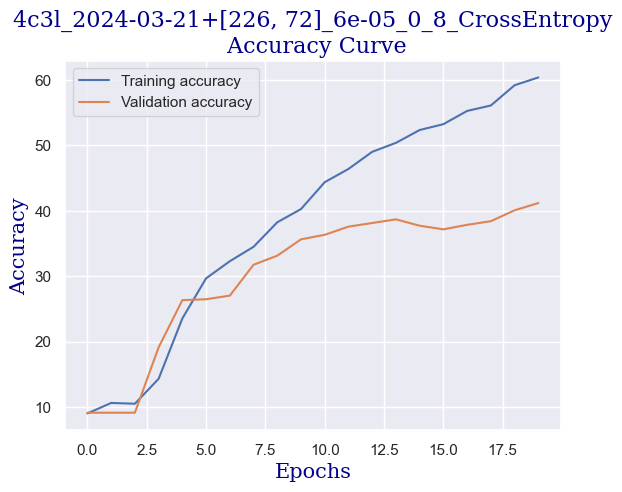

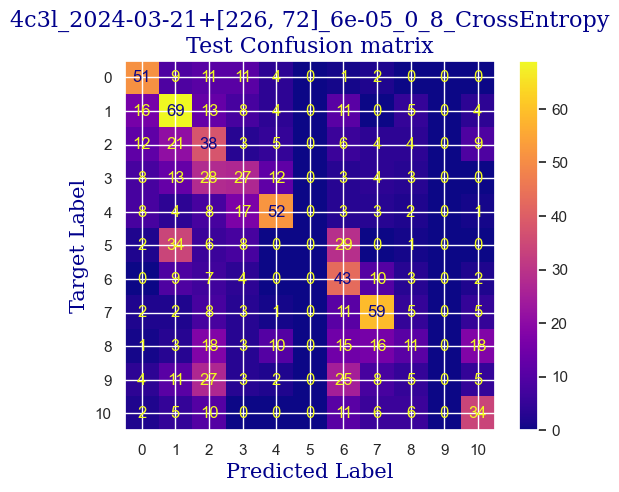

 
 END 4c3l [226, 72] Run Time:  3924.8075149370125
Model:  4c3l  idx: 0 / 1
resolution:  [226, 72]   idx: 1 / 7
learning rate:  6e-05   idx: 1 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0   idx: 0 / 3
seed:  2   idx:  1 / 3
loss function:  CrossEntropy  idx: 0 / 1
231185.647147211
231173.236644414
Total epochs: 20


  0%|                                                                                                                        | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  9.518143961927423
validating...


  5%|█████▌                                                                                                          | 1/20 [00:12<03:51, 12.20s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  9.815585960737657
validating...


 10%|███████████▏                                                                                                    | 2/20 [00:24<03:38, 12.13s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.172516359309935
validating...


 15%|████████████████▊                                                                                               | 3/20 [00:36<03:24, 12.05s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  9.815585960737657
validating...


 20%|██████████████████████▍                                                                                         | 4/20 [00:48<03:12, 12.03s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.886377156454492
validating...


 25%|████████████████████████████                                                                                    | 5/20 [01:00<03:00, 12.01s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.41046995835812
validating...


 30%|█████████████████████████████████▌                                                                              | 6/20 [01:12<02:48, 12.02s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.767400356930398
validating...


 35%|███████████████████████████████████████▏                                                                        | 7/20 [01:24<02:36, 12.02s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  11.302795954788817
validating...


 40%|████████████████████████████████████████████▊                                                                   | 8/20 [01:36<02:24, 12.04s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  11.124330755502678
validating...


 45%|██████████████████████████████████████████████████▍                                                             | 9/20 [01:48<02:12, 12.02s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  11.124330755502678
validating...


 50%|███████████████████████████████████████████████████████▌                                                       | 10/20 [02:00<02:00, 12.04s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.350981558596075
validating...


 55%|█████████████████████████████████████████████████████████████                                                  | 11/20 [02:12<01:48, 12.07s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.58893515764426
validating...


 60%|██████████████████████████████████████████████████████████████████▌                                            | 12/20 [02:24<01:36, 12.06s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.469958358120167
validating...


 65%|████████████████████████████████████████████████████████████████████████▏                                      | 13/20 [02:36<01:24, 12.02s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  12.07614515169542
validating...


 70%|█████████████████████████████████████████████████████████████████████████████▋                                 | 14/20 [02:48<01:12, 12.02s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.113027959547887
validating...


 75%|███████████████████████████████████████████████████████████████████████████████████▎                           | 15/20 [03:00<01:00, 12.01s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  11.302795954788817
validating...


 80%|████████████████████████████████████████████████████████████████████████████████████████▊                      | 16/20 [03:12<00:48, 12.01s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.945865556216537
validating...


 85%|██████████████████████████████████████████████████████████████████████████████████████████████▎                | 17/20 [03:24<00:35, 11.98s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.826888756692444
validating...


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████▉           | 18/20 [03:36<00:23, 11.98s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  11.600237953599049
validating...


 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 19/20 [03:48<00:11, 11.98s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  11.24330755502677
validating...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [04:00<00:00, 12.01s/it]

validation accuracy:  8.599167822468793
Testing...


 
 train acc:  11.24330755502677
 
 val acc:  8.599167822468793
 
 test acc:  9.12621359223301


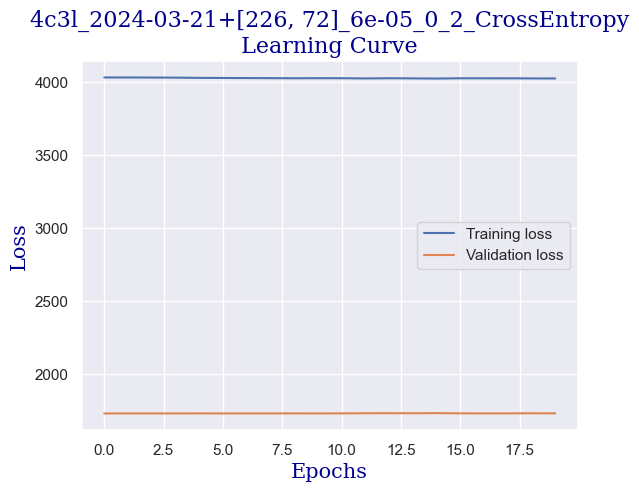

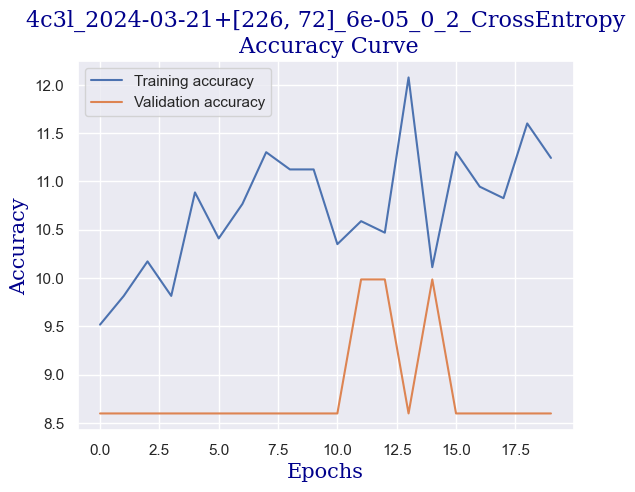

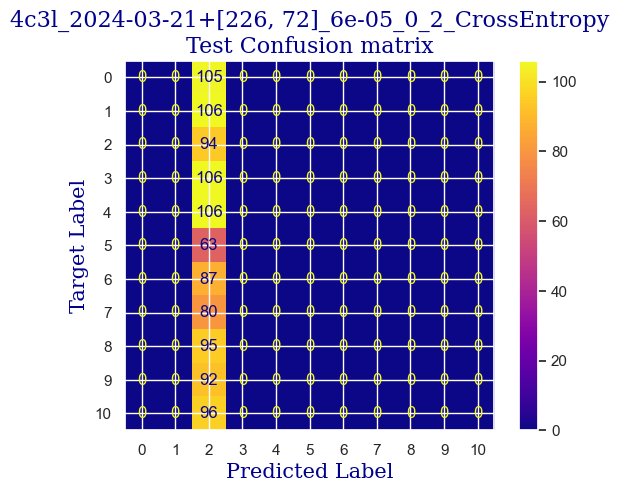

 
 END 4c3l [226, 72] Run Time:  3937.98097213899
Model:  4c3l  idx: 0 / 1
resolution:  [226, 72]   idx: 1 / 7
learning rate:  6e-05   idx: 1 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0   idx: 0 / 3
seed:  3   idx:  2 / 3
loss function:  CrossEntropy  idx: 0 / 1
235123.629338342
235111.218825986
Total epochs: 20


  0%|                                                                                                                        | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  8.804283164782866
validating...


  5%|█████▌                                                                                                          | 1/20 [00:12<03:50, 12.14s/it]

validation accuracy:  7.489597780859916
Training...
train accuracy:  9.637120761451518
validating...


 10%|███████████▏                                                                                                    | 2/20 [00:24<03:38, 12.14s/it]

validation accuracy:  7.489597780859916
Training...
train accuracy:  10.707911957168353
validating...


 15%|████████████████▊                                                                                               | 3/20 [00:36<03:25, 12.11s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  9.875074360499703
validating...


 20%|██████████████████████▍                                                                                         | 4/20 [00:48<03:13, 12.07s/it]

validation accuracy:  10.263522884882107
Training...
train accuracy:  14.753123140987507
validating...


 25%|████████████████████████████                                                                                    | 5/20 [01:00<02:59, 11.99s/it]

validation accuracy:  17.475728155339805
Training...
train accuracy:  21.653777513384888
validating...


 30%|█████████████████████████████████▌                                                                              | 6/20 [01:12<02:47, 11.99s/it]

validation accuracy:  21.081830790568652
Training...
train accuracy:  25.282569898869724
validating...


 35%|███████████████████████████████████████▏                                                                        | 7/20 [01:24<02:35, 11.99s/it]

validation accuracy:  23.02357836338419
Training...
train accuracy:  28.13801308744795
validating...


 40%|████████████████████████████████████████████▊                                                                   | 8/20 [01:36<02:23, 11.96s/it]

validation accuracy:  27.600554785020805
Training...
train accuracy:  31.70731707317073
validating...


 45%|██████████████████████████████████████████████████▍                                                             | 9/20 [01:48<02:11, 11.97s/it]

validation accuracy:  27.739251040221912
Training...
train accuracy:  33.55145746579417
validating...


 50%|███████████████████████████████████████████████████████▌                                                       | 10/20 [02:00<01:59, 11.99s/it]

validation accuracy:  27.323162274618586
Training...
train accuracy:  34.97917906008328
validating...


 55%|█████████████████████████████████████████████████████████████                                                  | 11/20 [02:12<01:47, 11.96s/it]

validation accuracy:  28.155339805825243
Training...
train accuracy:  37.35871505056514
validating...


 60%|██████████████████████████████████████████████████████████████████▌                                            | 12/20 [02:24<01:35, 11.98s/it]

validation accuracy:  26.21359223300971
Training...
train accuracy:  37.29922665080309
validating...


 65%|████████████████████████████████████████████████████████████████████████▏                                      | 13/20 [02:36<01:24, 12.01s/it]

validation accuracy:  29.542302357836338
Training...
train accuracy:  38.96490184414039
validating...


 70%|█████████████████████████████████████████████████████████████████████████████▋                                 | 14/20 [02:48<01:12, 12.03s/it]

validation accuracy:  28.71012482662968
Training...
train accuracy:  39.797739440809046
validating...


 75%|███████████████████████████████████████████████████████████████████████████████████▎                           | 15/20 [03:00<01:00, 12.02s/it]

validation accuracy:  32.73231622746186
Training...
train accuracy:  40.98750743604997
validating...


 80%|████████████████████████████████████████████████████████████████████████████████████████▊                      | 16/20 [03:12<00:48, 12.03s/it]

validation accuracy:  32.45492371705964
Training...
train accuracy:  44.37834622248661
validating...


 85%|██████████████████████████████████████████████████████████████████████████████████████████████▎                | 17/20 [03:24<00:36, 12.06s/it]

validation accuracy:  33.56449375866852
Training...
train accuracy:  44.735276621058894
validating...


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████▉           | 18/20 [03:36<00:24, 12.08s/it]

validation accuracy:  35.367545076282944
Training...
train accuracy:  48.066627007733494
validating...


 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 19/20 [03:48<00:12, 12.07s/it]

validation accuracy:  34.95145631067961
Training...
train accuracy:  46.87685901249257
validating...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [04:00<00:00, 12.03s/it]

validation accuracy:  36.47711511789182
Testing...


 
 train acc:  46.87685901249257
 
 val acc:  36.47711511789182
 
 test acc:  35.92233009708738


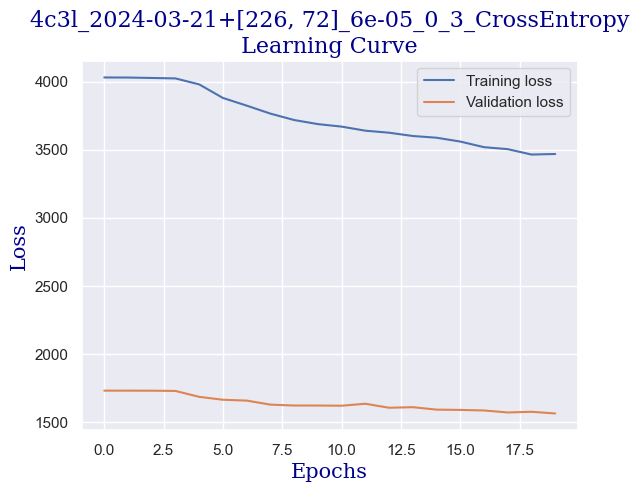

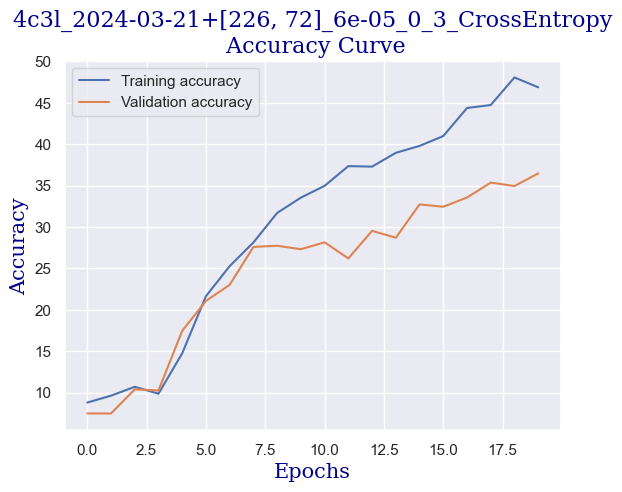

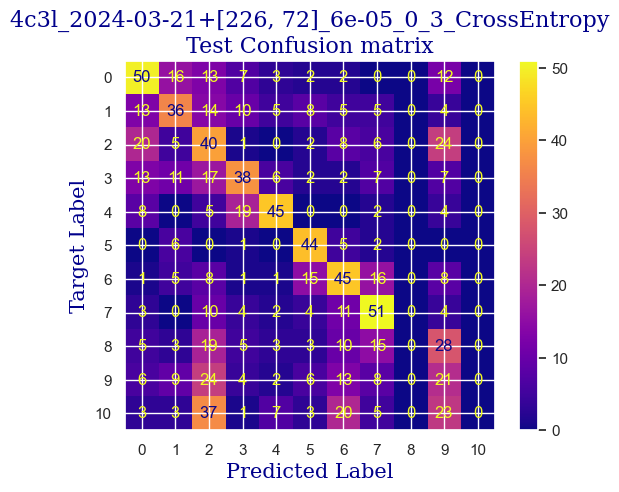

 
 END 4c3l [226, 72] Run Time:  3937.346528221009
Model:  4c3l  idx: 0 / 1
resolution:  [226, 72]   idx: 1 / 7
learning rate:  6e-05   idx: 1 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.1   idx: 1 / 3
seed:  8   idx:  0 / 3
loss function:  CrossEntropy  idx: 0 / 1
239060.977114744
239048.56660129
Total epochs: 20


  0%|                                                                                                                        | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  9.39916716240333
validating...


  5%|█████▌                                                                                                          | 1/20 [00:12<03:51, 12.21s/it]

validation accuracy:  9.70873786407767
Training...
train accuracy:  10.350981558596075
validating...


 10%|███████████▏                                                                                                    | 2/20 [00:24<03:36, 12.03s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  11.124330755502678
validating...


 15%|████████████████▊                                                                                               | 3/20 [00:36<03:23, 11.97s/it]

validation accuracy:  21.35922330097087
Training...
train accuracy:  23.14098750743605
validating...


 20%|██████████████████████▍                                                                                         | 4/20 [00:48<03:11, 11.98s/it]

validation accuracy:  28.57142857142857
Training...
train accuracy:  31.588340273646637
validating...


 25%|████████████████████████████                                                                                    | 5/20 [01:00<02:59, 12.00s/it]

validation accuracy:  30.79056865464632
Training...
train accuracy:  37.180249851279
validating...


 30%|█████████████████████████████████▌                                                                              | 6/20 [01:12<02:48, 12.06s/it]

validation accuracy:  38.28016643550624
Training...
train accuracy:  39.73825104104699
validating...


 35%|███████████████████████████████████████▏                                                                        | 7/20 [01:24<02:36, 12.06s/it]

validation accuracy:  39.66712898751734
Training...
train accuracy:  43.60499702558001
validating...


 40%|████████████████████████████████████████████▊                                                                   | 8/20 [01:36<02:24, 12.08s/it]

validation accuracy:  36.615811373092924
Training...
train accuracy:  45.98453301606187
validating...


 45%|██████████████████████████████████████████████████▍                                                             | 9/20 [01:48<02:12, 12.07s/it]

validation accuracy:  39.25104022191401
Training...
train accuracy:  46.936347412254605
validating...


 50%|███████████████████████████████████████████████████████▌                                                       | 10/20 [02:00<02:00, 12.08s/it]

validation accuracy:  41.60887656033287
Training...
train accuracy:  48.66151100535396
validating...


 55%|█████████████████████████████████████████████████████████████                                                  | 11/20 [02:12<01:48, 12.07s/it]

validation accuracy:  41.74757281553398
Training...
train accuracy:  50.684116597263525
validating...


 60%|██████████████████████████████████████████████████████████████████▌                                            | 12/20 [02:24<01:36, 12.05s/it]

validation accuracy:  42.163661581137305
Training...
train accuracy:  51.87388459250446
validating...


 65%|████████████████████████████████████████████████████████████████████████▏                                      | 13/20 [02:36<01:24, 12.07s/it]

validation accuracy:  40.49930651872399
Training...
train accuracy:  52.29030339083879
validating...


 70%|█████████████████████████████████████████████████████████████████████████████▋                                 | 14/20 [02:48<01:12, 12.07s/it]

validation accuracy:  43.5506241331484
Training...
train accuracy:  54.37239738251041
validating...


 75%|███████████████████████████████████████████████████████████████████████████████████▎                           | 15/20 [03:00<01:00, 12.06s/it]

validation accuracy:  36.615811373092924
Training...
train accuracy:  55.08625817965497
validating...


 80%|████████████████████████████████████████████████████████████████████████████████████████▊                      | 16/20 [03:12<00:48, 12.09s/it]

validation accuracy:  41.33148404993065
Training...
train accuracy:  56.57346817370613
validating...


 85%|██████████████████████████████████████████████████████████████████████████████████████████████▎                | 17/20 [03:24<00:36, 12.06s/it]

validation accuracy:  42.857142857142854
Training...
train accuracy:  56.87091017251637
validating...


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████▉           | 18/20 [03:36<00:24, 12.05s/it]

validation accuracy:  44.10540915395285
Training...
train accuracy:  58.89351576442594
validating...


 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 19/20 [03:48<00:12, 12.03s/it]

validation accuracy:  42.44105409153953
Training...
train accuracy:  60.08328375966686
validating...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [04:01<00:00, 12.05s/it]

validation accuracy:  43.828016643550626
Testing...


 
 train acc:  60.08328375966686
 
 val acc:  43.828016643550626
 
 test acc:  40.679611650485434


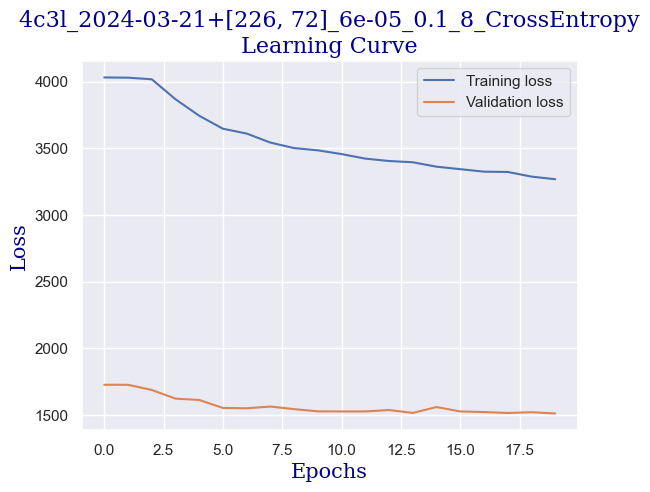

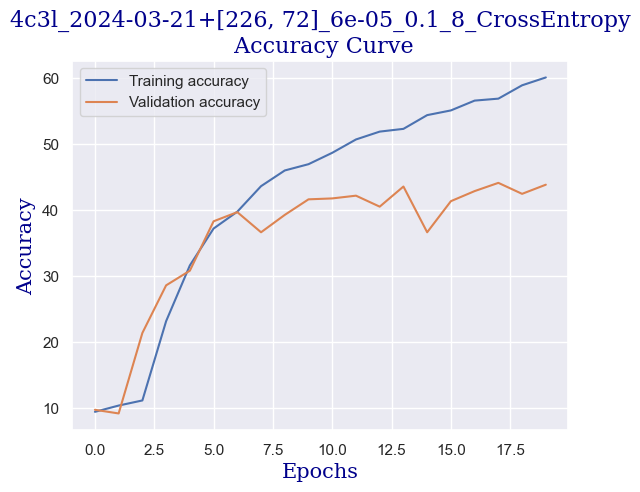

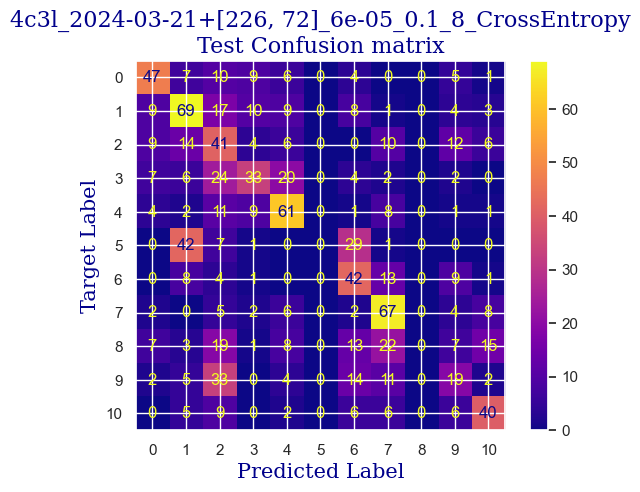

 
 END 4c3l [226, 72] Run Time:  3939.1672460900154
Model:  4c3l  idx: 0 / 1
resolution:  [226, 72]   idx: 1 / 7
learning rate:  6e-05   idx: 1 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.1   idx: 1 / 3
seed:  2   idx:  1 / 3
loss function:  CrossEntropy  idx: 0 / 1
243000.14574728
242987.735245928
Total epochs: 20


  0%|                                                                                                                        | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  9.637120761451518
validating...


  5%|█████▌                                                                                                          | 1/20 [00:12<03:48, 12.05s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.41046995835812
validating...


 10%|███████████▏                                                                                                    | 2/20 [00:24<03:37, 12.11s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.172516359309935
validating...


 15%|████████████████▊                                                                                               | 3/20 [00:36<03:25, 12.07s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.113027959547887
validating...


 20%|██████████████████████▍                                                                                         | 4/20 [00:48<03:14, 12.13s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  11.659726353361094
validating...


 25%|████████████████████████████                                                                                    | 5/20 [01:00<03:02, 12.14s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  9.1017251635931
validating...


 30%|█████████████████████████████████▌                                                                              | 6/20 [01:12<02:49, 12.12s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  11.183819155264723
validating...


 35%|███████████████████████████████████████▏                                                                        | 7/20 [01:24<02:37, 12.10s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.886377156454492
validating...


 40%|████████████████████████████████████████████▊                                                                   | 8/20 [01:36<02:24, 12.08s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  11.778703152885187
validating...


 45%|██████████████████████████████████████████████████▍                                                             | 9/20 [01:48<02:12, 12.01s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.350981558596075
validating...


 50%|███████████████████████████████████████████████████████▌                                                       | 10/20 [02:00<01:59, 11.99s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  11.838191552647235
validating...


 55%|█████████████████████████████████████████████████████████████                                                  | 11/20 [02:12<01:47, 11.98s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.648423557406305
validating...


 60%|██████████████████████████████████████████████████████████████████▌                                            | 12/20 [02:24<01:35, 12.00s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  11.421772754312908
validating...


 65%|████████████████████████████████████████████████████████████████████████▏                                      | 13/20 [02:36<01:24, 12.03s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  11.540749553837001
validating...


 70%|█████████████████████████████████████████████████████████████████████████████▋                                 | 14/20 [02:48<01:11, 11.98s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.58893515764426
validating...


 75%|███████████████████████████████████████████████████████████████████████████████████▎                           | 15/20 [03:00<00:59, 11.95s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.23200475907198
validating...


 80%|████████████████████████████████████████████████████████████████████████████████████████▊                      | 16/20 [03:12<00:47, 11.95s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.648423557406305
validating...


 85%|██████████████████████████████████████████████████████████████████████████████████████████████▎                | 17/20 [03:24<00:35, 11.96s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.767400356930398
validating...


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████▉           | 18/20 [03:36<00:23, 11.97s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  11.481261154074955
validating...


 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 19/20 [03:48<00:11, 11.94s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.58893515764426
validating...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [04:00<00:00, 12.01s/it]

validation accuracy:  9.986130374479888
Testing...


 
 train acc:  10.58893515764426
 
 val acc:  9.986130374479888
 
 test acc:  10.29126213592233


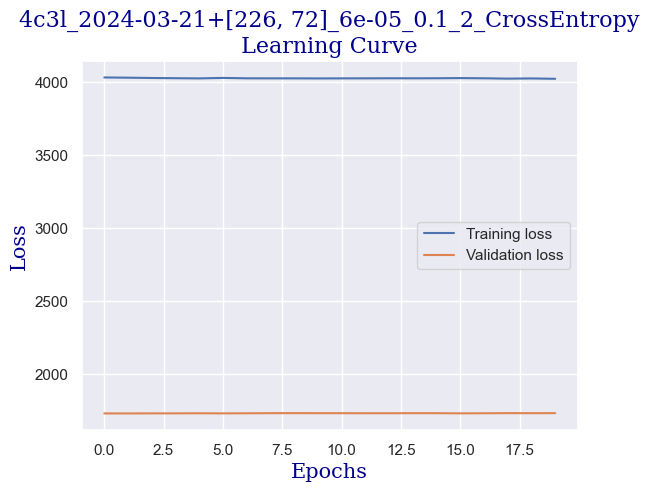

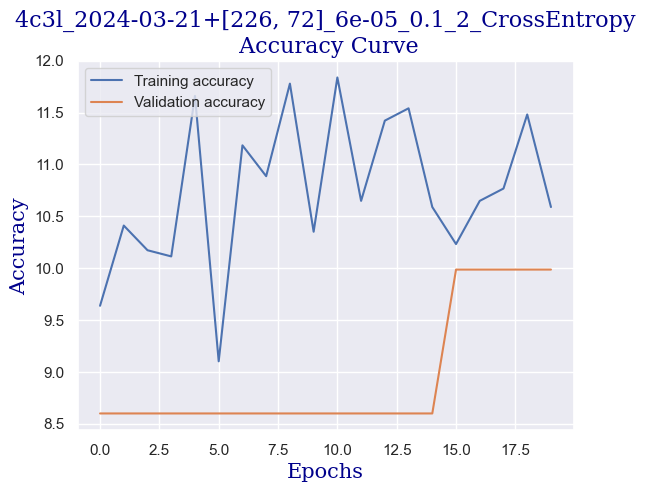

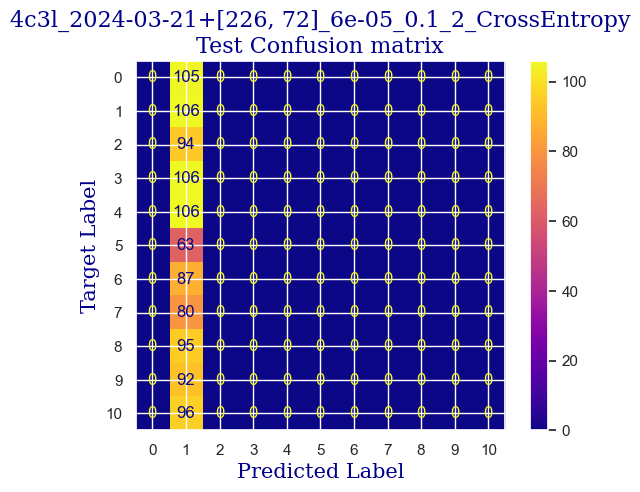

 
 END 4c3l [226, 72] Run Time:  3934.944792403985
Model:  4c3l  idx: 0 / 1
resolution:  [226, 72]   idx: 1 / 7
learning rate:  6e-05   idx: 1 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.1   idx: 1 / 3
seed:  3   idx:  2 / 3
loss function:  CrossEntropy  idx: 0 / 1
246935.091780981
246922.681267374
Total epochs: 20


  0%|                                                                                                                        | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  9.815585960737657
validating...


  5%|█████▌                                                                                                          | 1/20 [00:11<03:47, 11.97s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  10.113027959547887
validating...


 10%|███████████▏                                                                                                    | 2/20 [00:23<03:35, 11.99s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  10.469958358120167
validating...


 15%|████████████████▊                                                                                               | 3/20 [00:36<03:24, 12.03s/it]

validation accuracy:  12.482662968099861
Training...
train accuracy:  18.619869125520523
validating...


 20%|██████████████████████▍                                                                                         | 4/20 [00:48<03:12, 12.02s/it]

validation accuracy:  21.63661581137309
Training...
train accuracy:  28.25698988697204
validating...


 25%|████████████████████████████                                                                                    | 5/20 [01:00<03:00, 12.02s/it]

validation accuracy:  21.220527045769764
Training...
train accuracy:  33.31350386674599
validating...


 30%|█████████████████████████████████▌                                                                              | 6/20 [01:12<02:48, 12.03s/it]

validation accuracy:  28.9875173370319
Training...
train accuracy:  38.25104104699584
validating...


 35%|███████████████████████████████████████▏                                                                        | 7/20 [01:24<02:36, 12.02s/it]

validation accuracy:  33.841886269070734
Training...
train accuracy:  43.545508625817966
validating...


 40%|████████████████████████████████████████████▊                                                                   | 8/20 [01:36<02:23, 11.99s/it]

validation accuracy:  36.47711511789182
Training...
train accuracy:  45.3896490184414
validating...


 45%|██████████████████████████████████████████████████▍                                                             | 9/20 [01:48<02:11, 12.00s/it]

validation accuracy:  38.28016643550624
Training...
train accuracy:  48.54253420582986
validating...


 50%|███████████████████████████████████████████████████████▌                                                       | 10/20 [02:00<02:00, 12.01s/it]

validation accuracy:  41.60887656033287
Training...
train accuracy:  51.516954193932186
validating...


 55%|█████████████████████████████████████████████████████████████                                                  | 11/20 [02:12<01:48, 12.00s/it]

validation accuracy:  40.36061026352289
Training...
train accuracy:  53.896490184414034
validating...


 60%|██████████████████████████████████████████████████████████████████▌                                            | 12/20 [02:24<01:35, 11.98s/it]

validation accuracy:  42.44105409153953
Training...
train accuracy:  55.20523497917906
validating...


 65%|████████████████████████████████████████████████████████████████████████▏                                      | 13/20 [02:36<01:23, 11.99s/it]

validation accuracy:  43.689320388349515
Training...
train accuracy:  57.16835217132659
validating...


 70%|█████████████████████████████████████████████████████████████████████████████▋                                 | 14/20 [02:48<01:12, 12.00s/it]

validation accuracy:  41.19278779472954
Training...
train accuracy:  58.17965496728138
validating...


 75%|███████████████████████████████████████████████████████████████████████████████████▎                           | 15/20 [03:00<01:00, 12.02s/it]

validation accuracy:  44.79889042995839
Training...
train accuracy:  58.89351576442594
validating...


 80%|████████████████████████████████████████████████████████████████████████████████████████▊                      | 16/20 [03:12<00:47, 11.98s/it]

validation accuracy:  43.13453536754508
Training...
train accuracy:  59.19095776323617
validating...


 85%|██████████████████████████████████████████████████████████████████████████████████████████████▎                | 17/20 [03:24<00:35, 11.99s/it]

validation accuracy:  43.27323162274618
Training...
train accuracy:  61.332540154669836
validating...


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████▉           | 18/20 [03:36<00:24, 12.00s/it]

validation accuracy:  43.96671289875174
Training...
train accuracy:  63.05770374776919
validating...


 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 19/20 [03:48<00:12, 12.02s/it]

validation accuracy:  42.302357836338416
Training...
train accuracy:  64.06900654372397
validating...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [04:00<00:00, 12.01s/it]

validation accuracy:  44.24410540915395
Testing...


 
 train acc:  64.06900654372397
 
 val acc:  44.24410540915395
 
 test acc:  45.43689320388349


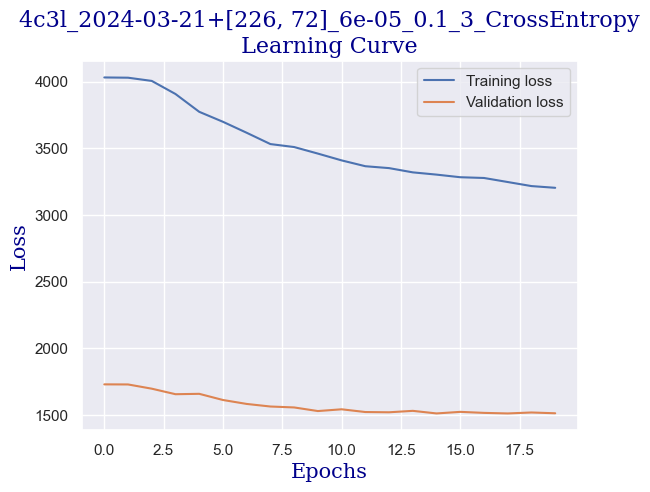

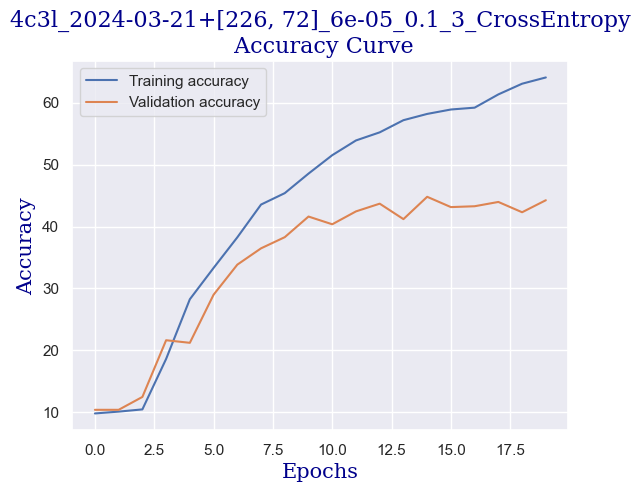

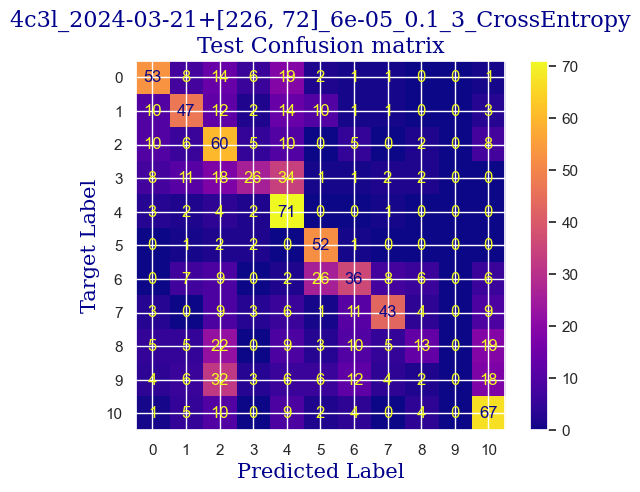

 
 END 4c3l [226, 72] Run Time:  3933.7188473690185
Model:  4c3l  idx: 0 / 1
resolution:  [226, 72]   idx: 1 / 7
learning rate:  6e-05   idx: 1 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.2   idx: 2 / 3
seed:  8   idx:  0 / 3
loss function:  CrossEntropy  idx: 0 / 1
250868.812011431
250856.401497493
Total epochs: 20


  0%|                                                                                                                        | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  9.220701963117191
validating...


  5%|█████▌                                                                                                          | 1/20 [00:12<03:49, 12.08s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  9.75609756097561
validating...


 10%|███████████▏                                                                                                    | 2/20 [00:24<03:38, 12.14s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  8.923259964306961
validating...


 15%|████████████████▊                                                                                               | 3/20 [00:36<03:25, 12.10s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  9.934562760261748
validating...


 20%|██████████████████████▍                                                                                         | 4/20 [00:48<03:14, 12.13s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  9.815585960737657
validating...


 25%|████████████████████████████                                                                                    | 5/20 [01:00<03:01, 12.11s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  9.458655562165378
validating...


 30%|█████████████████████████████████▌                                                                              | 6/20 [01:12<02:49, 12.10s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.58893515764426
validating...


 35%|███████████████████████████████████████▏                                                                        | 7/20 [01:24<02:37, 12.10s/it]

validation accuracy:  12.205270457697642
Training...
train accuracy:  16.716240333135037
validating...


 40%|████████████████████████████████████████████▊                                                                   | 8/20 [01:36<02:25, 12.11s/it]

validation accuracy:  20.110957004160888
Training...
train accuracy:  25.342058298631763
validating...


 45%|██████████████████████████████████████████████████▍                                                             | 9/20 [01:48<02:12, 12.08s/it]

validation accuracy:  27.600554785020805
Training...
train accuracy:  33.25401546698394
validating...


 50%|███████████████████████████████████████████████████████▌                                                       | 10/20 [02:00<02:00, 12.03s/it]

validation accuracy:  30.929264909847433
Training...
train accuracy:  39.202855443188575
validating...


 55%|█████████████████████████████████████████████████████████████                                                  | 11/20 [02:12<01:48, 12.03s/it]

validation accuracy:  33.980582524271846
Training...
train accuracy:  42.59369422962522
validating...


 60%|██████████████████████████████████████████████████████████████████▌                                            | 12/20 [02:24<01:36, 12.05s/it]

validation accuracy:  35.367545076282944
Training...
train accuracy:  43.90243902439025
validating...


 65%|████████████████████████████████████████████████████████████████████████▏                                      | 13/20 [02:36<01:23, 11.98s/it]

validation accuracy:  38.83495145631068
Training...
train accuracy:  46.04402141582391
validating...


 70%|█████████████████████████████████████████████████████████████████████████████▋                                 | 14/20 [02:48<01:11, 11.94s/it]

validation accuracy:  39.389736477115115
Training...
train accuracy:  49.07792980368828
validating...


 75%|███████████████████████████████████████████████████████████████████████████████████▎                           | 15/20 [03:00<00:59, 11.98s/it]

validation accuracy:  40.36061026352289
Training...
train accuracy:  50.98155859607376
validating...


 80%|████████████████████████████████████████████████████████████████████████████████████████▊                      | 16/20 [03:12<00:48, 12.00s/it]

validation accuracy:  39.66712898751734
Training...
train accuracy:  53.77751338488994
validating...


 85%|██████████████████████████████████████████████████████████████████████████████████████████████▎                | 17/20 [03:24<00:36, 12.02s/it]

validation accuracy:  37.309292649098474
Training...
train accuracy:  54.788816180844734
validating...


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████▉           | 18/20 [03:36<00:24, 12.04s/it]

validation accuracy:  39.66712898751734
Training...
train accuracy:  57.70374776918501
validating...


 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 19/20 [03:48<00:11, 11.98s/it]

validation accuracy:  39.94452149791955
Training...
train accuracy:  59.369422962522314
validating...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [04:00<00:00, 12.03s/it]

validation accuracy:  41.74757281553398
Testing...


 
 train acc:  59.369422962522314
 
 val acc:  41.74757281553398
 
 test acc:  38.932038834951456


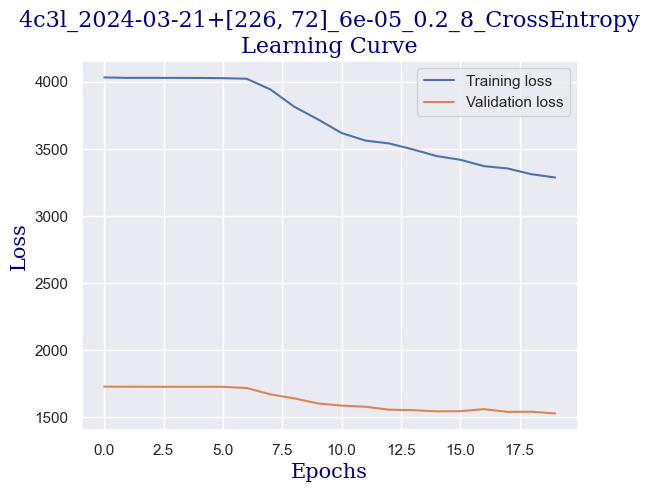

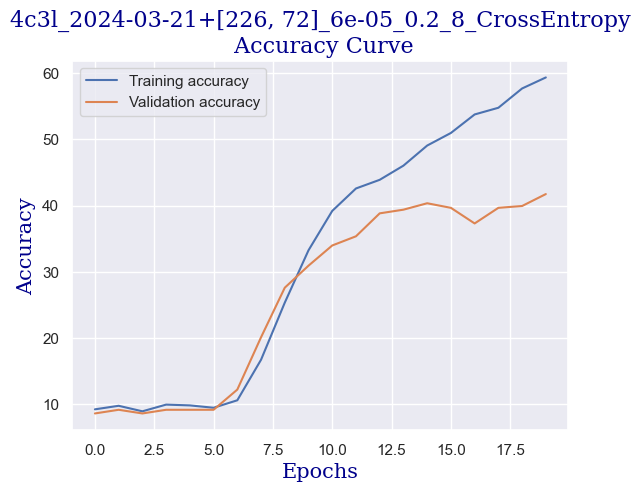

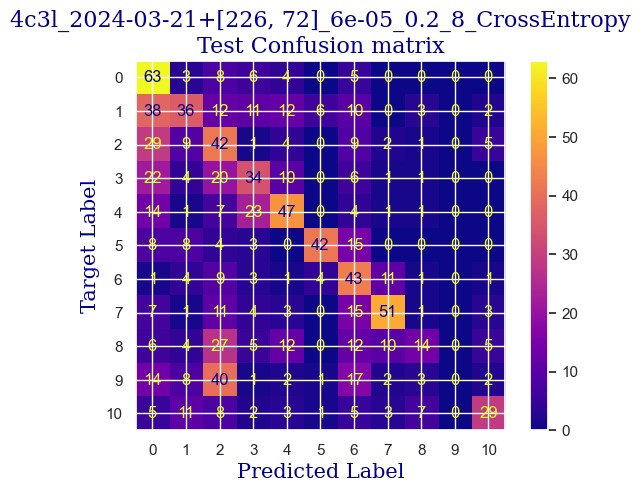

 
 END 4c3l [226, 72] Run Time:  3938.0380824029853
Model:  4c3l  idx: 0 / 1
resolution:  [226, 72]   idx: 1 / 7
learning rate:  6e-05   idx: 1 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.2   idx: 2 / 3
seed:  2   idx:  1 / 3
loss function:  CrossEntropy  idx: 0 / 1
254806.851606922
254794.441092675
Total epochs: 20


  0%|                                                                                                                        | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  10.945865556216537
validating...


  5%|█████▌                                                                                                          | 1/20 [00:11<03:47, 11.95s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  11.005353955978585
validating...


 10%|███████████▏                                                                                                    | 2/20 [00:23<03:35, 12.00s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  11.302795954788817
validating...


 15%|████████████████▊                                                                                               | 3/20 [00:35<03:24, 12.00s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.58893515764426
validating...


 20%|██████████████████████▍                                                                                         | 4/20 [00:48<03:12, 12.03s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.648423557406305
validating...


 25%|████████████████████████████                                                                                    | 5/20 [00:59<02:59, 11.96s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  11.719214753123142
validating...


 30%|█████████████████████████████████▌                                                                              | 6/20 [01:11<02:47, 11.98s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  11.362284354550862
validating...


 35%|███████████████████████████████████████▏                                                                        | 7/20 [01:23<02:35, 11.97s/it]

validation accuracy:  11.789181692094314
Training...
train accuracy:  18.500892325996432
validating...


 40%|████████████████████████████████████████████▊                                                                   | 8/20 [01:35<02:23, 11.97s/it]

validation accuracy:  22.74618585298197
Training...
train accuracy:  28.673408685306367
validating...


 45%|██████████████████████████████████████████████████▍                                                             | 9/20 [01:47<02:12, 12.01s/it]

validation accuracy:  27.877947295423024
Training...
train accuracy:  33.61094586555622
validating...


 50%|███████████████████████████████████████████████████████▌                                                       | 10/20 [02:00<02:00, 12.03s/it]

validation accuracy:  27.739251040221912
Training...
train accuracy:  36.109458655562165
validating...


 55%|█████████████████████████████████████████████████████████████                                                  | 11/20 [02:11<01:47, 11.98s/it]

validation accuracy:  30.79056865464632
Training...
train accuracy:  38.31052944675788
validating...


 60%|██████████████████████████████████████████████████████████████████▌                                            | 12/20 [02:23<01:35, 12.00s/it]

validation accuracy:  29.819694868238557
Training...
train accuracy:  41.2849494348602
validating...


 65%|████████████████████████████████████████████████████████████████████████▏                                      | 13/20 [02:35<01:24, 12.02s/it]

validation accuracy:  30.235783633841883
Training...
train accuracy:  41.760856632956575
validating...


 70%|█████████████████████████████████████████████████████████████████████████████▋                                 | 14/20 [02:48<01:12, 12.02s/it]

validation accuracy:  32.17753120665742
Training...
train accuracy:  44.49732302201071
validating...


 75%|███████████████████████████████████████████████████████████████████████████████████▎                           | 15/20 [02:59<00:59, 12.00s/it]

validation accuracy:  31.484049930651874
Training...
train accuracy:  44.43783462224866
validating...


 80%|████████████████████████████████████████████████████████████████████████████████████████▊                      | 16/20 [03:12<00:48, 12.01s/it]

validation accuracy:  33.56449375866852
Training...
train accuracy:  47.174301011302795
validating...


 85%|██████████████████████████████████████████████████████████████████████████████████████████████▎                | 17/20 [03:23<00:35, 11.99s/it]

validation accuracy:  31.345353675450767
Training...
train accuracy:  49.01844140392623
validating...


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████▉           | 18/20 [03:36<00:24, 12.02s/it]

validation accuracy:  32.87101248266297
Training...
train accuracy:  49.91076740035693
validating...


 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 19/20 [03:48<00:12, 12.02s/it]

validation accuracy:  31.206657420249652
Training...
train accuracy:  50.20820939916716
validating...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [04:00<00:00, 12.00s/it]

validation accuracy:  31.484049930651874
Testing...


 
 train acc:  50.20820939916716
 
 val acc:  31.484049930651874
 
 test acc:  32.23300970873787


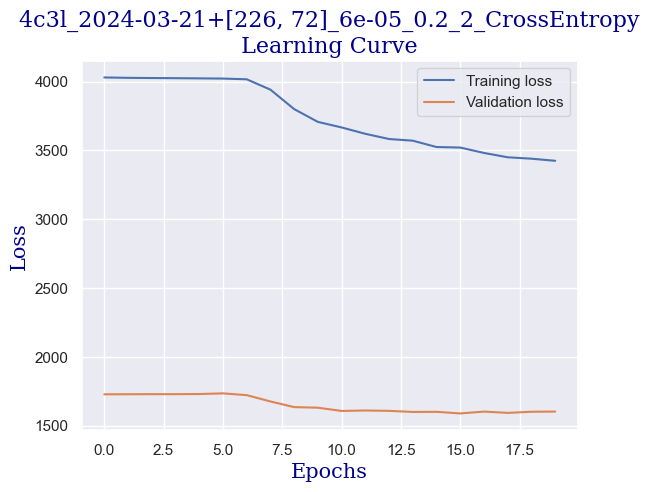

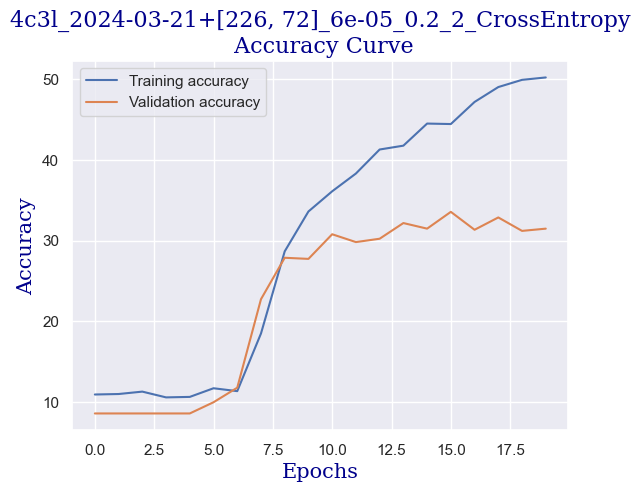

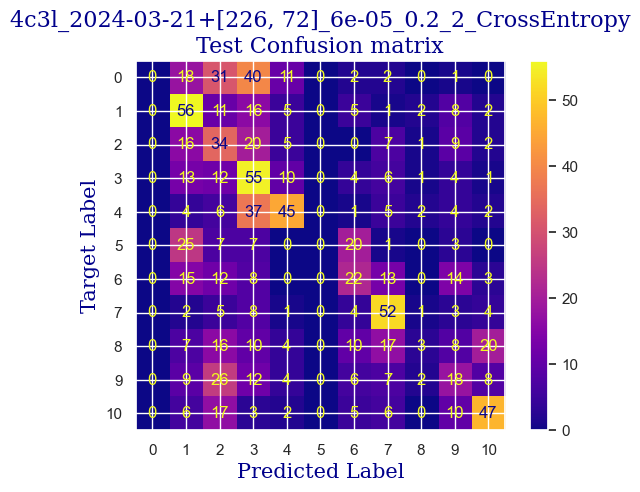

 
 END 4c3l [226, 72] Run Time:  3931.8540482060052
Model:  4c3l  idx: 0 / 1
resolution:  [226, 72]   idx: 1 / 7
learning rate:  6e-05   idx: 1 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.2   idx: 2 / 3
seed:  3   idx:  2 / 3
loss function:  CrossEntropy  idx: 0 / 1
258738.706588224
258726.296072669
Total epochs: 20


  0%|                                                                                                                        | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  9.57763236168947
validating...


  5%|█████▌                                                                                                          | 1/20 [00:12<03:49, 12.06s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  10.053539559785841
validating...


 10%|███████████▏                                                                                                    | 2/20 [00:23<03:34, 11.90s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  10.053539559785841
validating...


 15%|████████████████▊                                                                                               | 3/20 [00:35<03:23, 11.95s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  11.24330755502677
validating...


 20%|██████████████████████▍                                                                                         | 4/20 [00:47<03:11, 12.00s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  10.113027959547887
validating...


 25%|████████████████████████████                                                                                    | 5/20 [01:00<03:00, 12.03s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  10.886377156454492
validating...


 30%|█████████████████████████████████▌                                                                              | 6/20 [01:12<02:48, 12.05s/it]

validation accuracy:  7.350901525658807
Training...
train accuracy:  11.659726353361094
validating...


 35%|███████████████████████████████████████▏                                                                        | 7/20 [01:24<02:36, 12.05s/it]

validation accuracy:  10.818307905686545
Training...
train accuracy:  17.251635930993455
validating...


 40%|████████████████████████████████████████████▊                                                                   | 8/20 [01:36<02:24, 12.06s/it]

validation accuracy:  19.27877947295423
Training...
train accuracy:  24.687685901249257
validating...


 45%|██████████████████████████████████████████████████▍                                                             | 9/20 [01:48<02:12, 12.04s/it]

validation accuracy:  21.220527045769764
Training...
train accuracy:  29.268292682926827
validating...


 50%|███████████████████████████████████████████████████████▌                                                       | 10/20 [02:00<02:00, 12.04s/it]

validation accuracy:  28.01664355062413
Training...
train accuracy:  31.4098750743605
validating...


 55%|█████████████████████████████████████████████████████████████                                                  | 11/20 [02:12<01:48, 12.02s/it]

validation accuracy:  29.819694868238557
Training...
train accuracy:  35.455086258179655
validating...


 60%|██████████████████████████████████████████████████████████████████▌                                            | 12/20 [02:24<01:36, 12.08s/it]

validation accuracy:  35.78363384188627
Training...
train accuracy:  38.845925044616294
validating...


 65%|████████████████████████████████████████████████████████████████████████▏                                      | 13/20 [02:36<01:24, 12.02s/it]

validation accuracy:  36.1997226074896
Training...
train accuracy:  40.63057703747769
validating...


 70%|█████████████████████████████████████████████████████████████████████████████▋                                 | 14/20 [02:48<01:11, 12.00s/it]

validation accuracy:  38.00277392510402
Training...
train accuracy:  44.25936942296252
validating...


 75%|███████████████████████████████████████████████████████████████████████████████████▎                           | 15/20 [03:00<00:59, 12.00s/it]

validation accuracy:  38.28016643550624
Training...
train accuracy:  44.97323022010708
validating...


 80%|████████████████████████████████████████████████████████████████████████████████████████▊                      | 16/20 [03:12<00:48, 12.01s/it]

validation accuracy:  40.6380027739251
Training...
train accuracy:  45.80606781677573
validating...


 85%|██████████████████████████████████████████████████████████████████████████████████████████████▎                | 17/20 [03:24<00:36, 12.04s/it]

validation accuracy:  42.163661581137305
Training...
train accuracy:  48.12611540749554
validating...


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████▉           | 18/20 [03:36<00:23, 11.98s/it]

validation accuracy:  41.60887656033287
Training...
train accuracy:  49.37537180249851
validating...


 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 19/20 [03:48<00:12, 12.01s/it]

validation accuracy:  40.083217753120664
Training...
train accuracy:  51.63593099345628
validating...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [04:00<00:00, 12.02s/it]

validation accuracy:  41.05409153952843
Testing...


 
 train acc:  51.63593099345628
 
 val acc:  41.05409153952843
 
 test acc:  36.89320388349515


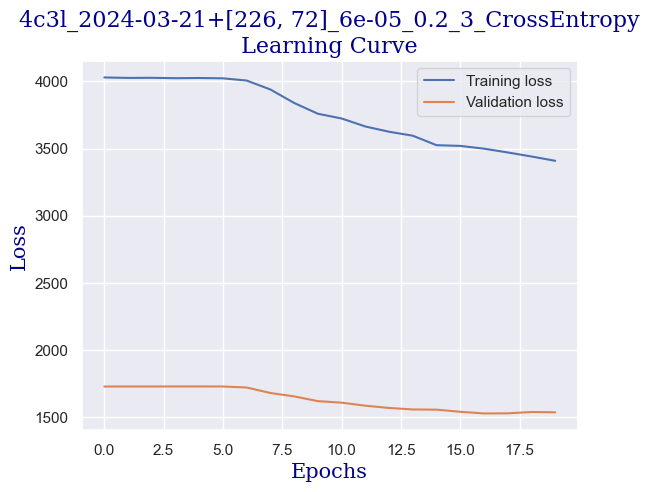

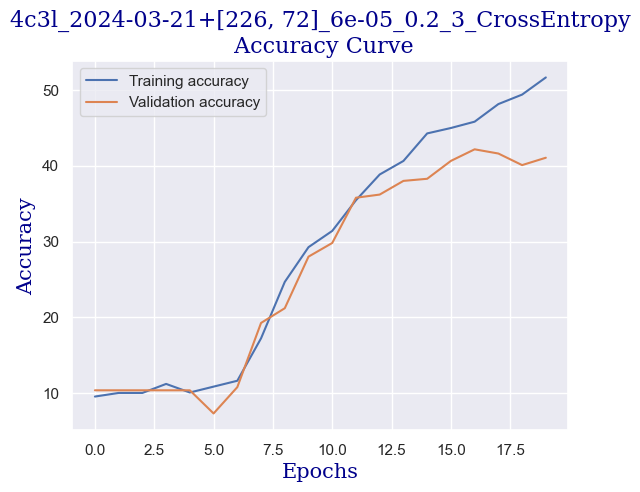

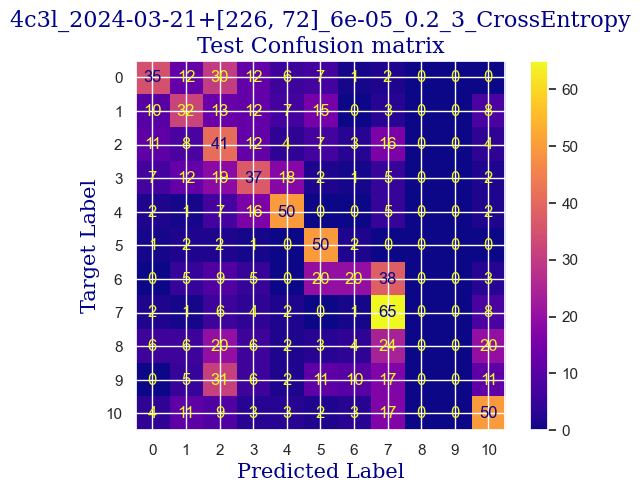

 
 END 4c3l [226, 72] Run Time:  3941.807442232006
Model:  4c3l  idx: 0 / 1
resolution:  [226, 72]   idx: 1 / 7
learning rate:  7e-05   idx: 2 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0   idx: 0 / 3
seed:  8   idx:  0 / 3
loss function:  CrossEntropy  idx: 0 / 1
262680.515289498
262668.104778223
Total epochs: 20


  0%|                                                                                                                        | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  9.57763236168947
validating...


  5%|█████▌                                                                                                          | 1/20 [00:11<03:47, 11.98s/it]

validation accuracy:  9.70873786407767
Training...
train accuracy:  9.042236763831053
validating...


 10%|███████████▏                                                                                                    | 2/20 [00:24<03:36, 12.02s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  11.838191552647235
validating...


 15%|████████████████▊                                                                                               | 3/20 [00:36<03:24, 12.02s/it]

validation accuracy:  16.22746185852982
Training...
train accuracy:  19.80963712076145
validating...


 20%|██████████████████████▍                                                                                         | 4/20 [00:47<03:11, 11.96s/it]

validation accuracy:  26.629680998613036
Training...
train accuracy:  28.970850684116595
validating...


 25%|████████████████████████████                                                                                    | 5/20 [00:59<02:58, 11.93s/it]

validation accuracy:  32.87101248266297
Training...
train accuracy:  36.52587745389649
validating...


 30%|█████████████████████████████████▌                                                                              | 6/20 [01:11<02:47, 11.97s/it]

validation accuracy:  33.980582524271846
Training...
train accuracy:  37.180249851279
validating...


 35%|███████████████████████████████████████▏                                                                        | 7/20 [01:23<02:35, 11.97s/it]

validation accuracy:  37.17059639389736
Training...
train accuracy:  41.4039262343843
validating...


 40%|████████████████████████████████████████████▊                                                                   | 8/20 [01:35<02:24, 12.00s/it]

validation accuracy:  37.03190013869626
Training...
train accuracy:  43.48602022605592
validating...


 45%|██████████████████████████████████████████████████▍                                                             | 9/20 [01:47<02:11, 11.97s/it]

validation accuracy:  37.7253814147018
Training...
train accuracy:  44.6162998215348
validating...


 50%|███████████████████████████████████████████████████████▌                                                       | 10/20 [01:59<01:59, 11.96s/it]

validation accuracy:  37.447988904299585
Training...
train accuracy:  46.936347412254605
validating...


 55%|█████████████████████████████████████████████████████████████                                                  | 11/20 [02:11<01:47, 11.97s/it]

validation accuracy:  38.41886269070735
Training...
train accuracy:  49.494348602022605
validating...


 60%|██████████████████████████████████████████████████████████████████▌                                            | 12/20 [02:23<01:36, 12.02s/it]

validation accuracy:  39.1123439667129
Training...
train accuracy:  50.20820939916716
validating...


 65%|████████████████████████████████████████████████████████████████████████▏                                      | 13/20 [02:35<01:24, 12.03s/it]

validation accuracy:  38.83495145631068
Training...
train accuracy:  51.516954193932186
validating...


 70%|█████████████████████████████████████████████████████████████████████████████▋                                 | 14/20 [02:47<01:12, 12.03s/it]

validation accuracy:  41.47018030513176
Training...
train accuracy:  53.12314098750743
validating...


 75%|███████████████████████████████████████████████████████████████████████████████████▎                           | 15/20 [02:59<00:59, 12.00s/it]

validation accuracy:  39.66712898751734
Training...
train accuracy:  54.25342058298632
validating...


 80%|████████████████████████████████████████████████████████████████████████████████████████▊                      | 16/20 [03:11<00:47, 12.00s/it]

validation accuracy:  43.689320388349515
Training...
train accuracy:  56.75193337299227
validating...


 85%|██████████████████████████████████████████████████████████████████████████████████████████████▎                | 17/20 [03:23<00:35, 11.99s/it]

validation accuracy:  41.05409153952843
Training...
train accuracy:  58.17965496728138
validating...


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████▉           | 18/20 [03:35<00:23, 12.00s/it]

validation accuracy:  42.57975034674064
Training...
train accuracy:  59.012492563950026
validating...


 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 19/20 [03:47<00:11, 11.97s/it]

validation accuracy:  46.87933425797504
Training...
train accuracy:  61.570493753718026
validating...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [03:59<00:00, 11.98s/it]

validation accuracy:  44.521497919556175
Testing...


 
 train acc:  61.570493753718026
 
 val acc:  44.521497919556175
 
 test acc:  41.456310679611654


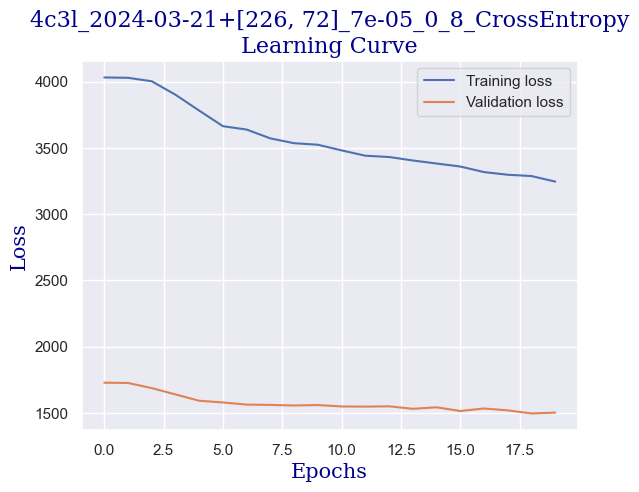

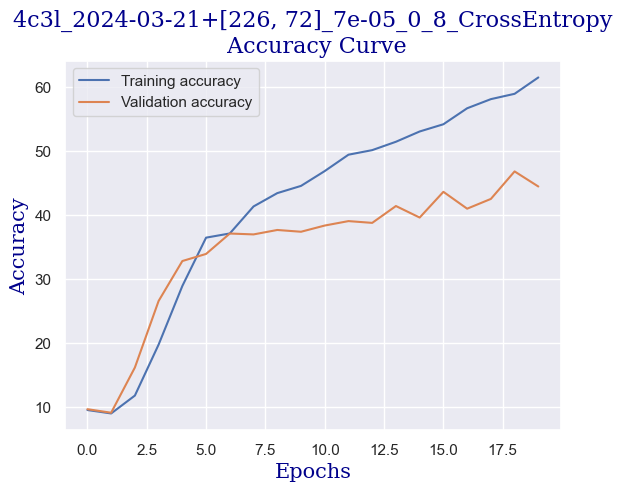

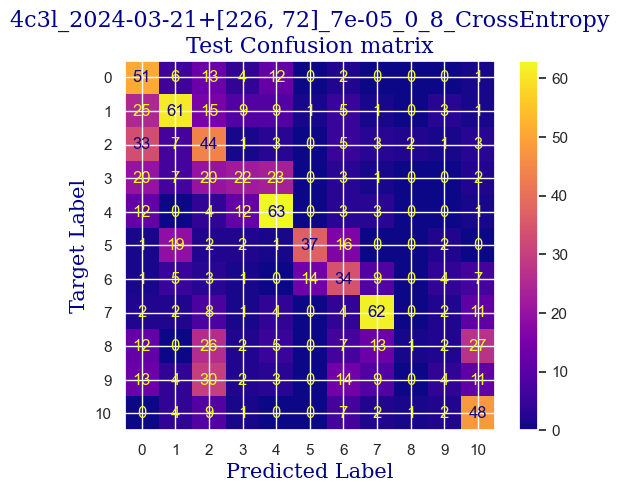

 
 END 4c3l [226, 72] Run Time:  3926.701547684963
Model:  4c3l  idx: 0 / 1
resolution:  [226, 72]   idx: 1 / 7
learning rate:  7e-05   idx: 2 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0   idx: 0 / 3
seed:  2   idx:  1 / 3
loss function:  CrossEntropy  idx: 0 / 1
266607.217775476
266594.807262923
Total epochs: 20


  0%|                                                                                                                        | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  8.566329565734682
validating...


  5%|█████▌                                                                                                          | 1/20 [00:12<03:49, 12.06s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  9.458655562165378
validating...


 10%|███████████▏                                                                                                    | 2/20 [00:24<03:37, 12.09s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.350981558596075
validating...


 15%|████████████████▊                                                                                               | 3/20 [00:36<03:25, 12.09s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.945865556216537
validating...


 20%|██████████████████████▍                                                                                         | 4/20 [00:48<03:13, 12.07s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.113027959547887
validating...


 25%|████████████████████████████                                                                                    | 5/20 [01:00<03:01, 12.07s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.053539559785841
validating...


 30%|█████████████████████████████████▌                                                                              | 6/20 [01:12<02:47, 11.99s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  15.466983938132065
validating...


 35%|███████████████████████████████████████▏                                                                        | 7/20 [01:24<02:35, 11.99s/it]

validation accuracy:  22.607489597780862
Training...
train accuracy:  26.82926829268293
validating...


 40%|████████████████████████████████████████████▊                                                                   | 8/20 [01:36<02:24, 12.01s/it]

validation accuracy:  28.01664355062413
Training...
train accuracy:  33.31350386674599
validating...


 45%|██████████████████████████████████████████████████▍                                                             | 9/20 [01:48<02:12, 12.02s/it]

validation accuracy:  29.958391123439664
Training...
train accuracy:  38.13206424747174
validating...


 50%|███████████████████████████████████████████████████████▌                                                       | 10/20 [02:00<02:00, 12.03s/it]

validation accuracy:  30.929264909847433
Training...
train accuracy:  41.64187983343248
validating...


 55%|█████████████████████████████████████████████████████████████                                                  | 11/20 [02:12<01:48, 12.03s/it]

validation accuracy:  31.484049930651874
Training...
train accuracy:  42.9506246281975
validating...


 60%|██████████████████████████████████████████████████████████████████▌                                            | 12/20 [02:24<01:35, 11.99s/it]

validation accuracy:  33.980582524271846
Training...
train accuracy:  45.15169541939322
validating...


 65%|████████████████████████████████████████████████████████████████████████▏                                      | 13/20 [02:36<01:23, 11.97s/it]

validation accuracy:  34.11927877947296
Training...
train accuracy:  45.627602617489586
validating...


 70%|█████████████████████████████████████████████████████████████████████████████▋                                 | 14/20 [02:48<01:12, 12.00s/it]

validation accuracy:  33.70319001386963
Training...
train accuracy:  47.88816180844736
validating...


 75%|███████████████████████████████████████████████████████████████████████████████████▎                           | 15/20 [03:00<01:00, 12.01s/it]

validation accuracy:  35.22884882108183
Training...
train accuracy:  49.91076740035693
validating...


 80%|████████████████████████████████████████████████████████████████████████████████████████▊                      | 16/20 [03:12<00:47, 11.93s/it]

validation accuracy:  32.593619972260754
Training...
train accuracy:  50.684116597263525
validating...


 85%|██████████████████████████████████████████████████████████████████████████████████████████████▎                | 17/20 [03:24<00:35, 11.94s/it]

validation accuracy:  35.78363384188627
Training...
train accuracy:  51.87388459250446
validating...


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████▉           | 18/20 [03:35<00:23, 11.94s/it]

validation accuracy:  34.11927877947296
Training...
train accuracy:  52.171326591314696
validating...


 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 19/20 [03:47<00:11, 11.96s/it]

validation accuracy:  34.25797503467407
Training...
train accuracy:  54.96728138013087
validating...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [04:00<00:00, 12.00s/it]

validation accuracy:  36.33841886269071
Testing...


 
 train acc:  54.96728138013087
 
 val acc:  36.33841886269071
 
 test acc:  35.33980582524272


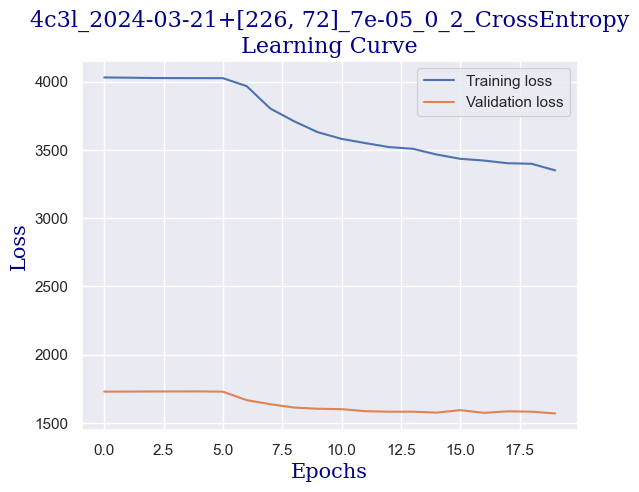

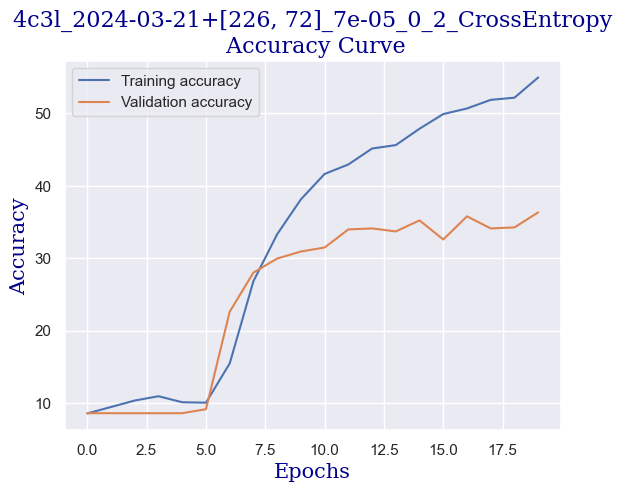

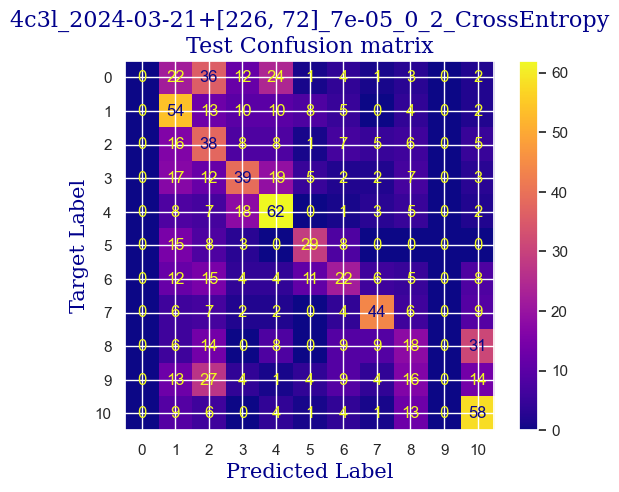

 
 END 4c3l [226, 72] Run Time:  3924.476966148999
Model:  4c3l  idx: 0 / 1
resolution:  [226, 72]   idx: 1 / 7
learning rate:  7e-05   idx: 2 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0   idx: 0 / 3
seed:  3   idx:  2 / 3
loss function:  CrossEntropy  idx: 0 / 1
270531.696010399
270519.285497268
Total epochs: 20


  0%|                                                                                                                        | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  9.458655562165378
validating...


  5%|█████▌                                                                                                          | 1/20 [00:12<03:49, 12.09s/it]

validation accuracy:  11.511789181692095
Training...
train accuracy:  9.75609756097561
validating...


 10%|███████████▏                                                                                                    | 2/20 [00:24<03:37, 12.10s/it]

validation accuracy:  11.511789181692095
Training...
train accuracy:  10.707911957168353
validating...


 15%|████████████████▊                                                                                               | 3/20 [00:36<03:24, 12.04s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  9.934562760261748
validating...


 20%|██████████████████████▍                                                                                         | 4/20 [00:48<03:13, 12.08s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  11.481261154074955
validating...


 25%|████████████████████████████                                                                                    | 5/20 [01:00<03:01, 12.08s/it]

validation accuracy:  10.263522884882107
Training...
train accuracy:  14.57465794170137
validating...


 30%|█████████████████████████████████▌                                                                              | 6/20 [01:12<02:48, 12.06s/it]

validation accuracy:  16.22746185852982
Training...
train accuracy:  23.438429506246283
validating...


 35%|███████████████████████████████████████▏                                                                        | 7/20 [01:24<02:36, 12.06s/it]

validation accuracy:  23.578363384188627
Training...
train accuracy:  29.268292682926827
validating...


 40%|████████████████████████████████████████████▊                                                                   | 8/20 [01:36<02:25, 12.10s/it]

validation accuracy:  25.93619972260749
Training...
train accuracy:  33.31350386674599
validating...


 45%|██████████████████████████████████████████████████▍                                                             | 9/20 [01:48<02:13, 12.11s/it]

validation accuracy:  28.01664355062413
Training...
train accuracy:  35.39559785841761
validating...


 50%|███████████████████████████████████████████████████████▌                                                       | 10/20 [02:00<02:00, 12.10s/it]

validation accuracy:  30.374479889042995
Training...
train accuracy:  38.60797144556811
validating...


 55%|█████████████████████████████████████████████████████████████                                                  | 11/20 [02:12<01:48, 12.11s/it]

validation accuracy:  31.900138696255205
Training...
train accuracy:  41.82034503271862
validating...


 60%|██████████████████████████████████████████████████████████████████▌                                            | 12/20 [02:25<01:36, 12.10s/it]

validation accuracy:  34.535367545076284
Training...
train accuracy:  43.60499702558001
validating...


 65%|████████████████████████████████████████████████████████████████████████▏                                      | 13/20 [02:37<01:24, 12.08s/it]

validation accuracy:  33.980582524271846
Training...
train accuracy:  46.34146341463415
validating...


 70%|█████████████████████████████████████████████████████████████████████████████▋                                 | 14/20 [02:49<01:12, 12.08s/it]

validation accuracy:  33.841886269070734
Training...
train accuracy:  47.65020820939917
validating...


 75%|███████████████████████████████████████████████████████████████████████████████████▎                           | 15/20 [03:01<01:00, 12.02s/it]

validation accuracy:  34.95145631067961
Training...
train accuracy:  49.732302201070794
validating...


 80%|████████████████████████████████████████████████████████████████████████████████████████▊                      | 16/20 [03:13<00:48, 12.00s/it]

validation accuracy:  34.674063800277395
Training...
train accuracy:  50.98155859607376
validating...


 85%|██████████████████████████████████████████████████████████████████████████████████████████████▎                | 17/20 [03:25<00:36, 12.02s/it]

validation accuracy:  36.615811373092924
Training...
train accuracy:  53.48007138607972
validating...


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████▉           | 18/20 [03:37<00:24, 12.00s/it]

validation accuracy:  38.97364771151179
Training...
train accuracy:  54.37239738251041
validating...


 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 19/20 [03:49<00:11, 11.99s/it]

validation accuracy:  38.00277392510402
Training...
train accuracy:  57.34681737061273
validating...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [04:01<00:00, 12.05s/it]

validation accuracy:  40.083217753120664
Testing...


 
 train acc:  57.34681737061273
 
 val acc:  40.083217753120664
 
 test acc:  36.213592233009706


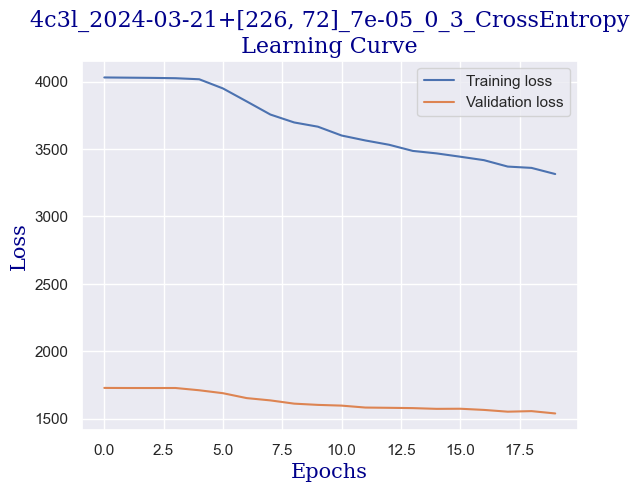

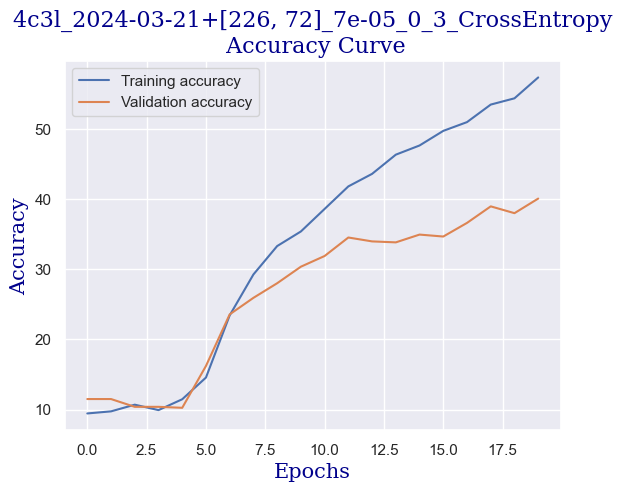

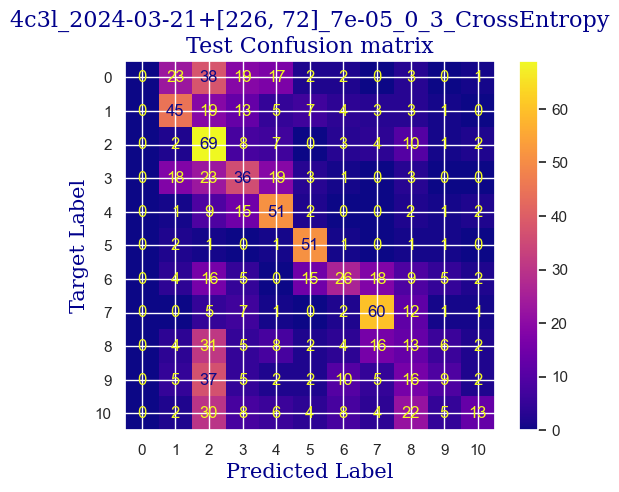

 
 END 4c3l [226, 72] Run Time:  3935.097433431947
Model:  4c3l  idx: 0 / 1
resolution:  [226, 72]   idx: 1 / 7
learning rate:  7e-05   idx: 2 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.1   idx: 1 / 3
seed:  8   idx:  0 / 3
loss function:  CrossEntropy  idx: 0 / 1
274466.794669736
274454.384165199
Total epochs: 20


  0%|                                                                                                                        | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  9.161213563355146
validating...


  5%|█████▌                                                                                                          | 1/20 [00:12<03:49, 12.07s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  9.815585960737657
validating...


 10%|███████████▏                                                                                                    | 2/20 [00:24<03:36, 12.05s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.41046995835812
validating...


 15%|████████████████▊                                                                                               | 3/20 [00:36<03:25, 12.07s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  8.923259964306961
validating...


 20%|██████████████████████▍                                                                                         | 4/20 [00:48<03:12, 12.06s/it]

validation accuracy:  8.737864077669903
Training...
train accuracy:  12.373587150505651
validating...


 25%|████████████████████████████                                                                                    | 5/20 [01:00<03:00, 12.05s/it]

validation accuracy:  19.27877947295423
Training...
train accuracy:  22.48661511005354
validating...


 30%|█████████████████████████████████▌                                                                              | 6/20 [01:12<02:48, 12.01s/it]

validation accuracy:  25.381414701803052
Training...
train accuracy:  29.44675788221297
validating...


 35%|███████████████████████████████████████▏                                                                        | 7/20 [01:24<02:36, 12.00s/it]

validation accuracy:  28.43273231622746
Training...
train accuracy:  35.75252825698988
validating...


 40%|████████████████████████████████████████████▊                                                                   | 8/20 [01:36<02:23, 11.98s/it]

validation accuracy:  35.92233009708738
Training...
train accuracy:  40.80904223676383
validating...


 45%|██████████████████████████████████████████████████▍                                                             | 9/20 [01:48<02:11, 11.99s/it]

validation accuracy:  26.768377253814148
Training...
train accuracy:  41.64187983343248
validating...


 50%|███████████████████████████████████████████████████████▌                                                       | 10/20 [02:00<02:00, 12.02s/it]

validation accuracy:  33.287101248266296
Training...
train accuracy:  43.96192742415229
validating...


 55%|█████████████████████████████████████████████████████████████                                                  | 11/20 [02:12<01:47, 11.94s/it]

validation accuracy:  39.1123439667129
Training...
train accuracy:  46.81737061273052
validating...


 60%|██████████████████████████████████████████████████████████████████▌                                            | 12/20 [02:24<01:35, 11.96s/it]

validation accuracy:  37.309292649098474
Training...
train accuracy:  48.12611540749554
validating...


 65%|████████████████████████████████████████████████████████████████████████▏                                      | 13/20 [02:35<01:23, 11.94s/it]

validation accuracy:  38.28016643550624
Training...
train accuracy:  51.33848899464605
validating...


 70%|█████████████████████████████████████████████████████████████████████████████▋                                 | 14/20 [02:47<01:11, 11.98s/it]

validation accuracy:  37.447988904299585
Training...
train accuracy:  51.279000594883996
validating...


 75%|███████████████████████████████████████████████████████████████████████████████████▎                           | 15/20 [02:59<00:59, 12.00s/it]

validation accuracy:  35.78363384188627
Training...
train accuracy:  53.182629387269486
validating...


 80%|████████████████████████████████████████████████████████████████████████████████████████▊                      | 16/20 [03:11<00:47, 11.94s/it]

validation accuracy:  37.17059639389736
Training...
train accuracy:  54.43188578227246
validating...


 85%|██████████████████████████████████████████████████████████████████████████████████████████████▎                | 17/20 [03:23<00:36, 12.00s/it]

validation accuracy:  40.49930651872399
Training...
train accuracy:  53.77751338488994
validating...


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████▉           | 18/20 [03:36<00:24, 12.06s/it]

validation accuracy:  37.03190013869626
Training...
train accuracy:  55.919095776323616
validating...


 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 19/20 [03:48<00:12, 12.07s/it]

validation accuracy:  40.083217753120664
Training...
train accuracy:  56.157049375371805
validating...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [04:00<00:00, 12.02s/it]

validation accuracy:  37.586685159500696
Testing...


 
 train acc:  56.157049375371805
 
 val acc:  37.586685159500696
 
 test acc:  36.699029126213595


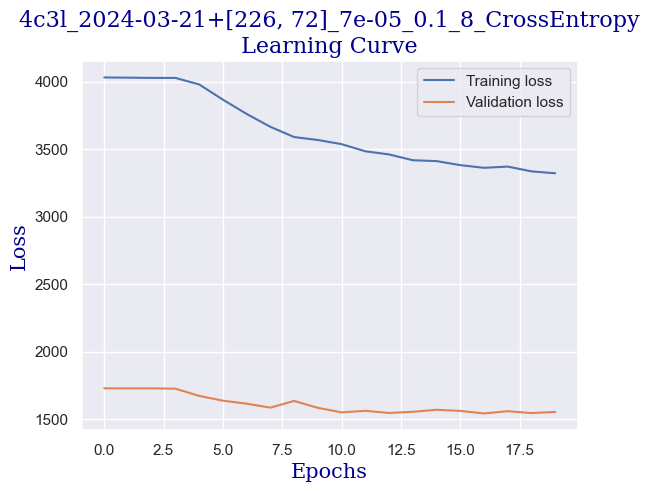

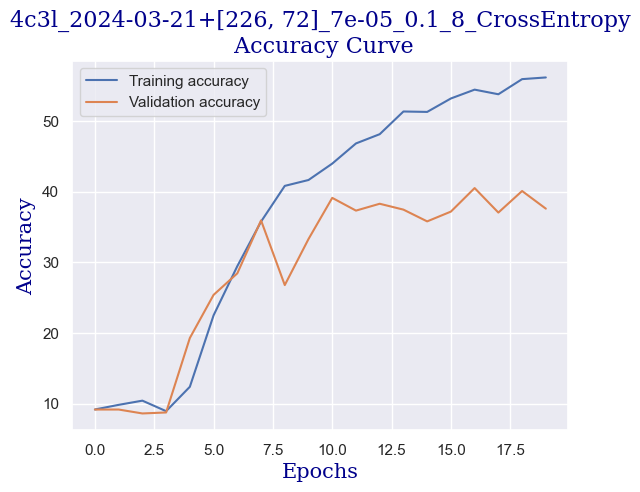

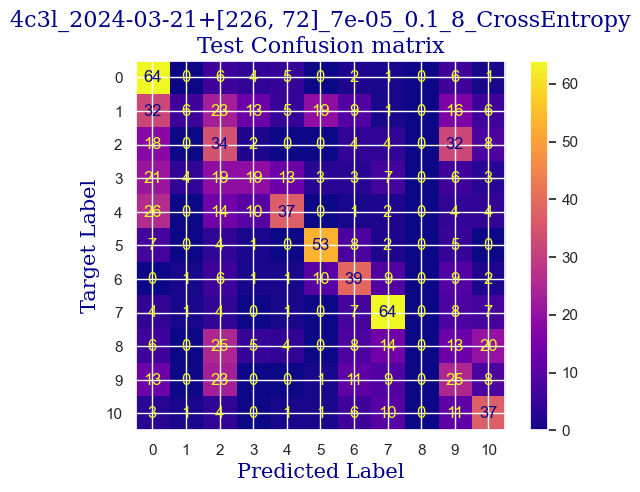

 
 END 4c3l [226, 72] Run Time:  3931.200882504985
Model:  4c3l  idx: 0 / 1
resolution:  [226, 72]   idx: 1 / 7
learning rate:  7e-05   idx: 2 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.1   idx: 1 / 3
seed:  2   idx:  1 / 3
loss function:  CrossEntropy  idx: 0 / 1
278397.996873054
278385.586375116
Total epochs: 20


  0%|                                                                                                                        | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  9.39916716240333
validating...


  5%|█████▌                                                                                                          | 1/20 [00:12<03:50, 12.15s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.707911957168353
validating...


 10%|███████████▏                                                                                                    | 2/20 [00:24<03:39, 12.20s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  11.481261154074955
validating...


 15%|████████████████▊                                                                                               | 3/20 [00:36<03:26, 12.14s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.053539559785841
validating...


 20%|██████████████████████▍                                                                                         | 4/20 [00:48<03:13, 12.12s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  11.481261154074955
validating...


 25%|████████████████████████████                                                                                    | 5/20 [01:00<03:01, 12.09s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  9.994051160023796
validating...


 30%|█████████████████████████████████▌                                                                              | 6/20 [01:12<02:48, 12.06s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  11.719214753123142
validating...


 35%|███████████████████████████████████████▏                                                                        | 7/20 [01:24<02:36, 12.07s/it]

validation accuracy:  8.460471567267684
Training...
train accuracy:  11.005353955978585
validating...


 40%|████████████████████████████████████████████▊                                                                   | 8/20 [01:36<02:24, 12.03s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.172516359309935
validating...


 45%|██████████████████████████████████████████████████▍                                                             | 9/20 [01:48<02:12, 12.01s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  11.06484235574063
validating...


 50%|███████████████████████████████████████████████████████▌                                                       | 10/20 [02:00<02:00, 12.04s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.350981558596075
validating...


 55%|█████████████████████████████████████████████████████████████                                                  | 11/20 [02:12<01:48, 12.02s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  11.421772754312908
validating...


 60%|██████████████████████████████████████████████████████████████████▌                                            | 12/20 [02:24<01:36, 12.00s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.529446757882214
validating...


 65%|████████████████████████████████████████████████████████████████████████▏                                      | 13/20 [02:36<01:23, 11.99s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.291493158834028
validating...


 70%|█████████████████████████████████████████████████████████████████████████████▋                                 | 14/20 [02:48<01:11, 11.95s/it]

validation accuracy:  8.737864077669903
Training...
train accuracy:  11.24330755502677
validating...


 75%|███████████████████████████████████████████████████████████████████████████████████▎                           | 15/20 [03:00<00:59, 11.94s/it]

validation accuracy:  8.460471567267684
Training...
train accuracy:  12.195121951219512
validating...


 80%|████████████████████████████████████████████████████████████████████████████████████████▊                      | 16/20 [03:12<00:47, 11.96s/it]

validation accuracy:  11.234396671289876
Training...
train accuracy:  20.107079119571683
validating...


 85%|██████████████████████████████████████████████████████████████████████████████████████████████▎                | 17/20 [03:24<00:35, 11.98s/it]

validation accuracy:  17.05963938973648
Training...
train accuracy:  23.49791790600833
validating...


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████▉           | 18/20 [03:36<00:23, 11.99s/it]

validation accuracy:  20.804438280166433
Training...
train accuracy:  25.99643069601428
validating...


 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 19/20 [03:48<00:11, 11.94s/it]

validation accuracy:  19.00138696255201
Training...
train accuracy:  28.078524687685903
validating...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [04:00<00:00, 12.01s/it]

validation accuracy:  23.300970873786408
Testing...


 
 train acc:  28.078524687685903
 
 val acc:  23.300970873786408
 
 test acc:  26.407766990291265


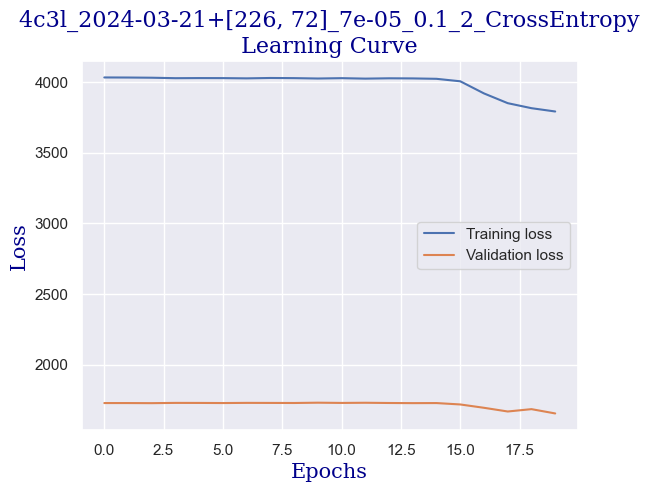

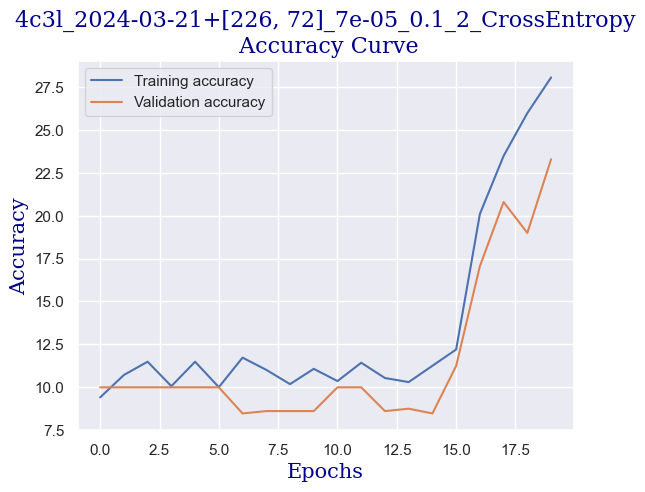

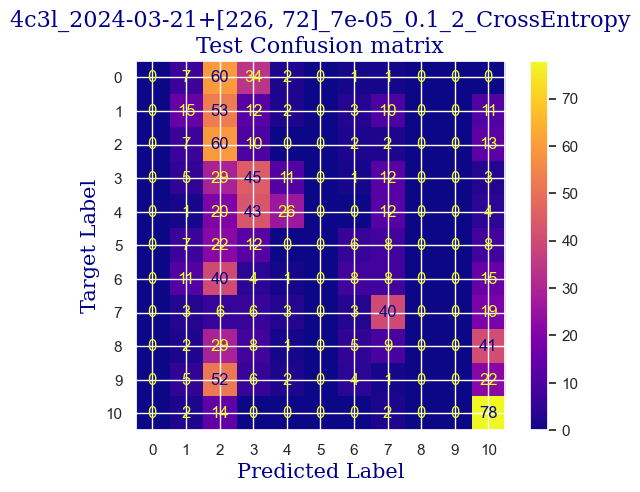

 
 END 4c3l [226, 72] Run Time:  3934.4913178780116
Model:  4c3l  idx: 0 / 1
resolution:  [226, 72]   idx: 1 / 7
learning rate:  7e-05   idx: 2 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.1   idx: 1 / 3
seed:  3   idx:  2 / 3
loss function:  CrossEntropy  idx: 0 / 1
282332.489459326
282320.07894179097
Total epochs: 20


  0%|                                                                                                                        | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  8.209399167162404
validating...


  5%|█████▌                                                                                                          | 1/20 [00:12<03:49, 12.09s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  9.458655562165378
validating...


 10%|███████████▏                                                                                                    | 2/20 [00:24<03:36, 12.05s/it]

validation accuracy:  7.489597780859916
Training...
train accuracy:  10.469958358120167
validating...


 15%|████████████████▊                                                                                               | 3/20 [00:36<03:24, 12.05s/it]

validation accuracy:  10.263522884882107
Training...
train accuracy:  17.19214753123141
validating...


 20%|██████████████████████▍                                                                                         | 4/20 [00:48<03:12, 12.04s/it]

validation accuracy:  19.00138696255201
Training...
train accuracy:  25.81796549672814
validating...


 25%|████████████████████████████                                                                                    | 5/20 [01:00<03:00, 12.01s/it]

validation accuracy:  23.578363384188627
Training...
train accuracy:  31.945270672218918
validating...


 30%|█████████████████████████████████▌                                                                              | 6/20 [01:12<02:48, 12.02s/it]

validation accuracy:  29.680998613037445
Training...
train accuracy:  35.336109458655564
validating...


 35%|███████████████████████████████████████▏                                                                        | 7/20 [01:24<02:36, 12.03s/it]

validation accuracy:  31.06796116504854
Training...
train accuracy:  38.66745984533016
validating...


 40%|████████████████████████████████████████████▊                                                                   | 8/20 [01:36<02:24, 12.00s/it]

validation accuracy:  31.622746185852986
Training...
train accuracy:  39.85722784057109
validating...


 45%|██████████████████████████████████████████████████▍                                                             | 9/20 [01:48<02:12, 12.03s/it]

validation accuracy:  32.45492371705964
Training...
train accuracy:  42.9506246281975
validating...


 50%|███████████████████████████████████████████████████████▌                                                       | 10/20 [02:00<02:00, 12.03s/it]

validation accuracy:  36.89320388349515
Training...
train accuracy:  46.46044021415824
validating...


 55%|█████████████████████████████████████████████████████████████                                                  | 11/20 [02:12<01:48, 12.04s/it]

validation accuracy:  37.17059639389736
Training...
train accuracy:  48.24509220701963
validating...


 60%|██████████████████████████████████████████████████████████████████▌                                            | 12/20 [02:24<01:36, 12.04s/it]

validation accuracy:  37.86407766990291
Training...
train accuracy:  50.44616299821535
validating...


 65%|████████████████████████████████████████████████████████████████████████▏                                      | 13/20 [02:36<01:24, 12.04s/it]

validation accuracy:  40.221914008321775
Training...
train accuracy:  51.39797739440809
validating...


 70%|█████████████████████████████████████████████████████████████████████████████▋                                 | 14/20 [02:48<01:12, 12.06s/it]

validation accuracy:  40.6380027739251
Training...
train accuracy:  53.95597858417609
validating...


 75%|███████████████████████████████████████████████████████████████████████████████████▎                           | 15/20 [03:00<01:00, 12.01s/it]

validation accuracy:  40.6380027739251
Training...
train accuracy:  55.56216537775134
validating...


 80%|████████████████████████████████████████████████████████████████████████████████████████▊                      | 16/20 [03:12<00:48, 12.02s/it]

validation accuracy:  41.88626907073509
Training...
train accuracy:  58.29863176680548
validating...


 85%|██████████████████████████████████████████████████████████████████████████████████████████████▎                | 17/20 [03:24<00:36, 12.02s/it]

validation accuracy:  42.0249653259362
Training...
train accuracy:  59.012492563950026
validating...


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████▉           | 18/20 [03:36<00:24, 12.04s/it]

validation accuracy:  41.74757281553398
Training...
train accuracy:  60.38072575847709
validating...


 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 19/20 [03:48<00:12, 12.03s/it]

validation accuracy:  42.302357836338416
Training...
train accuracy:  62.28435455086259
validating...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [04:00<00:00, 12.03s/it]

validation accuracy:  42.163661581137305
Testing...


 
 train acc:  62.28435455086259
 
 val acc:  42.163661581137305
 
 test acc:  39.90291262135922


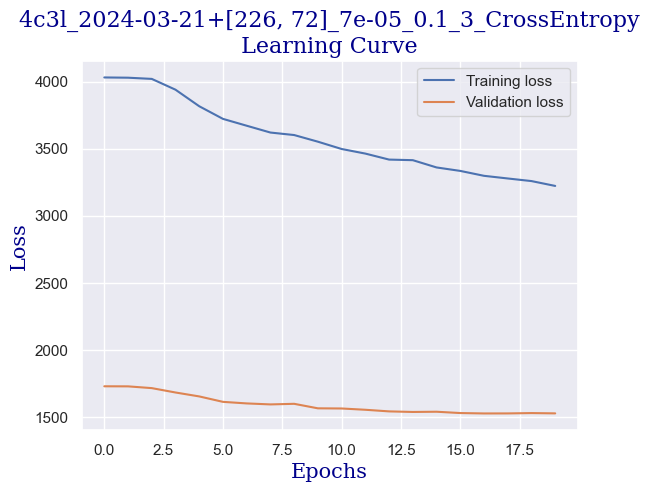

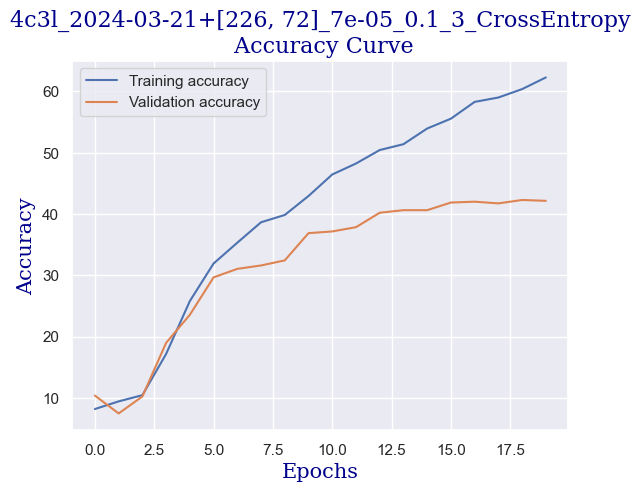

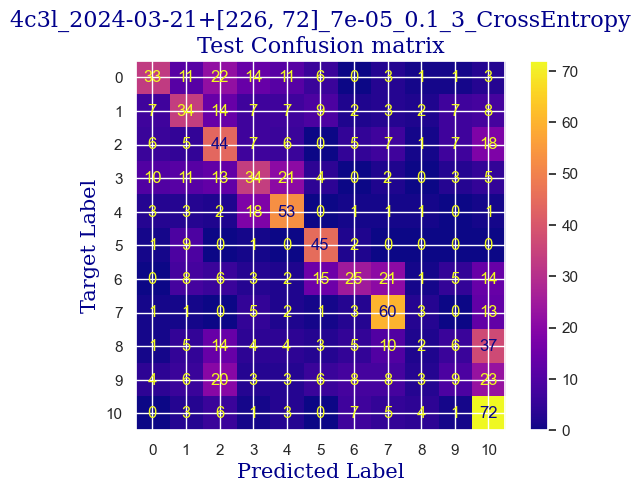

 
 END 4c3l [226, 72] Run Time:  3933.1222753099864
Model:  4c3l  idx: 0 / 1
resolution:  [226, 72]   idx: 1 / 7
learning rate:  7e-05   idx: 2 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.2   idx: 2 / 3
seed:  8   idx:  0 / 3
loss function:  CrossEntropy  idx: 0 / 1
286265.612890431
286253.202387674
Total epochs: 20


  0%|                                                                                                                        | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  8.566329565734682
validating...


  5%|█████▌                                                                                                          | 1/20 [00:11<03:47, 11.95s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.053539559785841
validating...


 10%|███████████▏                                                                                                    | 2/20 [00:23<03:35, 11.99s/it]

validation accuracy:  9.847434119278779
Training...
train accuracy:  12.671029149315881
validating...


 15%|████████████████▊                                                                                               | 3/20 [00:35<03:23, 11.98s/it]

validation accuracy:  20.110957004160888
Training...
train accuracy:  24.806662700773348
validating...


 20%|██████████████████████▍                                                                                         | 4/20 [00:47<03:12, 12.01s/it]

validation accuracy:  25.93619972260749
Training...
train accuracy:  31.05294467578822
validating...


 25%|████████████████████████████                                                                                    | 5/20 [01:00<03:00, 12.06s/it]

validation accuracy:  29.542302357836338
Training...
train accuracy:  33.372992266508035
validating...


 30%|█████████████████████████████████▌                                                                              | 6/20 [01:12<02:48, 12.04s/it]

validation accuracy:  33.42579750346741
Training...
train accuracy:  37.9535990481856
validating...


 35%|███████████████████████████████████████▏                                                                        | 7/20 [01:24<02:35, 11.99s/it]

validation accuracy:  32.593619972260754
Training...
train accuracy:  37.894110648423556
validating...


 40%|████████████████████████████████████████████▊                                                                   | 8/20 [01:35<02:23, 11.96s/it]

validation accuracy:  35.367545076282944
Training...
train accuracy:  41.99881023200476
validating...


 45%|██████████████████████████████████████████████████▍                                                             | 9/20 [01:47<02:11, 11.96s/it]

validation accuracy:  36.33841886269071
Training...
train accuracy:  43.66448542534206
validating...


 50%|███████████████████████████████████████████████████████▌                                                       | 10/20 [02:00<02:00, 12.03s/it]

validation accuracy:  39.94452149791955
Training...
train accuracy:  45.15169541939322
validating...


 55%|█████████████████████████████████████████████████████████████                                                  | 11/20 [02:12<01:48, 12.04s/it]

validation accuracy:  34.25797503467407
Training...
train accuracy:  46.46044021415824
validating...


 60%|██████████████████████████████████████████████████████████████████▌                                            | 12/20 [02:23<01:35, 11.96s/it]

validation accuracy:  39.1123439667129
Training...
train accuracy:  47.47174301011302
validating...


 65%|████████████████████████████████████████████████████████████████████████▏                                      | 13/20 [02:35<01:23, 12.00s/it]

validation accuracy:  41.88626907073509
Training...
train accuracy:  47.59071980963712
validating...


 70%|█████████████████████████████████████████████████████████████████████████████▋                                 | 14/20 [02:47<01:11, 11.97s/it]

validation accuracy:  42.57975034674064
Training...
train accuracy:  49.01844140392623
validating...


 75%|███████████████████████████████████████████████████████████████████████████████████▎                           | 15/20 [02:59<00:59, 11.96s/it]

validation accuracy:  42.163661581137305
Training...
train accuracy:  53.12314098750743
validating...


 80%|████████████████████████████████████████████████████████████████████████████████████████▊                      | 16/20 [03:11<00:47, 11.99s/it]

validation accuracy:  43.13453536754508
Training...
train accuracy:  52.171326591314696
validating...


 85%|██████████████████████████████████████████████████████████████████████████████████████████████▎                | 17/20 [03:23<00:35, 11.93s/it]

validation accuracy:  43.96671289875174
Training...
train accuracy:  53.7180249851279
validating...


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████▉           | 18/20 [03:35<00:23, 11.92s/it]

validation accuracy:  44.10540915395285
Training...
train accuracy:  55.32421177870316
validating...


 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 19/20 [03:47<00:11, 11.92s/it]

validation accuracy:  44.521497919556175
Training...
train accuracy:  55.56216537775134
validating...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [03:59<00:00, 11.97s/it]

validation accuracy:  46.87933425797504
Testing...


 
 train acc:  55.56216537775134
 
 val acc:  46.87933425797504
 
 test acc:  41.94174757281554


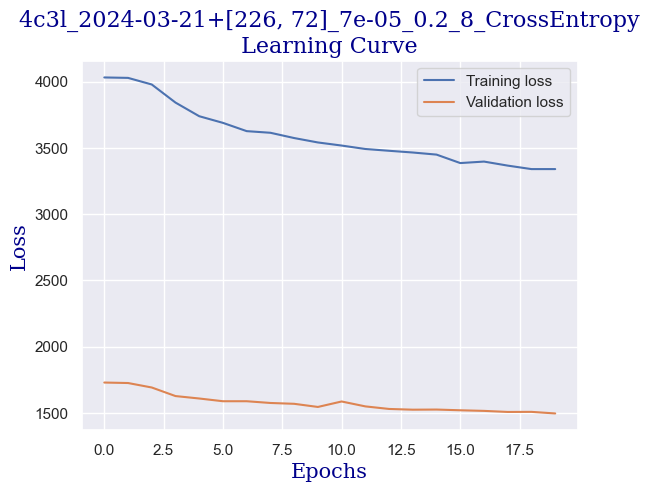

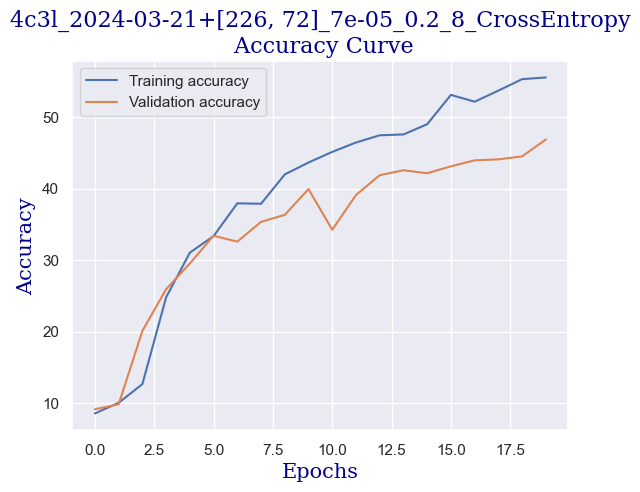

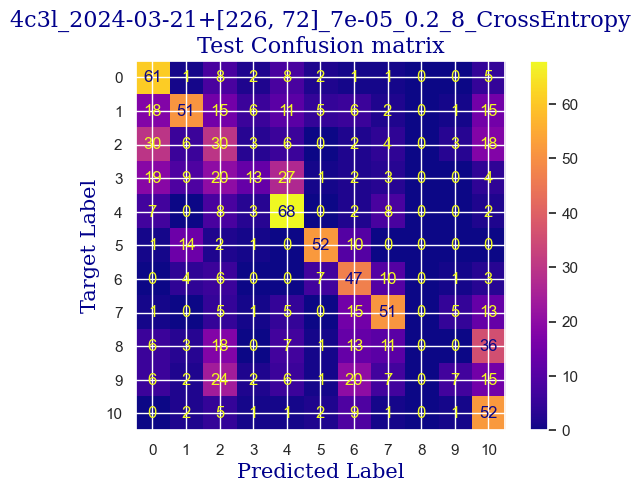

 
 END 4c3l [226, 72] Run Time:  3924.5474502620054
Model:  4c3l  idx: 0 / 1
resolution:  [226, 72]   idx: 1 / 7
learning rate:  7e-05   idx: 2 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.2   idx: 2 / 3
seed:  2   idx:  1 / 3
loss function:  CrossEntropy  idx: 0 / 1
290190.161877049
290177.751360002
Total epochs: 20


  0%|                                                                                                                        | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  9.1017251635931
validating...


  5%|█████▌                                                                                                          | 1/20 [00:11<03:46, 11.93s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  9.994051160023796
validating...


 10%|███████████▏                                                                                                    | 2/20 [00:24<03:37, 12.06s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.58893515764426
validating...


 15%|████████████████▊                                                                                               | 3/20 [00:36<03:25, 12.08s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.350981558596075
validating...


 20%|██████████████████████▍                                                                                         | 4/20 [00:48<03:12, 12.06s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.291493158834028
validating...


 25%|████████████████████████████                                                                                    | 5/20 [01:00<03:00, 12.04s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  11.362284354550862
validating...


 30%|█████████████████████████████████▌                                                                              | 6/20 [01:12<02:48, 12.05s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  11.183819155264723
validating...


 35%|███████████████████████████████████████▏                                                                        | 7/20 [01:24<02:36, 12.04s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  11.600237953599049
validating...


 40%|████████████████████████████████████████████▊                                                                   | 8/20 [01:36<02:24, 12.05s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  9.220701963117191
validating...


 45%|██████████████████████████████████████████████████▍                                                             | 9/20 [01:48<02:12, 12.07s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  11.302795954788817
validating...


 50%|███████████████████████████████████████████████████████▌                                                       | 10/20 [02:00<02:00, 12.04s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.469958358120167
validating...


 55%|█████████████████████████████████████████████████████████████                                                  | 11/20 [02:12<01:48, 12.03s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  9.994051160023796
validating...


 60%|██████████████████████████████████████████████████████████████████▌                                            | 12/20 [02:24<01:36, 12.02s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  11.719214753123142
validating...


 65%|████████████████████████████████████████████████████████████████████████▏                                      | 13/20 [02:36<01:24, 12.02s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.172516359309935
validating...


 70%|█████████████████████████████████████████████████████████████████████████████▋                                 | 14/20 [02:48<01:12, 12.04s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  9.75609756097561
validating...


 75%|███████████████████████████████████████████████████████████████████████████████████▎                           | 15/20 [03:00<01:00, 12.01s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.886377156454492
validating...


 80%|████████████████████████████████████████████████████████████████████████████████████████▊                      | 16/20 [03:12<00:47, 11.98s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  11.24330755502677
validating...


 85%|██████████████████████████████████████████████████████████████████████████████████████████████▎                | 17/20 [03:24<00:35, 11.97s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  11.89767995240928
validating...


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████▉           | 18/20 [03:36<00:24, 12.00s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  11.24330755502677
validating...


 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 19/20 [03:48<00:12, 12.03s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.826888756692444
validating...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [04:00<00:00, 12.03s/it]

validation accuracy:  9.986130374479888
Testing...


 
 train acc:  10.826888756692444
 
 val acc:  9.986130374479888
 
 test acc:  10.29126213592233


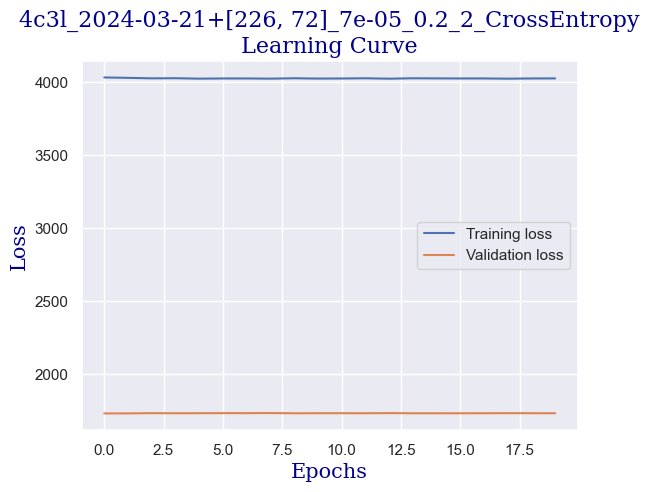

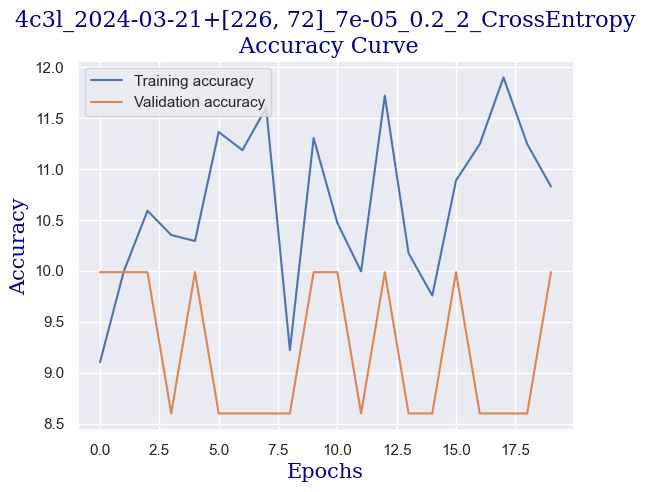

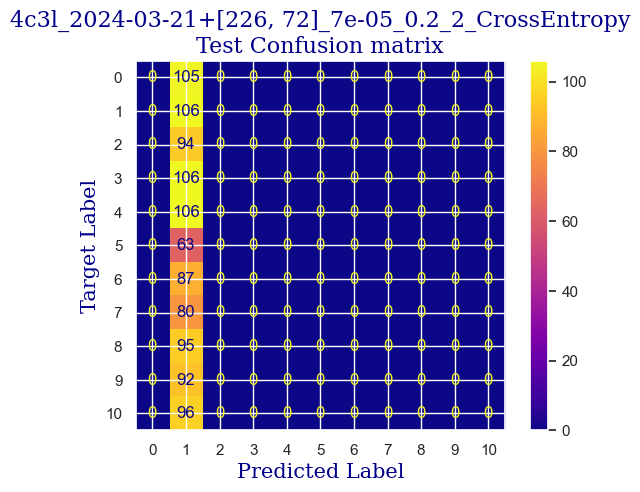

 
 END 4c3l [226, 72] Run Time:  3931.771486370999
Model:  4c3l  idx: 0 / 1
resolution:  [226, 72]   idx: 1 / 7
learning rate:  7e-05   idx: 2 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.2   idx: 2 / 3
seed:  3   idx:  2 / 3
loss function:  CrossEntropy  idx: 0 / 1
294121.934768837
294109.524258321
Total epochs: 20


  0%|                                                                                                                        | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  9.934562760261748
validating...


  5%|█████▌                                                                                                          | 1/20 [00:12<03:48, 12.02s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  10.529446757882214
validating...


 10%|███████████▏                                                                                                    | 2/20 [00:24<03:37, 12.09s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  10.648423557406305
validating...


 15%|████████████████▊                                                                                               | 3/20 [00:36<03:24, 12.04s/it]

validation accuracy:  14.147018030513175
Training...
train accuracy:  18.14396192742415
validating...


 20%|██████████████████████▍                                                                                         | 4/20 [00:48<03:12, 12.05s/it]

validation accuracy:  18.58529819694868
Training...
train accuracy:  24.09280190362879
validating...


 25%|████████████████████████████                                                                                    | 5/20 [01:00<03:00, 12.05s/it]

validation accuracy:  20.665742024965326
Training...
train accuracy:  27.66210588935158
validating...


 30%|█████████████████████████████████▌                                                                              | 6/20 [01:12<02:48, 12.03s/it]

validation accuracy:  23.300970873786408
Training...
train accuracy:  28.61392028554432
validating...


 35%|███████████████████████████████████████▏                                                                        | 7/20 [01:24<02:36, 12.05s/it]

validation accuracy:  24.687933425797503
Training...
train accuracy:  31.171921475312313
validating...


 40%|████████████████████████████████████████████▊                                                                   | 8/20 [01:36<02:24, 12.05s/it]

validation accuracy:  23.43966712898752
Training...
train accuracy:  33.96787626412849
validating...


 45%|██████████████████████████████████████████████████▍                                                             | 9/20 [01:48<02:12, 12.06s/it]

validation accuracy:  25.52011095700416
Training...
train accuracy:  36.882807852468765
validating...


 50%|███████████████████████████████████████████████████████▌                                                       | 10/20 [02:00<02:00, 12.05s/it]

validation accuracy:  27.323162274618586
Training...
train accuracy:  37.477691850089236
validating...


 55%|█████████████████████████████████████████████████████████████                                                  | 11/20 [02:12<01:47, 11.98s/it]

validation accuracy:  28.9875173370319
Training...
train accuracy:  41.2849494348602
validating...


 60%|██████████████████████████████████████████████████████████████████▌                                            | 12/20 [02:24<01:35, 11.94s/it]

validation accuracy:  32.87101248266297
Training...
train accuracy:  45.27067221891731
validating...


 65%|████████████████████████████████████████████████████████████████████████▏                                      | 13/20 [02:36<01:23, 11.92s/it]

validation accuracy:  33.287101248266296
Training...
train accuracy:  46.103509815585966
validating...


 70%|█████████████████████████████████████████████████████████████████████████████▋                                 | 14/20 [02:48<01:11, 11.97s/it]

validation accuracy:  35.09015256588072
Training...
train accuracy:  46.936347412254605
validating...


 75%|███████████████████████████████████████████████████████████████████████████████████▎                           | 15/20 [02:59<00:59, 11.93s/it]

validation accuracy:  35.78363384188627
Training...
train accuracy:  48.89946460440214
validating...


 80%|████████████████████████████████████████████████████████████████████████████████████████▊                      | 16/20 [03:11<00:47, 11.89s/it]

validation accuracy:  35.367545076282944
Training...
train accuracy:  49.67281380130875
validating...


 85%|██████████████████████████████████████████████████████████████████████████████████████████████▎                | 17/20 [03:23<00:35, 11.92s/it]

validation accuracy:  37.17059639389736
Training...
train accuracy:  52.409280190362885
validating...


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████▉           | 18/20 [03:35<00:23, 11.93s/it]

validation accuracy:  40.6380027739251
Training...
train accuracy:  52.76621058893516
validating...


 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 19/20 [03:47<00:11, 11.94s/it]

validation accuracy:  38.69625520110957
Training...
train accuracy:  56.454491374182034
validating...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [03:59<00:00, 11.99s/it]

validation accuracy:  41.19278779472954
Testing...


 
 train acc:  56.454491374182034
 
 val acc:  41.19278779472954
 
 test acc:  40.29126213592233


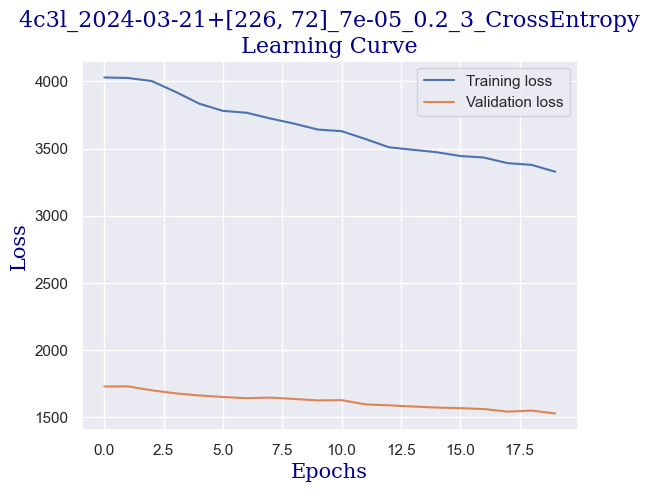

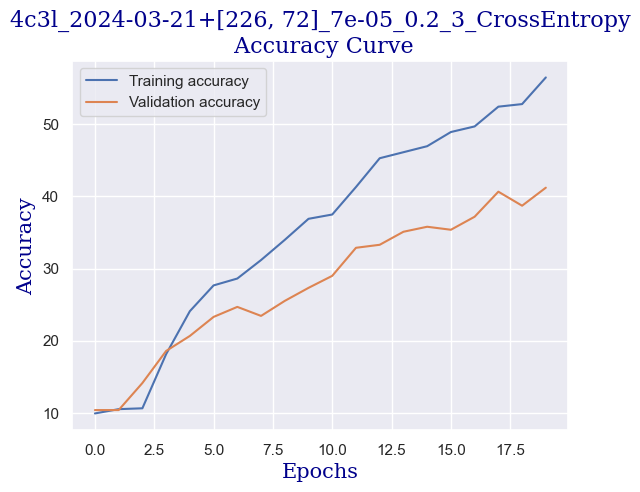

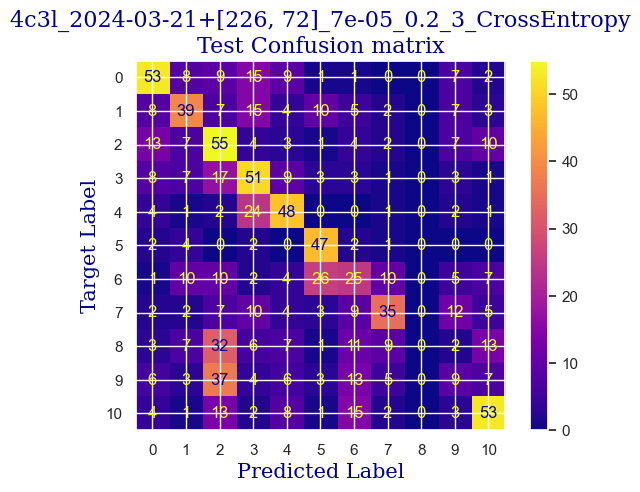

 
 END 4c3l [226, 72] Run Time:  3926.3719659529743
Model:  4c3l  idx: 0 / 1
resolution:  [226, 72]   idx: 1 / 7
learning rate:  8e-05   idx: 3 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0   idx: 0 / 3
seed:  8   idx:  0 / 3
loss function:  CrossEntropy  idx: 0 / 1
298048.307973454
298035.897457379
Total epochs: 20


  0%|                                                                                                                        | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  9.934562760261748
validating...


  5%|█████▌                                                                                                          | 1/20 [00:11<03:47, 11.97s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  8.209399167162404
validating...


 10%|███████████▏                                                                                                    | 2/20 [00:23<03:36, 12.00s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  9.39916716240333
validating...


 15%|████████████████▊                                                                                               | 3/20 [00:36<03:24, 12.03s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  9.875074360499703
validating...


 20%|██████████████████████▍                                                                                         | 4/20 [00:47<03:11, 11.97s/it]

validation accuracy:  10.540915395284326
Training...
train accuracy:  8.982748364069007
validating...


 25%|████████████████████████████                                                                                    | 5/20 [00:59<02:59, 12.00s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  11.124330755502678
validating...


 30%|█████████████████████████████████▌                                                                              | 6/20 [01:11<02:47, 11.99s/it]

validation accuracy:  15.256588072122051
Training...
train accuracy:  19.750148720999405
validating...


 35%|███████████████████████████████████████▏                                                                        | 7/20 [01:24<02:36, 12.02s/it]

validation accuracy:  22.46879334257975
Training...
train accuracy:  26.174895895300416
validating...


 40%|████████████████████████████████████████████▊                                                                   | 8/20 [01:35<02:23, 11.98s/it]

validation accuracy:  25.24271844660194
Training...
train accuracy:  29.08982748364069
validating...


 45%|██████████████████████████████████████████████████▍                                                             | 9/20 [01:47<02:11, 11.96s/it]

validation accuracy:  25.24271844660194
Training...
train accuracy:  32.83759666864962
validating...


 50%|███████████████████████████████████████████████████████▌                                                       | 10/20 [01:59<01:59, 11.98s/it]

validation accuracy:  31.06796116504854
Training...
train accuracy:  35.5145746579417
validating...


 55%|█████████████████████████████████████████████████████████████                                                  | 11/20 [02:11<01:47, 11.97s/it]

validation accuracy:  31.345353675450767
Training...
train accuracy:  37.9535990481856
validating...


 60%|██████████████████████████████████████████████████████████████████▌                                            | 12/20 [02:23<01:35, 11.98s/it]

validation accuracy:  34.39667128987517
Training...
train accuracy:  41.93932183224271
validating...


 65%|████████████████████████████████████████████████████████████████████████▏                                      | 13/20 [02:35<01:23, 11.99s/it]

validation accuracy:  31.06796116504854
Training...
train accuracy:  42.0582986317668
validating...


 70%|█████████████████████████████████████████████████████████████████████████████▋                                 | 14/20 [02:47<01:11, 11.95s/it]

validation accuracy:  35.09015256588072
Training...
train accuracy:  43.426531826293875
validating...


 75%|███████████████████████████████████████████████████████████████████████████████████▎                           | 15/20 [02:59<00:59, 11.96s/it]

validation accuracy:  33.00970873786408
Training...
train accuracy:  44.91374182034503
validating...


 80%|████████████████████████████████████████████████████████████████████████████████████████▊                      | 16/20 [03:11<00:47, 11.96s/it]

validation accuracy:  36.754507628294036
Training...
train accuracy:  47.531231409875076
validating...


 85%|██████████████████████████████████████████████████████████████████████████████████████████████▎                | 17/20 [03:23<00:36, 12.02s/it]

validation accuracy:  35.92233009708738
Training...
train accuracy:  49.37537180249851
validating...


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████▉           | 18/20 [03:35<00:24, 12.04s/it]

validation accuracy:  31.900138696255205
Training...
train accuracy:  48.30458060678168
validating...


 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 19/20 [03:47<00:12, 12.03s/it]

validation accuracy:  33.70319001386963
Training...
train accuracy:  49.55383700178465
validating...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [03:59<00:00, 12.00s/it]

validation accuracy:  35.92233009708738
Testing...


 
 train acc:  49.55383700178465
 
 val acc:  35.92233009708738
 
 test acc:  33.592233009708735


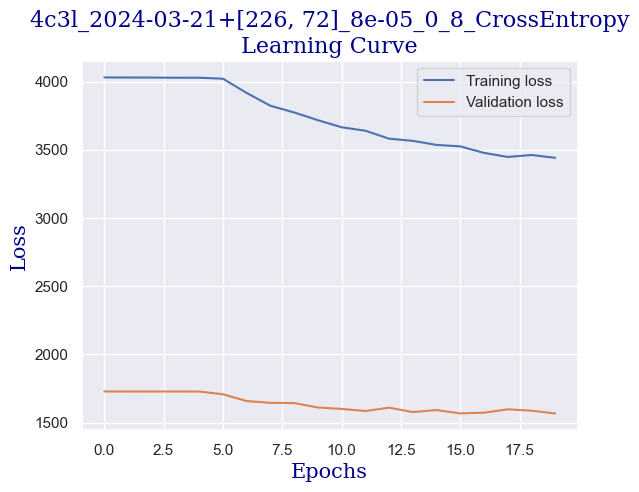

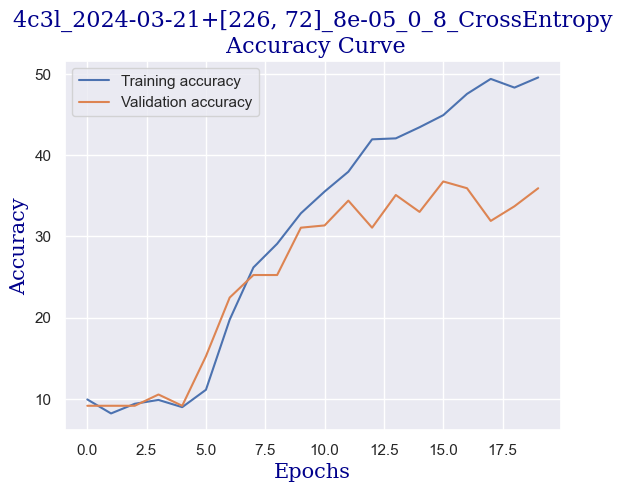

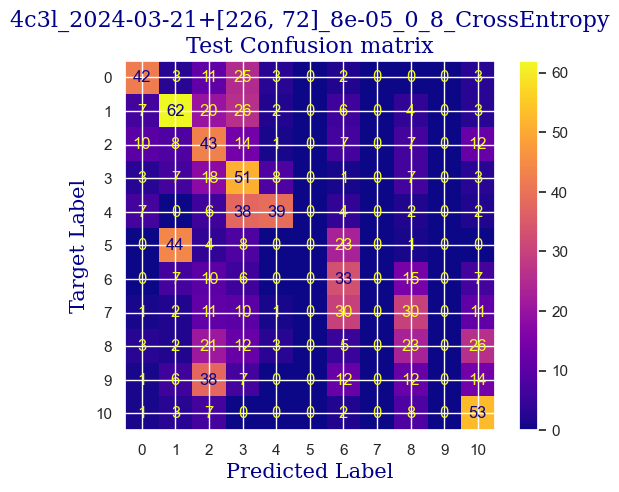

 
 END 4c3l [226, 72] Run Time:  3924.9115389530198
Model:  4c3l  idx: 0 / 1
resolution:  [226, 72]   idx: 1 / 7
learning rate:  8e-05   idx: 3 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0   idx: 0 / 3
seed:  2   idx:  1 / 3
loss function:  CrossEntropy  idx: 0 / 1
301973.220862803
301960.81035326497
Total epochs: 20


  0%|                                                                                                                        | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  8.26888756692445
validating...


  5%|█████▌                                                                                                          | 1/20 [00:12<03:49, 12.06s/it]

validation accuracy:  9.015256588072122
Training...
train accuracy:  9.994051160023796
validating...


 10%|███████████▏                                                                                                    | 2/20 [00:24<03:36, 12.01s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.886377156454492
validating...


 15%|████████████████▊                                                                                               | 3/20 [00:36<03:24, 12.03s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  13.38488994646044
validating...


 20%|██████████████████████▍                                                                                         | 4/20 [00:48<03:12, 12.04s/it]

validation accuracy:  16.920943134535367
Training...
train accuracy:  24.568709101725165
validating...


 25%|████████████████████████████                                                                                    | 5/20 [01:00<02:59, 11.99s/it]

validation accuracy:  23.855755894590846
Training...
train accuracy:  30.93396787626413
validating...


 30%|█████████████████████████████████▌                                                                              | 6/20 [01:12<02:47, 11.99s/it]

validation accuracy:  20.527045769764214
Training...
train accuracy:  33.25401546698394
validating...


 35%|███████████████████████████████████████▏                                                                        | 7/20 [01:24<02:36, 12.01s/it]

validation accuracy:  32.038834951456316
Training...
train accuracy:  34.32480666270077
validating...


 40%|████████████████████████████████████████████▊                                                                   | 8/20 [01:36<02:24, 12.04s/it]

validation accuracy:  33.56449375866852
Training...
train accuracy:  38.19155264723379
validating...


 45%|██████████████████████████████████████████████████▍                                                             | 9/20 [01:48<02:12, 12.06s/it]

validation accuracy:  32.73231622746186
Training...
train accuracy:  41.64187983343248
validating...


 50%|███████████████████████████████████████████████████████▌                                                       | 10/20 [02:00<01:59, 11.97s/it]

validation accuracy:  34.95145631067961
Training...
train accuracy:  43.66448542534206
validating...


 55%|█████████████████████████████████████████████████████████████                                                  | 11/20 [02:12<01:47, 11.98s/it]

validation accuracy:  36.1997226074896
Training...
train accuracy:  46.162998215348004
validating...


 60%|██████████████████████████████████████████████████████████████████▌                                            | 12/20 [02:24<01:36, 12.00s/it]

validation accuracy:  38.55755894590846
Training...
train accuracy:  47.70969660916121
validating...


 65%|████████████████████████████████████████████████████████████████████████▏                                      | 13/20 [02:36<01:24, 12.03s/it]

validation accuracy:  24.410540915395284
Training...
train accuracy:  50.62462819750149
validating...


 70%|█████████████████████████████████████████████████████████████████████████████▋                                 | 14/20 [02:48<01:12, 12.05s/it]

validation accuracy:  39.94452149791955
Training...
train accuracy:  50.743604997025585
validating...


 75%|███████████████████████████████████████████████████████████████████████████████████▎                           | 15/20 [03:00<01:00, 12.03s/it]

validation accuracy:  36.33841886269071
Training...
train accuracy:  54.491374182034505
validating...


 80%|████████████████████████████████████████████████████████████████████████████████████████▊                      | 16/20 [03:12<00:48, 12.02s/it]

validation accuracy:  40.49930651872399
Training...
train accuracy:  54.729327781082695
validating...


 85%|██████████████████████████████████████████████████████████████████████████████████████████████▎                | 17/20 [03:24<00:36, 12.04s/it]

validation accuracy:  37.7253814147018
Training...
train accuracy:  57.16835217132659
validating...


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████▉           | 18/20 [03:36<00:24, 12.06s/it]

validation accuracy:  43.41192787794729
Training...
train accuracy:  59.904818560380726
validating...


 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 19/20 [03:48<00:12, 12.04s/it]

validation accuracy:  41.33148404993065
Training...
train accuracy:  60.38072575847709
validating...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [04:00<00:00, 12.02s/it]

validation accuracy:  42.0249653259362
Testing...


 
 train acc:  60.38072575847709
 
 val acc:  42.0249653259362
 
 test acc:  38.83495145631068


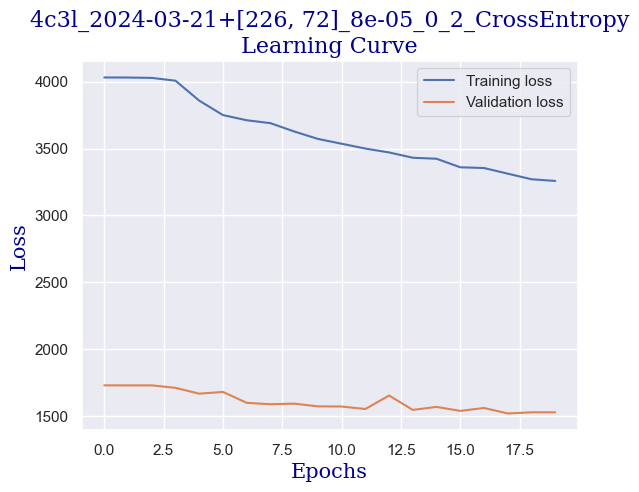

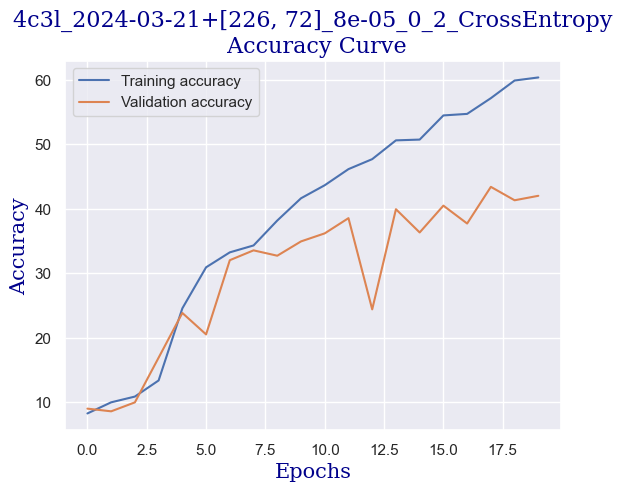

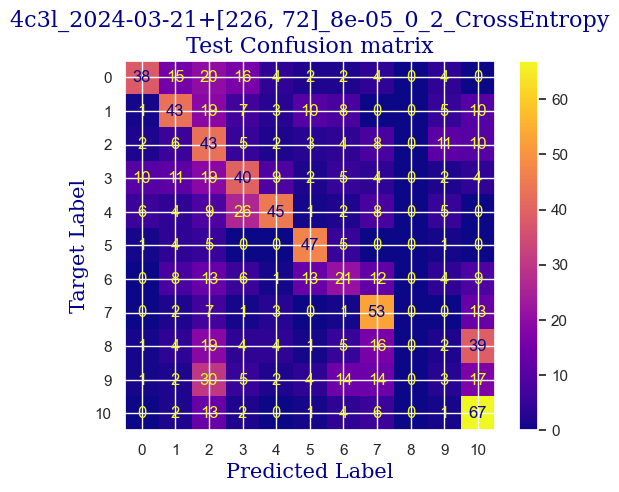

 
 END 4c3l [226, 72] Run Time:  3932.763986896025
Model:  4c3l  idx: 0 / 1
resolution:  [226, 72]   idx: 1 / 7
learning rate:  8e-05   idx: 3 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0   idx: 0 / 3
seed:  3   idx:  2 / 3
loss function:  CrossEntropy  idx: 0 / 1
305905.986298824
305893.575788617
Total epochs: 20


  0%|                                                                                                                        | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  8.030933967876264
validating...


  5%|█████▌                                                                                                          | 1/20 [00:12<03:51, 12.18s/it]

validation accuracy:  9.015256588072122
Training...
train accuracy:  8.685306365258775
validating...


 10%|███████████▏                                                                                                    | 2/20 [00:24<03:36, 12.02s/it]

validation accuracy:  11.511789181692095
Training...
train accuracy:  11.183819155264723
validating...


 15%|████████████████▊                                                                                               | 3/20 [00:36<03:24, 12.03s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  9.220701963117191
validating...


 20%|██████████████████████▍                                                                                         | 4/20 [00:48<03:12, 12.00s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  9.696609161213564
validating...


 25%|████████████████████████████                                                                                    | 5/20 [01:00<02:59, 11.99s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  10.58893515764426
validating...


 30%|█████████████████████████████████▌                                                                              | 6/20 [01:12<02:47, 12.00s/it]

validation accuracy:  7.489597780859916
Training...
train accuracy:  11.005353955978585
validating...


 35%|███████████████████████████████████████▏                                                                        | 7/20 [01:24<02:36, 12.00s/it]

validation accuracy:  11.927877947295423
Training...
train accuracy:  19.928613920285546
validating...


 40%|████████████████████████████████████████████▊                                                                   | 8/20 [01:36<02:23, 12.00s/it]

validation accuracy:  24.133148404993065
Training...
train accuracy:  29.803688280785245
validating...


 45%|██████████████████████████████████████████████████▍                                                             | 9/20 [01:48<02:11, 11.98s/it]

validation accuracy:  33.42579750346741
Training...
train accuracy:  34.20582986317668
validating...


 50%|███████████████████████████████████████████████████████▌                                                       | 10/20 [02:00<01:59, 11.99s/it]

validation accuracy:  29.958391123439664
Training...
train accuracy:  38.19155264723379
validating...


 55%|█████████████████████████████████████████████████████████████                                                  | 11/20 [02:12<01:48, 12.02s/it]

validation accuracy:  35.09015256588072
Training...
train accuracy:  39.97620464009518
validating...


 60%|██████████████████████████████████████████████████████████████████▌                                            | 12/20 [02:24<01:36, 12.02s/it]

validation accuracy:  36.89320388349515
Training...
train accuracy:  41.64187983343248
validating...


 65%|████████████████████████████████████████████████████████████████████████▏                                      | 13/20 [02:36<01:23, 11.99s/it]

validation accuracy:  36.061026352288486
Training...
train accuracy:  43.36704342653183
validating...


 70%|█████████████████████████████████████████████████████████████████████████████▋                                 | 14/20 [02:48<01:12, 12.01s/it]

validation accuracy:  36.1997226074896
Training...
train accuracy:  44.91374182034503
validating...


 75%|███████████████████████████████████████████████████████████████████████████████████▎                           | 15/20 [03:00<01:00, 12.05s/it]

validation accuracy:  36.47711511789182
Training...
train accuracy:  45.98453301606187
validating...


 80%|████████████████████████████████████████████████████████████████████████████████████████▊                      | 16/20 [03:12<00:48, 12.03s/it]

validation accuracy:  38.83495145631068
Training...
train accuracy:  47.70969660916121
validating...


 85%|██████████████████████████████████████████████████████████████████████████████████████████████▎                | 17/20 [03:24<00:36, 12.04s/it]

validation accuracy:  39.528432732316226
Training...
train accuracy:  48.12611540749554
validating...


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████▉           | 18/20 [03:36<00:23, 11.98s/it]

validation accuracy:  36.061026352288486
Training...
train accuracy:  50.50565139797739
validating...


 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 19/20 [03:48<00:12, 12.02s/it]

validation accuracy:  38.69625520110957
Training...
train accuracy:  50.92207019631172
validating...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [04:00<00:00, 12.01s/it]

validation accuracy:  38.28016643550624
Testing...


 
 train acc:  50.92207019631172
 
 val acc:  38.28016643550624
 
 test acc:  36.407766990291265


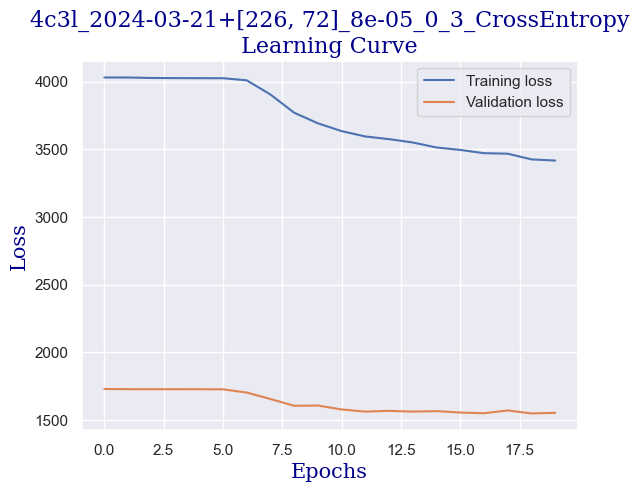

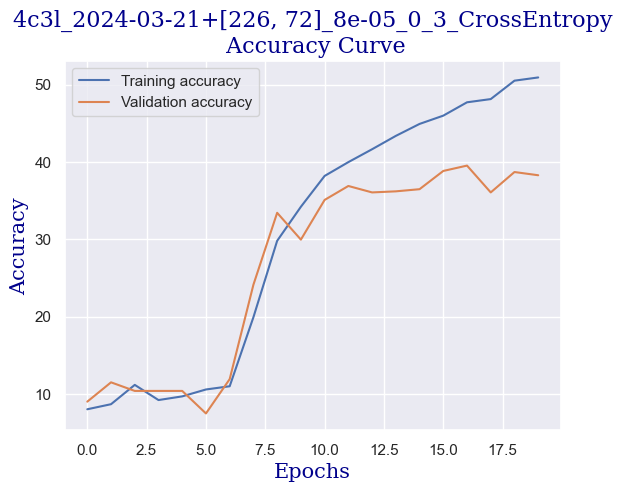

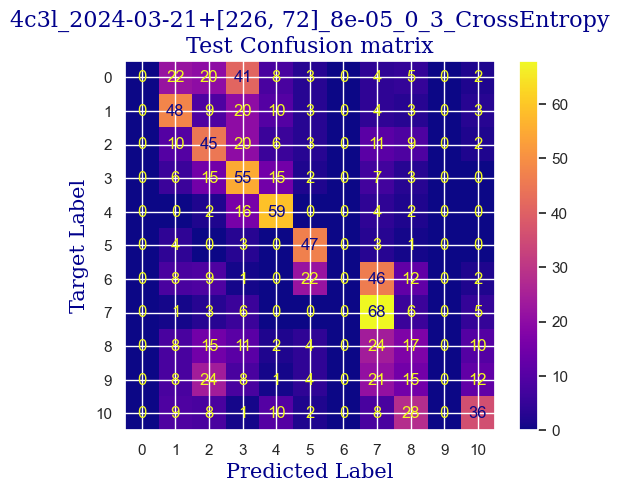

 
 END 4c3l [226, 72] Run Time:  3929.4879652920063
Model:  4c3l  idx: 0 / 1
resolution:  [226, 72]   idx: 1 / 7
learning rate:  8e-05   idx: 3 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.1   idx: 1 / 3
seed:  8   idx:  0 / 3
loss function:  CrossEntropy  idx: 0 / 1
309835.475866508
309823.065356259
Total epochs: 20


  0%|                                                                                                                        | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  9.161213563355146
validating...


  5%|█████▌                                                                                                          | 1/20 [00:12<03:50, 12.11s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.529446757882214
validating...


 10%|███████████▏                                                                                                    | 2/20 [00:24<03:37, 12.08s/it]

validation accuracy:  16.36615811373093
Training...
train accuracy:  20.880428316478287
validating...


 15%|████████████████▊                                                                                               | 3/20 [00:36<03:25, 12.09s/it]

validation accuracy:  23.71705963938974
Training...
train accuracy:  28.078524687685903
validating...


 20%|██████████████████████▍                                                                                         | 4/20 [00:48<03:12, 12.04s/it]

validation accuracy:  29.542302357836338
Training...
train accuracy:  34.50327186198691
validating...


 25%|████████████████████████████                                                                                    | 5/20 [01:00<02:59, 11.96s/it]

validation accuracy:  33.841886269070734
Training...
train accuracy:  37.775133848899465
validating...


 30%|█████████████████████████████████▌                                                                              | 6/20 [01:12<02:48, 12.02s/it]

validation accuracy:  33.56449375866852
Training...
train accuracy:  41.04699583581202
validating...


 35%|███████████████████████████████████████▏                                                                        | 7/20 [01:24<02:36, 12.03s/it]

validation accuracy:  32.87101248266297
Training...
train accuracy:  42.35574063057704
validating...


 40%|████████████████████████████████████████████▊                                                                   | 8/20 [01:36<02:24, 12.03s/it]

validation accuracy:  34.535367545076284
Training...
train accuracy:  44.49732302201071
validating...


 45%|██████████████████████████████████████████████████▍                                                             | 9/20 [01:48<02:12, 12.00s/it]

validation accuracy:  34.674063800277395
Training...
train accuracy:  45.627602617489586
validating...


 50%|███████████████████████████████████████████████████████▌                                                       | 10/20 [02:00<02:00, 12.01s/it]

validation accuracy:  34.812760055478506
Training...
train accuracy:  44.79476502082094
validating...


 55%|█████████████████████████████████████████████████████████████                                                  | 11/20 [02:12<01:48, 12.01s/it]

validation accuracy:  39.389736477115115
Training...
train accuracy:  47.35276621058894
validating...


 60%|██████████████████████████████████████████████████████████████████▌                                            | 12/20 [02:24<01:36, 12.01s/it]

validation accuracy:  41.47018030513176
Training...
train accuracy:  50.44616299821535
validating...


 65%|████████████████████████████████████████████████████████████████████████▏                                      | 13/20 [02:36<01:24, 12.02s/it]

validation accuracy:  37.586685159500696
Training...
train accuracy:  53.004164187983335
validating...


 70%|█████████████████████████████████████████████████████████████████████████████▋                                 | 14/20 [02:48<01:12, 12.02s/it]

validation accuracy:  38.69625520110957
Training...
train accuracy:  54.84830458060678
validating...


 75%|███████████████████████████████████████████████████████████████████████████████████▎                           | 15/20 [03:00<01:00, 12.02s/it]

validation accuracy:  39.528432732316226
Training...
train accuracy:  58.41760856632957
validating...


 80%|████████████████████████████████████████████████████████████████████████████████████████▊                      | 16/20 [03:12<00:48, 12.05s/it]

validation accuracy:  38.00277392510402
Training...
train accuracy:  59.72635336109459
validating...


 85%|██████████████████████████████████████████████████████████████████████████████████████████████▎                | 17/20 [03:24<00:36, 12.03s/it]

validation accuracy:  38.28016643550624
Training...
train accuracy:  61.9274241522903
validating...


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████▉           | 18/20 [03:36<00:24, 12.05s/it]

validation accuracy:  39.80582524271845
Training...
train accuracy:  63.117192147531235
validating...


 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 19/20 [03:48<00:11, 11.98s/it]

validation accuracy:  40.221914008321775
Training...
train accuracy:  65.31826293872695
validating...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [04:00<00:00, 12.02s/it]

validation accuracy:  38.83495145631068
Testing...


 
 train acc:  65.31826293872695
 
 val acc:  38.83495145631068
 
 test acc:  35.92233009708738


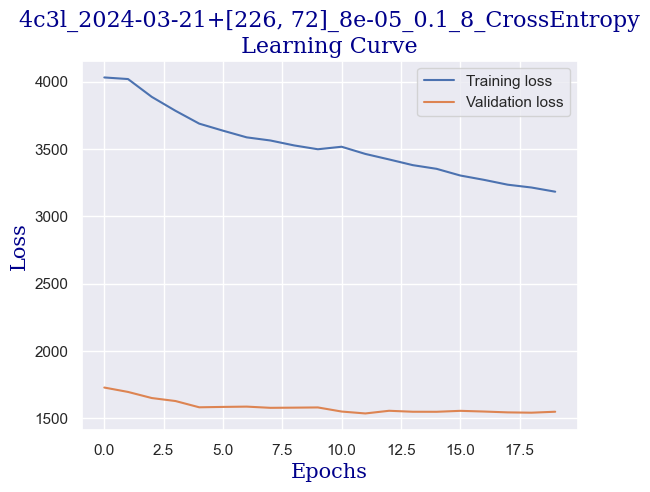

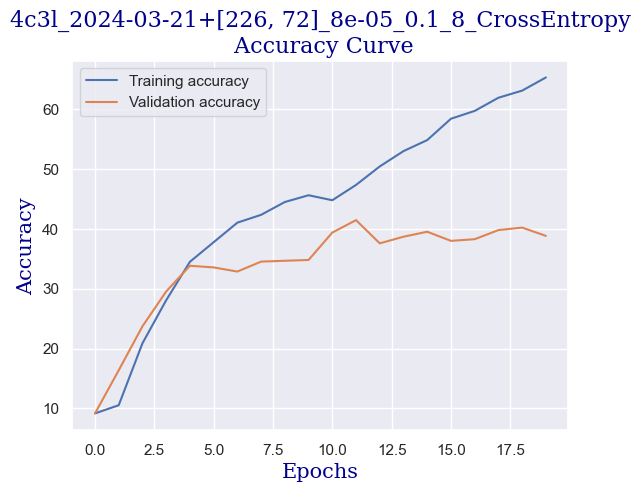

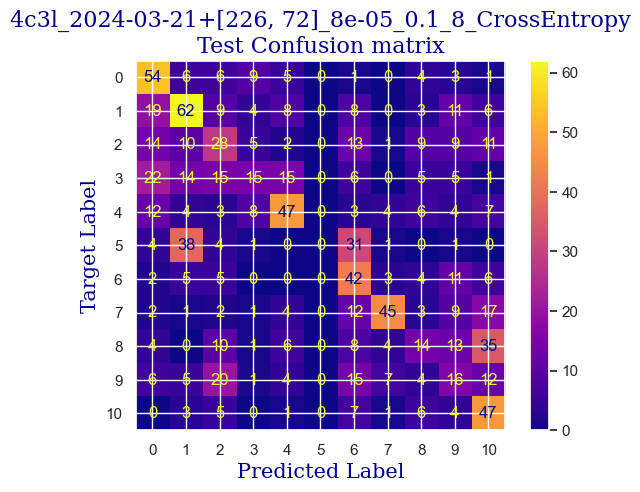

 
 END 4c3l [226, 72] Run Time:  3926.524397662026
Model:  4c3l  idx: 0 / 1
resolution:  [226, 72]   idx: 1 / 7
learning rate:  8e-05   idx: 3 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.1   idx: 1 / 3
seed:  2   idx:  1 / 3
loss function:  CrossEntropy  idx: 0 / 1
313762.00148538
313749.590970043
Total epochs: 20


  0%|                                                                                                                        | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  9.1017251635931
validating...


  5%|█████▌                                                                                                          | 1/20 [00:11<03:47, 11.99s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  11.124330755502678
validating...


 10%|███████████▏                                                                                                    | 2/20 [00:23<03:35, 12.00s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.350981558596075
validating...


 15%|████████████████▊                                                                                               | 3/20 [00:36<03:24, 12.04s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.767400356930398
validating...


 20%|██████████████████████▍                                                                                         | 4/20 [00:48<03:12, 12.06s/it]

validation accuracy:  9.986130374479888
Training...


wandb: Network error (ReadTimeout), entering retry loop.


train accuracy:  10.053539559785841
validating...


 25%|████████████████████████████                                                                                    | 5/20 [01:00<03:01, 12.08s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  9.280190362879239
validating...


 30%|█████████████████████████████████▌                                                                              | 6/20 [01:12<02:49, 12.09s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.58893515764426
validating...


 35%|███████████████████████████████████████▏                                                                        | 7/20 [01:24<02:37, 12.10s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.291493158834028
validating...


 40%|████████████████████████████████████████████▊                                                                   | 8/20 [01:36<02:25, 12.10s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.291493158834028
validating...


 45%|██████████████████████████████████████████████████▍                                                             | 9/20 [01:48<02:13, 12.10s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  10.23200475907198
validating...


 50%|███████████████████████████████████████████████████████▌                                                       | 10/20 [02:00<02:00, 12.08s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  11.06484235574063
validating...


 55%|█████████████████████████████████████████████████████████████                                                  | 11/20 [02:12<01:48, 12.07s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.053539559785841
validating...


 60%|██████████████████████████████████████████████████████████████████▌                                            | 12/20 [02:24<01:36, 12.07s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.41046995835812
validating...


 65%|████████████████████████████████████████████████████████████████████████▏                                      | 13/20 [02:36<01:24, 12.07s/it]

validation accuracy:  8.599167822468793
Training...
train accuracy:  12.254610350981558
validating...


 70%|█████████████████████████████████████████████████████████████████████████████▋                                 | 14/20 [02:48<01:12, 12.04s/it]

validation accuracy:  11.234396671289876
Training...
train accuracy:  22.66508030933968
validating...


 75%|███████████████████████████████████████████████████████████████████████████████████▎                           | 15/20 [03:00<01:00, 12.04s/it]

validation accuracy:  25.65880721220527
Training...
train accuracy:  30.87447947650208
validating...


 80%|████████████████████████████████████████████████████████████████████████████████████████▊                      | 16/20 [03:12<00:47, 11.97s/it]

validation accuracy:  27.461858529819693
Training...
train accuracy:  33.016061867935754
validating...


 85%|██████████████████████████████████████████████████████████████████████████████████████████████▎                | 17/20 [03:24<00:35, 11.99s/it]

validation accuracy:  28.71012482662968
Training...
train accuracy:  35.574063057703746
validating...


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████▉           | 18/20 [03:36<00:23, 11.99s/it]

validation accuracy:  29.26490984743412
Training...
train accuracy:  37.59666864961332
validating...


 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 19/20 [03:48<00:12, 12.01s/it]

validation accuracy:  29.126213592233007
Training...
train accuracy:  38.72694824509221
validating...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [04:00<00:00, 12.05s/it]

validation accuracy:  29.542302357836338
Testing...


 
 train acc:  38.72694824509221
 
 val acc:  29.542302357836338
 
 test acc:  29.902912621359224


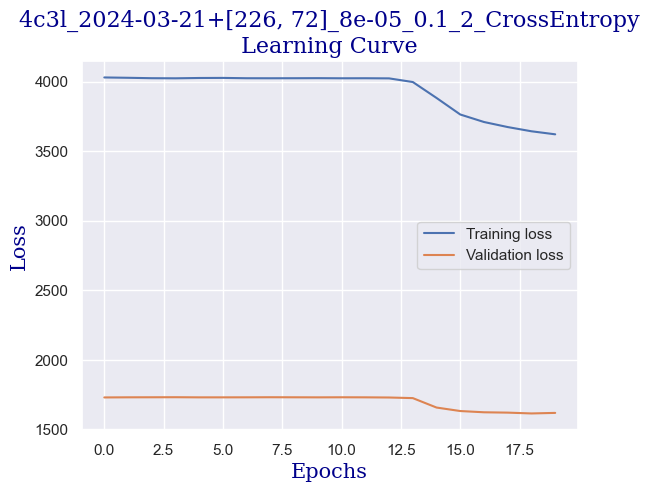

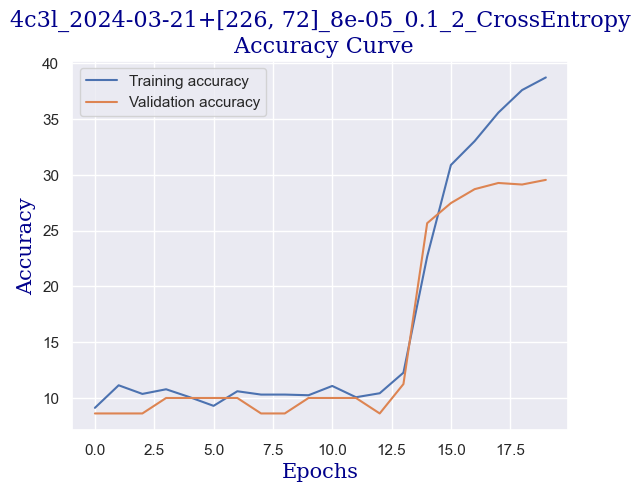

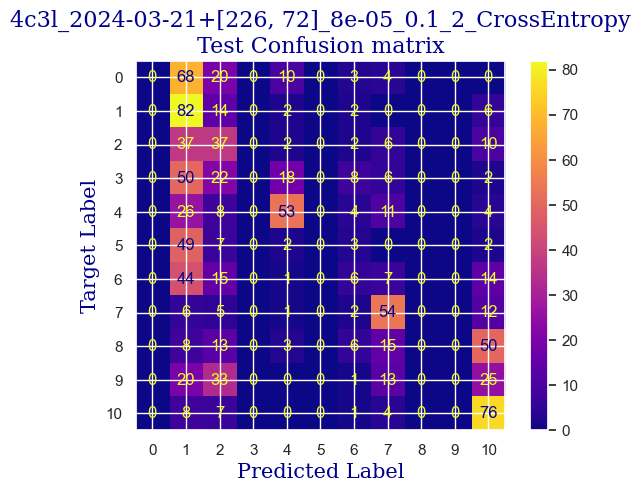

 
 END 4c3l [226, 72] Run Time:  3937.7114297440276
Model:  4c3l  idx: 0 / 1
resolution:  [226, 72]   idx: 1 / 7
learning rate:  8e-05   idx: 3 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.1   idx: 1 / 3
seed:  3   idx:  2 / 3
loss function:  CrossEntropy  idx: 0 / 1
317699.714133677
317687.303620449
Total epochs: 20


  0%|                                                                                                                        | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  9.875074360499703
validating...


  5%|█████▌                                                                                                          | 1/20 [00:11<03:46, 11.92s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  10.350981558596075
validating...


 10%|███████████▏                                                                                                    | 2/20 [00:24<03:36, 12.02s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  13.503866745984533
validating...


 15%|████████████████▊                                                                                               | 3/20 [00:36<03:24, 12.05s/it]

validation accuracy:  18.446601941747574
Training...
train accuracy:  23.081499107674002
validating...


 20%|██████████████████████▍                                                                                         | 4/20 [00:47<03:11, 11.98s/it]

validation accuracy:  25.52011095700416
Training...
train accuracy:  28.73289708506841
validating...


 25%|████████████████████████████                                                                                    | 5/20 [01:00<03:00, 12.04s/it]

validation accuracy:  30.235783633841883
Training...
train accuracy:  34.26531826293873
validating...


 30%|█████████████████████████████████▌                                                                              | 6/20 [01:12<02:48, 12.06s/it]

validation accuracy:  31.345353675450767
Training...
train accuracy:  37.83462224866151
validating...


 35%|███████████████████████████████████████▏                                                                        | 7/20 [01:24<02:37, 12.12s/it]

validation accuracy:  37.586685159500696
Training...
train accuracy:  41.99881023200476
validating...


 40%|████████████████████████████████████████████▊                                                                   | 8/20 [01:36<02:25, 12.12s/it]

validation accuracy:  38.97364771151179
Training...
train accuracy:  47.41225461035098
validating...


 45%|██████████████████████████████████████████████████▍                                                             | 9/20 [01:48<02:13, 12.11s/it]

validation accuracy:  40.36061026352289
Training...
train accuracy:  49.79179060083283
validating...


 50%|███████████████████████████████████████████████████████▌                                                       | 10/20 [02:00<02:01, 12.11s/it]

validation accuracy:  38.83495145631068
Training...
train accuracy:  52.409280190362885
validating...


 55%|█████████████████████████████████████████████████████████████                                                  | 11/20 [02:12<01:48, 12.10s/it]

validation accuracy:  42.44105409153953
Training...
train accuracy:  53.53955978584176
validating...


 60%|██████████████████████████████████████████████████████████████████▌                                            | 12/20 [02:24<01:36, 12.08s/it]

validation accuracy:  41.60887656033287
Training...
train accuracy:  54.43188578227246
validating...


 65%|████████████████████████████████████████████████████████████████████████▏                                      | 13/20 [02:36<01:24, 12.06s/it]

validation accuracy:  43.689320388349515
Training...
train accuracy:  56.930398572278406
validating...


 70%|█████████████████████████████████████████████████████████████████████████████▋                                 | 14/20 [02:48<01:12, 12.03s/it]

validation accuracy:  40.36061026352289
Training...
train accuracy:  57.28732897085068
validating...


 75%|███████████████████████████████████████████████████████████████████████████████████▎                           | 15/20 [03:00<01:00, 12.03s/it]

validation accuracy:  44.66019417475729
Training...
train accuracy:  59.66686496133254
validating...


 80%|████████████████████████████████████████████████████████████████████████████████████████▊                      | 16/20 [03:13<00:48, 12.06s/it]

validation accuracy:  41.88626907073509
Training...
train accuracy:  61.21356335514575
validating...


 85%|██████████████████████████████████████████████████████████████████████████████████████████████▎                | 17/20 [03:25<00:36, 12.05s/it]

validation accuracy:  43.13453536754508
Training...
train accuracy:  63.117192147531235
validating...


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████▉           | 18/20 [03:36<00:23, 11.98s/it]

validation accuracy:  42.163661581137305
Training...
train accuracy:  63.05770374776919
validating...


 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 19/20 [03:48<00:11, 11.99s/it]

validation accuracy:  44.66019417475729
Training...
train accuracy:  65.97263533610946
validating...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [04:00<00:00, 12.04s/it]

validation accuracy:  45.49237170596394
Testing...


 
 train acc:  65.97263533610946
 
 val acc:  45.49237170596394
 
 test acc:  45.14563106796117


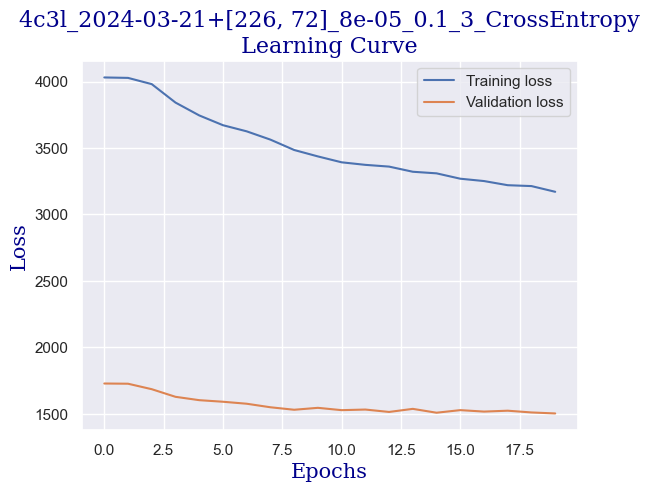

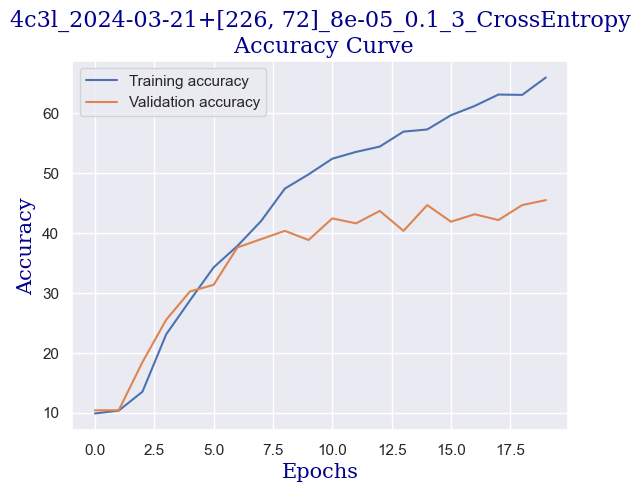

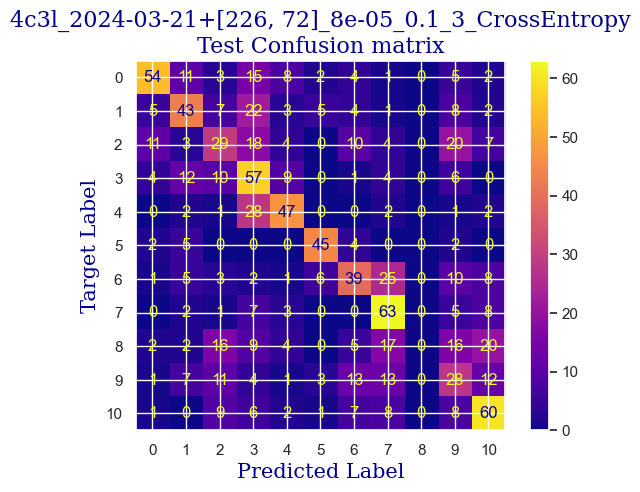

 
 END 4c3l [226, 72] Run Time:  3930.062289899972
Model:  4c3l  idx: 0 / 1
resolution:  [226, 72]   idx: 1 / 7
learning rate:  8e-05   idx: 3 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.2   idx: 2 / 3
seed:  8   idx:  0 / 3
loss function:  CrossEntropy  idx: 0 / 1
321629.777793041
321617.367278472
Total epochs: 20


  0%|                                                                                                                        | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  9.696609161213564
validating...


  5%|█████▌                                                                                                          | 1/20 [00:11<03:44, 11.82s/it]

validation accuracy:  9.70873786407767
Training...
train accuracy:  8.923259964306961
validating...


 10%|███████████▏                                                                                                    | 2/20 [00:23<03:35, 11.96s/it]

validation accuracy:  9.70873786407767
Training...
train accuracy:  9.875074360499703
validating...


 15%|████████████████▊                                                                                               | 3/20 [00:35<03:23, 12.00s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  9.39916716240333
validating...


 20%|██████████████████████▍                                                                                         | 4/20 [00:48<03:12, 12.05s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  9.458655562165378
validating...


 25%|████████████████████████████                                                                                    | 5/20 [00:59<02:59, 11.95s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.826888756692444
validating...


 30%|█████████████████████████████████▌                                                                              | 6/20 [01:11<02:47, 11.96s/it]

validation accuracy:  9.70873786407767
Training...
train accuracy:  9.518143961927423
validating...


 35%|███████████████████████████████████████▏                                                                        | 7/20 [01:23<02:35, 11.96s/it]

validation accuracy:  9.70873786407767
Training...
train accuracy:  8.74479476502082
validating...


 40%|████████████████████████████████████████████▊                                                                   | 8/20 [01:35<02:23, 11.95s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  9.934562760261748
validating...


 45%|██████████████████████████████████████████████████▍                                                             | 9/20 [01:47<02:11, 11.92s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  9.696609161213564
validating...


 50%|███████████████████████████████████████████████████████▌                                                       | 10/20 [01:59<01:59, 11.92s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.053539559785841
validating...


 55%|█████████████████████████████████████████████████████████████                                                  | 11/20 [02:11<01:47, 11.92s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.350981558596075
validating...


 60%|██████████████████████████████████████████████████████████████████▌                                            | 12/20 [02:23<01:35, 11.92s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.41046995835812
validating...


 65%|████████████████████████████████████████████████████████████████████████▏                                      | 13/20 [02:35<01:23, 11.95s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.350981558596075
validating...


 70%|█████████████████████████████████████████████████████████████████████████████▋                                 | 14/20 [02:47<01:11, 11.94s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.350981558596075
validating...


 75%|███████████████████████████████████████████████████████████████████████████████████▎                           | 15/20 [02:59<00:59, 11.91s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.350981558596075
validating...


 80%|████████████████████████████████████████████████████████████████████████████████████████▊                      | 16/20 [03:10<00:47, 11.90s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.350981558596075
validating...


 85%|██████████████████████████████████████████████████████████████████████████████████████████████▎                | 17/20 [03:22<00:35, 11.90s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.350981558596075
validating...


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████▉           | 18/20 [03:34<00:23, 11.93s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.350981558596075
validating...


 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 19/20 [03:46<00:11, 11.92s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  10.350981558596075
validating...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [03:58<00:00, 11.93s/it]

validation accuracy:  9.153952843273231
Testing...


 
 train acc:  10.350981558596075
 
 val acc:  9.153952843273231
 
 test acc:  9.902912621359224


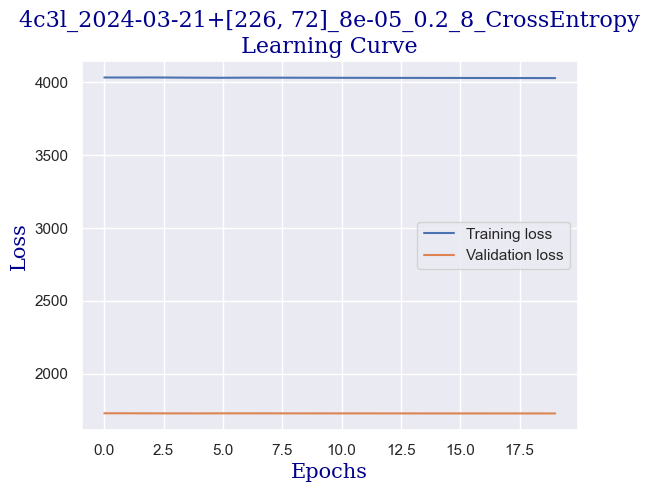

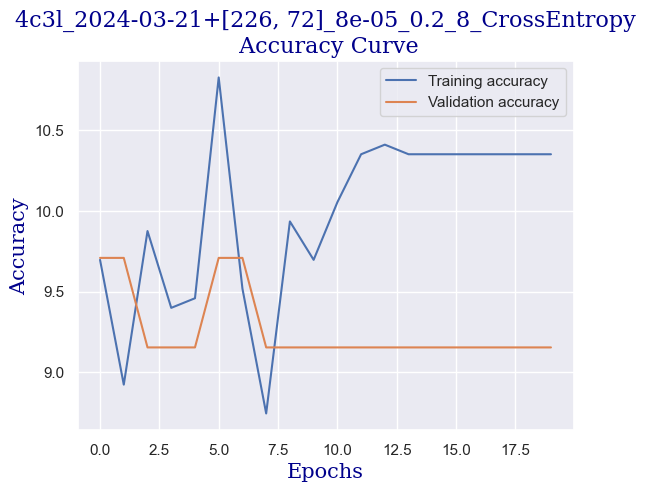

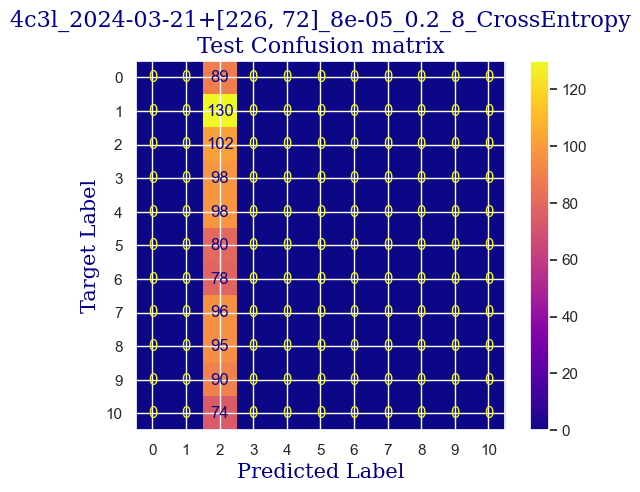

 
 END 4c3l [226, 72] Run Time:  3913.686219442985
Model:  4c3l  idx: 0 / 1
resolution:  [226, 72]   idx: 1 / 7
learning rate:  8e-05   idx: 3 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.2   idx: 2 / 3
seed:  2   idx:  1 / 3
loss function:  CrossEntropy  idx: 0 / 1
325543.465211206
325531.054694003
Total epochs: 20


  0%|                                                                                                                        | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  9.875074360499703
validating...


  5%|█████▌                                                                                                          | 1/20 [00:12<03:50, 12.12s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.469958358120167
validating...


 10%|███████████▏                                                                                                    | 2/20 [00:24<03:36, 12.03s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.529446757882214
validating...


 15%|████████████████▊                                                                                               | 3/20 [00:36<03:24, 12.01s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.291493158834028
validating...


 20%|██████████████████████▍                                                                                         | 4/20 [00:47<03:11, 11.96s/it]

validation accuracy:  9.986130374479888
Training...
train accuracy:  10.945865556216537
validating...


 25%|████████████████████████████                                                                                    | 5/20 [00:59<02:59, 11.96s/it]

validation accuracy:  16.920943134535367
Training...
train accuracy:  21.11838191552647
validating...


 30%|█████████████████████████████████▌                                                                              | 6/20 [01:11<02:47, 11.97s/it]

validation accuracy:  28.9875173370319
Training...
train accuracy:  32.54015466983938
validating...


 35%|███████████████████████████████████████▏                                                                        | 7/20 [01:23<02:35, 11.95s/it]

validation accuracy:  29.819694868238557
Training...
train accuracy:  37.83462224866151
validating...


 40%|████████████████████████████████████████████▊                                                                   | 8/20 [01:35<02:23, 11.97s/it]

validation accuracy:  37.7253814147018
Training...
train accuracy:  41.82034503271862
validating...


 45%|██████████████████████████████████████████████████▍                                                             | 9/20 [01:47<02:11, 11.99s/it]

validation accuracy:  34.535367545076284
Training...
train accuracy:  46.162998215348004
validating...


 50%|███████████████████████████████████████████████████████▌                                                       | 10/20 [01:59<02:00, 12.01s/it]

validation accuracy:  35.64493758668516
Training...
train accuracy:  51.279000594883996
validating...


 55%|█████████████████████████████████████████████████████████████                                                  | 11/20 [02:11<01:48, 12.01s/it]

validation accuracy:  35.22884882108183
Training...
train accuracy:  55.08625817965497
validating...


 60%|██████████████████████████████████████████████████████████████████▌                                            | 12/20 [02:23<01:35, 11.96s/it]

validation accuracy:  38.83495145631068
Training...
train accuracy:  59.19095776323617
validating...


 65%|████████████████████████████████████████████████████████████████████████▏                                      | 13/20 [02:35<01:23, 11.95s/it]

validation accuracy:  38.41886269070735
Training...
train accuracy:  61.1540749553837
validating...


 70%|█████████████████████████████████████████████████████████████████████████████▋                                 | 14/20 [02:47<01:11, 11.97s/it]

validation accuracy:  41.88626907073509
Training...
train accuracy:  64.6044021415824
validating...


 75%|███████████████████████████████████████████████████████████████████████████████████▎                           | 15/20 [02:59<01:00, 12.00s/it]

validation accuracy:  40.915395284327325
Training...
train accuracy:  66.98393813206425
validating...


 80%|████████████████████████████████████████████████████████████████████████████████████████▊                      | 16/20 [03:11<00:48, 12.02s/it]

validation accuracy:  42.57975034674064
Training...
train accuracy:  69.12552052349793
validating...


 85%|██████████████████████████████████████████████████████████████████████████████████████████████▎                | 17/20 [03:23<00:36, 12.02s/it]

validation accuracy:  42.71844660194174
Training...
train accuracy:  72.93277810826889
validating...


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████▉           | 18/20 [03:35<00:24, 12.03s/it]

validation accuracy:  45.49237170596394
Training...
train accuracy:  73.34919690660321
validating...


 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 19/20 [03:47<00:12, 12.02s/it]

validation accuracy:  46.74063800277393
Training...
train accuracy:  76.14515169541939
validating...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [03:59<00:00, 12.00s/it]

validation accuracy:  44.382801664355064
Testing...


 
 train acc:  76.14515169541939
 
 val acc:  44.382801664355064
 
 test acc:  41.16504854368932


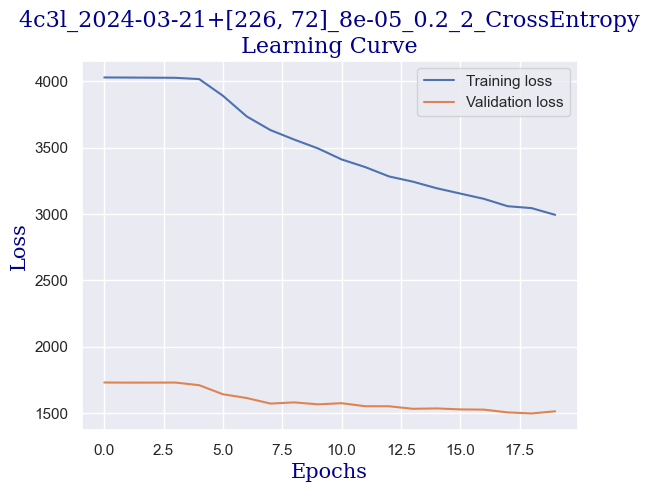

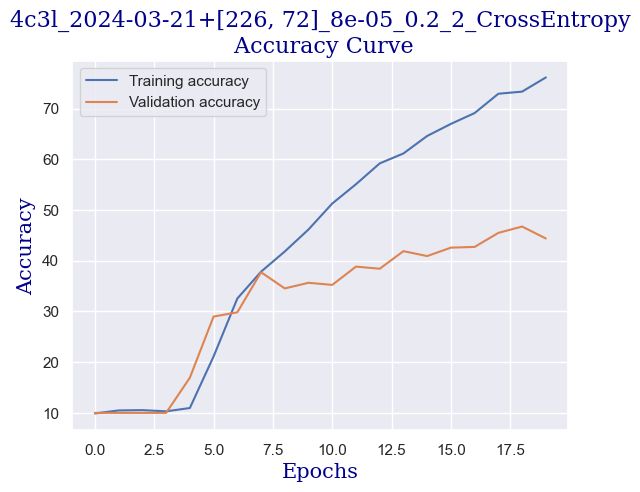

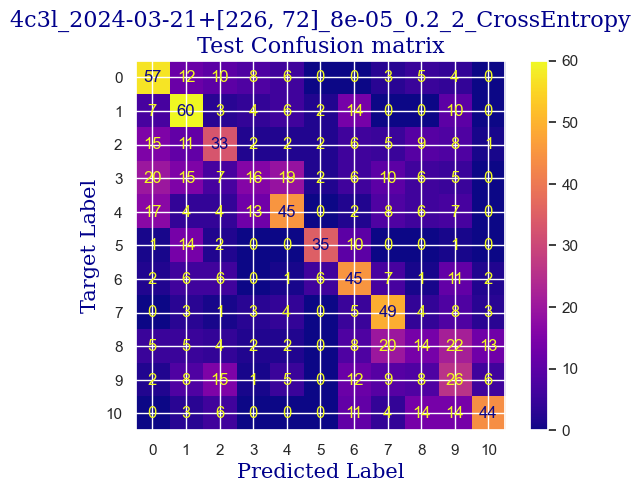

 
 END 4c3l [226, 72] Run Time:  3924.306241759972
Model:  4c3l  idx: 0 / 1
resolution:  [226, 72]   idx: 1 / 7
learning rate:  8e-05   idx: 3 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0.2   idx: 2 / 3
seed:  3   idx:  2 / 3
loss function:  CrossEntropy  idx: 0 / 1
329467.772676591
329455.362165412
Total epochs: 20


  0%|                                                                                                                        | 0/20 [00:00<?, ?it/s]/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


Training...
train accuracy:  9.875074360499703
validating...


  5%|█████▌                                                                                                          | 1/20 [00:11<03:45, 11.86s/it]

validation accuracy:  11.511789181692095
Training...
train accuracy:  9.518143961927423
validating...


 10%|███████████▏                                                                                                    | 2/20 [00:23<03:35, 11.97s/it]

validation accuracy:  7.489597780859916
Training...
train accuracy:  10.291493158834028
validating...


 15%|████████████████▊                                                                                               | 3/20 [00:35<03:23, 11.99s/it]

validation accuracy:  7.489597780859916
Training...
train accuracy:  10.23200475907198
validating...


 20%|██████████████████████▍                                                                                         | 4/20 [00:48<03:12, 12.03s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  9.815585960737657
validating...


 25%|████████████████████████████                                                                                    | 5/20 [01:00<03:00, 12.06s/it]

validation accuracy:  10.402219140083217
Training...
train accuracy:  9.75609756097561
validating...


 30%|█████████████████████████████████▌                                                                              | 6/20 [01:12<02:48, 12.01s/it]

validation accuracy:  9.153952843273231
Training...
train accuracy:  12.07614515169542
validating...


 35%|███████████████████████████████████████▏                                                                        | 7/20 [01:24<02:36, 12.00s/it]

validation accuracy:  10.957004160887656
Training...
train accuracy:  15.942891136228434
validating...


 40%|████████████████████████████████████████████▊                                                                   | 8/20 [01:36<02:23, 12.00s/it]

validation accuracy:  20.110957004160888
Training...
train accuracy:  26.710291493158834
validating...


 45%|██████████████████████████████████████████████████▍                                                             | 9/20 [01:47<02:11, 11.92s/it]

validation accuracy:  29.542302357836338
Training...
train accuracy:  34.62224866151101
validating...


 50%|███████████████████████████████████████████████████████▌                                                       | 10/20 [01:59<01:59, 11.90s/it]

validation accuracy:  33.14840499306519
Training...
train accuracy:  38.37001784651993
validating...


 55%|█████████████████████████████████████████████████████████████                                                  | 11/20 [02:11<01:47, 11.96s/it]

validation accuracy:  34.674063800277395
Training...
train accuracy:  41.46341463414634
validating...


 60%|██████████████████████████████████████████████████████████████████▌                                            | 12/20 [02:23<01:36, 12.01s/it]

validation accuracy:  37.86407766990291
Training...
train accuracy:  43.842950624628195
validating...


 65%|████████████████████████████████████████████████████████████████████████▏                                      | 13/20 [02:35<01:24, 12.05s/it]

validation accuracy:  38.97364771151179
Training...
train accuracy:  45.27067221891731
validating...


 70%|█████████████████████████████████████████████████████████████████████████████▋                                 | 14/20 [02:48<01:12, 12.07s/it]

validation accuracy:  36.061026352288486
Training...
train accuracy:  44.735276621058894
validating...


 75%|███████████████████████████████████████████████████████████████████████████████████▎                           | 15/20 [03:00<01:00, 12.06s/it]

validation accuracy:  39.389736477115115
Training...
train accuracy:  47.531231409875076
validating...


 80%|████████████████████████████████████████████████████████████████████████████████████████▊                      | 16/20 [03:12<00:48, 12.02s/it]

validation accuracy:  39.25104022191401
Training...
train accuracy:  49.494348602022605
validating...


 85%|██████████████████████████████████████████████████████████████████████████████████████████████▎                | 17/20 [03:24<00:36, 12.03s/it]

validation accuracy:  37.586685159500696
Training...
train accuracy:  47.828673408685304
validating...


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████▉           | 18/20 [03:36<00:24, 12.03s/it]

validation accuracy:  35.78363384188627
Training...
train accuracy:  50.86258179654968
validating...


 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 19/20 [03:48<00:11, 11.99s/it]

validation accuracy:  38.97364771151179
Training...
train accuracy:  53.063652587745395
validating...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [03:59<00:00, 12.00s/it]

validation accuracy:  38.141470180305134
Testing...


 
 train acc:  53.063652587745395
 
 val acc:  38.141470180305134
 
 test acc:  40.679611650485434


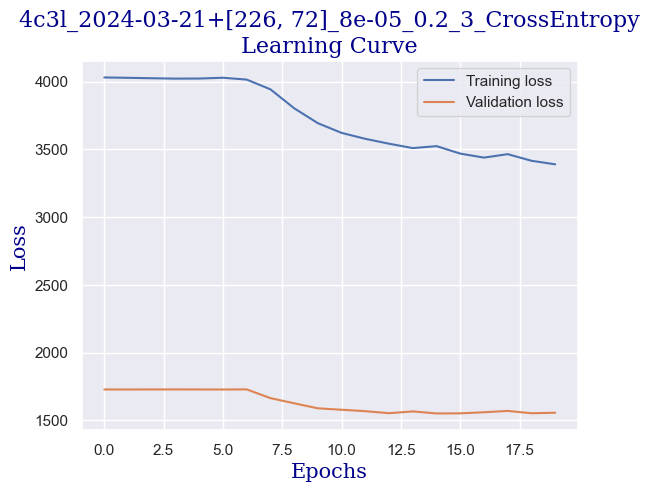

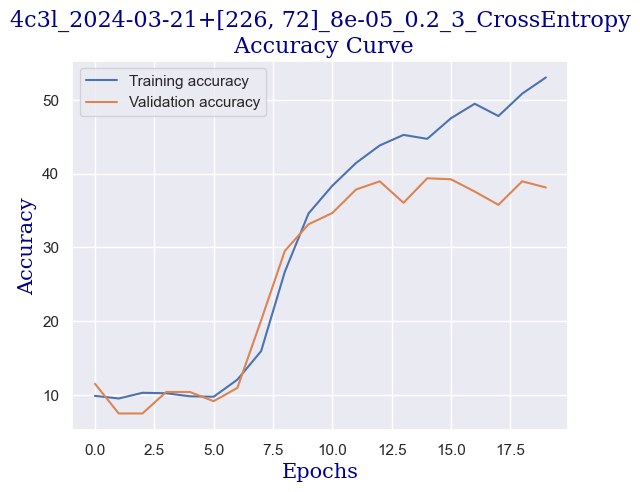

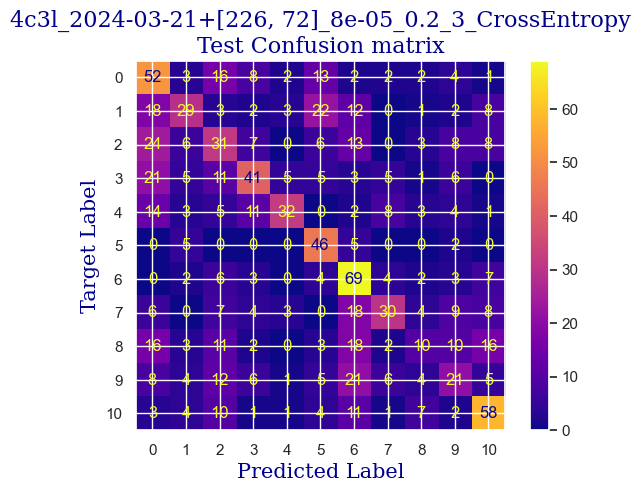

 
 END 4c3l [226, 72] Run Time:  3931.112607436022
Model:  4c3l  idx: 0 / 1
resolution:  [113, 36]   idx: 2 / 7
learning rate:  0.0001   idx: 0 / 4
weight decay:  0   idx: 0 / 1
scheduler:  0   idx: 0 / 3
seed:  8   idx:  0 / 3
loss function:  CrossEntropy  idx: 0 / 1
333398.886698108
333386.476186745
Total epochs: 20


  0%|                                                                                                                        | 0/20 [00:00<?, ?it/s]
Traceback (most recent call last):
  File "/tmp/ipykernel_193357/663479992.py", line 84, in _go
    model, save_dict=  train_val(model, x_train, x_val, y_train, y_val, resolution, pad, save_dict, lr, loss_fn,epochs, optimizer, scheduler_value,
  File "/tmp/ipykernel_193357/512813655.py", line 32, in train_val
    t_loss, train_prediction, t_correct, model, optimizer = loop(model=model, X=x_train, Y=y_train, loss_fn=loss_fn, device=device,
  File "/its/home/nn268/antvis/antvis/optics/loop_fns.py", line 61, in loop
    prediction = model.forward(tense)
  File "/its/home/nn268/antvis/antvis/optics/architectures.py", line 182, in forward
    x = self.linear_1(x)
  File "/its/home/nn268/.local/lib/python3.10/site-packages/torch/nn/modules/module.py", line 1518, in _wrapped_call_impl
    return self._call_impl(*args, **kwargs)
  File "/its/home/

Training...


Epochs,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
t_loss,▂▅▁▆▅▄████▄██▃▅▂▃███▁▅▅▆▆█▄██▅█▄▇▃▆▃▄▅█▃
test_acc,▆▆▇▆▅▆▁▁▆▁▇▁▆▆▆▆▇▆▄▅▇▇▅▁▅▆▆▁█▆▇▆▄▇▁▆▆▅▁▇
train_acc,▇▄█▃▄▅▁▁▁▁▅▁▁▆▄▇▆▁▁▁█▄▄▃▄▁▅▁▁▄▁▆▂▆▄▆▅▄▁▆
v_loss,▃▅▁▆▅▅████▃██▄▅▂▃███▂▄▆▃▅█▃██▃█▃▆▁▅▃▃▄█▃
val_acc,▆▅█▃▄▅▁▁▁▁▆▁▁▆▄▇▇▁▁▁▇▆▄▆▅▁▆▁▁▆▁▆▃█▄▆▆▅▁▇
Epochs,20
gitHash,3e677ef26b8873c6fc52...
t_loss,3390.02174
test_acc,40.67961
train_acc,53.06365


RuntimeError: mat1 and mat2 shapes cannot be multiplied (1x35840 and 304640x100)

In [10]:
_go(config)